In [1]:
import rdkit
from rdkit import Chem, DataStructs
from rdkit.Chem import PandasTools, AllChem
from molvecgen.vectorizers import SmilesVectorizer

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau

from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('small_molecules_smiles_only_for_deep_learning_sm_10032024.csv')

In [3]:
PandasTools.AddMoleculeColumnToFrame(df, 'canon_smiles', 'Molecule')
df.head()

[20:13:14] WARNING: not removing hydrogen atom without neighbors
[20:13:14] WARNING: not removing hydrogen atom without neighbors


,good,canon_smiles,Molecule
0,0,CC1(C)CCC(c2ccc(Cl)cc2)=C(CN2CCN(c3ccc(C(=O)NS...,<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E...
1,0,CN(C)CC[C@H](CSc1ccccc1)Nc1ccc(S(=O)(=O)NC(=O)...,<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E...
2,0,Cc1ccc(F)c(NC(=O)Nc2ccc(-c3cccc4[nH]nc(N)c34)c...,<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E...
3,0,C[C@@]1(c2nc3c(C(N)=O)cccc3[nH]2)CCCN1,<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E...
4,0,CNC(=O)c1ccccc1Sc1ccc2c(/C=C/c3ccccn3)n[nH]c2c1,<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E...


In [4]:
smivec = SmilesVectorizer(pad=1, leftpad=True, canonical=False, augment=True)
smivec.fit(df.Molecule.values)

In [5]:
print(smivec.charset)
smivec.dims

IRc@=1/l(o2ra74+P6M]HBZ.O[s5FC-NtSKn#3ue)\^$?


(275, 45)

In [6]:
type(df['Molecule'].values)

numpy.ndarray

In [7]:
y = df['good'].values.reshape((-1,1))
X = df.Molecule.values

In [8]:
X

array([<rdkit.Chem.rdchem.Mol object at 0x0000023FE9E4AE30>,
       <rdkit.Chem.rdchem.Mol object at 0x0000023FE9E4AF10>, ...,
       <rdkit.Chem.rdchem.Mol object at 0x0000023FE9EA0200>], dtype=object)

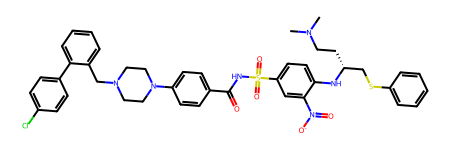

In [9]:
X[1]

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.2, random_state=42)

In [11]:
X_train.shape

(1080,)

In [38]:
# The class wraps the SMILES data and their corresponding labels into a format compatible with PyTorch 'DataLoader'.
# It uses the SMILES vectorizer to convert the SMILES strings into numeric vectors during data retrieval

class SMILESMolDataset(Dataset):
    
    def __init__(self, molecules, y, vectorizer):
        self.molecules = molecules
        self.y = y
        self.vectorizer = vectorizer
    
    def __len__(self):
        return len(self.molecules)  # It returns the total number of samples
    def __getitem__(self, idx):  # It retrieves a SMILES string at index 'idx', transforms it into a vector, and pairs it with its label.
        if torch.is_tensor(idx):
            idx = idx.tolist()

        mols = self.molecules[idx]

        # The vectorizer was written to work with batches,
        # but PyTorch datasets unfortunately works with single sample
        sample = self.vectorizer.transform([mols])[0]
        label = self.y[idx]
        return sample, label

In [39]:
train_dataset = SMILESMolDataset(X_train, y_train, smivec)

In [14]:
type(train_dataset)

__main__.SMILESMolDataset

In [40]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [41]:
X_val_t = smivec.transform(X_val, canonical=False)
X_val_t

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 1, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 1, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 1, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 1, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 1, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 1, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 1, ..., 

In [17]:
X_val_t[1]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0]], dtype=int8)

In [18]:
X_val_t[1][-1]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0], dtype=int8)

In [19]:
# One-hot encoding?
len(X_val_t[1][-1])

45

In [20]:
# The length is adjusted to 275 for each molecule
len(X_val_t[1])

275

In [21]:
# There are total 270 molecules in X_val data set
len(X_val_t)

270

In [22]:
X_val_t.shape

(270, 275, 45)

In [42]:
X_val_t = torch.tensor(X_val_t, device=device).float()

In [24]:
X_val_t.shape

torch.Size([270, 275, 45])

In [25]:
# Current values in each molecule are all float numbers
X_val_t[1][-1]

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 1., 0.], device='cuda:0')

In [43]:
y_val_t = torch.tensor(y_val, device=device).float()

In [27]:
y_val_t.shape

torch.Size([270, 1])

In [28]:
y_val_t[1]

tensor([0.], device='cuda:0')

In [44]:
class Net(nn.Module):
    def __init__(self, dimensions, lstm_sizes, hidden_size, dropout_rate, out_size=1):
        super(Net, self).__init__()

        number_tokens = dimensions[1]

        # LSTM layers list
        self.lstms = nn.ModuleList()

        input_size = number_tokens
        for lstm_size in lstm_sizes:
            self.lstms.append(nn.LSTM(input_size=input_size, hidden_size=lstm_size, num_layers=1, batch_first=True))
            input_size = lstm_size

        # Only add dropout if there's more than 1 LSTM layer
        if len(lstm_sizes) > 1:
            self.dropouts = nn.Dropout(dropout_rate)
        else:
            self.dropouts = None  # No dropout needed for a single LSTM layer

        # Define fully connected layers
        self.fc1 = nn.Linear(lstm_sizes[-1], hidden_size)  # Hidden layer
        self.activation = nn.ReLU()  # Activation function for hidden layer
        self.fc_out = nn.Linear(hidden_size, out_size)  # Output layer

    def forward(self, x):
        # Forward pass through LSTM layers
        for lstm in self.lstms:
            x, _ = lstm(x)

        # Apply dropout if there is more than 1 LSTM layer
        if self.dropouts:
            x = self.dropouts(x)

        # Use the last hidden state from the last LSTM layer
        x = x[:, -1, :]

        # Pass through the hidden layer and activation function
        x = self.fc1(x)
        x = self.activation(x)

        # Final output layer
        x = self.fc_out(x)

        return x

In [45]:
epochs = 50  # I can implement early stopping to halt training when the validation loss stops improving.
dims = smivec.dims  # This is necessary to define the input dimensions. Ensure 'smivec.dims' returns the correct shape: '[sequence_length, number_tokens]'.
lstm_size = [128, 64, 32]  # The size of the LSTM hidden state. I may experiment with larger size (e.g., 256 or 512) if necessary.
hidden_size = 256  # This number is a typical one. I'll adjust it based on the model's performance
dropout_rate = 0.3  # A dropout rate of 0.5 is standard for preventing overfitting. I may reduce it to 0.3 if underfitting occurs.
output_size = 1  # This is for binary classification, as the output is a single probability value.
batch_size = 32  # A batch size of 128 is commonly used and generally effective. Depending on GPU memory, I may try different sizes (e.g., 64 or 256).
learning_rate = 0.001  # If the training is unstable, I'll lower it to 0.001.

In [46]:
model = Net(dims, lstm_size, hidden_size, dropout_rate, output_size).to(device)

In [47]:
model

Net(
  (lstms): ModuleList(
    (0): LSTM(45, 128, batch_first=True)
    (1): LSTM(128, 64, batch_first=True)
    (2): LSTM(64, 32, batch_first=True)
  )
  (dropouts): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=32, out_features=256, bias=True)
  (activation): ReLU()
  (fc_out): Linear(in_features=256, out_features=1, bias=True)
)

In [48]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# Define learning rate scheduler without 'verbose' parameter
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

In [49]:
# A Pytorch 'DataLoader' is created for the training set to facilitate batch processing.

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

In [36]:
import itertools
from torch.utils.data import DataLoader

import time
start_time = time.time()

# Define the grid of hyperparameters
param_grid = {
    'hidden_size': [64, 128, 256],
    'lstm_size': [[128, 64, 32], [256, 128, 64], [256, 128, 64, 32], [512, 256, 128], [512, 256, 128, 64]],
    'dropout_rate': [0.3, 0.5, 0.7],
    'learning_rate': [0.0001, 0.001, 0.01],
    'batch_size': [8, 16, 32, 64]
}

# Generate all possible combinations of hyperparameters
param_combinations = list(itertools.product(*param_grid.values()))

# Create a function to train the model with the given hyperparameters
def train_model_with_params(params, X_train, y_train, X_val_t, y_val_t):
    hidden_size, lstm_size, dropout_rate, learning_rate, batch_size = params
    
    # Create dataset and dataloader
    train_dataset = SMILESMolDataset(X_train, y_train, smivec)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    model = Net(smivec.dims, lstm_size, hidden_size=hidden_size, dropout_rate=dropout_rate, out_size=1).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    best_val_loss = float('inf')
    early_stopping_patience = 5
    epochs_without_improvement = 0
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        
        for smiles, labels in train_loader:
            smiles = smiles.clone().detach().float().to(device)
            labels = labels.clone().detach().float().to(device)
            
            optimizer.zero_grad()
            output = model(smiles)
            loss = criterion(output, labels)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
            optimizer.step()
            
            running_loss += loss.item()
        
        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_t)
            val_loss = criterion(val_outputs, y_val_t).item()

        lr_scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1
        
        if epochs_without_improvement >= early_stopping_patience:
            break
    
    return best_val_loss

# Perform grid search
best_params = None
best_val_loss = float('inf')

for params in param_combinations:
    print(f"Training with params: {params}")
    val_loss = train_model_with_params(params, X_train, y_train, X_val_t, y_val_t)
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_params = params
        print(f"New best params found: {params}, Validation Loss: {val_loss}")

print(f"Best hyperparameters: {best_params}, Best validation loss: {best_val_loss}")

total_time = time.time() - start_time
print(f'Total training time: {total_time/60:.2f} mins')

Training with params: (64, [128, 64, 32], 0.3, 0.0001, 8)
New best params found: (64, [128, 64, 32], 0.3, 0.0001, 8), Validation Loss: 0.09225485473871231
Training with params: (64, [128, 64, 32], 0.3, 0.0001, 16)
Training with params: (64, [128, 64, 32], 0.3, 0.0001, 32)
Training with params: (64, [128, 64, 32], 0.3, 0.0001, 64)
Training with params: (64, [128, 64, 32], 0.3, 0.001, 8)
New best params found: (64, [128, 64, 32], 0.3, 0.001, 8), Validation Loss: 0.09222652018070221
Training with params: (64, [128, 64, 32], 0.3, 0.001, 16)
New best params found: (64, [128, 64, 32], 0.3, 0.001, 16), Validation Loss: 0.09221667051315308
Training with params: (64, [128, 64, 32], 0.3, 0.001, 32)
Training with params: (64, [128, 64, 32], 0.3, 0.001, 64)
Training with params: (64, [128, 64, 32], 0.3, 0.01, 8)
Training with params: (64, [128, 64, 32], 0.3, 0.01, 16)
New best params found: (64, [128, 64, 32], 0.3, 0.01, 16), Validation Loss: 0.09221614897251129
Training with params: (64, [128, 64

Training with params: (64, [512, 256, 128], 0.5, 0.01, 32)
Training with params: (64, [512, 256, 128], 0.5, 0.01, 64)
Training with params: (64, [512, 256, 128], 0.7, 0.0001, 8)
Training with params: (64, [512, 256, 128], 0.7, 0.0001, 16)
Training with params: (64, [512, 256, 128], 0.7, 0.0001, 32)
Training with params: (64, [512, 256, 128], 0.7, 0.0001, 64)
Training with params: (64, [512, 256, 128], 0.7, 0.001, 8)
Training with params: (64, [512, 256, 128], 0.7, 0.001, 16)
Training with params: (64, [512, 256, 128], 0.7, 0.001, 32)
Training with params: (64, [512, 256, 128], 0.7, 0.001, 64)
Training with params: (64, [512, 256, 128], 0.7, 0.01, 8)
Training with params: (64, [512, 256, 128], 0.7, 0.01, 16)
Training with params: (64, [512, 256, 128], 0.7, 0.01, 32)
Training with params: (64, [512, 256, 128], 0.7, 0.01, 64)
Training with params: (64, [512, 256, 128, 64], 0.3, 0.0001, 8)
Training with params: (64, [512, 256, 128, 64], 0.3, 0.0001, 16)
Training with params: (64, [512, 256

Training with params: (128, [256, 128, 64, 32], 0.5, 0.0001, 16)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.0001, 32)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.0001, 64)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.001, 8)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.001, 16)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.001, 32)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.001, 64)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.01, 8)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.01, 16)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.01, 32)
Training with params: (128, [256, 128, 64, 32], 0.5, 0.01, 64)
Training with params: (128, [256, 128, 64, 32], 0.7, 0.0001, 8)
Training with params: (128, [256, 128, 64, 32], 0.7, 0.0001, 16)
Training with params: (128, [256, 128, 64, 32], 0.7, 0.0001, 32)
Training with params: (128, [256, 128, 64, 32], 0.7, 0.0001, 64)
Training with params: (128, [256, 128, 6

Training with params: (256, [256, 128, 64], 0.3, 0.0001, 32)
Training with params: (256, [256, 128, 64], 0.3, 0.0001, 64)
Training with params: (256, [256, 128, 64], 0.3, 0.001, 8)
Training with params: (256, [256, 128, 64], 0.3, 0.001, 16)
Training with params: (256, [256, 128, 64], 0.3, 0.001, 32)
Training with params: (256, [256, 128, 64], 0.3, 0.001, 64)
Training with params: (256, [256, 128, 64], 0.3, 0.01, 8)
Training with params: (256, [256, 128, 64], 0.3, 0.01, 16)
Training with params: (256, [256, 128, 64], 0.3, 0.01, 32)
Training with params: (256, [256, 128, 64], 0.3, 0.01, 64)
Training with params: (256, [256, 128, 64], 0.5, 0.0001, 8)
Training with params: (256, [256, 128, 64], 0.5, 0.0001, 16)
Training with params: (256, [256, 128, 64], 0.5, 0.0001, 32)
Training with params: (256, [256, 128, 64], 0.5, 0.0001, 64)
Training with params: (256, [256, 128, 64], 0.5, 0.001, 8)
Training with params: (256, [256, 128, 64], 0.5, 0.001, 16)
Training with params: (256, [256, 128, 64]

Training with params: (256, [512, 256, 128, 64], 0.7, 0.0001, 32)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.0001, 64)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.001, 8)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.001, 16)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.001, 32)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.001, 64)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.01, 8)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.01, 16)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.01, 32)
Training with params: (256, [512, 256, 128, 64], 0.7, 0.01, 64)
Best hyperparameters: (64, [128, 64, 32], 0.7, 0.0001, 8), Best validation loss: 0.0922158733010292
Total training time: 145.40 mins


Training with params: (32, [32, 16], 0.3, 5e-05, 4)


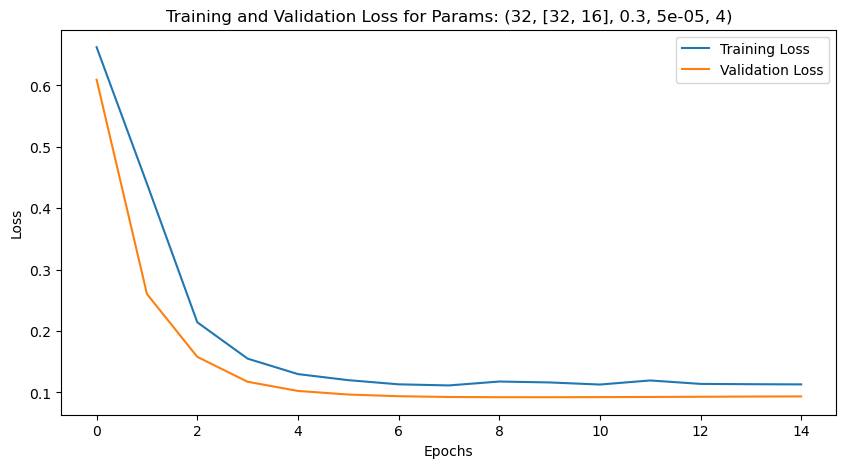

New best params found: (32, [32, 16], 0.3, 5e-05, 4), Validation Loss: 0.09224523603916168
Training with params: (32, [32, 16], 0.3, 5e-05, 8)


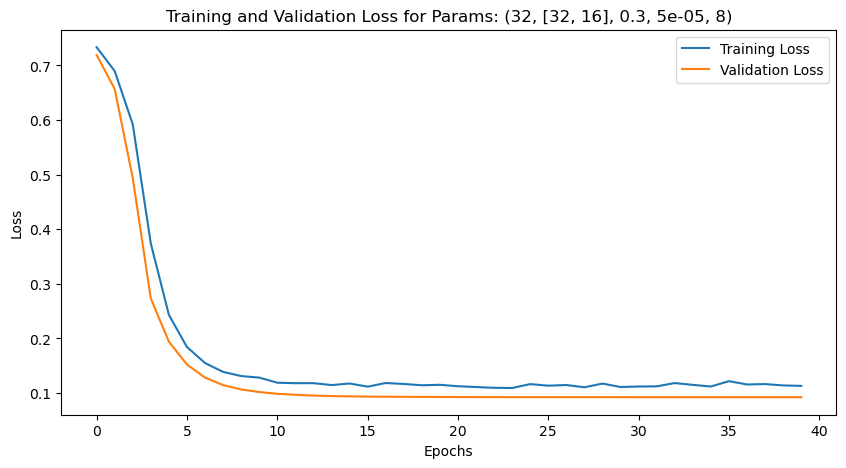

Training with params: (32, [32, 16], 0.3, 5e-05, 12)


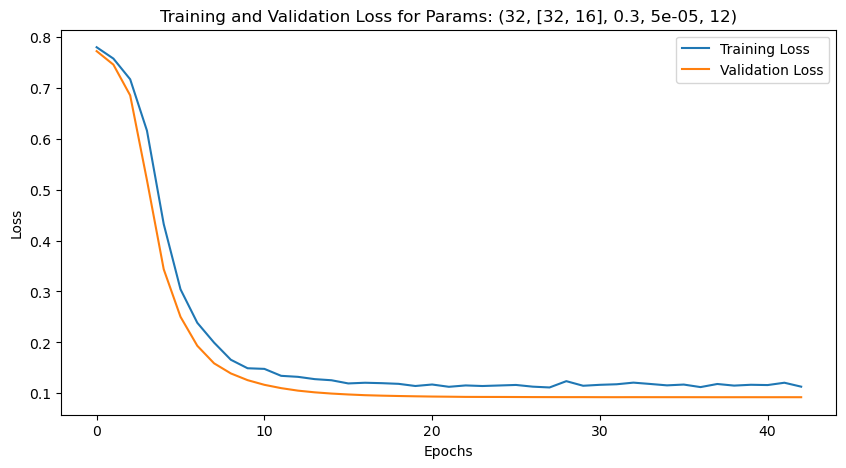

Training with params: (32, [32, 16], 0.3, 0.0001, 4)


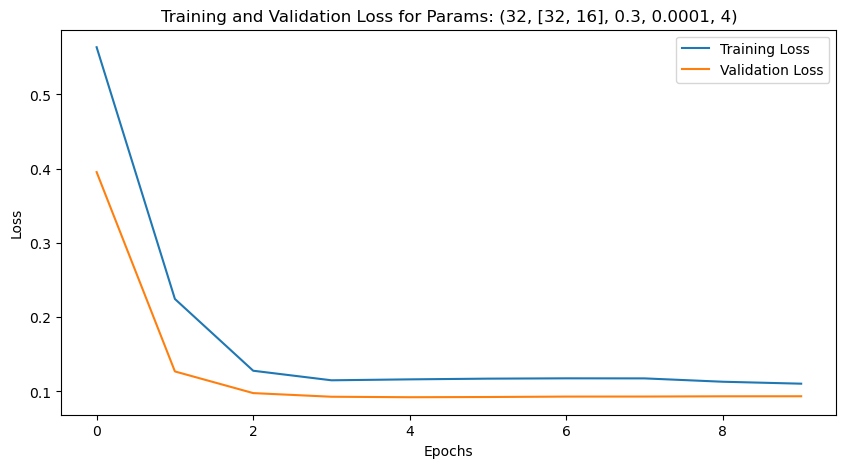

New best params found: (32, [32, 16], 0.3, 0.0001, 4), Validation Loss: 0.09222568571567535
Training with params: (32, [32, 16], 0.3, 0.0001, 8)


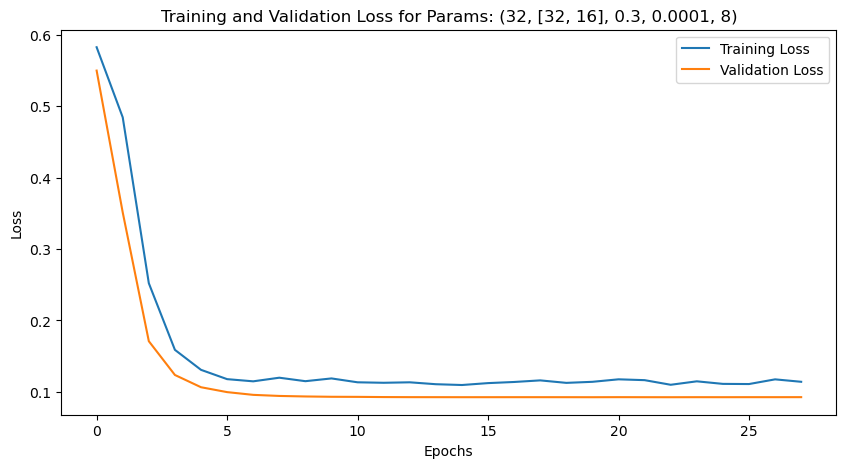

Training with params: (32, [32, 16], 0.3, 0.0001, 12)


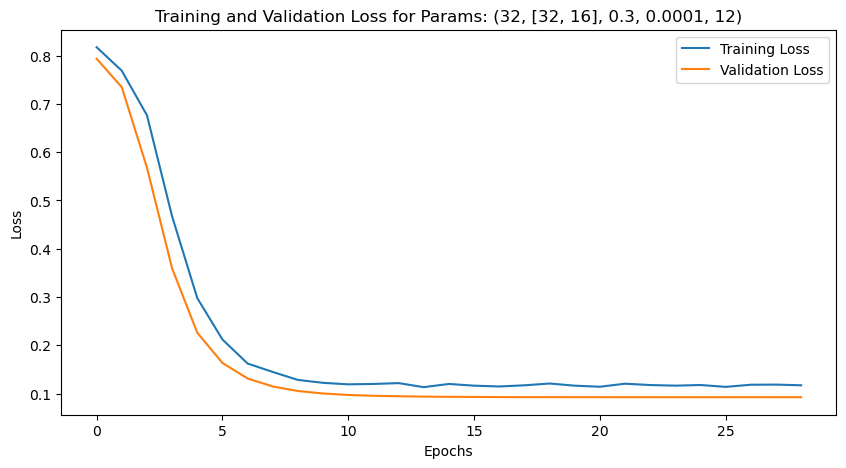

Training with params: (32, [32, 16], 0.3, 0.0005, 4)


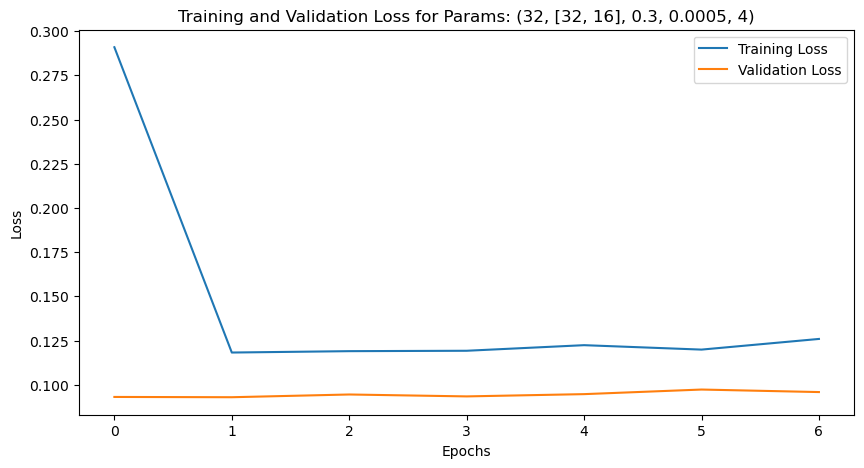

Training with params: (32, [32, 16], 0.3, 0.0005, 8)


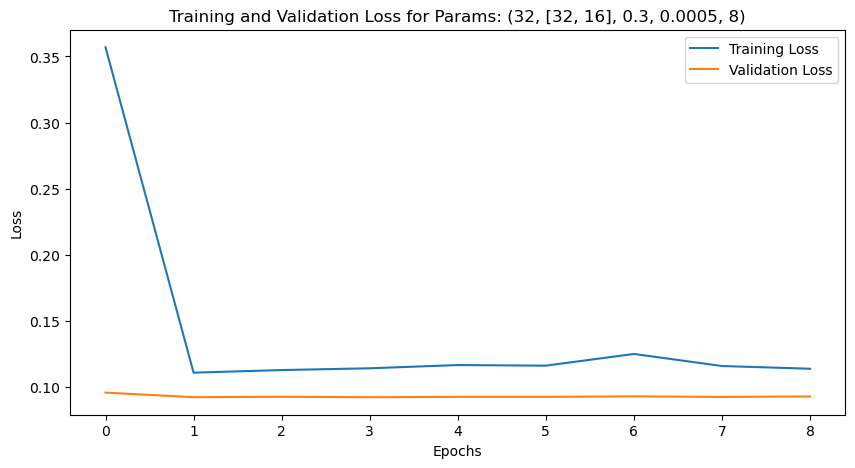

Training with params: (32, [32, 16], 0.3, 0.0005, 12)


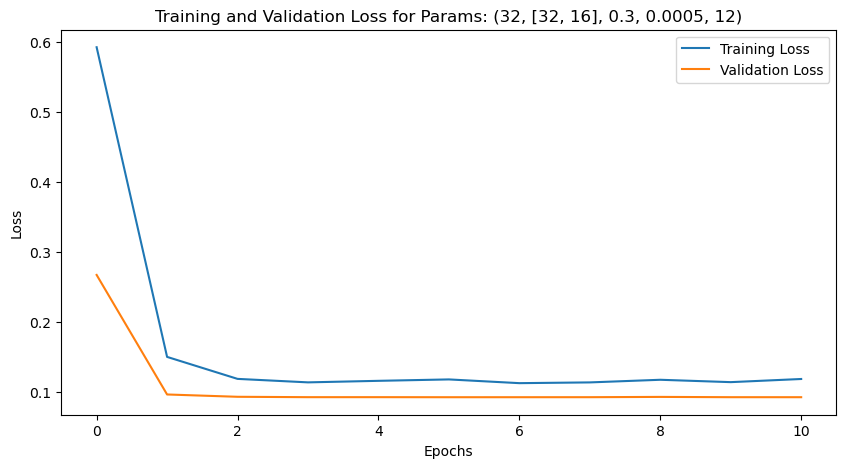

Training with params: (32, [32, 16], 0.5, 5e-05, 4)


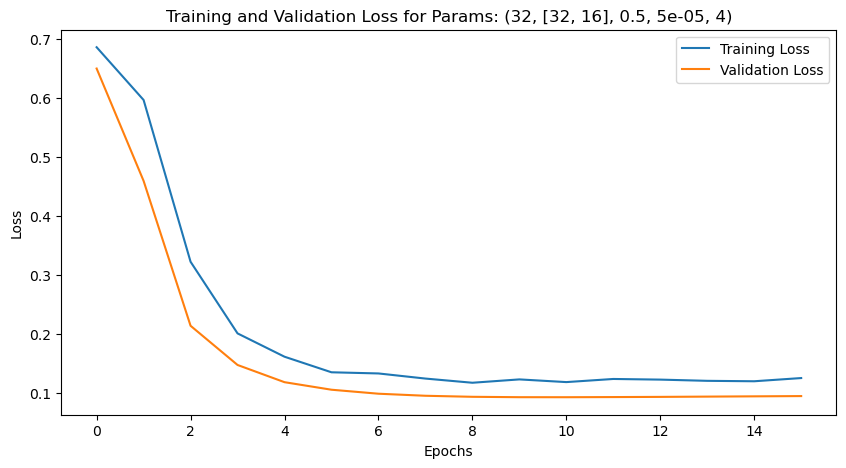

Training with params: (32, [32, 16], 0.5, 5e-05, 8)


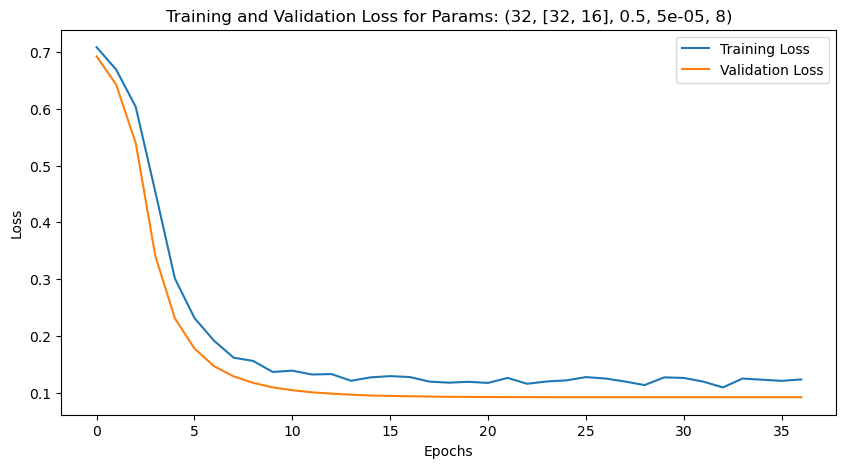

New best params found: (32, [32, 16], 0.5, 5e-05, 8), Validation Loss: 0.09221712499856949
Training with params: (32, [32, 16], 0.5, 5e-05, 12)


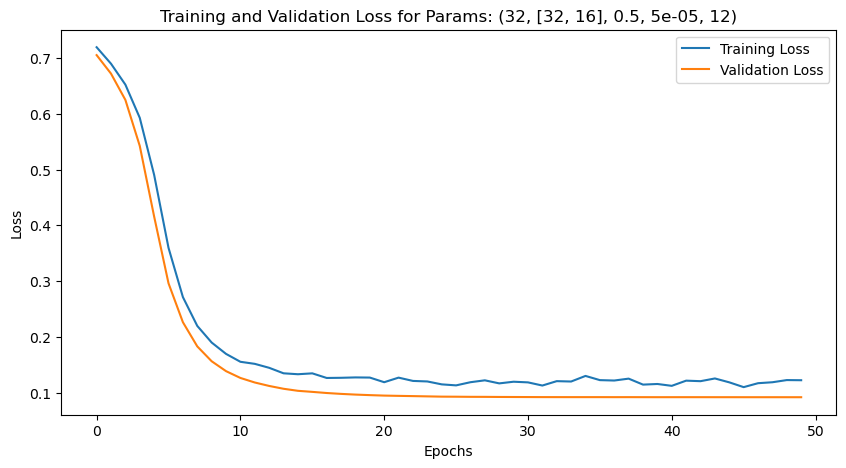

Training with params: (32, [32, 16], 0.5, 0.0001, 4)


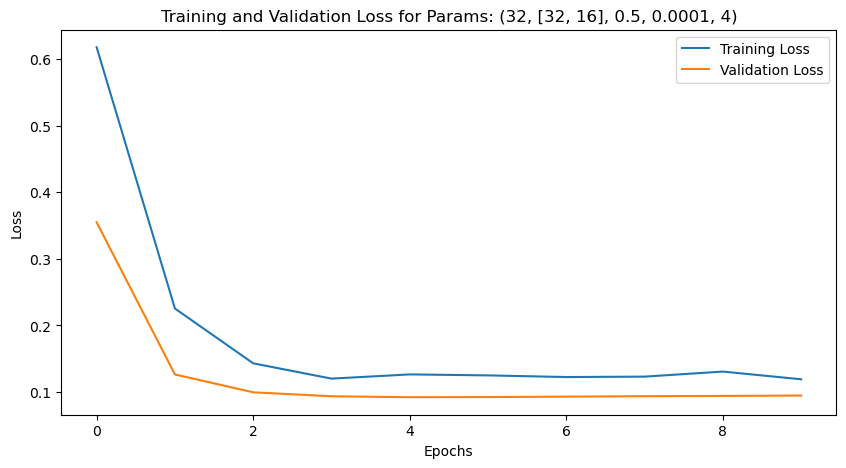

Training with params: (32, [32, 16], 0.5, 0.0001, 8)


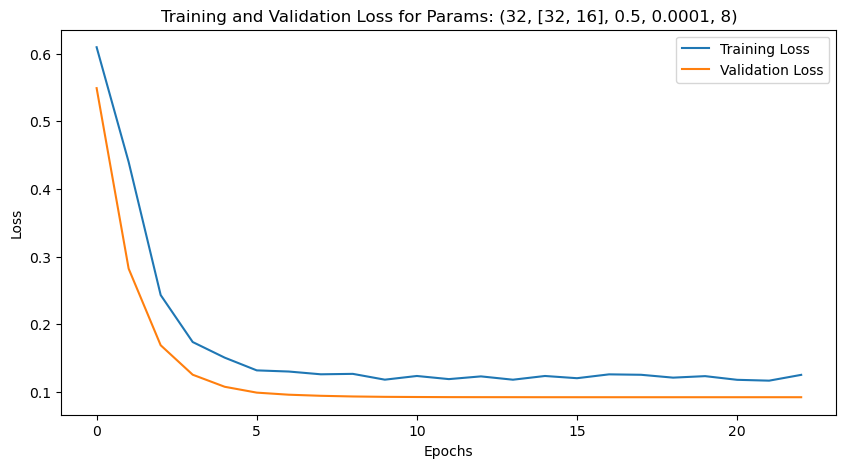

New best params found: (32, [32, 16], 0.5, 0.0001, 8), Validation Loss: 0.09221694618463516
Training with params: (32, [32, 16], 0.5, 0.0001, 12)


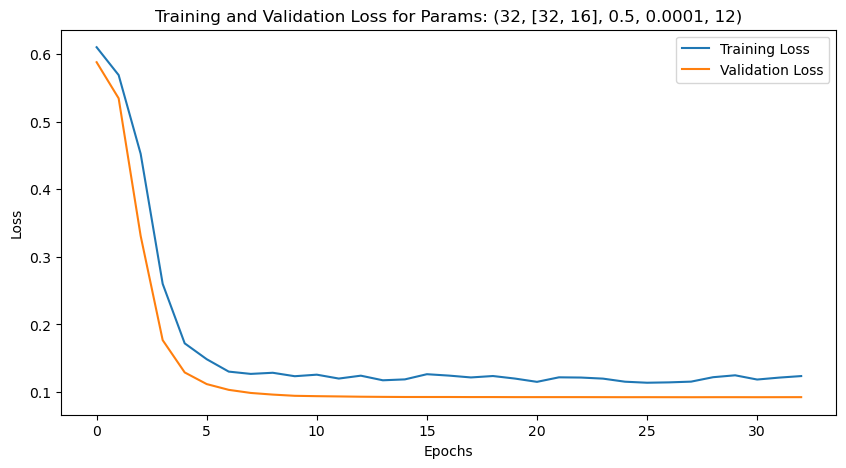

Training with params: (32, [32, 16], 0.5, 0.0005, 4)


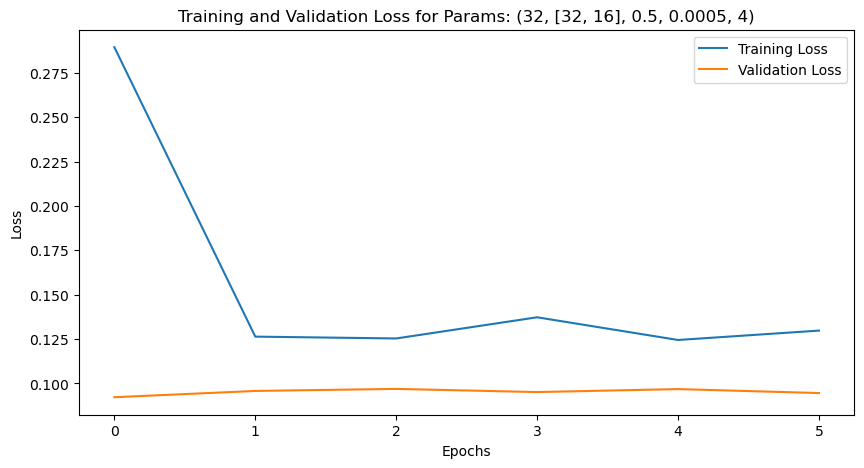

Training with params: (32, [32, 16], 0.5, 0.0005, 8)


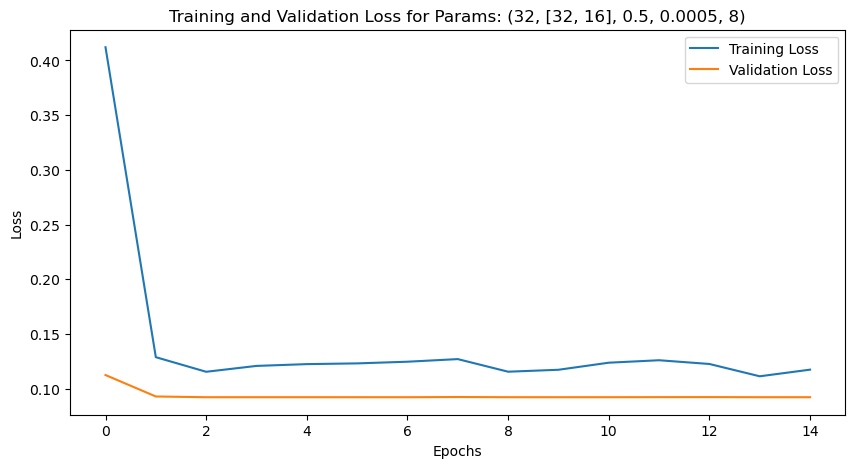

New best params found: (32, [32, 16], 0.5, 0.0005, 8), Validation Loss: 0.09221519529819489
Training with params: (32, [32, 16], 0.5, 0.0005, 12)


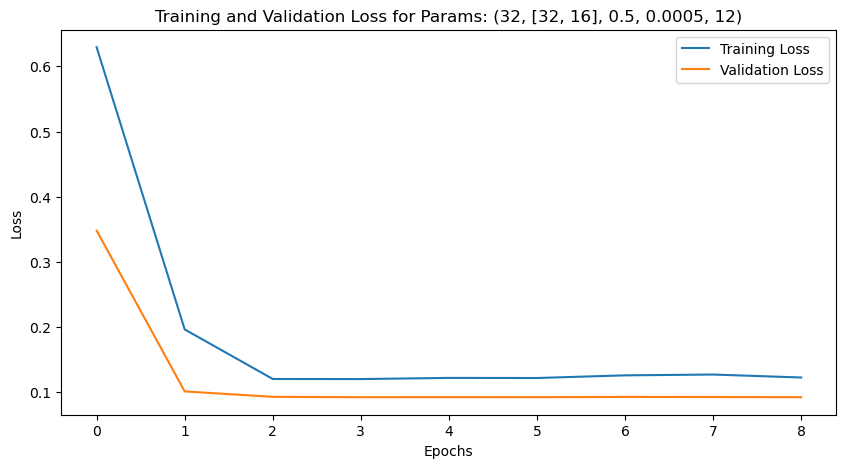

Training with params: (32, [32, 16], 0.7, 5e-05, 4)


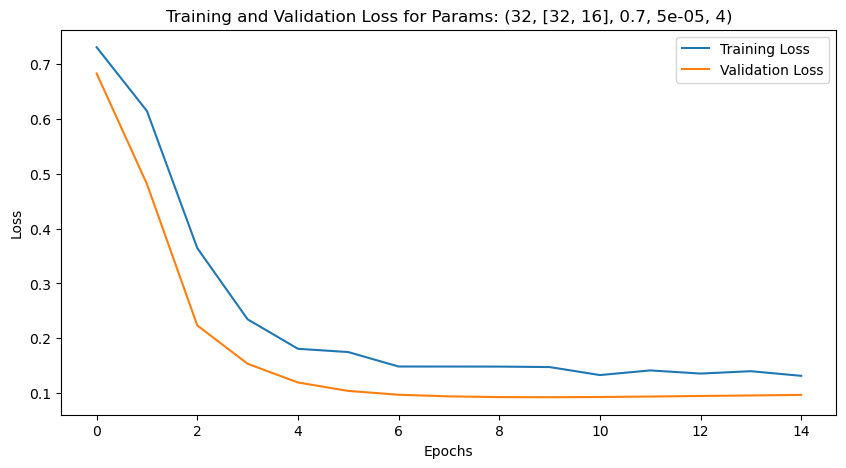

Training with params: (32, [32, 16], 0.7, 5e-05, 8)


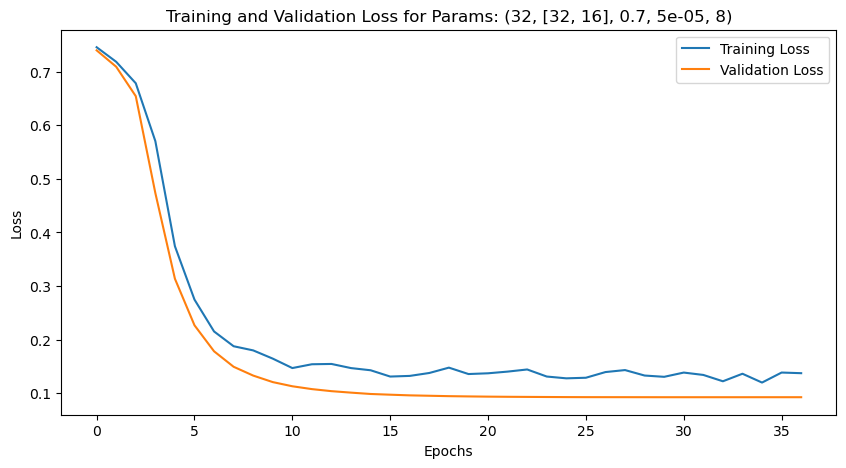

Training with params: (32, [32, 16], 0.7, 5e-05, 12)


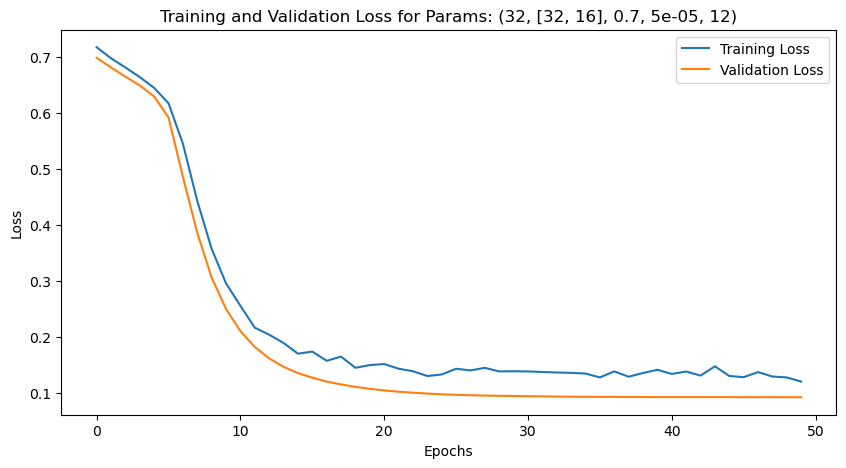

Training with params: (32, [32, 16], 0.7, 0.0001, 4)


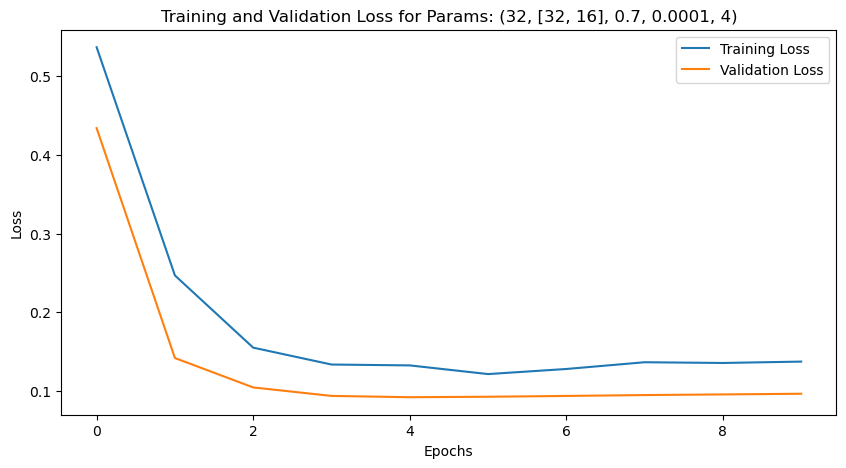

New best params found: (32, [32, 16], 0.7, 0.0001, 4), Validation Loss: 0.09221439808607101
Training with params: (32, [32, 16], 0.7, 0.0001, 8)


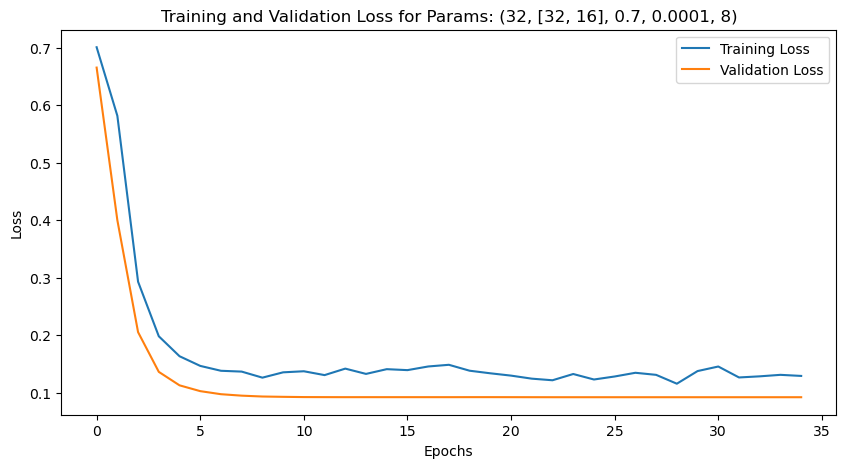

Training with params: (32, [32, 16], 0.7, 0.0001, 12)


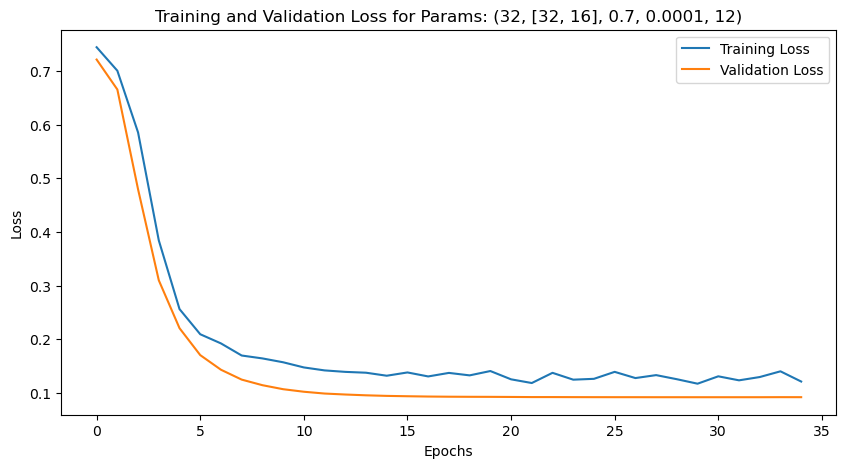

Training with params: (32, [32, 16], 0.7, 0.0005, 4)


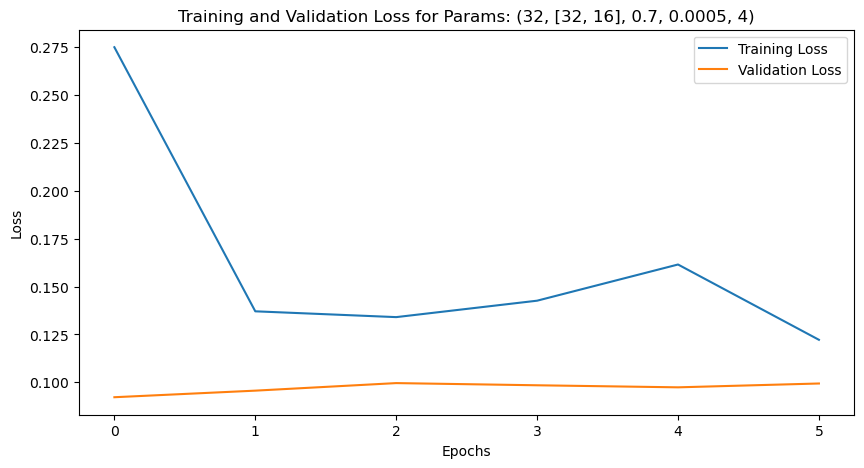

Training with params: (32, [32, 16], 0.7, 0.0005, 8)


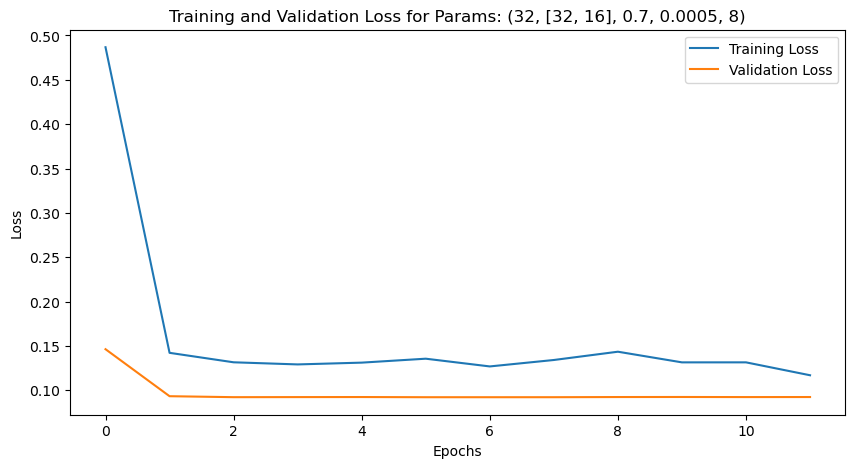

Training with params: (32, [32, 16], 0.7, 0.0005, 12)


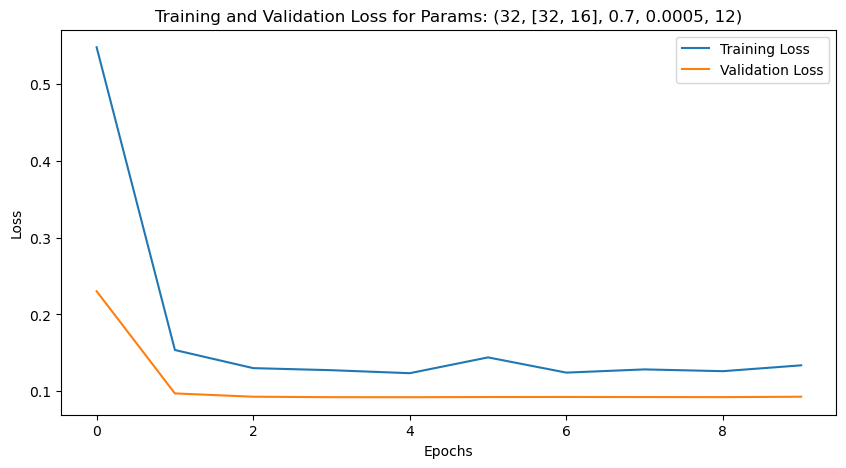

Training with params: (32, [64, 32], 0.3, 5e-05, 4)


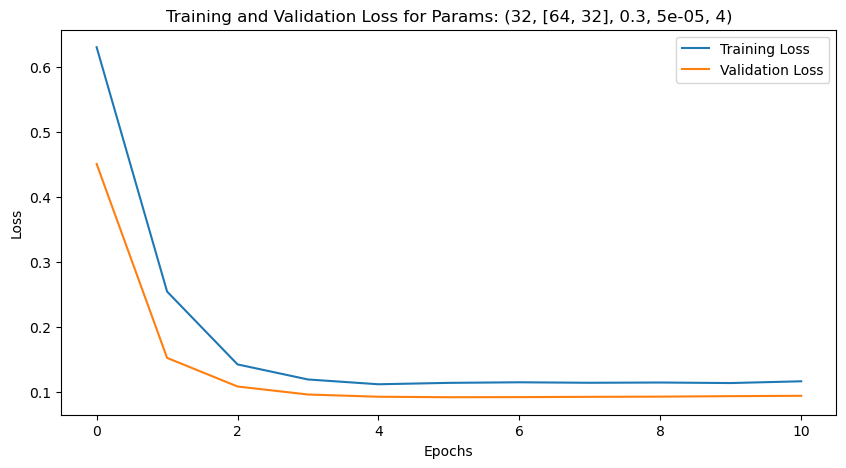

Training with params: (32, [64, 32], 0.3, 5e-05, 8)


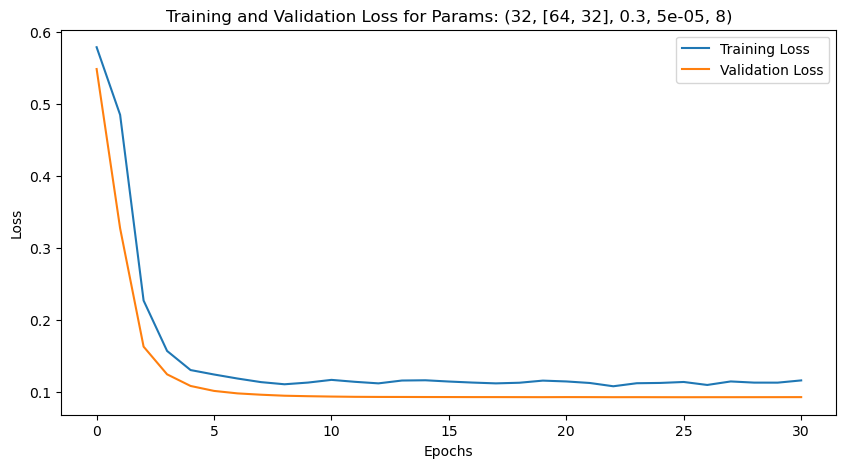

Training with params: (32, [64, 32], 0.3, 5e-05, 12)


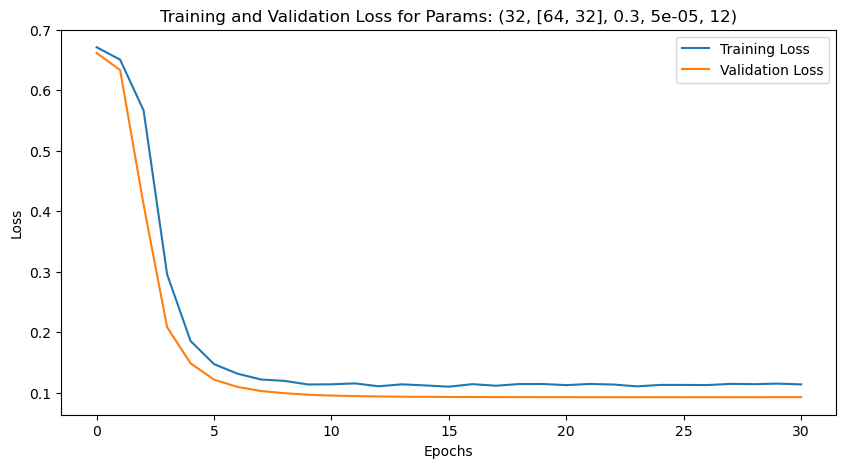

Training with params: (32, [64, 32], 0.3, 0.0001, 4)


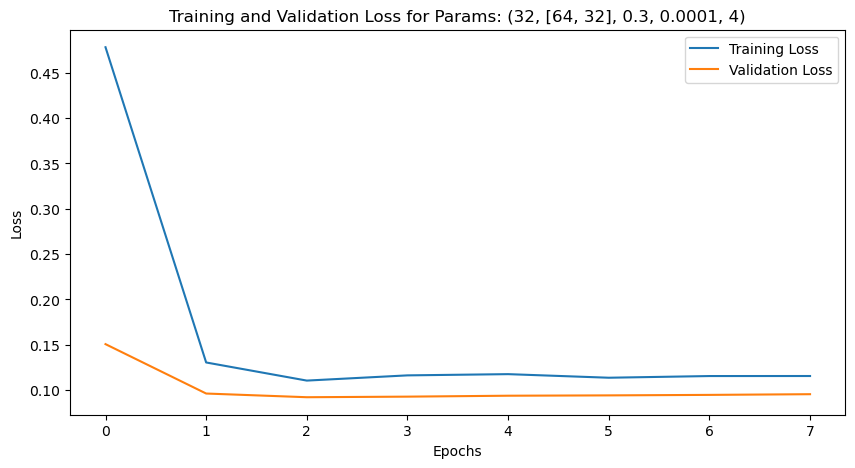

Training with params: (32, [64, 32], 0.3, 0.0001, 8)


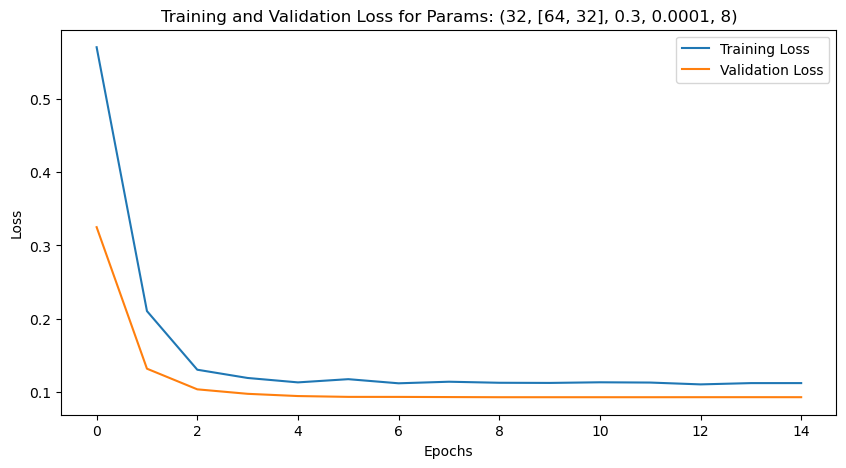

Training with params: (32, [64, 32], 0.3, 0.0001, 12)


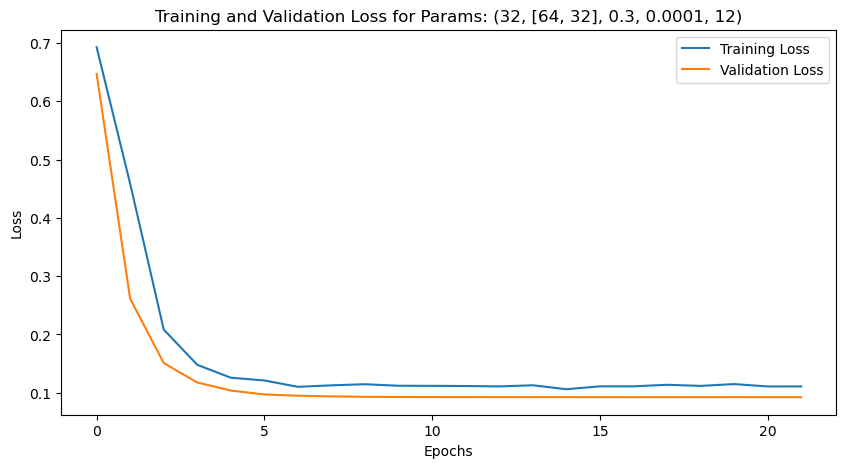

Training with params: (32, [64, 32], 0.3, 0.0005, 4)


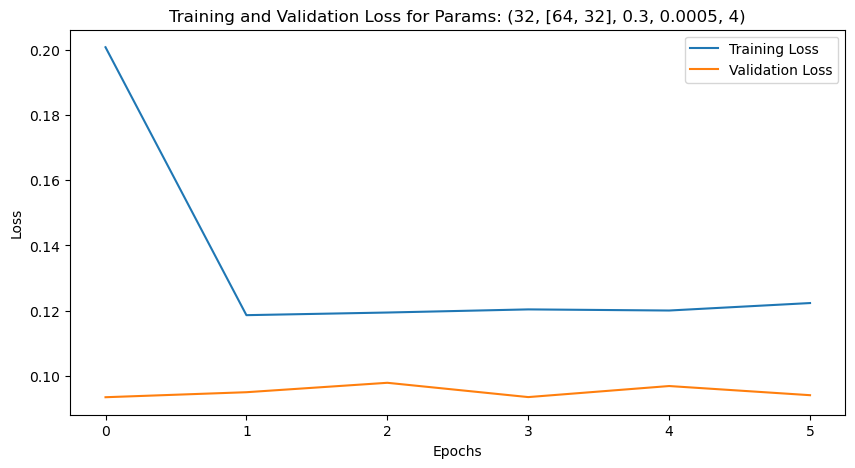

Training with params: (32, [64, 32], 0.3, 0.0005, 8)


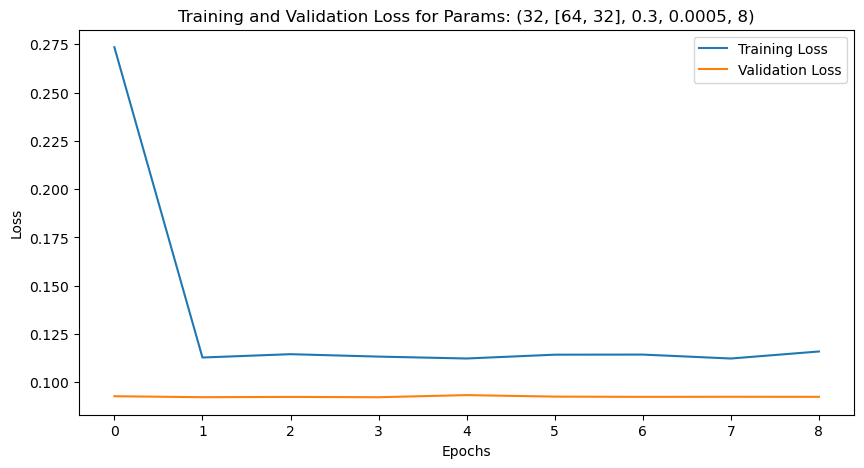

Training with params: (32, [64, 32], 0.3, 0.0005, 12)


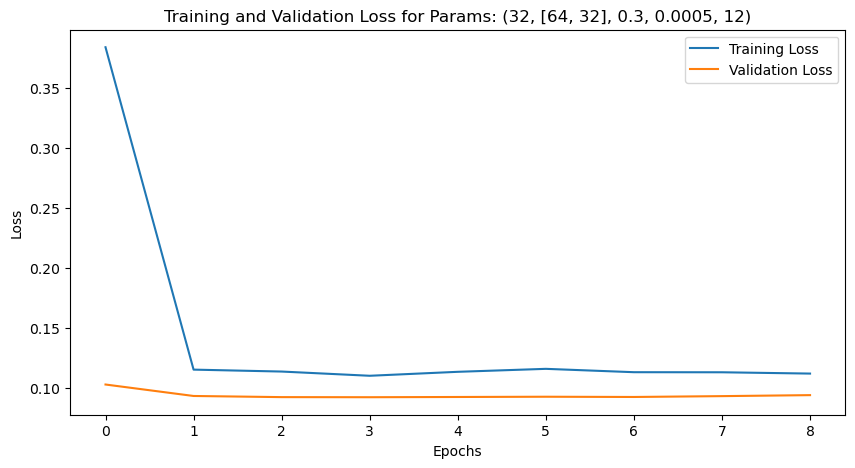

Training with params: (32, [64, 32], 0.5, 5e-05, 4)


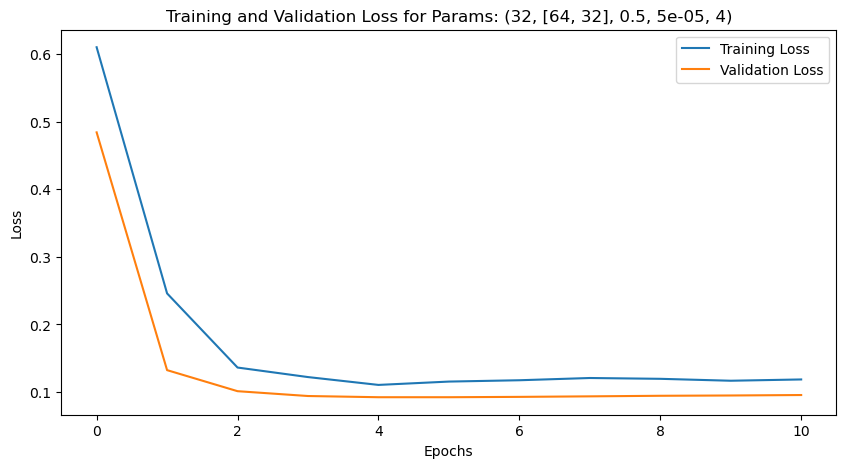

Training with params: (32, [64, 32], 0.5, 5e-05, 8)


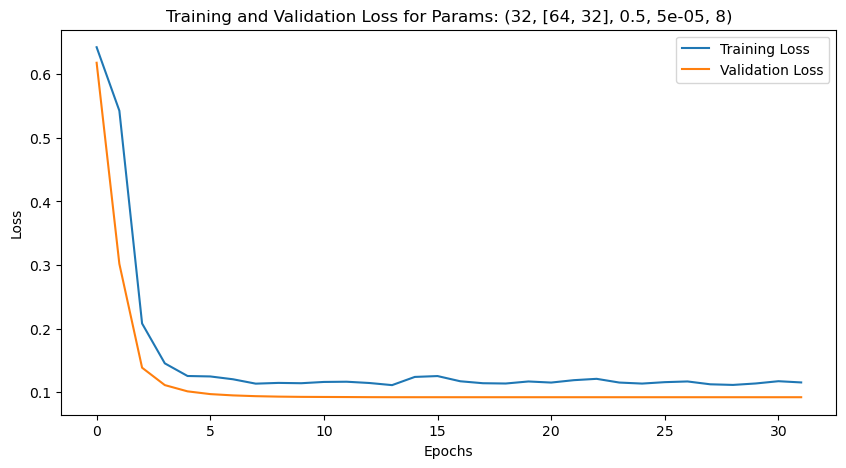

Training with params: (32, [64, 32], 0.5, 5e-05, 12)


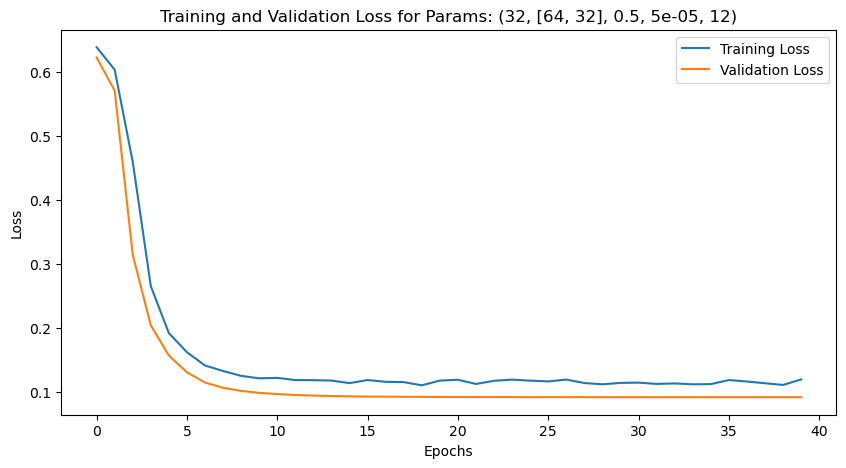

Training with params: (32, [64, 32], 0.5, 0.0001, 4)


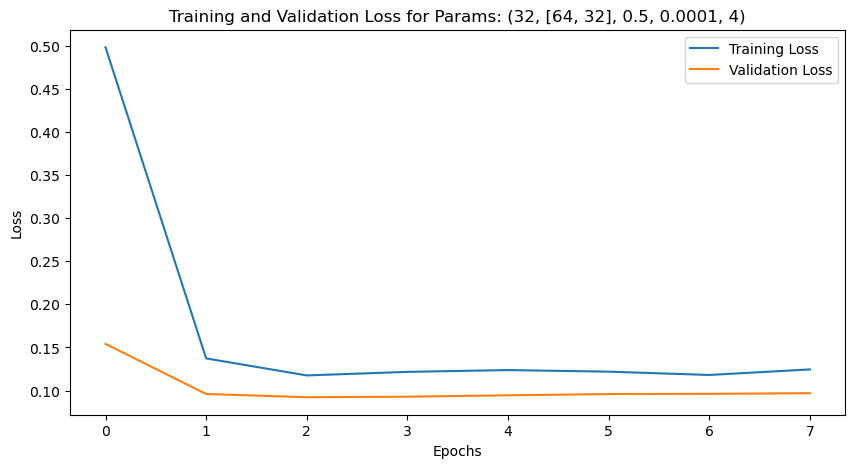

Training with params: (32, [64, 32], 0.5, 0.0001, 8)


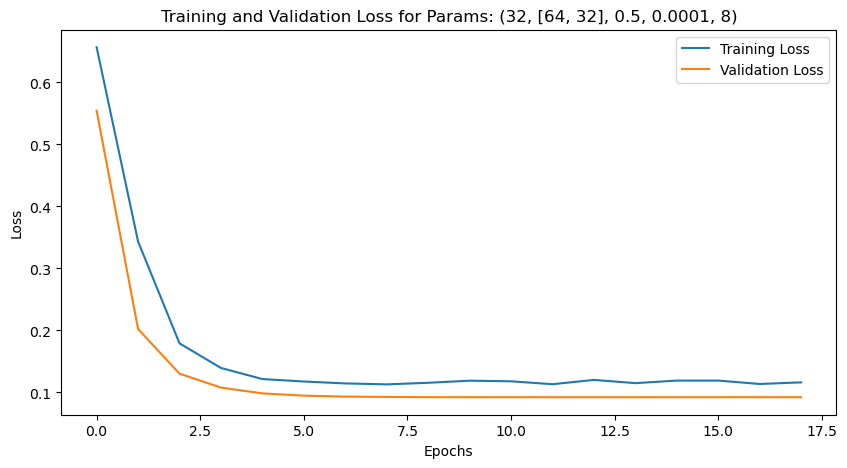

Training with params: (32, [64, 32], 0.5, 0.0001, 12)


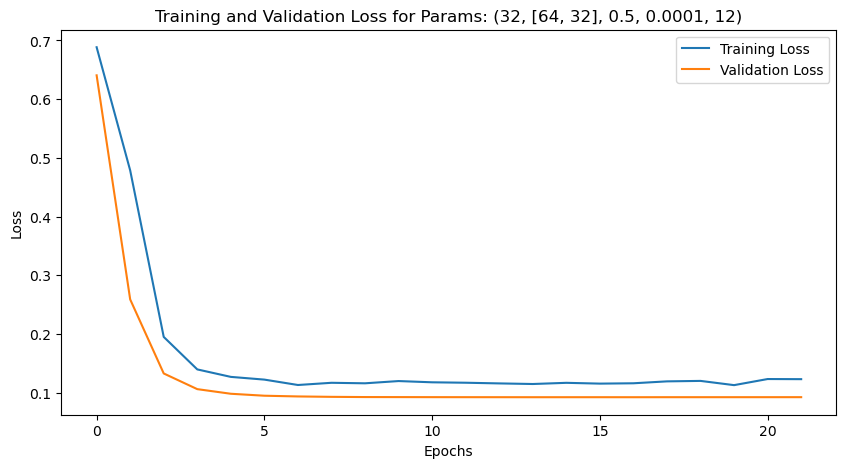

Training with params: (32, [64, 32], 0.5, 0.0005, 4)


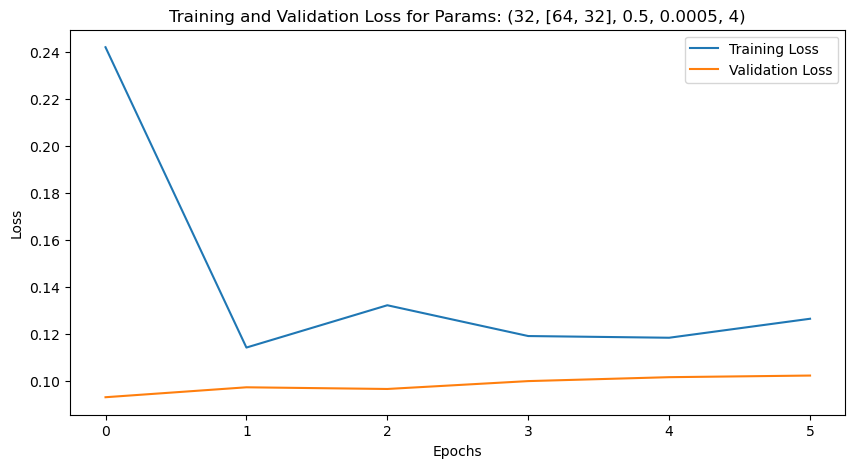

Training with params: (32, [64, 32], 0.5, 0.0005, 8)


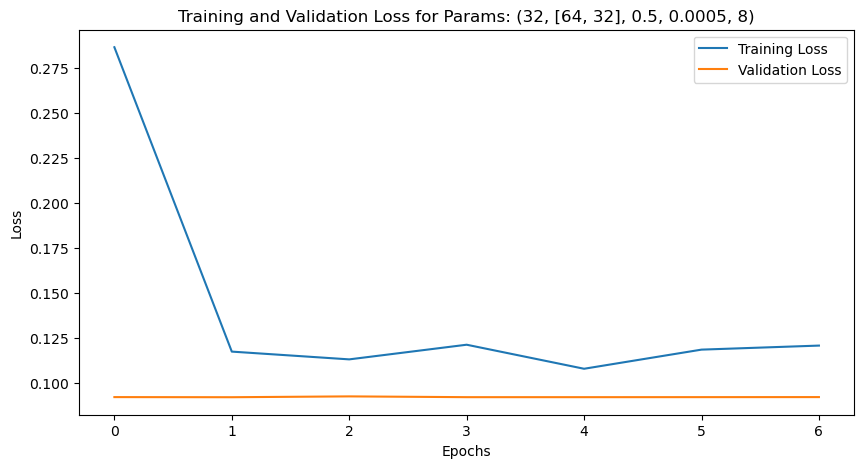

Training with params: (32, [64, 32], 0.5, 0.0005, 12)


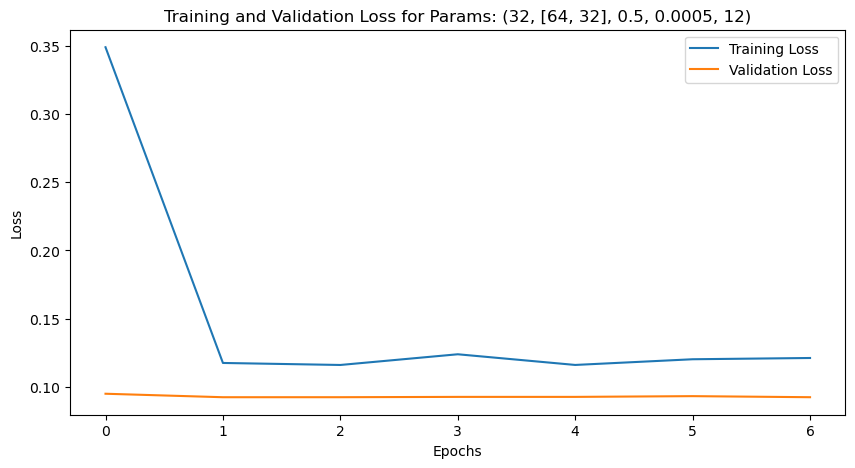

Training with params: (32, [64, 32], 0.7, 5e-05, 4)


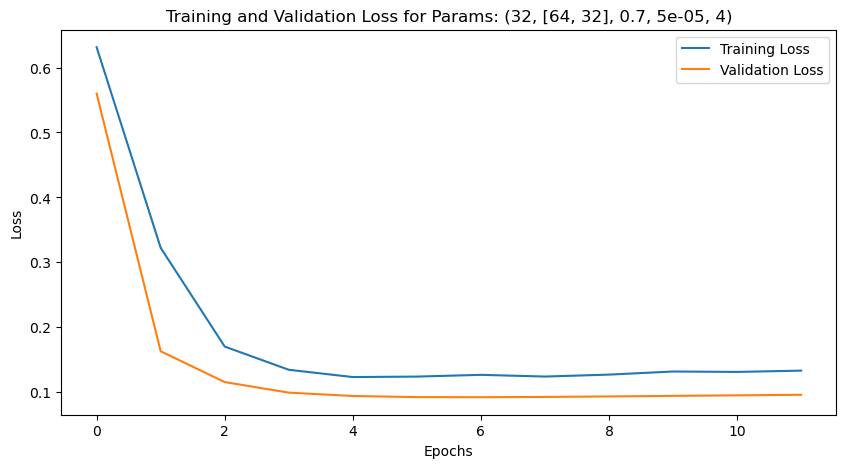

Training with params: (32, [64, 32], 0.7, 5e-05, 8)


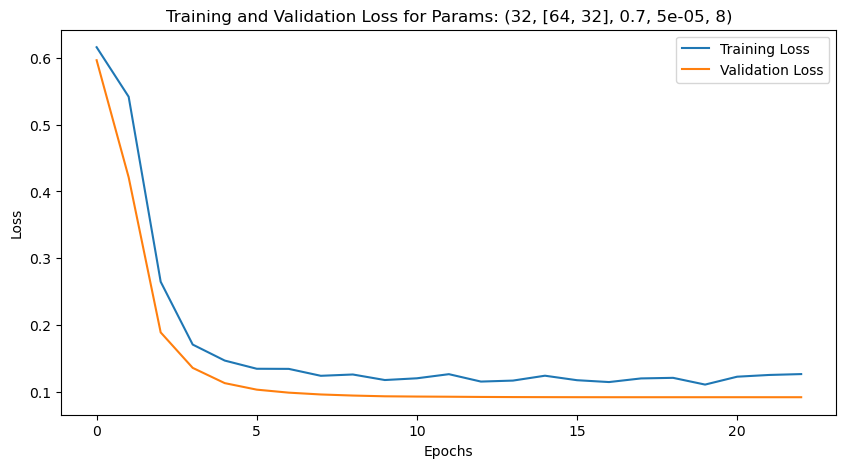

Training with params: (32, [64, 32], 0.7, 5e-05, 12)


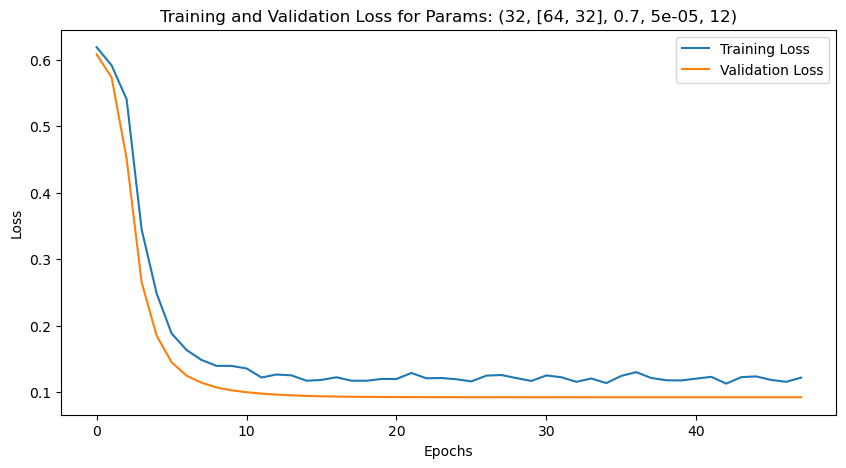

Training with params: (32, [64, 32], 0.7, 0.0001, 4)


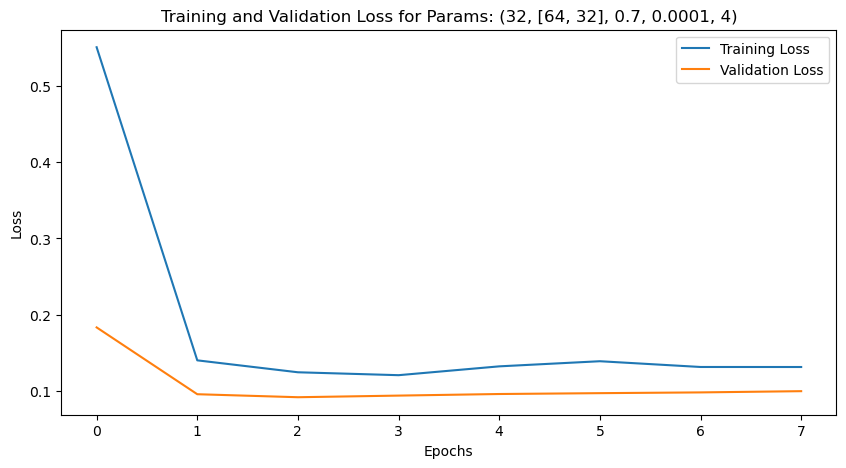

Training with params: (32, [64, 32], 0.7, 0.0001, 8)


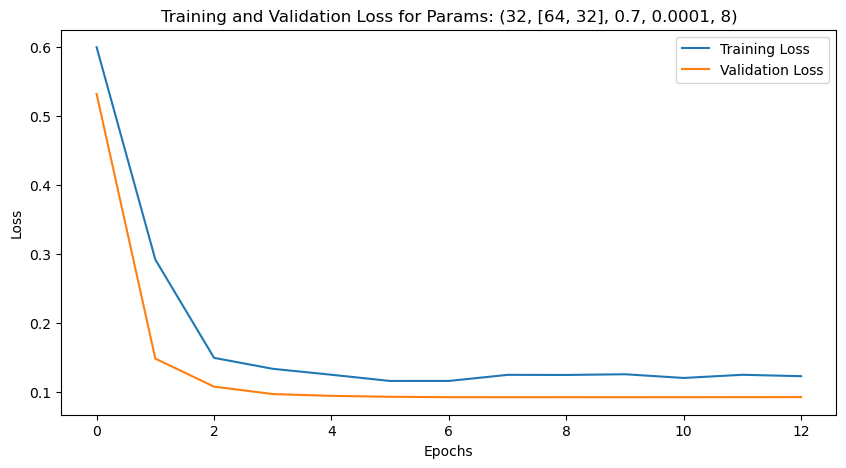

Training with params: (32, [64, 32], 0.7, 0.0001, 12)


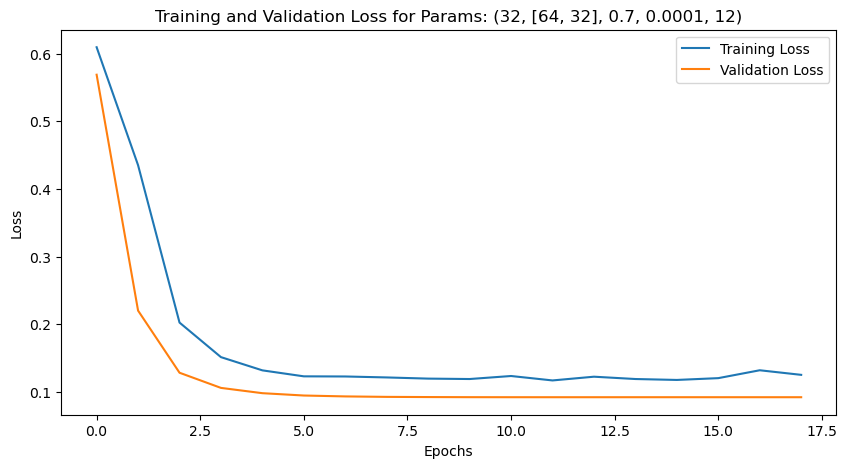

Training with params: (32, [64, 32], 0.7, 0.0005, 4)


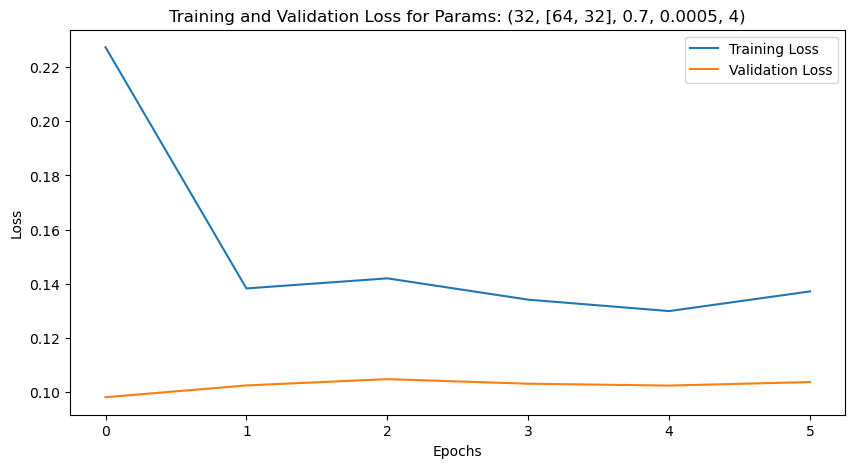

Training with params: (32, [64, 32], 0.7, 0.0005, 8)


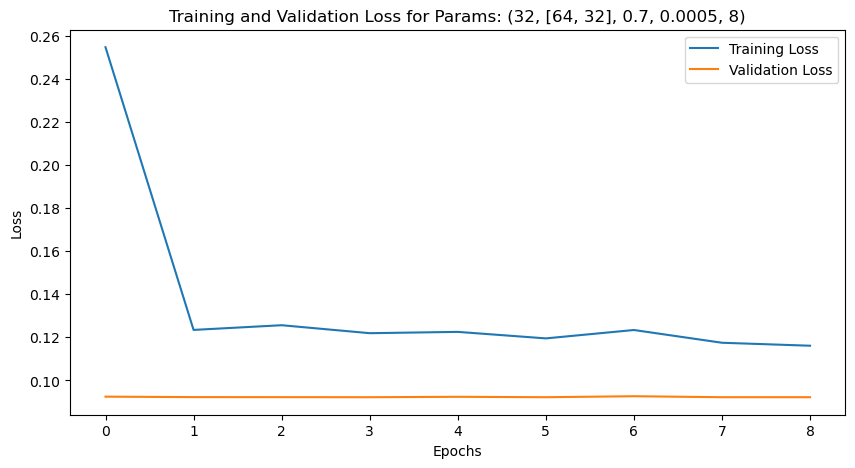

Training with params: (32, [64, 32], 0.7, 0.0005, 12)


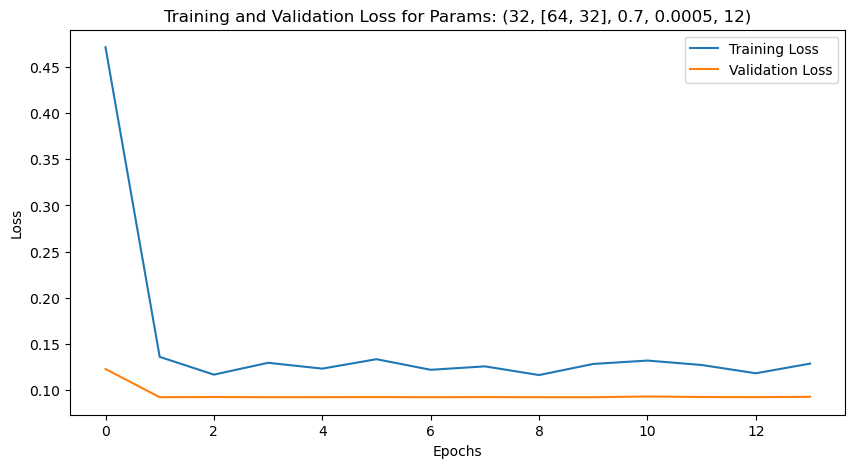

Training with params: (32, [64, 32, 16], 0.3, 5e-05, 4)


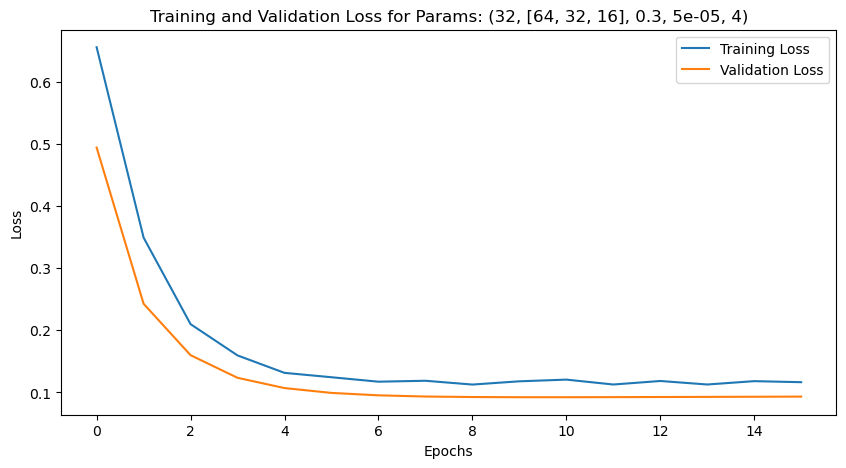

Training with params: (32, [64, 32, 16], 0.3, 5e-05, 8)


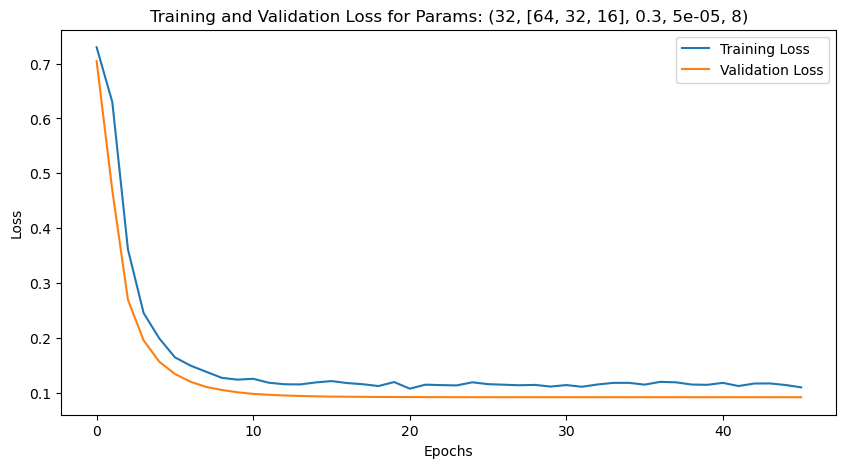

Training with params: (32, [64, 32, 16], 0.3, 5e-05, 12)


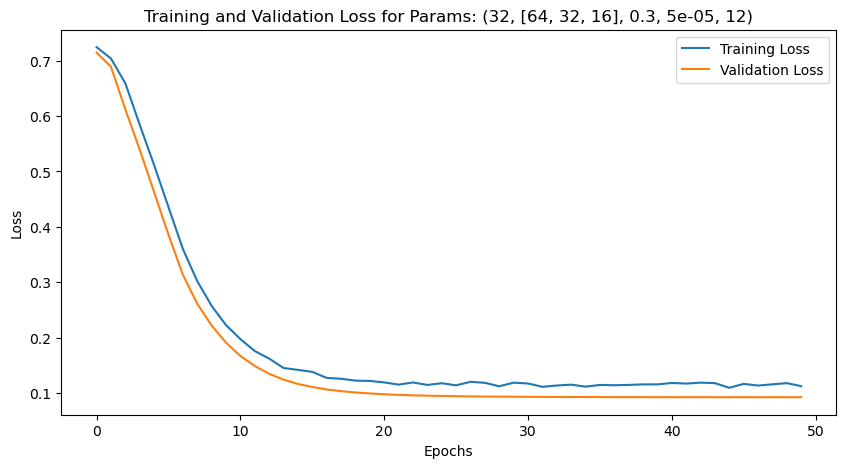

Training with params: (32, [64, 32, 16], 0.3, 0.0001, 4)


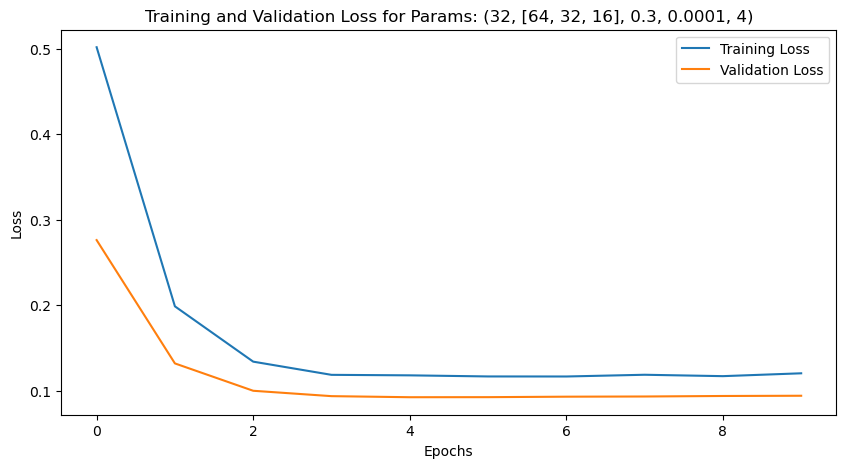

Training with params: (32, [64, 32, 16], 0.3, 0.0001, 8)


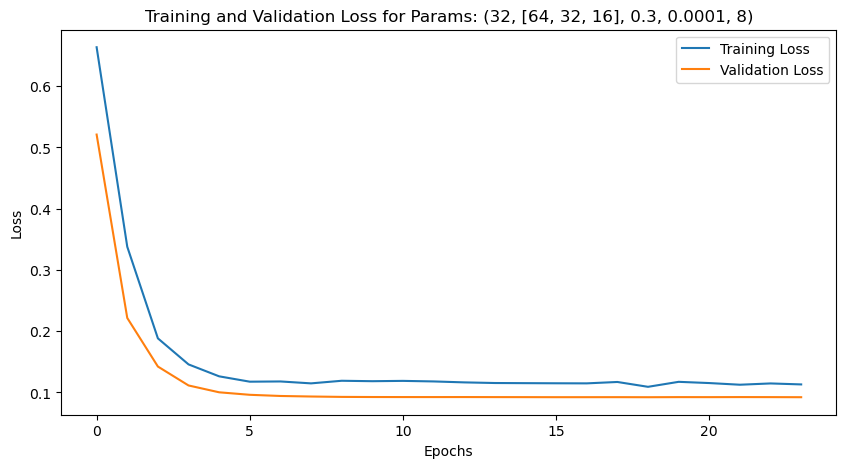

Training with params: (32, [64, 32, 16], 0.3, 0.0001, 12)


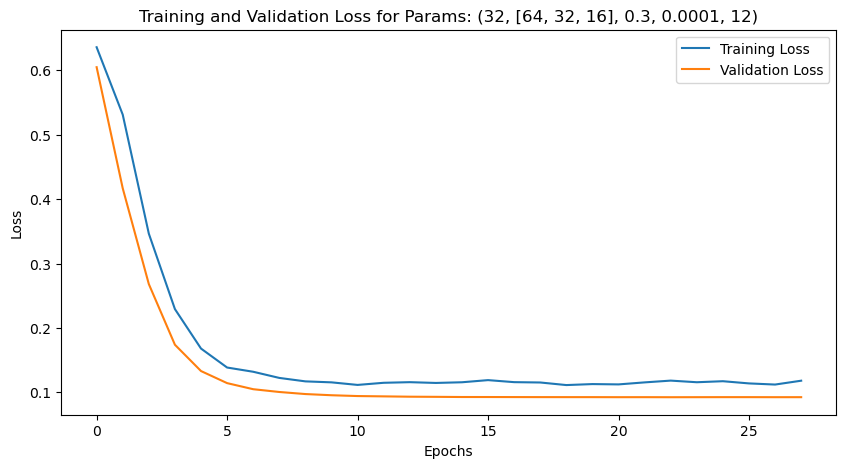

Training with params: (32, [64, 32, 16], 0.3, 0.0005, 4)


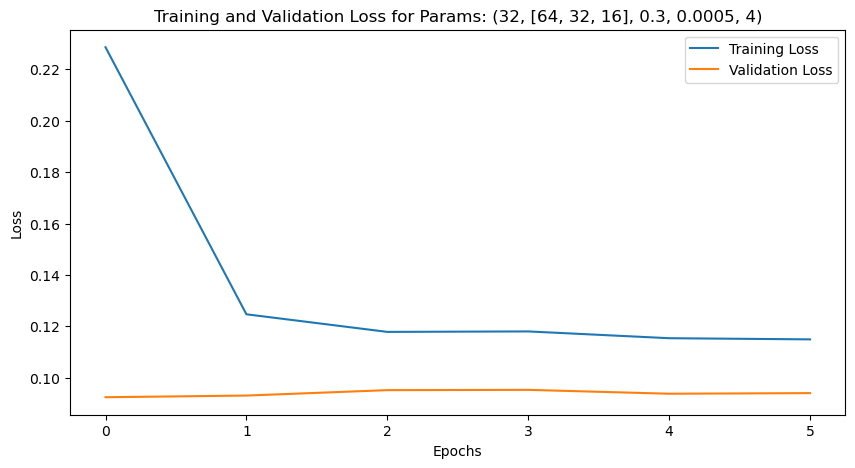

Training with params: (32, [64, 32, 16], 0.3, 0.0005, 8)


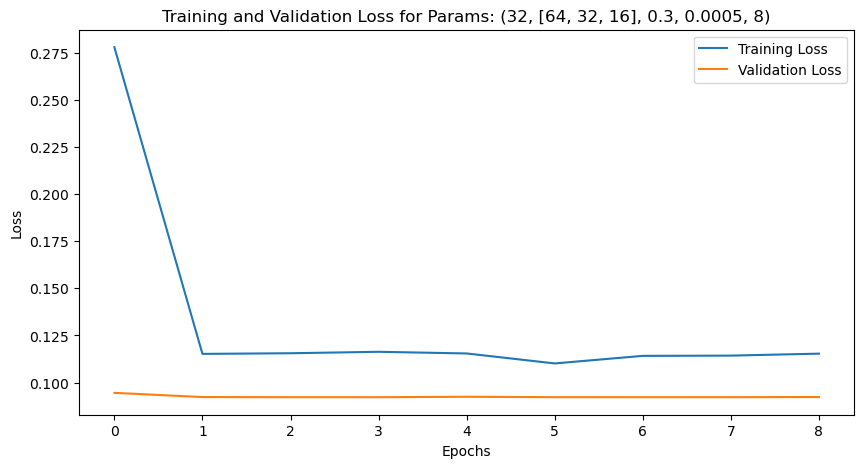

Training with params: (32, [64, 32, 16], 0.3, 0.0005, 12)


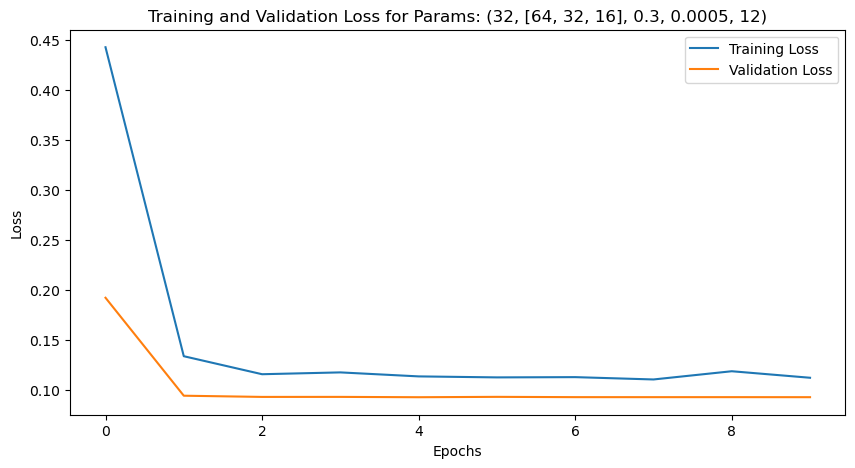

Training with params: (32, [64, 32, 16], 0.5, 5e-05, 4)


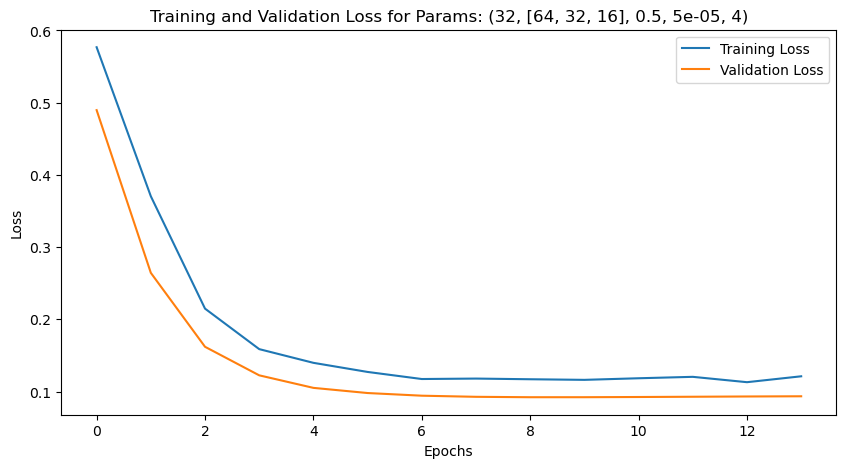

Training with params: (32, [64, 32, 16], 0.5, 5e-05, 8)


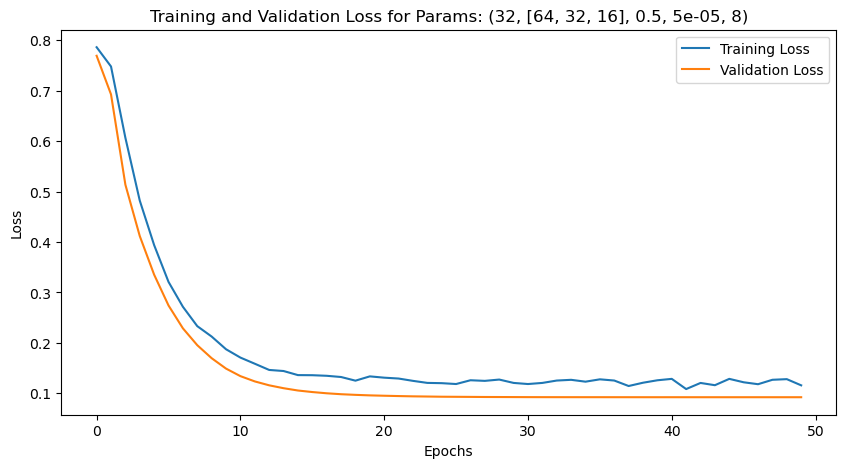

Training with params: (32, [64, 32, 16], 0.5, 5e-05, 12)


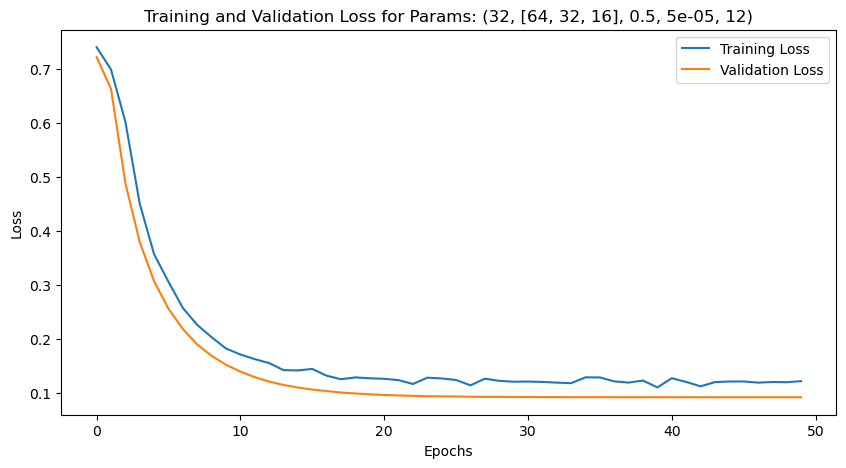

Training with params: (32, [64, 32, 16], 0.5, 0.0001, 4)


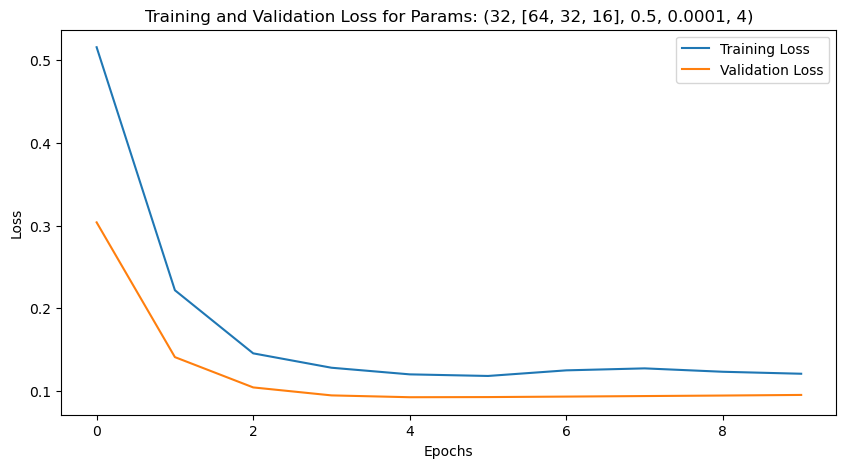

Training with params: (32, [64, 32, 16], 0.5, 0.0001, 8)


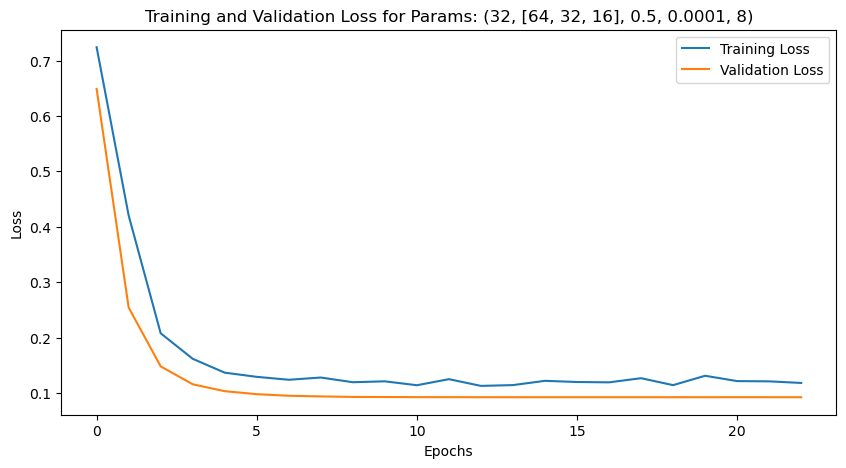

Training with params: (32, [64, 32, 16], 0.5, 0.0001, 12)


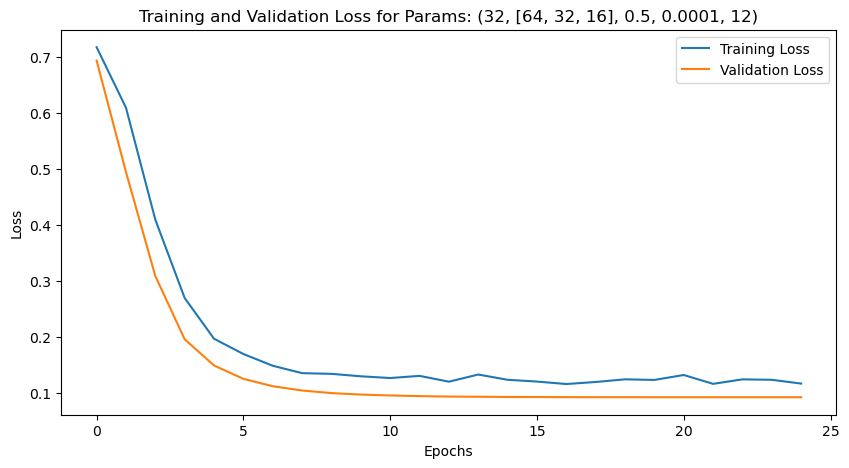

Training with params: (32, [64, 32, 16], 0.5, 0.0005, 4)


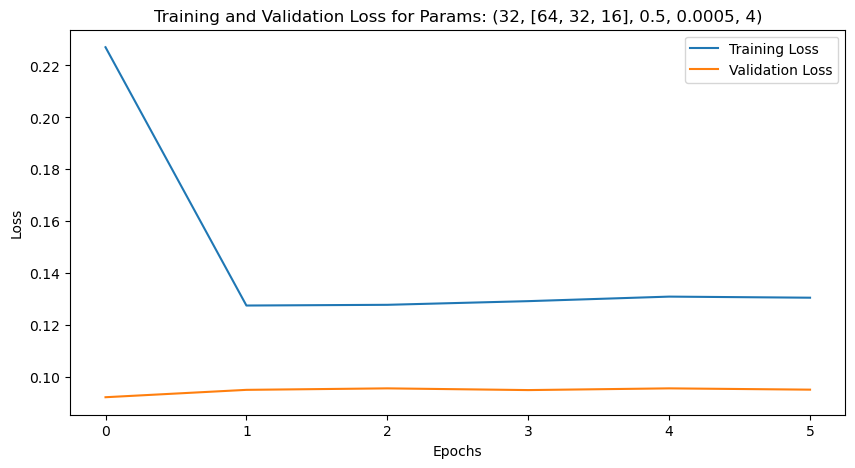

Training with params: (32, [64, 32, 16], 0.5, 0.0005, 8)


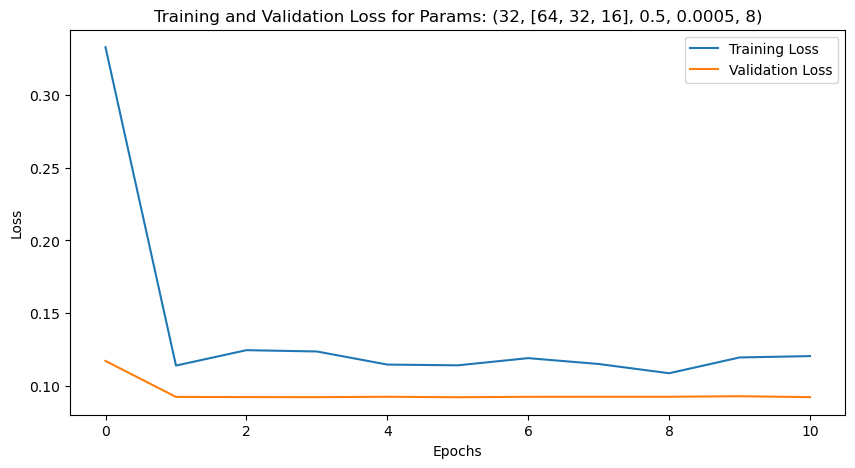

Training with params: (32, [64, 32, 16], 0.5, 0.0005, 12)


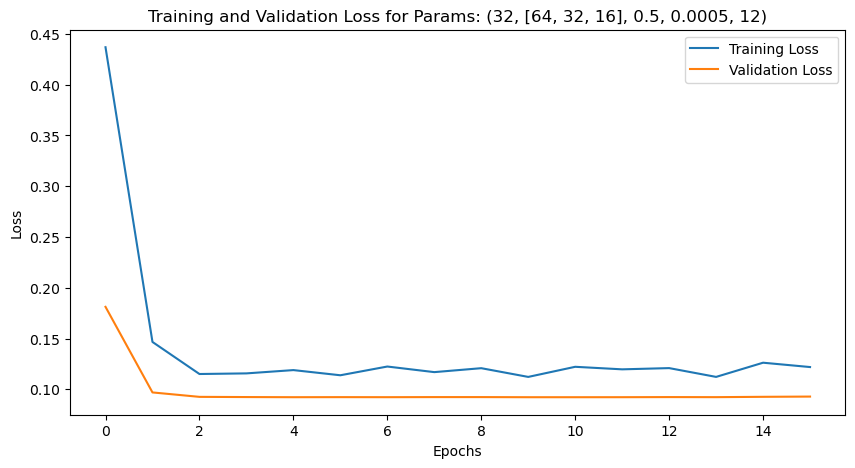

Training with params: (32, [64, 32, 16], 0.7, 5e-05, 4)


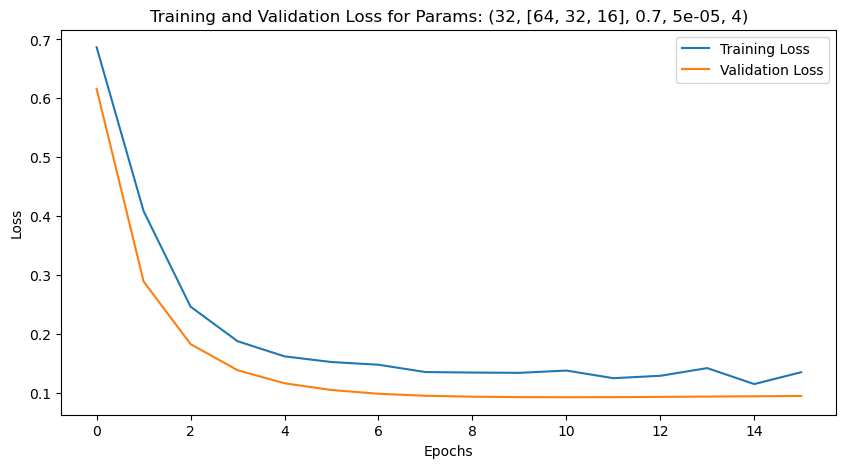

Training with params: (32, [64, 32, 16], 0.7, 5e-05, 8)


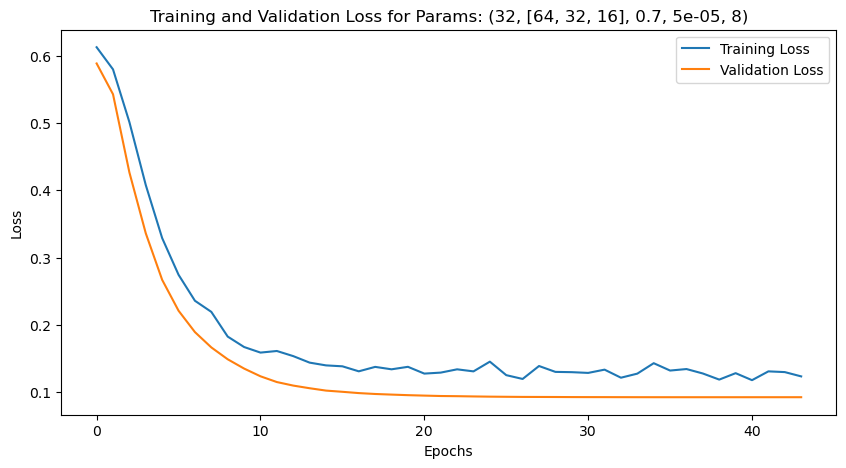

Training with params: (32, [64, 32, 16], 0.7, 5e-05, 12)


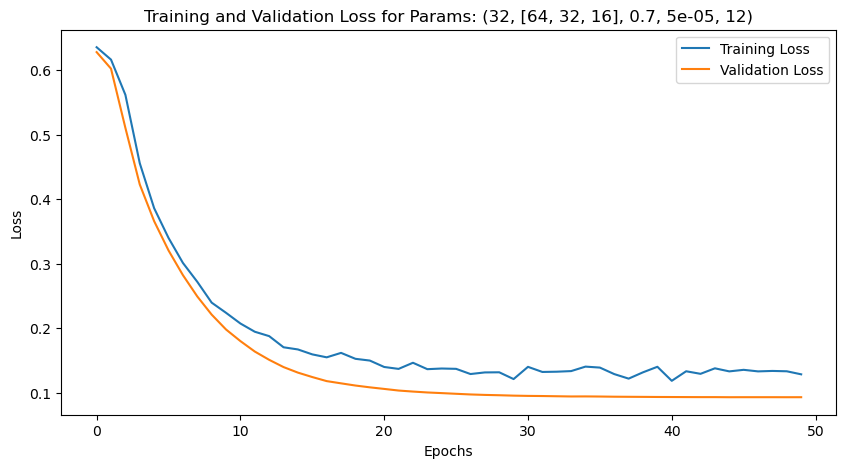

Training with params: (32, [64, 32, 16], 0.7, 0.0001, 4)


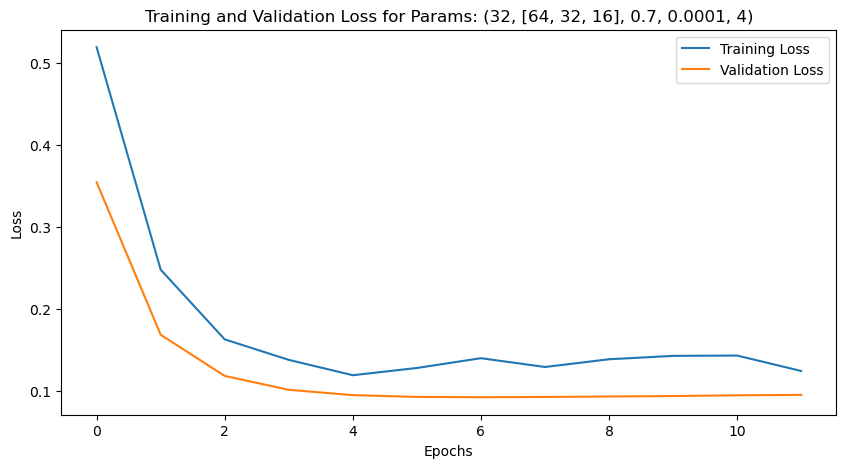

Training with params: (32, [64, 32, 16], 0.7, 0.0001, 8)


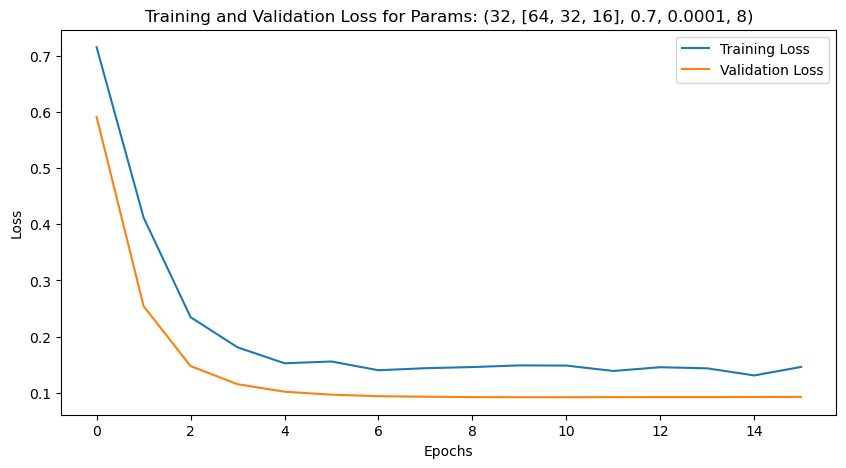

Training with params: (32, [64, 32, 16], 0.7, 0.0001, 12)


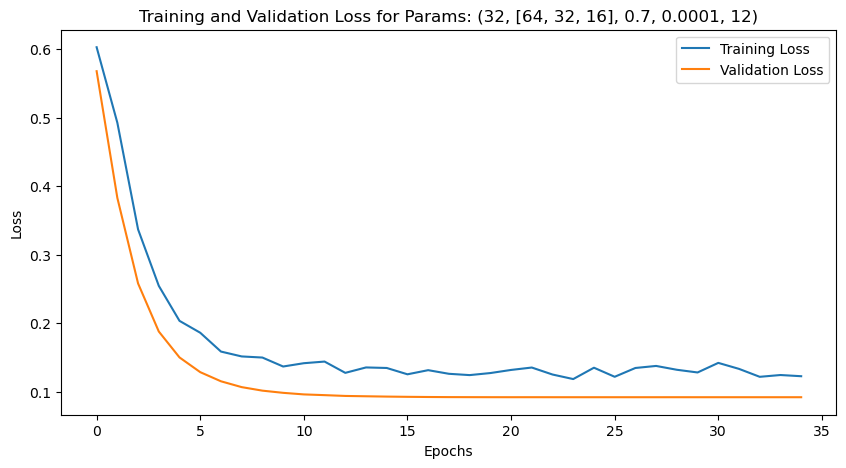

Training with params: (32, [64, 32, 16], 0.7, 0.0005, 4)


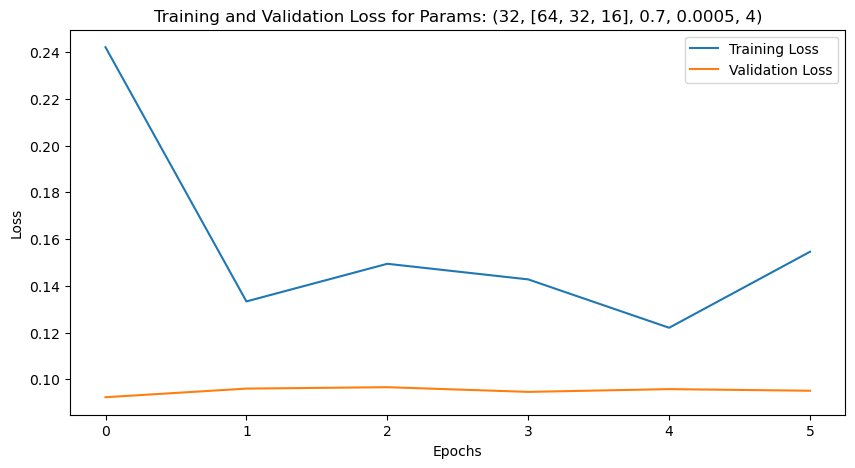

Training with params: (32, [64, 32, 16], 0.7, 0.0005, 8)


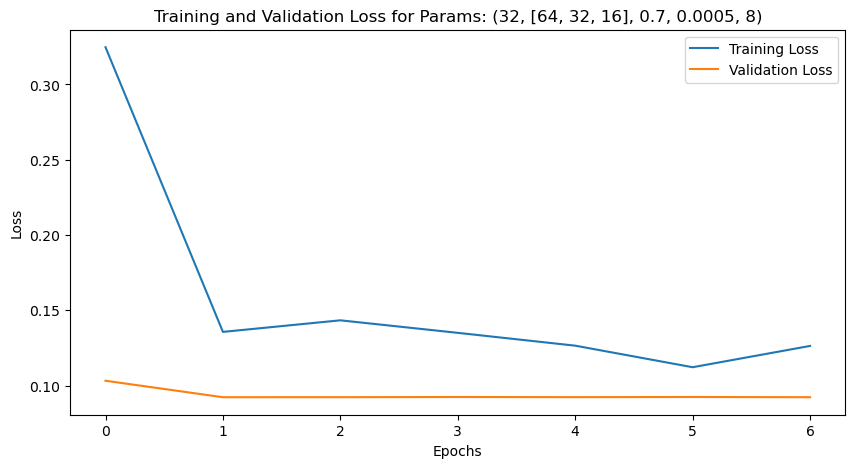

Training with params: (32, [64, 32, 16], 0.7, 0.0005, 12)


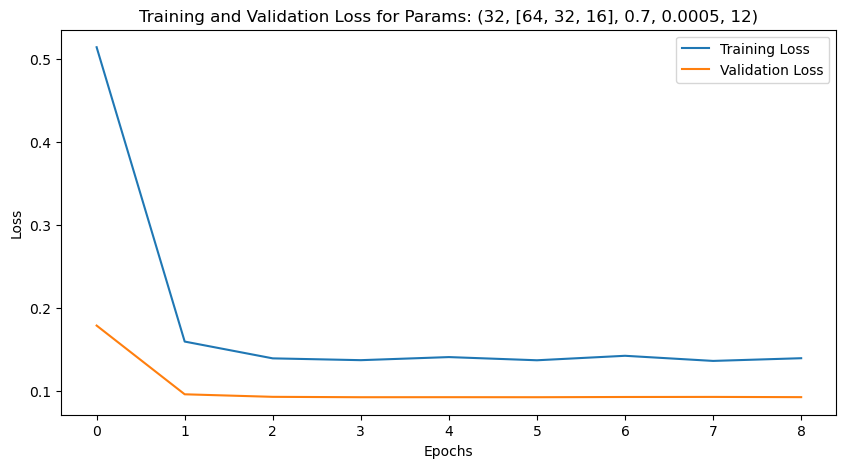

Training with params: (32, [128, 64, 32], 0.3, 5e-05, 4)


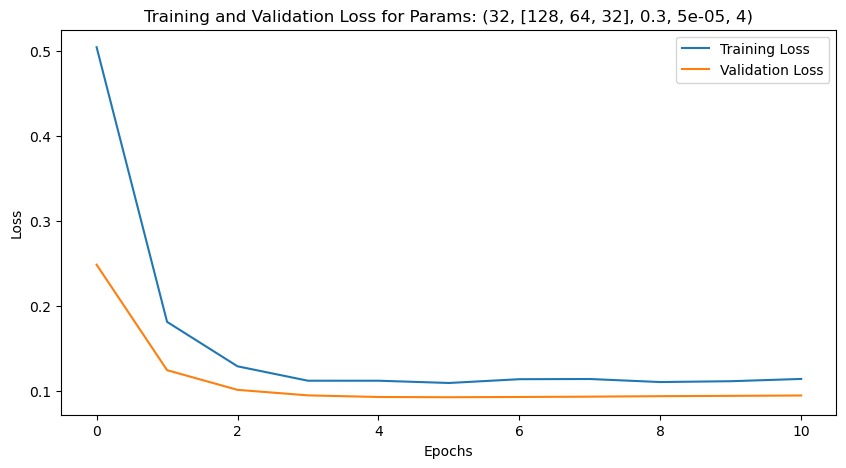

Training with params: (32, [128, 64, 32], 0.3, 5e-05, 8)


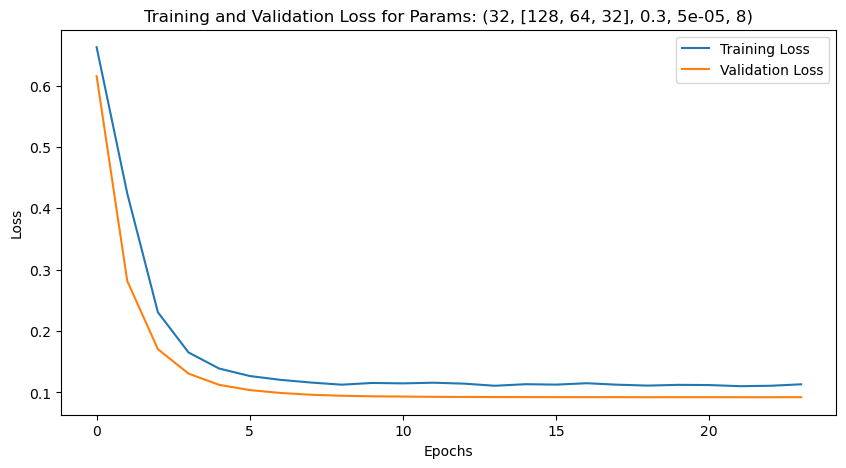

Training with params: (32, [128, 64, 32], 0.3, 5e-05, 12)


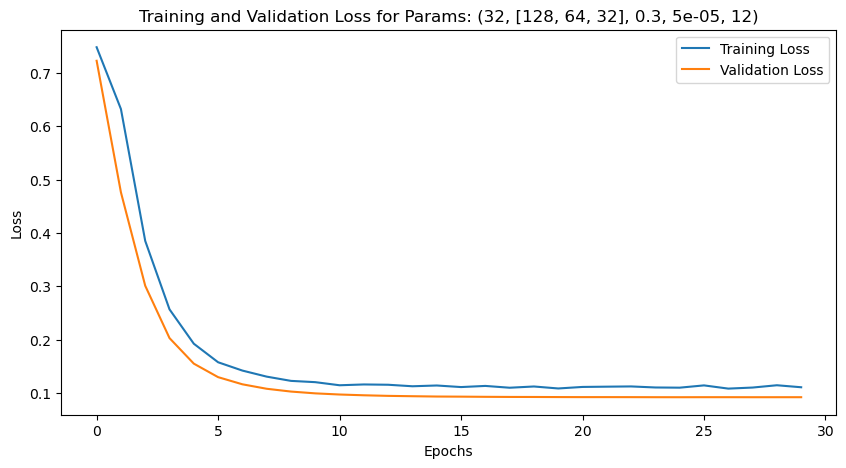

Training with params: (32, [128, 64, 32], 0.3, 0.0001, 4)


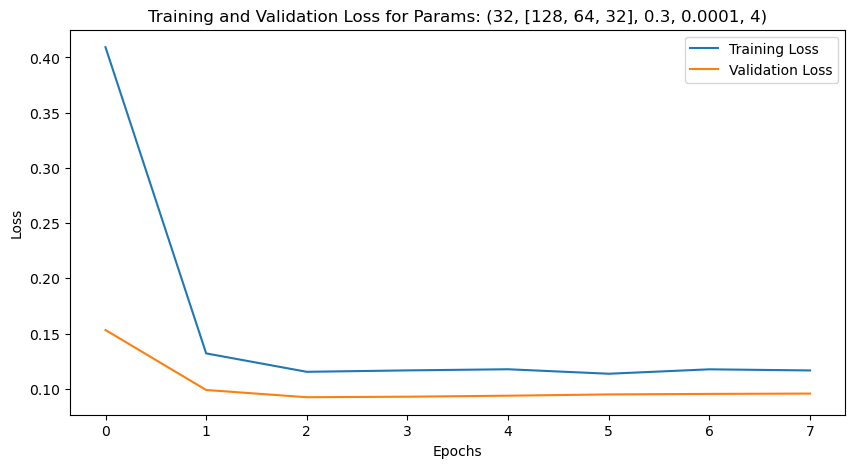

Training with params: (32, [128, 64, 32], 0.3, 0.0001, 8)


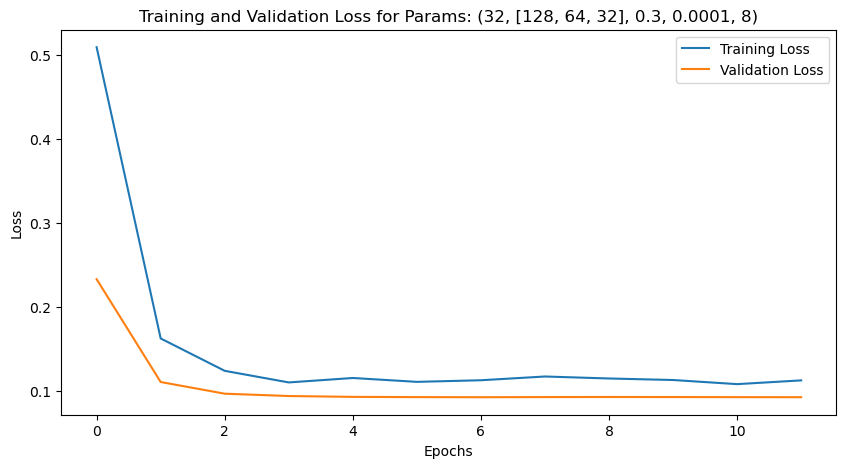

Training with params: (32, [128, 64, 32], 0.3, 0.0001, 12)


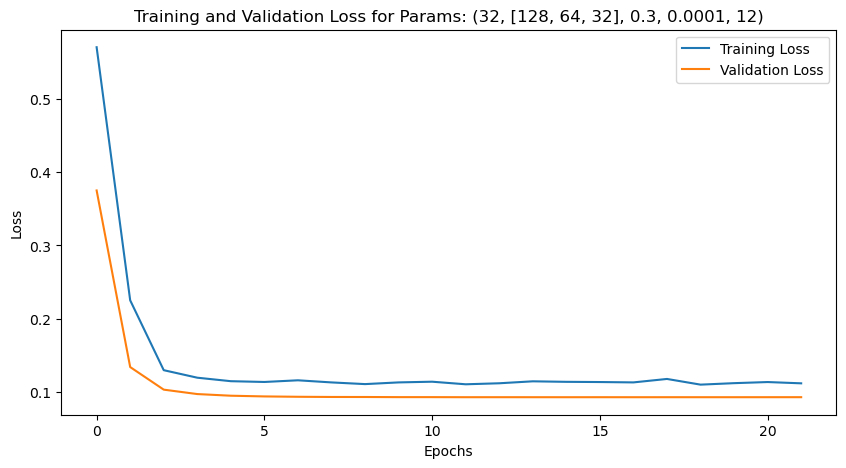

Training with params: (32, [128, 64, 32], 0.3, 0.0005, 4)


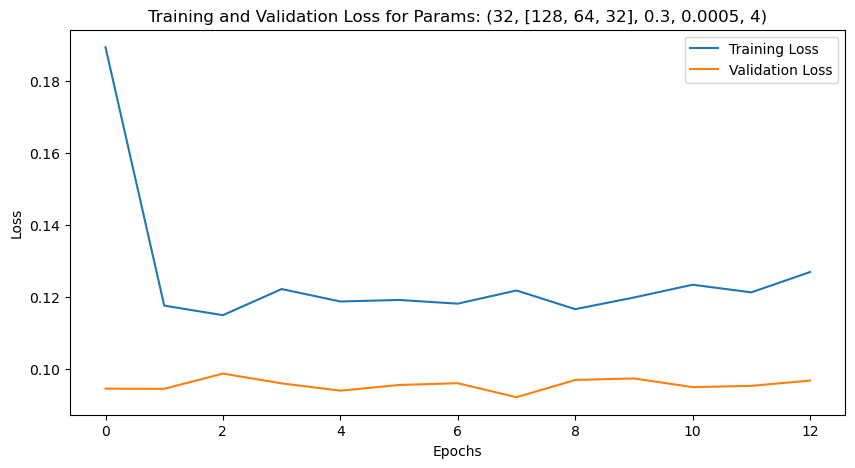

Training with params: (32, [128, 64, 32], 0.3, 0.0005, 8)


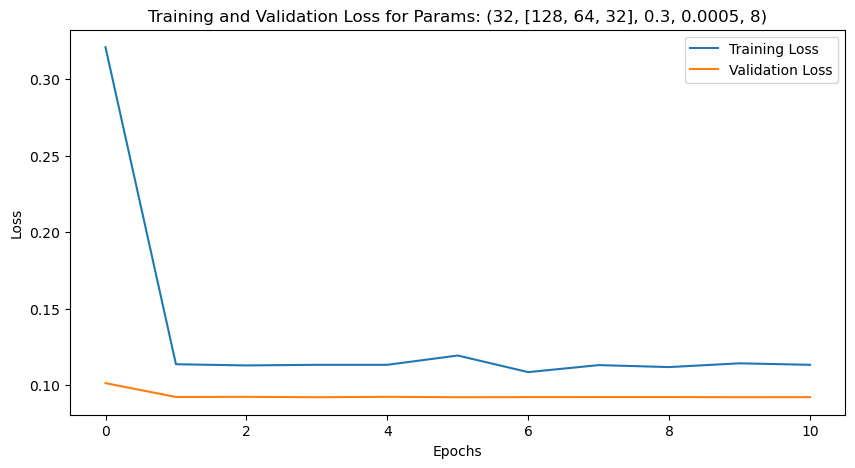

Training with params: (32, [128, 64, 32], 0.3, 0.0005, 12)


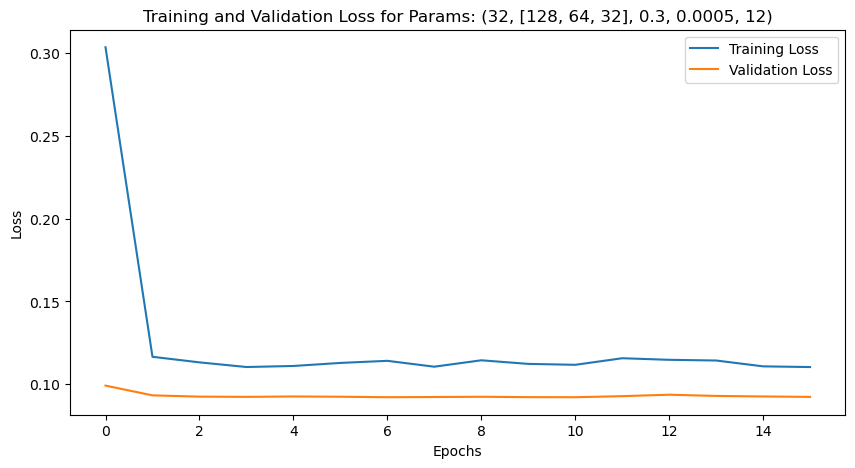

Training with params: (32, [128, 64, 32], 0.5, 5e-05, 4)


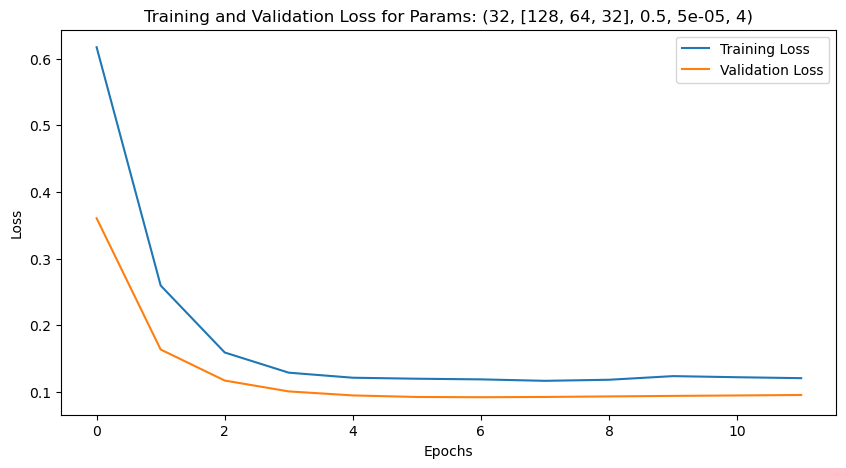

Training with params: (32, [128, 64, 32], 0.5, 5e-05, 8)


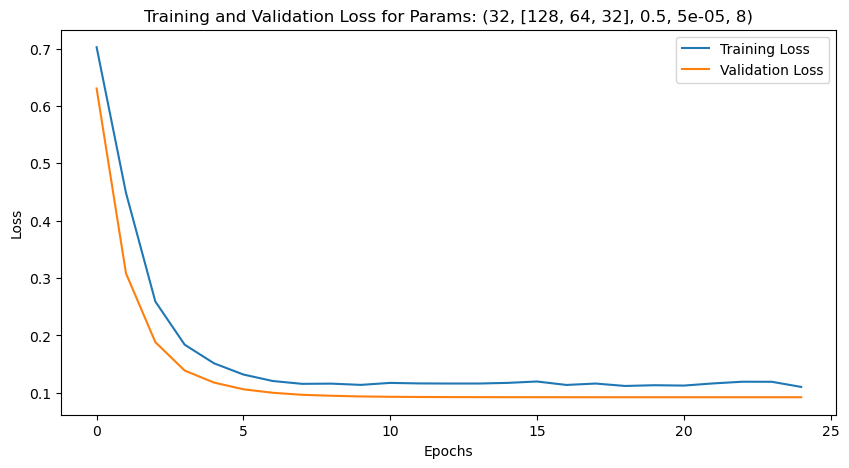

Training with params: (32, [128, 64, 32], 0.5, 5e-05, 12)


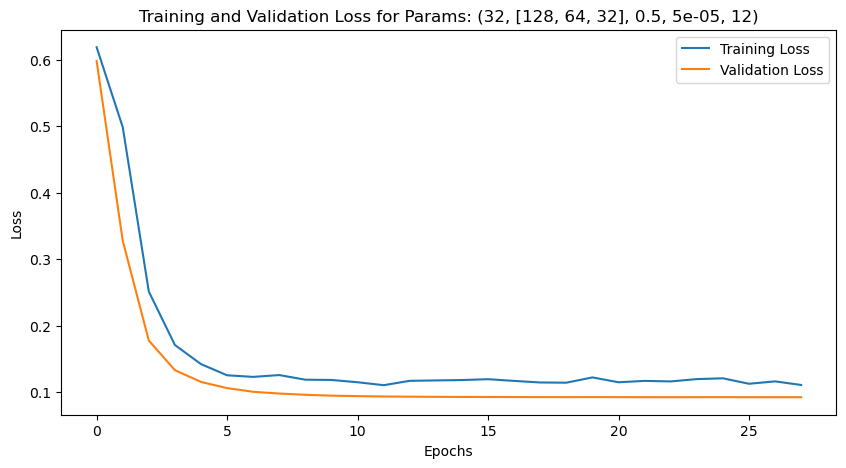

Training with params: (32, [128, 64, 32], 0.5, 0.0001, 4)


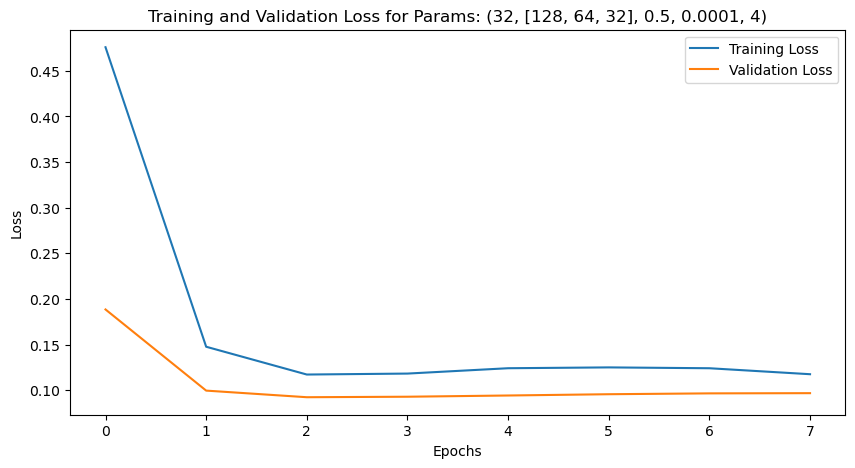

Training with params: (32, [128, 64, 32], 0.5, 0.0001, 8)


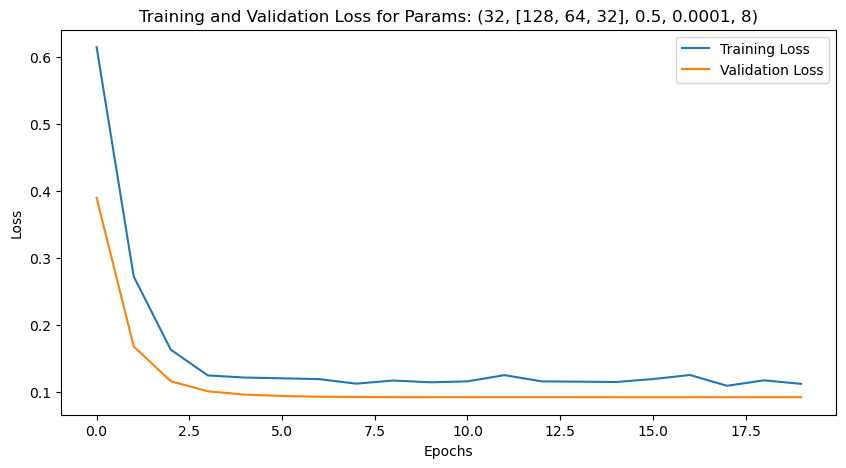

Training with params: (32, [128, 64, 32], 0.5, 0.0001, 12)


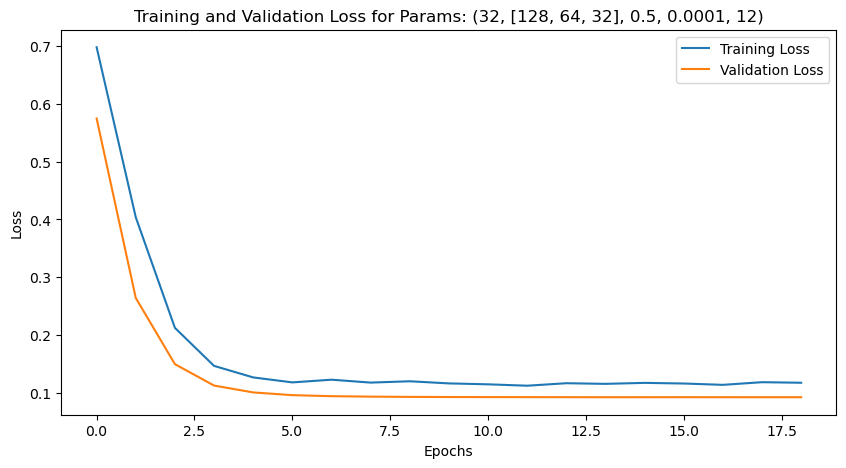

Training with params: (32, [128, 64, 32], 0.5, 0.0005, 4)


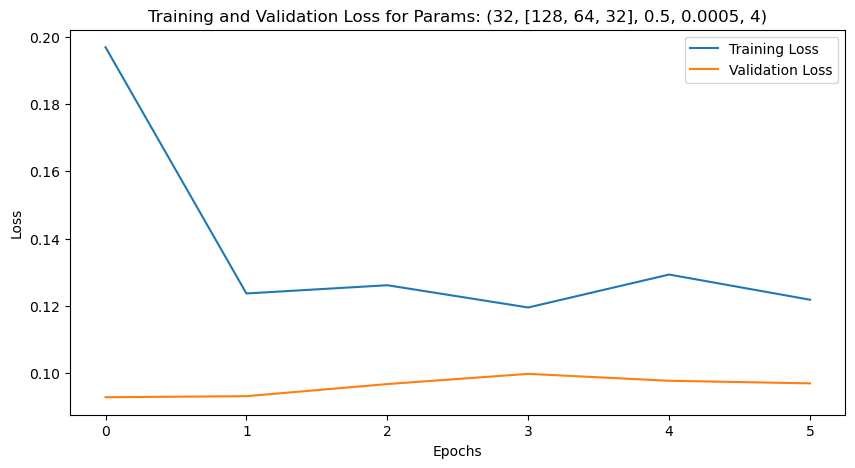

Training with params: (32, [128, 64, 32], 0.5, 0.0005, 8)


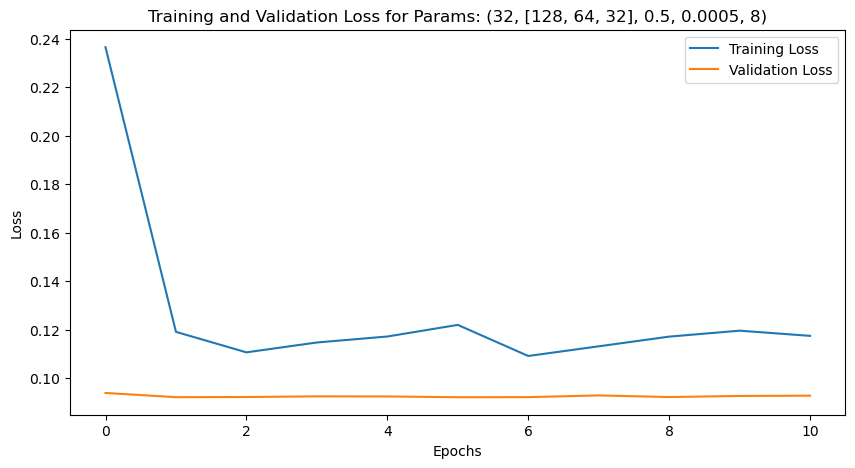

Training with params: (32, [128, 64, 32], 0.5, 0.0005, 12)


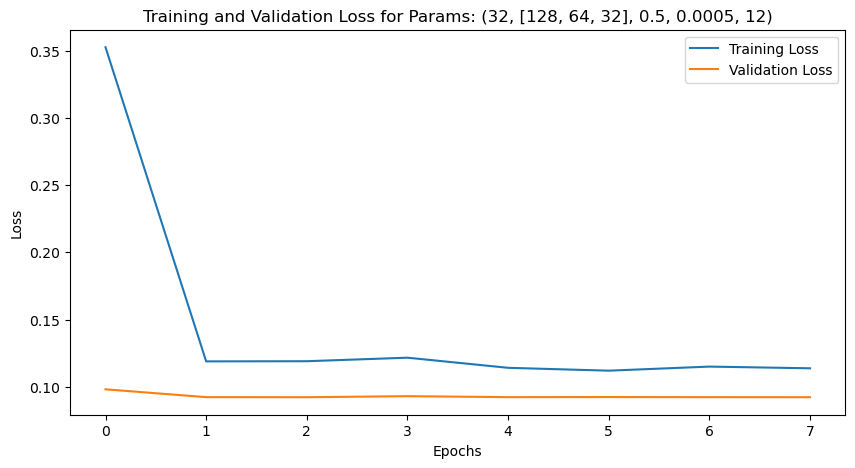

Training with params: (32, [128, 64, 32], 0.7, 5e-05, 4)


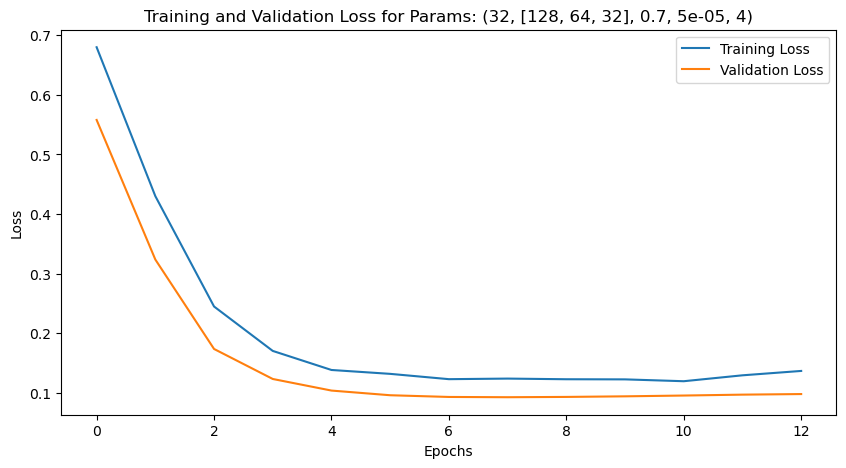

Training with params: (32, [128, 64, 32], 0.7, 5e-05, 8)


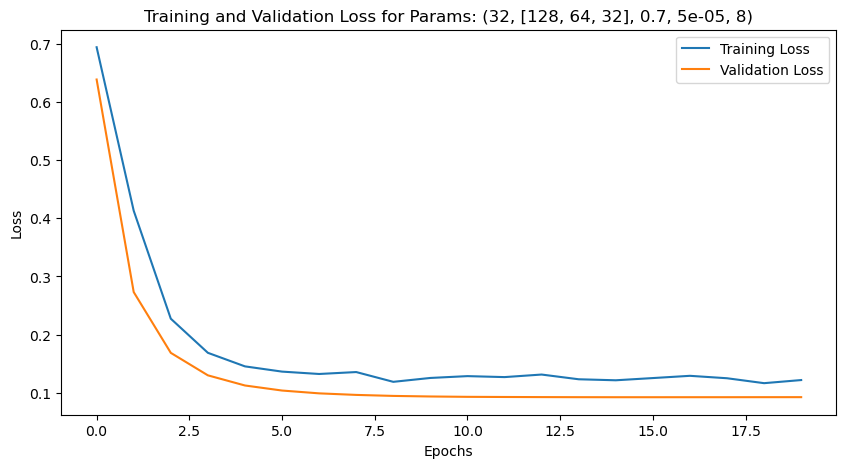

Training with params: (32, [128, 64, 32], 0.7, 5e-05, 12)


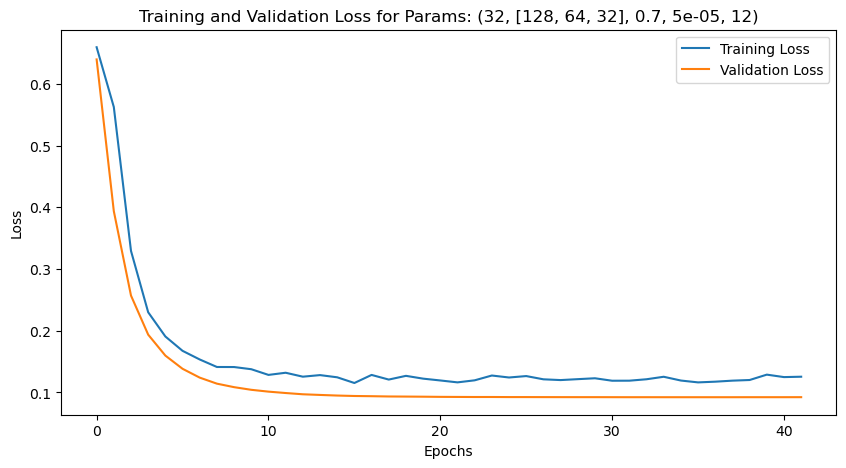

Training with params: (32, [128, 64, 32], 0.7, 0.0001, 4)


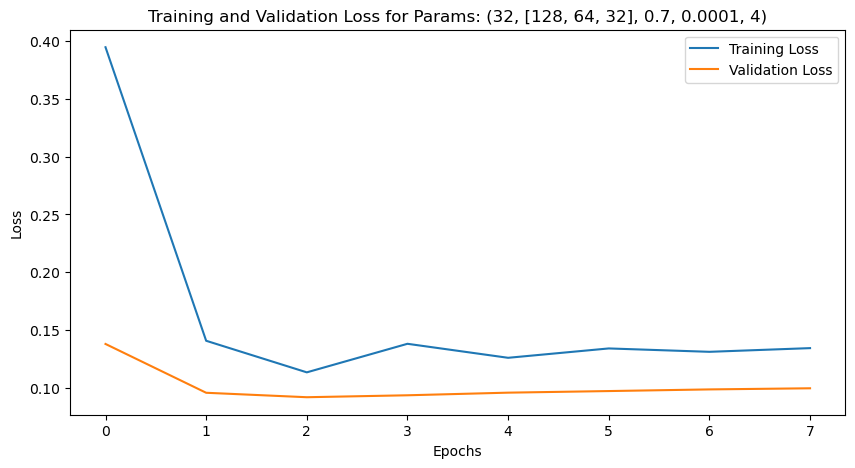

Training with params: (32, [128, 64, 32], 0.7, 0.0001, 8)


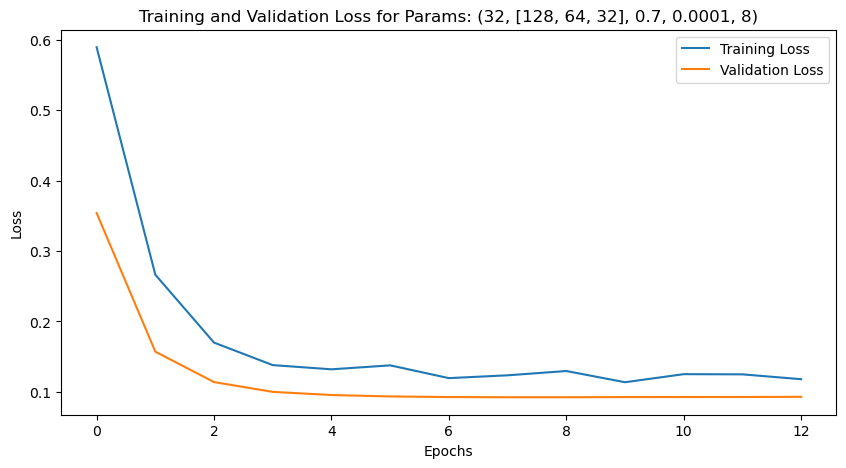

Training with params: (32, [128, 64, 32], 0.7, 0.0001, 12)


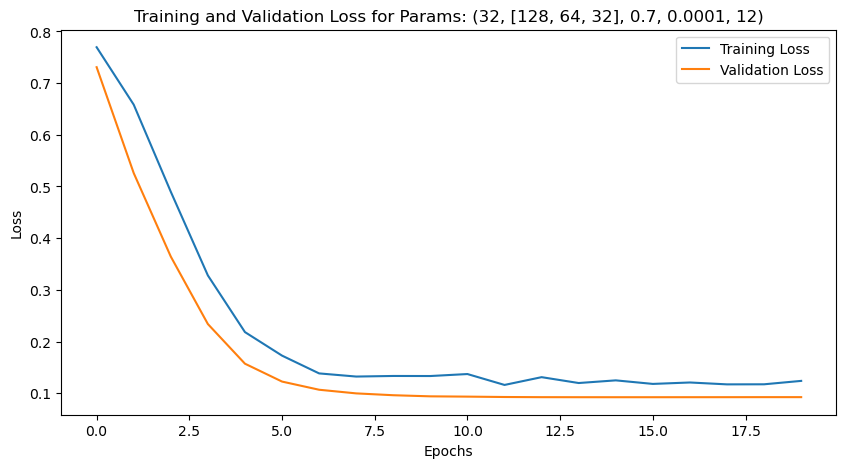

Training with params: (32, [128, 64, 32], 0.7, 0.0005, 4)


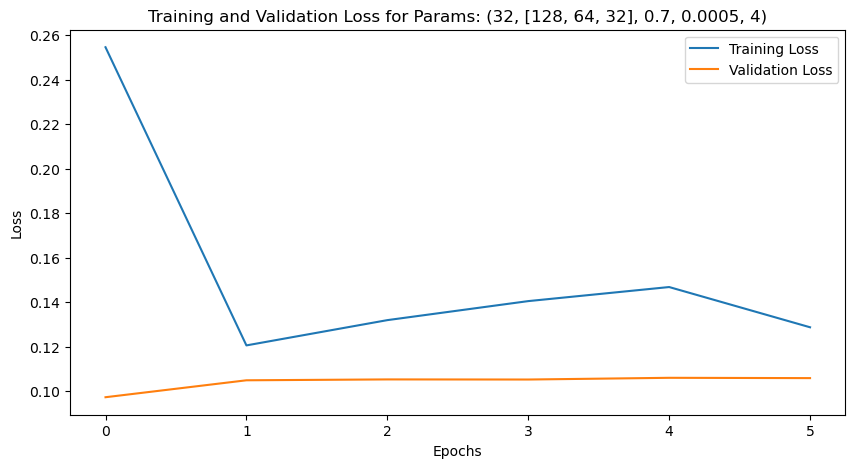

Training with params: (32, [128, 64, 32], 0.7, 0.0005, 8)


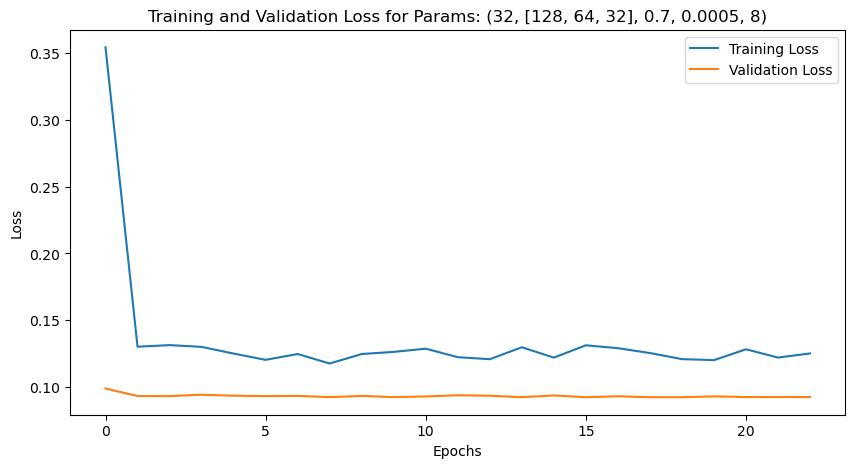

Training with params: (32, [128, 64, 32], 0.7, 0.0005, 12)


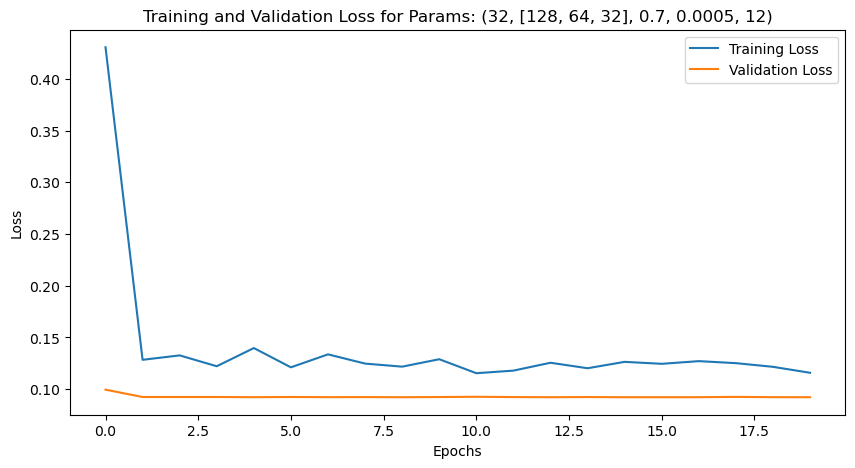

Training with params: (32, [256, 128, 64], 0.3, 5e-05, 4)


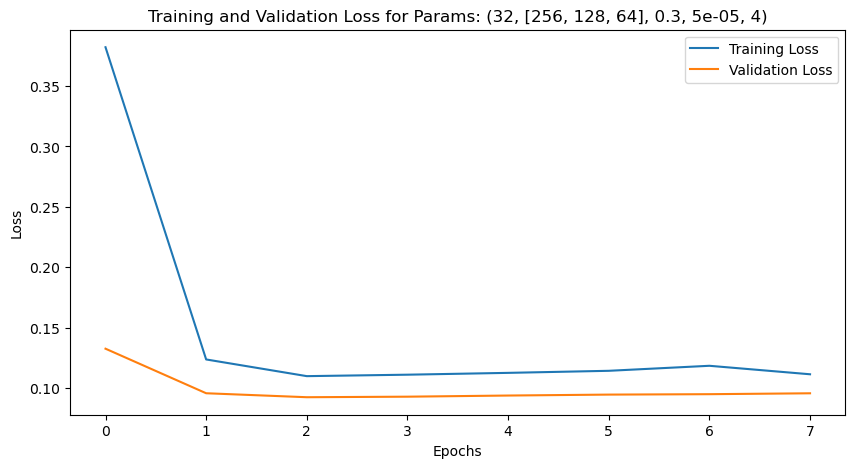

Training with params: (32, [256, 128, 64], 0.3, 5e-05, 8)


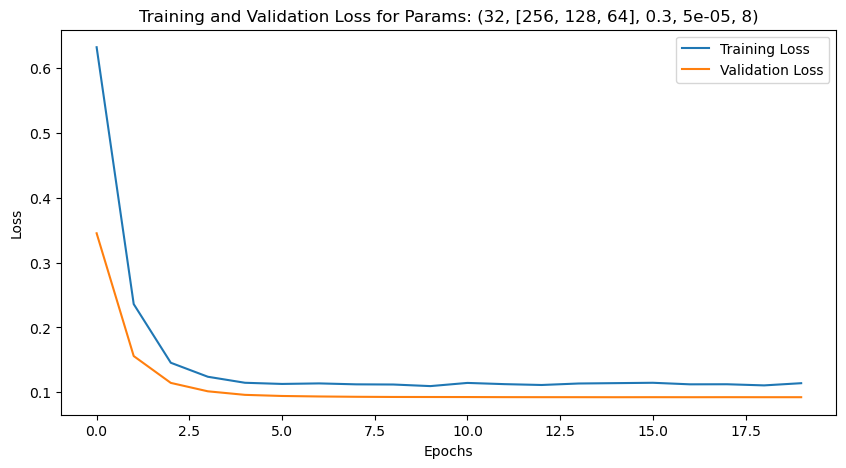

Training with params: (32, [256, 128, 64], 0.3, 5e-05, 12)


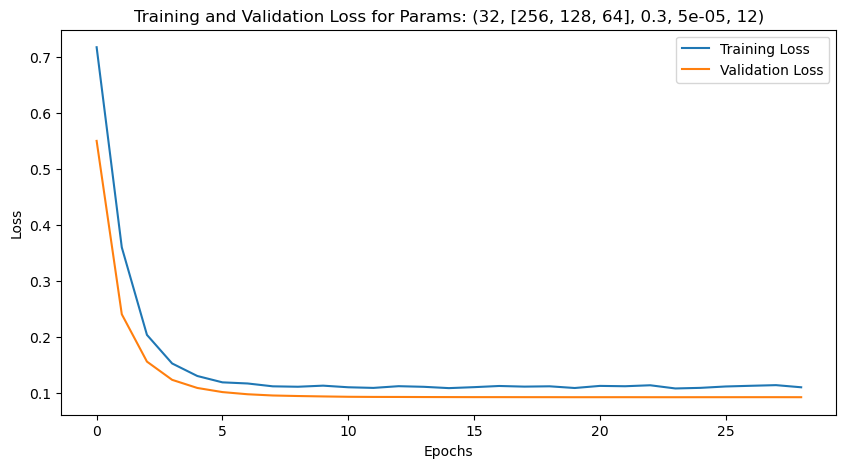

Training with params: (32, [256, 128, 64], 0.3, 0.0001, 4)


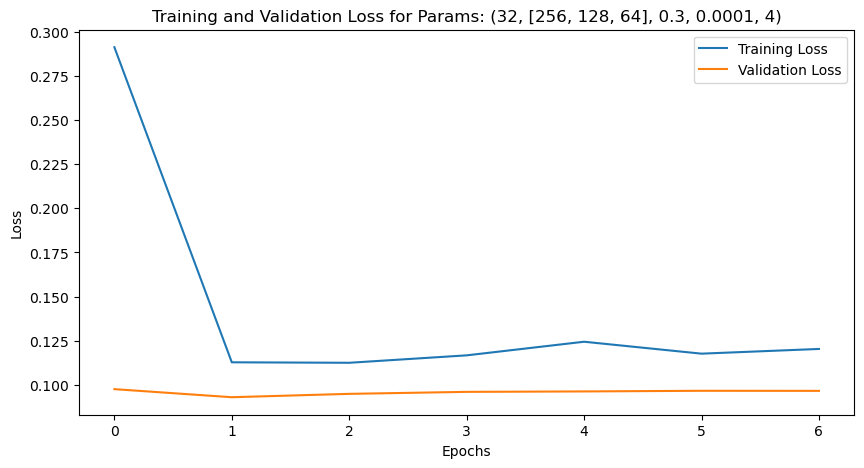

Training with params: (32, [256, 128, 64], 0.3, 0.0001, 8)


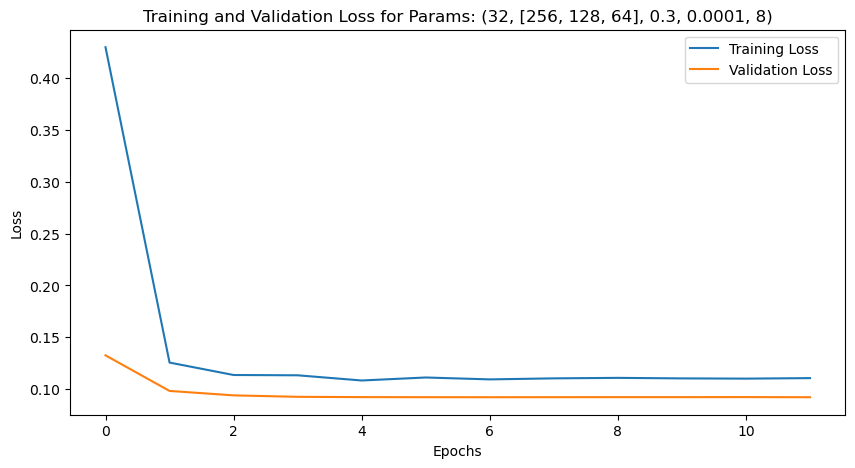

Training with params: (32, [256, 128, 64], 0.3, 0.0001, 12)


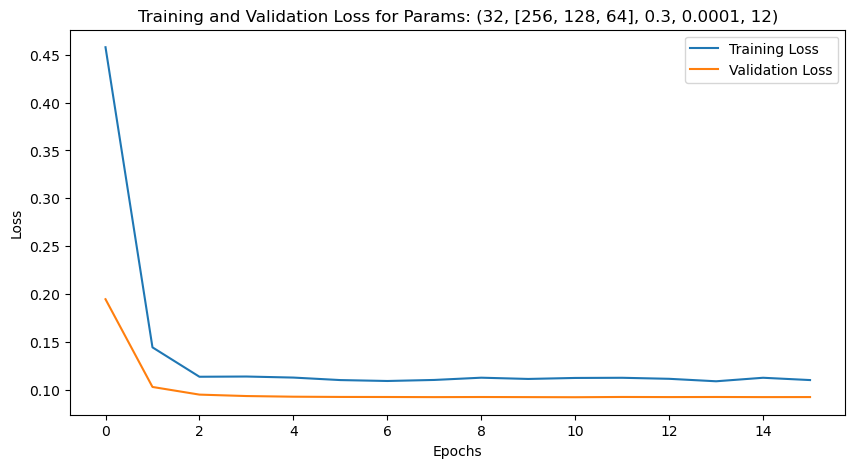

Training with params: (32, [256, 128, 64], 0.3, 0.0005, 4)


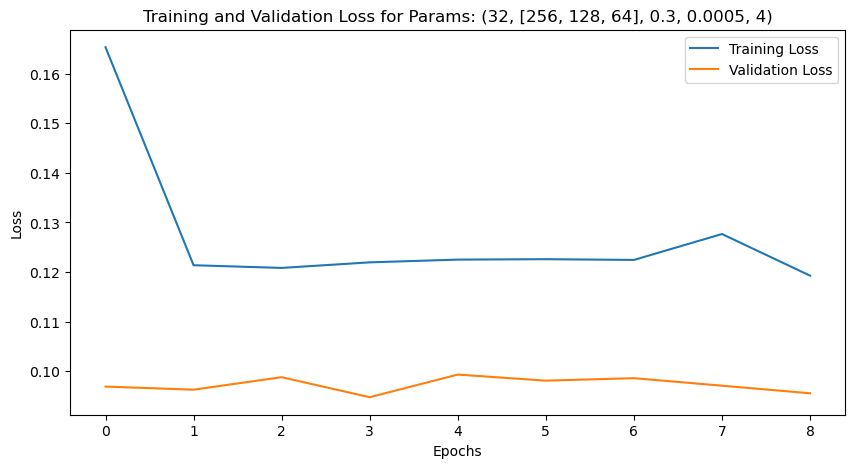

Training with params: (32, [256, 128, 64], 0.3, 0.0005, 8)


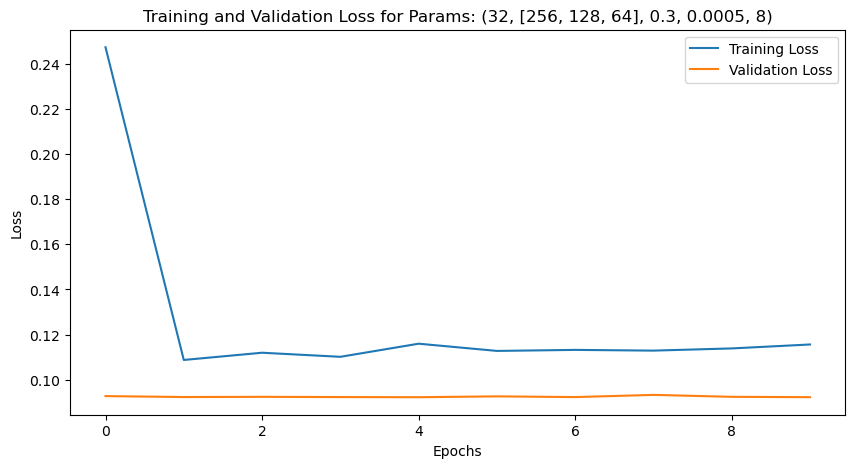

Training with params: (32, [256, 128, 64], 0.3, 0.0005, 12)


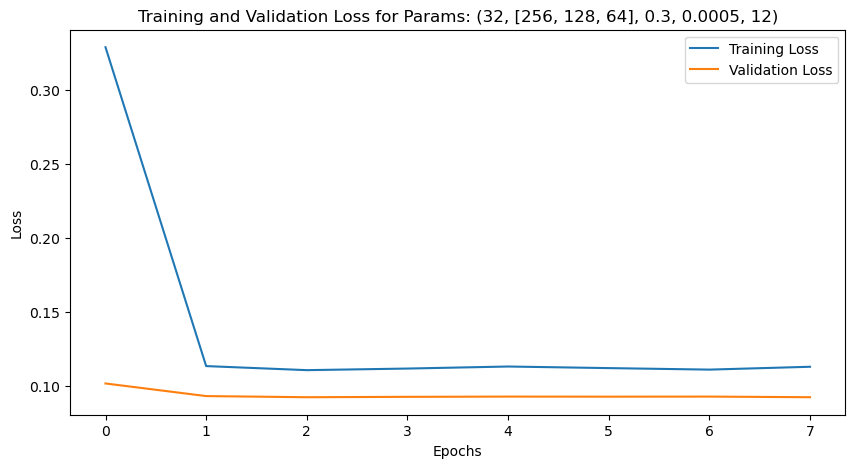

Training with params: (32, [256, 128, 64], 0.5, 5e-05, 4)


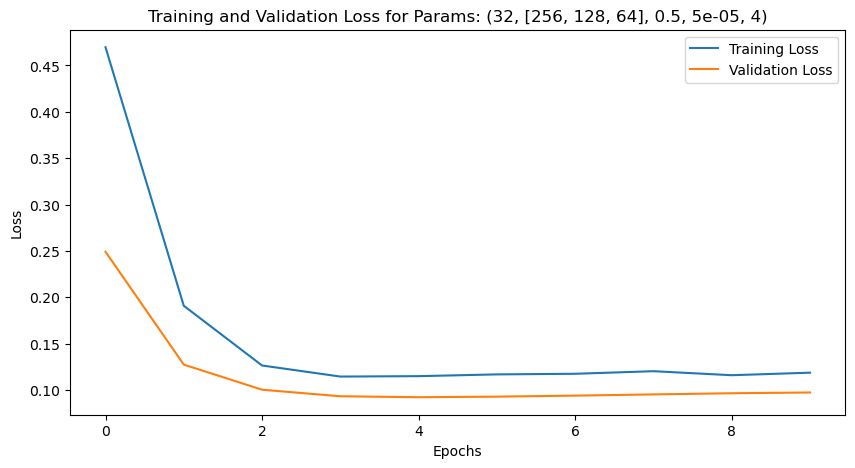

Training with params: (32, [256, 128, 64], 0.5, 5e-05, 8)


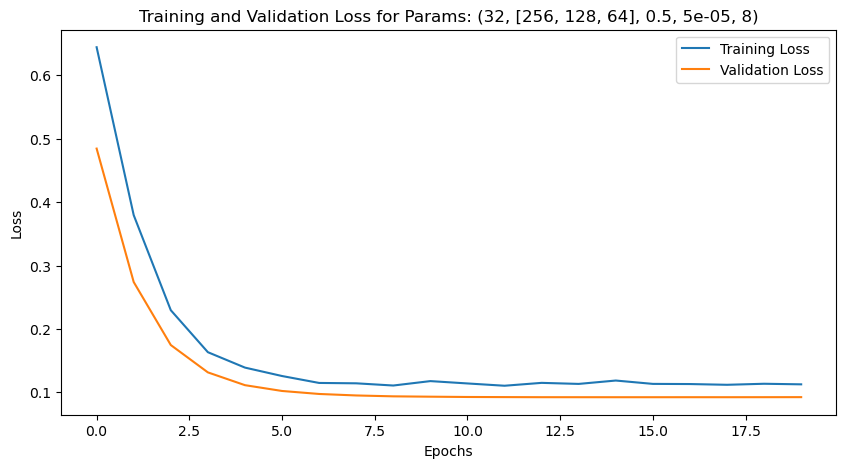

Training with params: (32, [256, 128, 64], 0.5, 5e-05, 12)


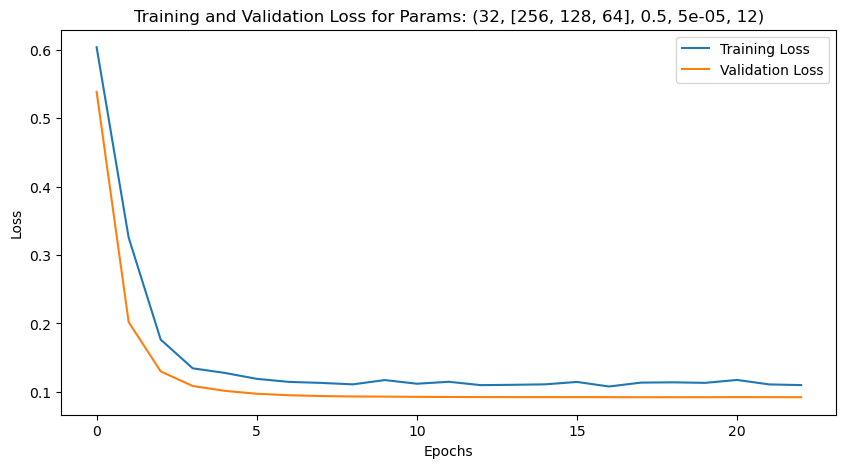

Training with params: (32, [256, 128, 64], 0.5, 0.0001, 4)


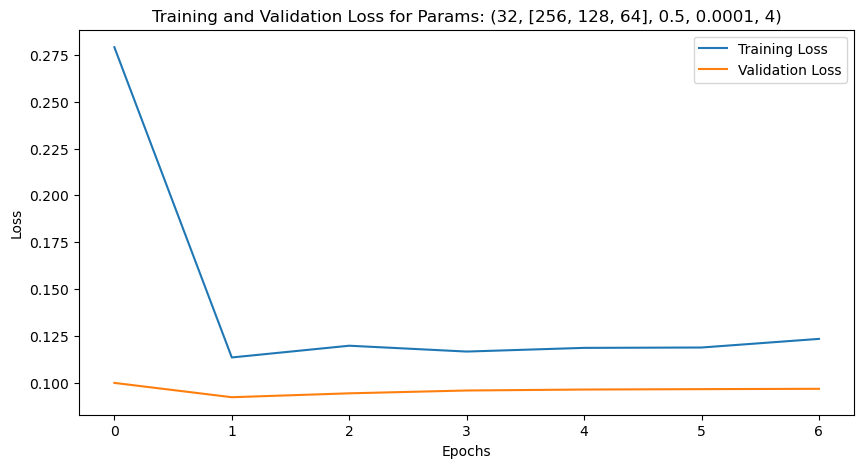

Training with params: (32, [256, 128, 64], 0.5, 0.0001, 8)


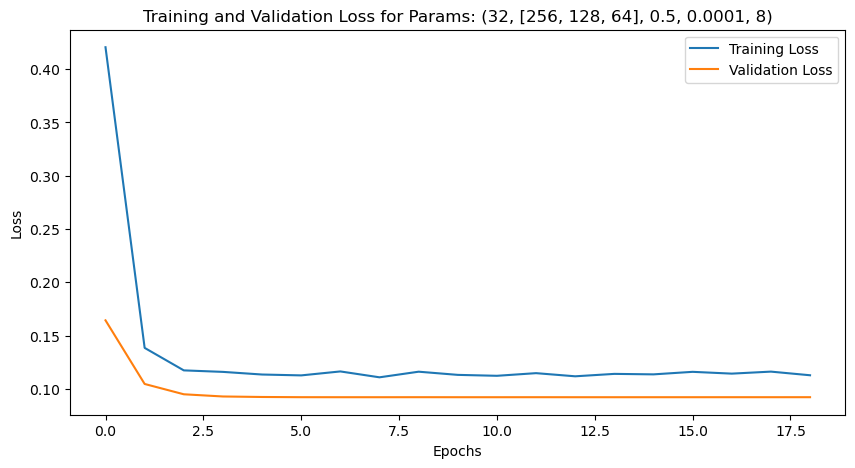

Training with params: (32, [256, 128, 64], 0.5, 0.0001, 12)


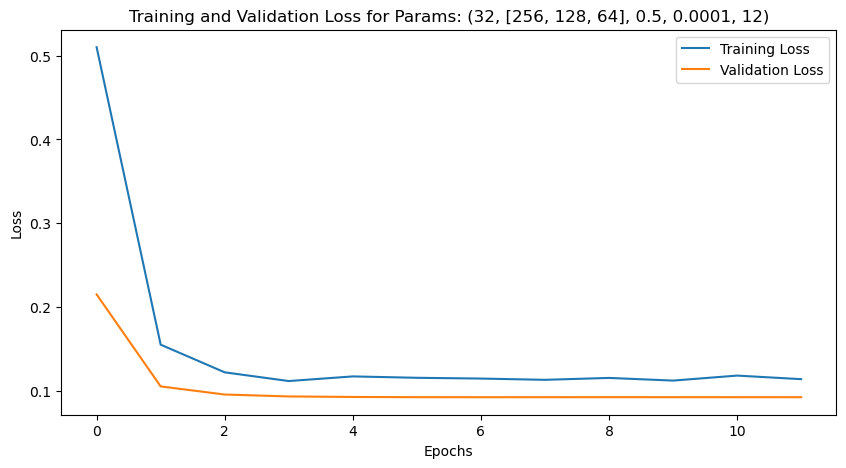

Training with params: (32, [256, 128, 64], 0.5, 0.0005, 4)


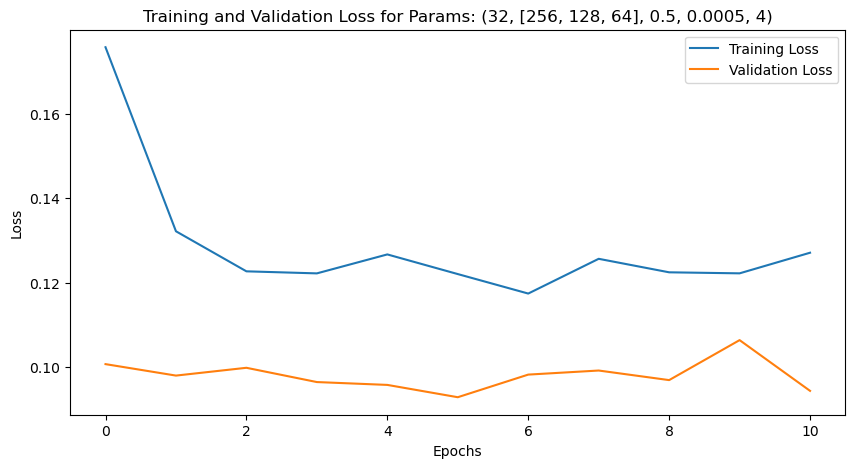

Training with params: (32, [256, 128, 64], 0.5, 0.0005, 8)


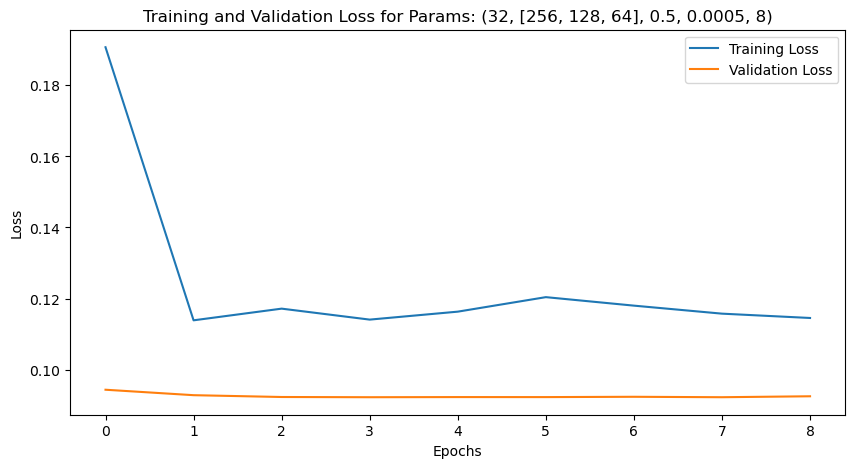

Training with params: (32, [256, 128, 64], 0.5, 0.0005, 12)


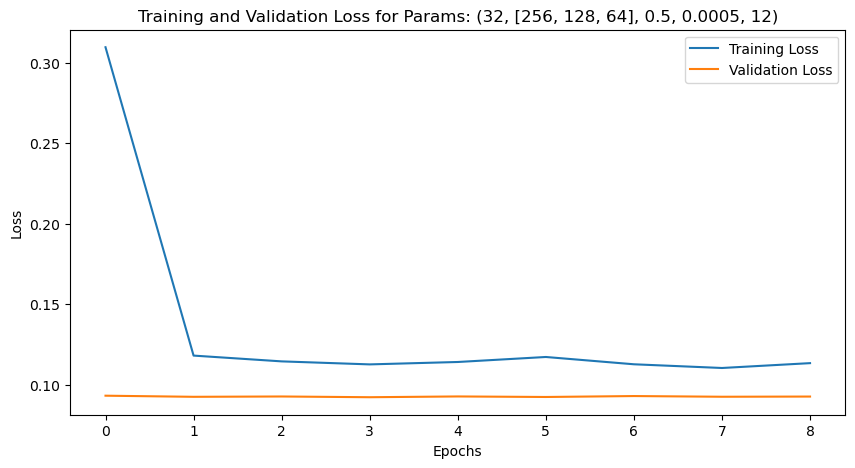

Training with params: (32, [256, 128, 64], 0.7, 5e-05, 4)


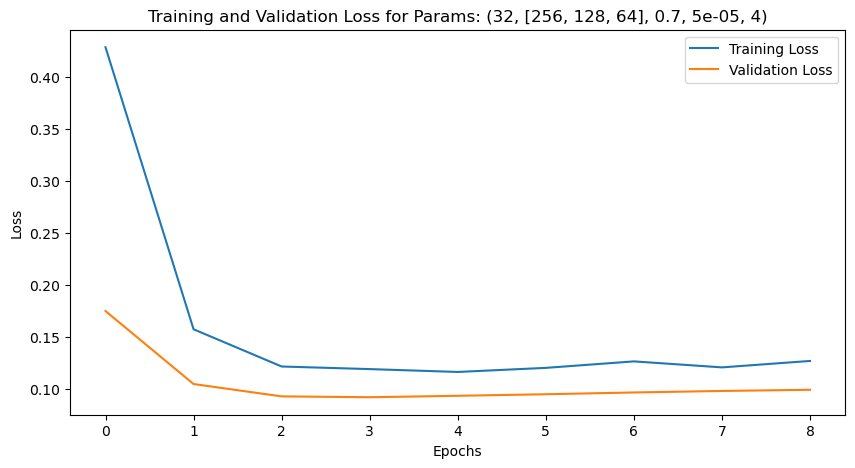

Training with params: (32, [256, 128, 64], 0.7, 5e-05, 8)


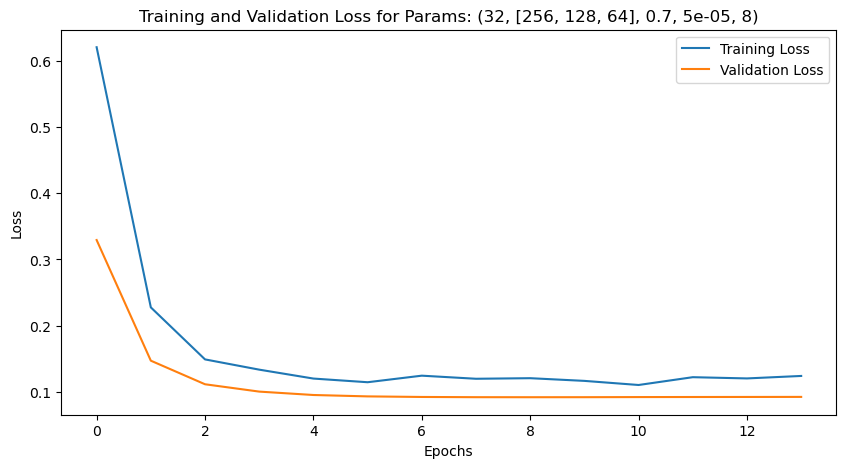

Training with params: (32, [256, 128, 64], 0.7, 5e-05, 12)


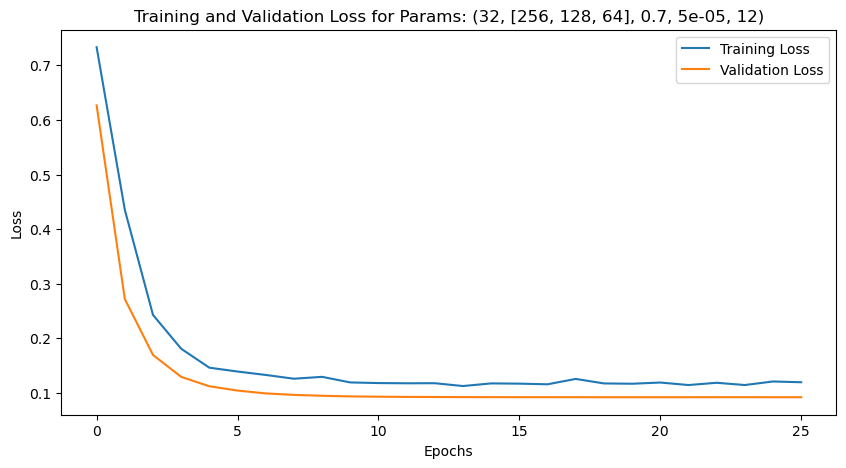

Training with params: (32, [256, 128, 64], 0.7, 0.0001, 4)


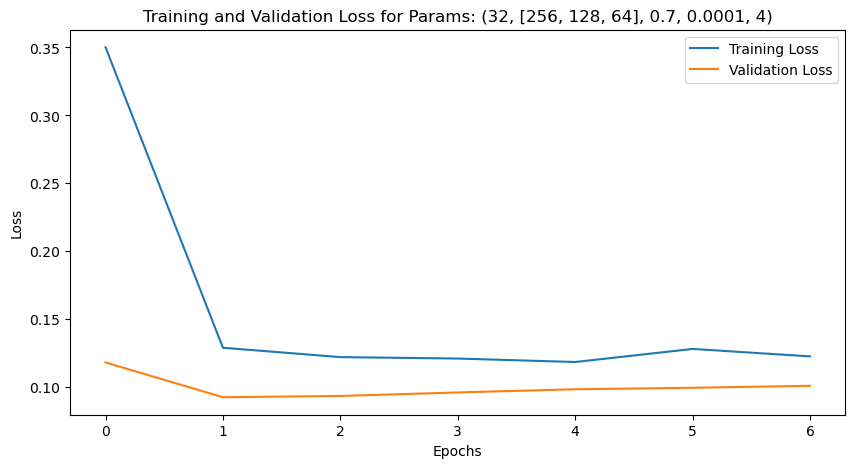

Training with params: (32, [256, 128, 64], 0.7, 0.0001, 8)


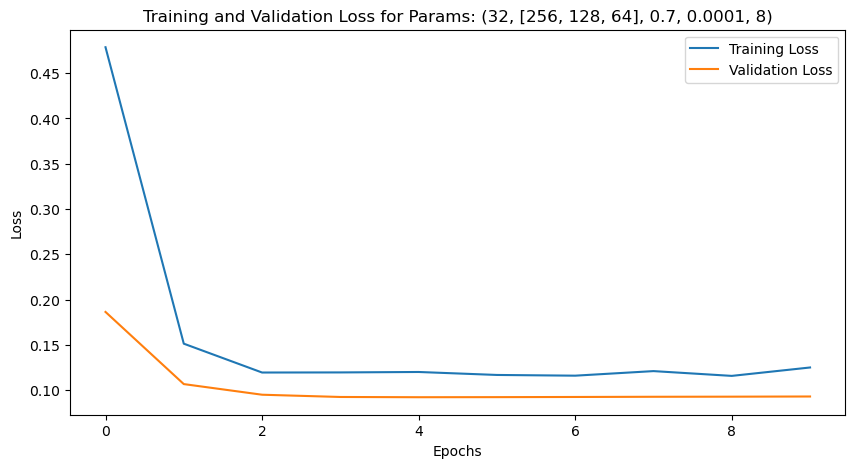

Training with params: (32, [256, 128, 64], 0.7, 0.0001, 12)


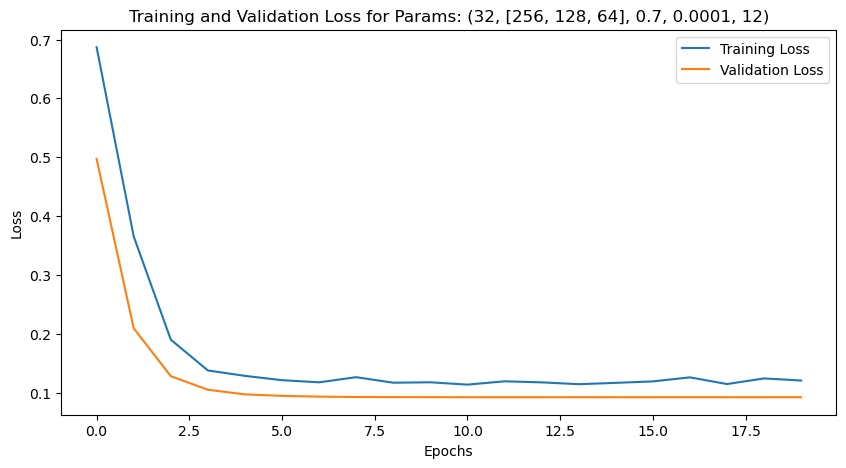

Training with params: (32, [256, 128, 64], 0.7, 0.0005, 4)


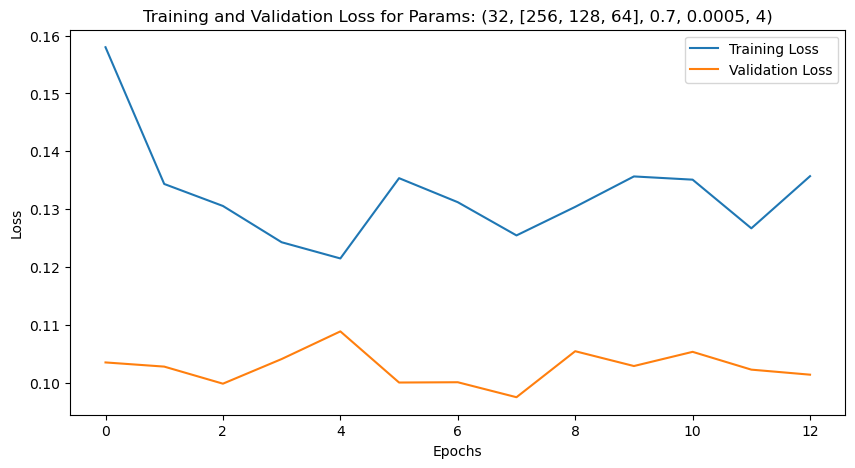

Training with params: (32, [256, 128, 64], 0.7, 0.0005, 8)


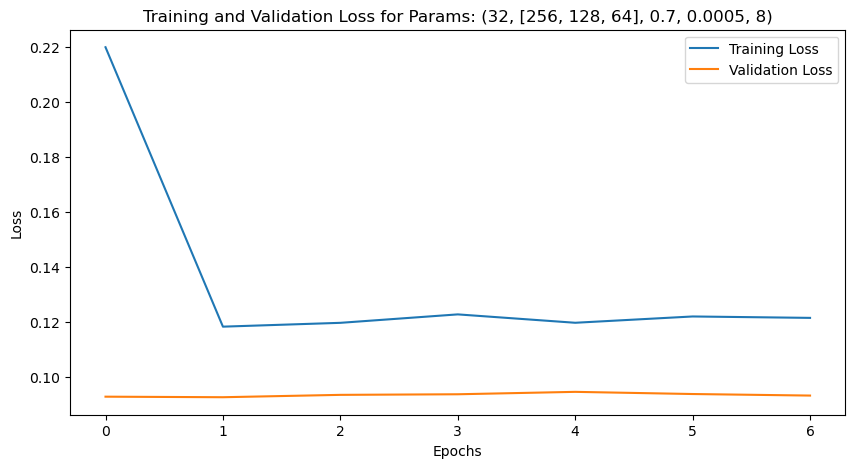

Training with params: (32, [256, 128, 64], 0.7, 0.0005, 12)


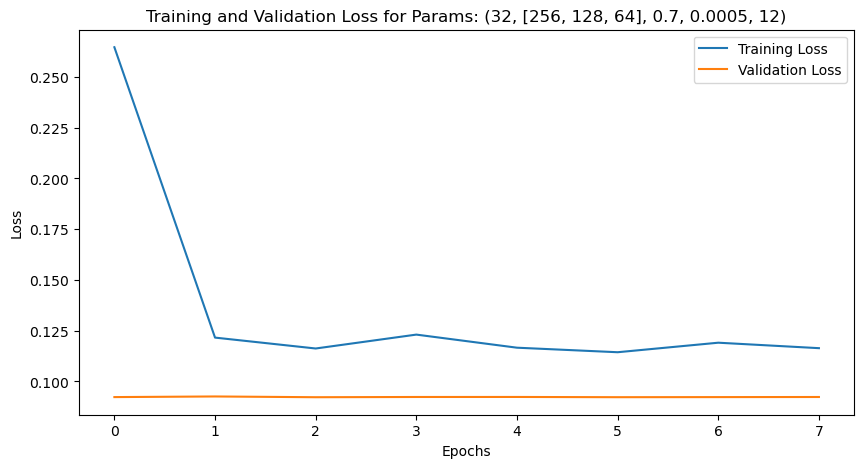

Training with params: (32, [256, 128, 32], 0.3, 5e-05, 4)


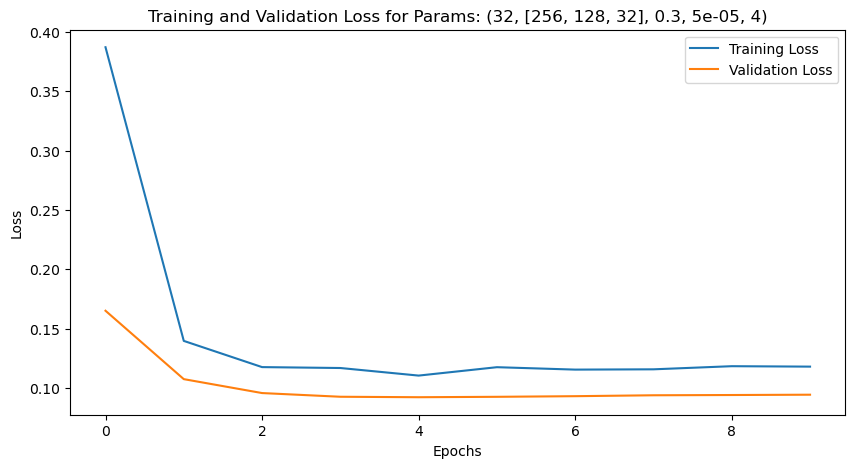

Training with params: (32, [256, 128, 32], 0.3, 5e-05, 8)


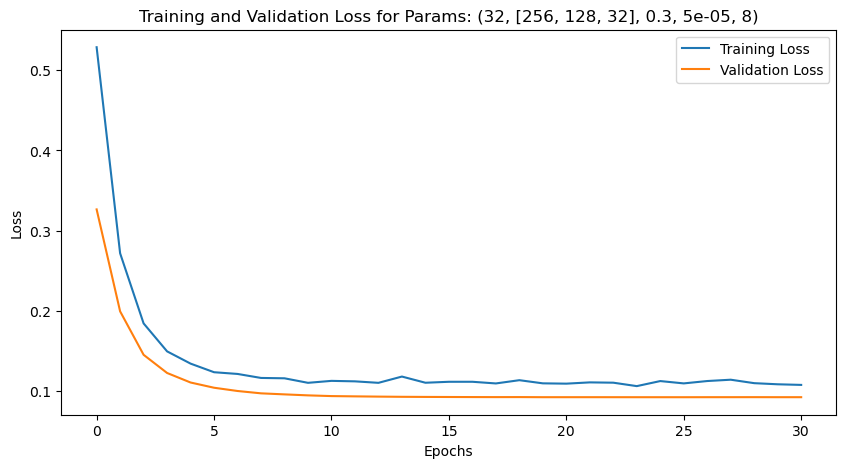

Training with params: (32, [256, 128, 32], 0.3, 5e-05, 12)


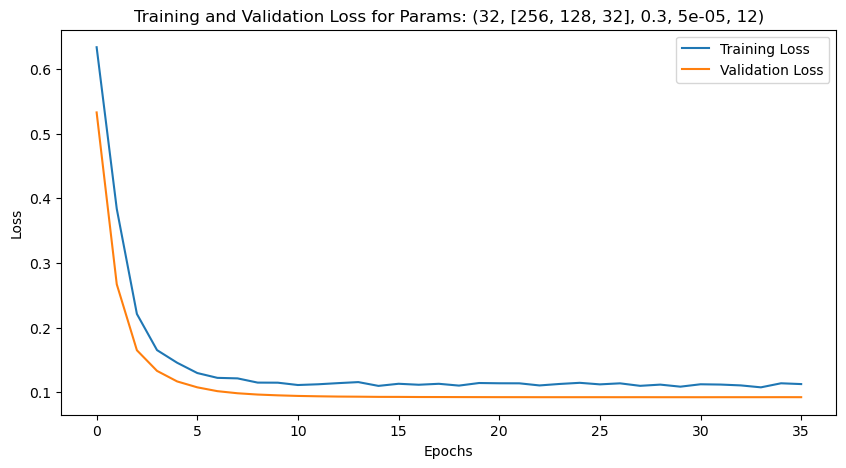

Training with params: (32, [256, 128, 32], 0.3, 0.0001, 4)


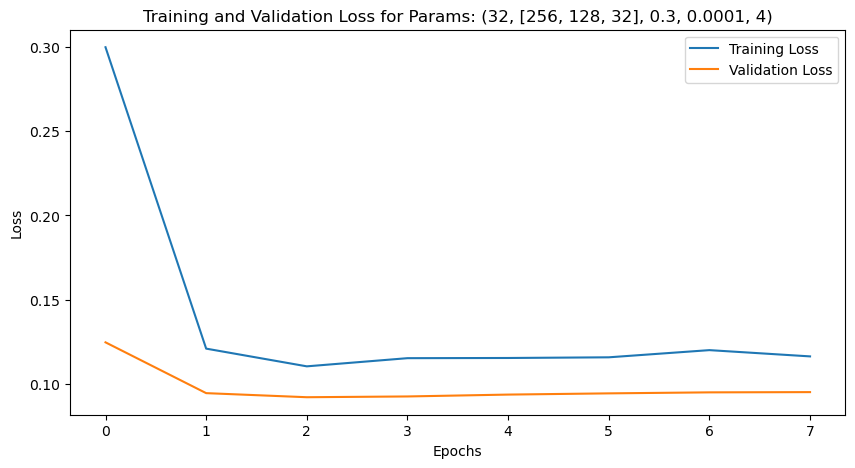

Training with params: (32, [256, 128, 32], 0.3, 0.0001, 8)


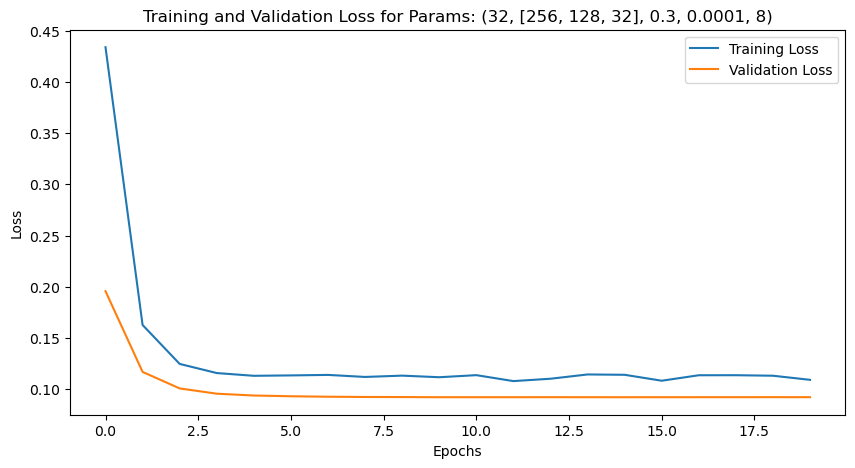

Training with params: (32, [256, 128, 32], 0.3, 0.0001, 12)


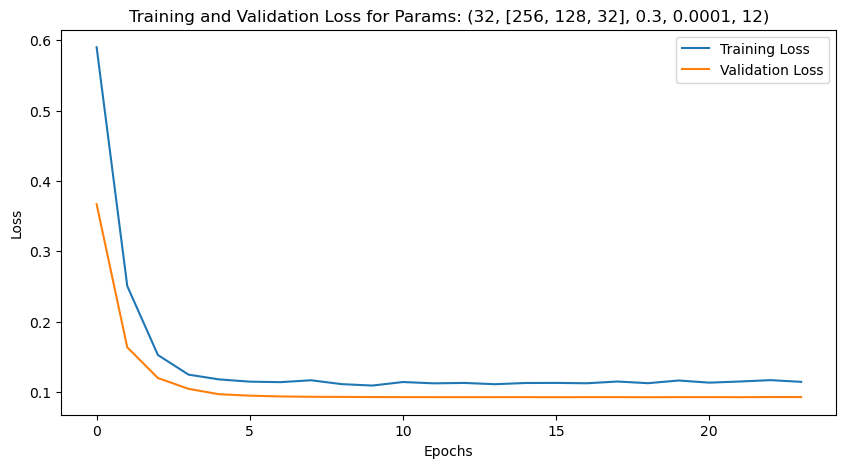

Training with params: (32, [256, 128, 32], 0.3, 0.0005, 4)


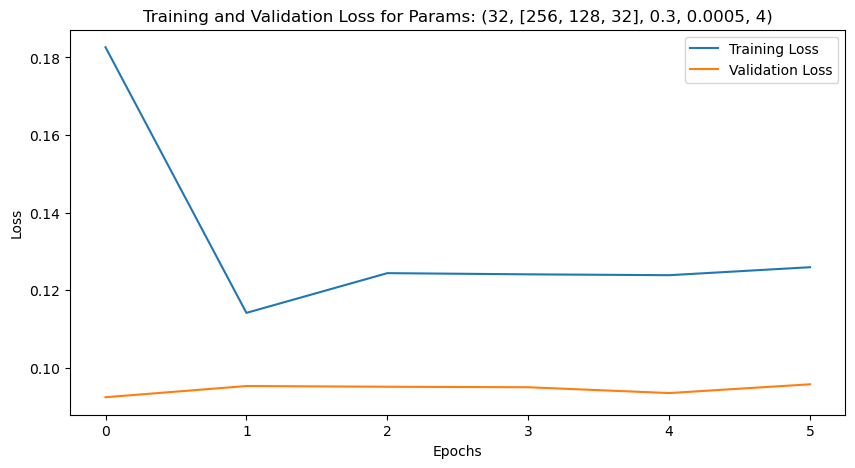

Training with params: (32, [256, 128, 32], 0.3, 0.0005, 8)


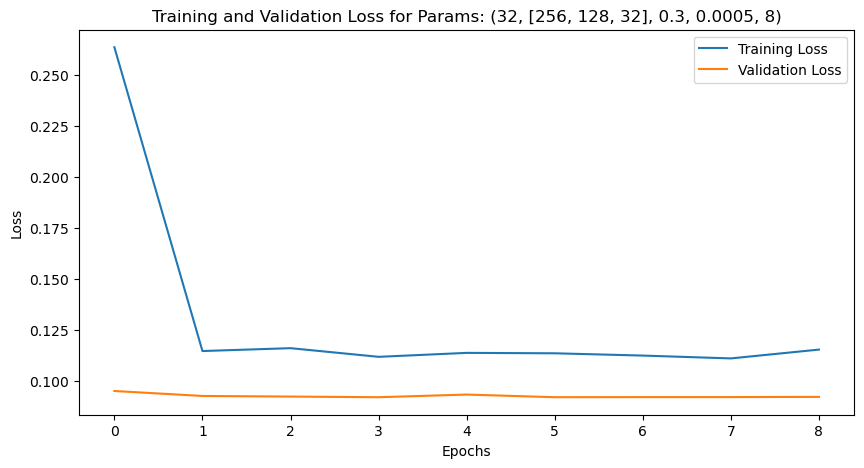

Training with params: (32, [256, 128, 32], 0.3, 0.0005, 12)


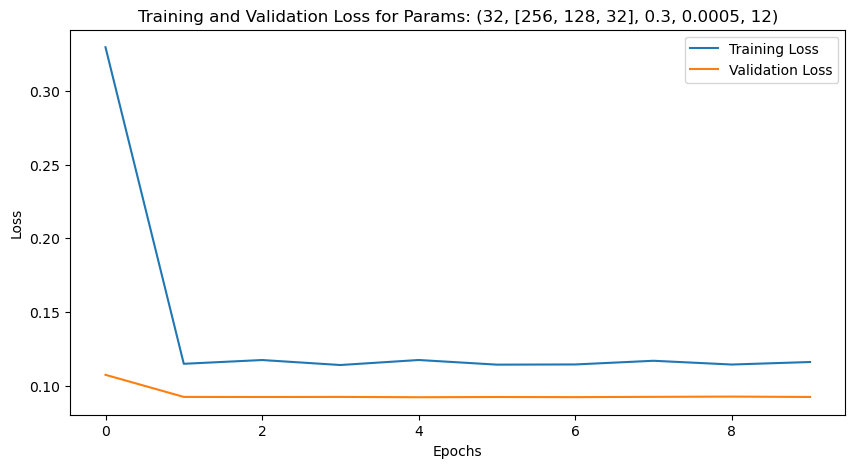

Training with params: (32, [256, 128, 32], 0.5, 5e-05, 4)


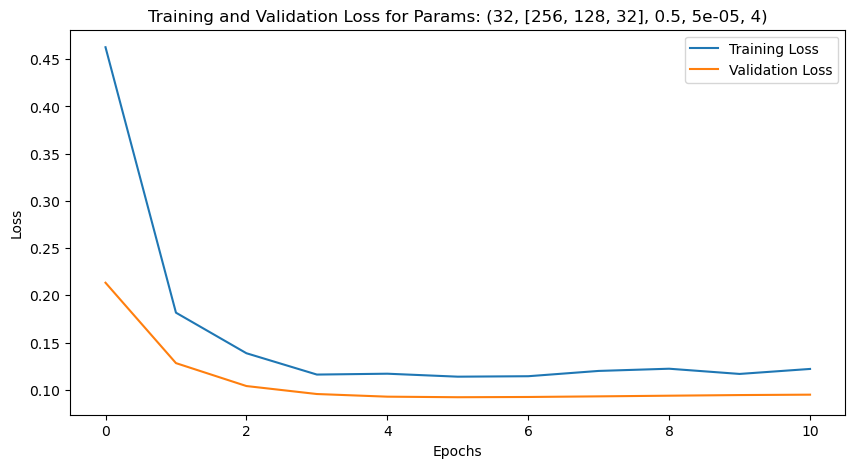

Training with params: (32, [256, 128, 32], 0.5, 5e-05, 8)


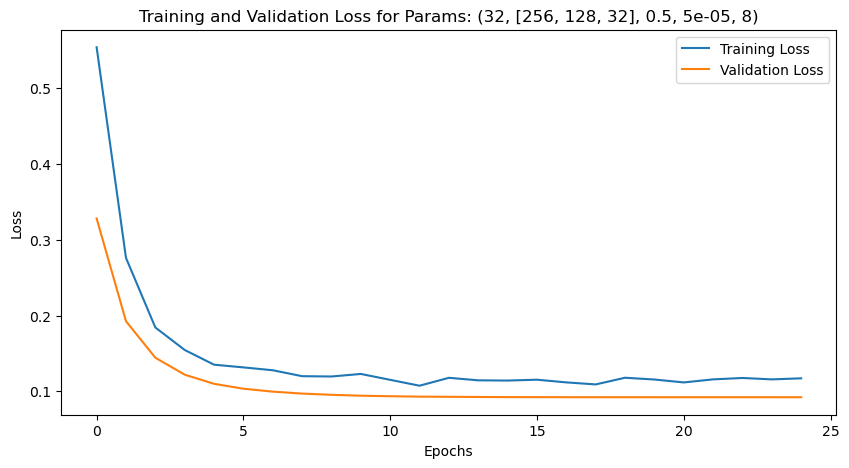

Training with params: (32, [256, 128, 32], 0.5, 5e-05, 12)


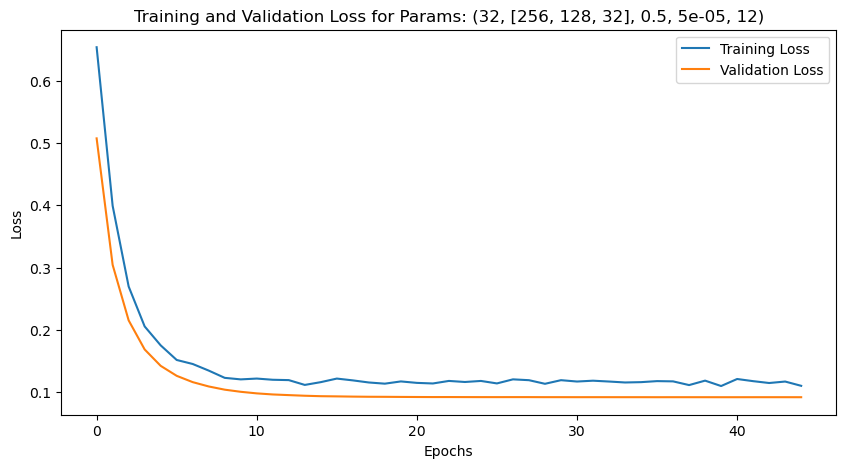

Training with params: (32, [256, 128, 32], 0.5, 0.0001, 4)


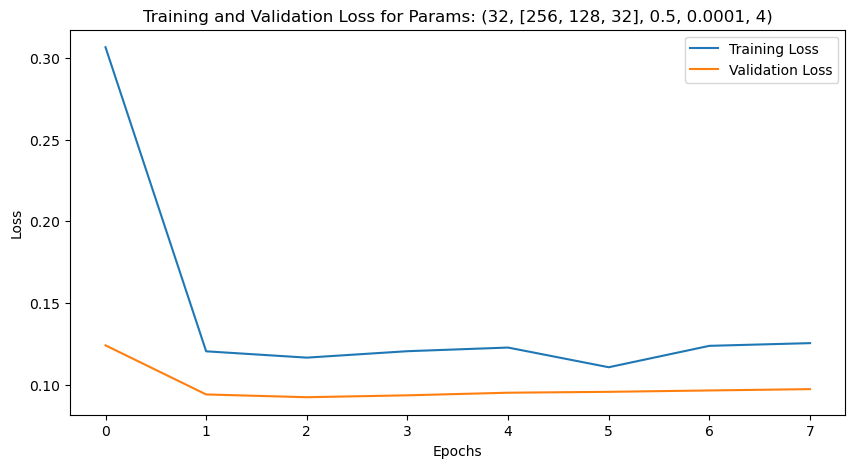

Training with params: (32, [256, 128, 32], 0.5, 0.0001, 8)


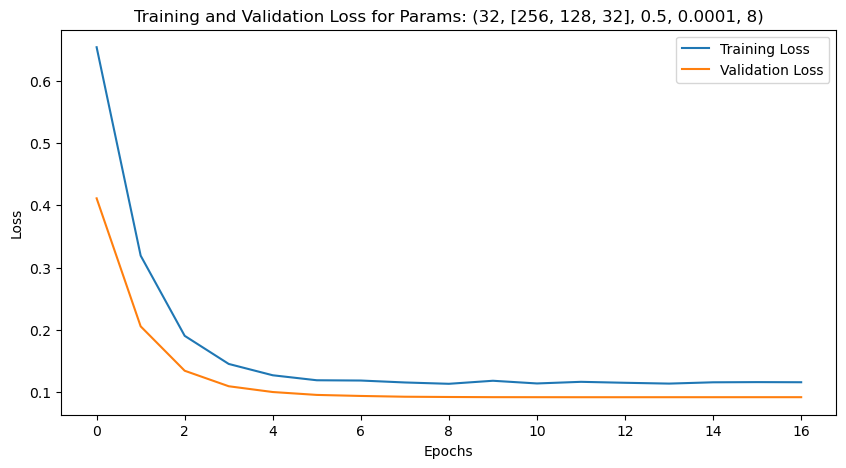

Training with params: (32, [256, 128, 32], 0.5, 0.0001, 12)


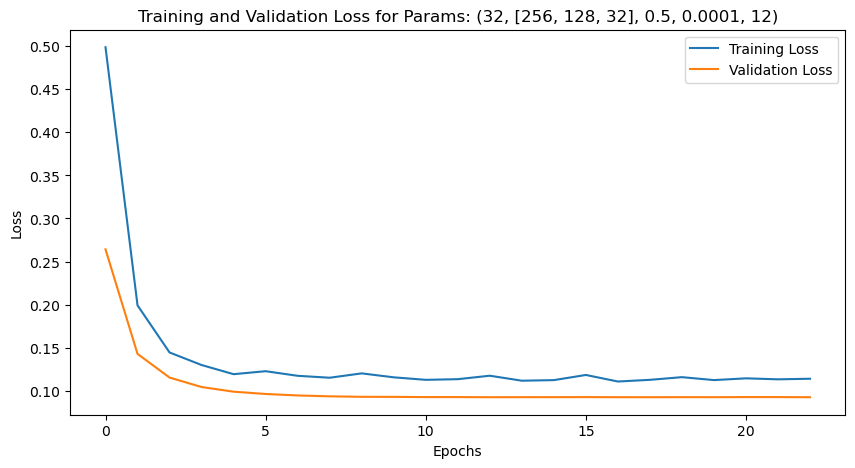

Training with params: (32, [256, 128, 32], 0.5, 0.0005, 4)


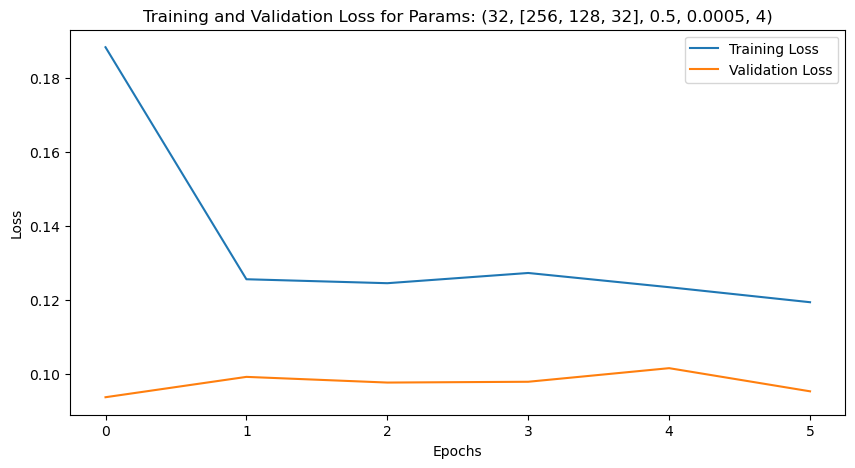

Training with params: (32, [256, 128, 32], 0.5, 0.0005, 8)


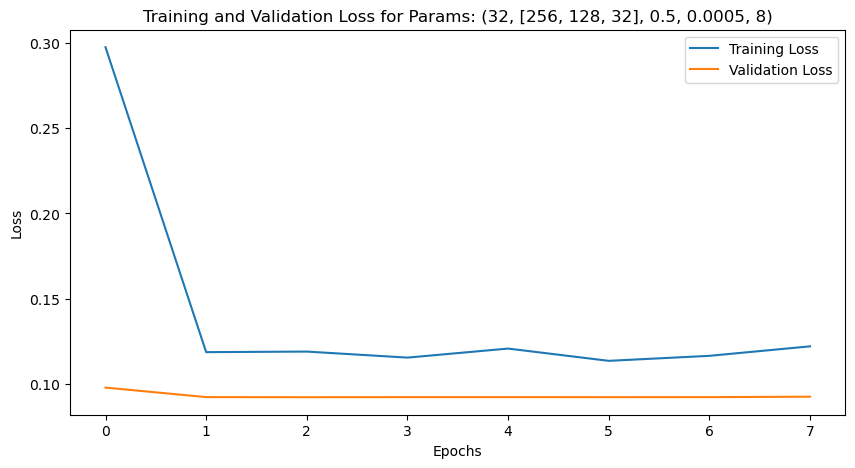

Training with params: (32, [256, 128, 32], 0.5, 0.0005, 12)


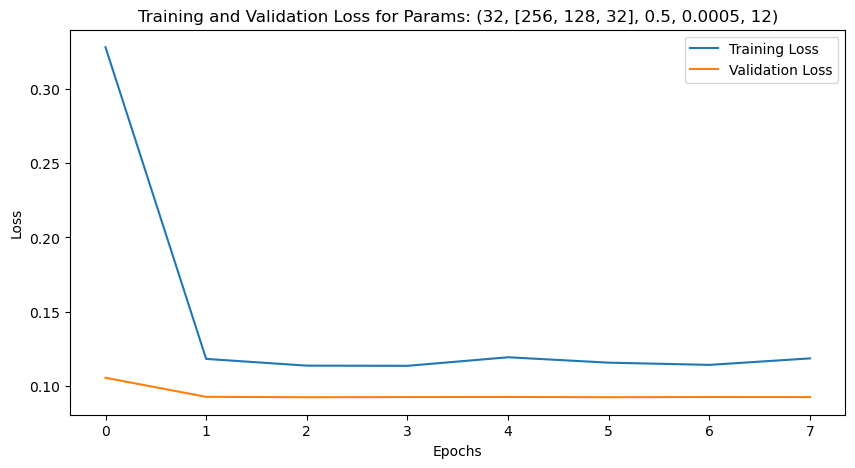

Training with params: (32, [256, 128, 32], 0.7, 5e-05, 4)


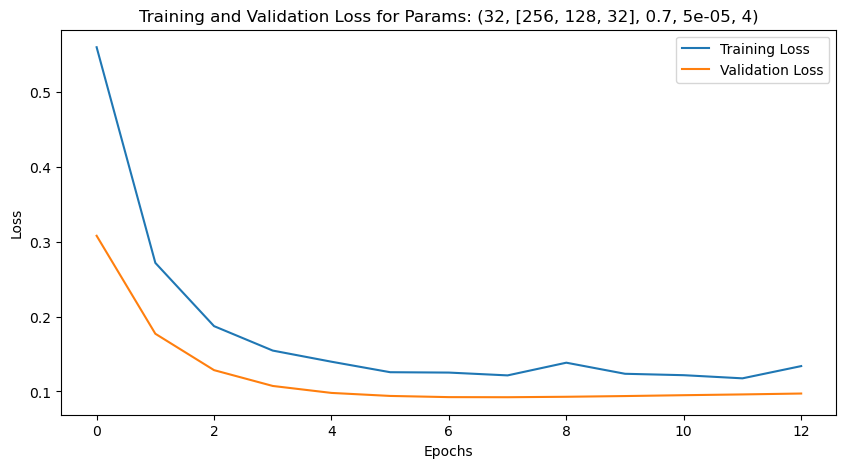

Training with params: (32, [256, 128, 32], 0.7, 5e-05, 8)


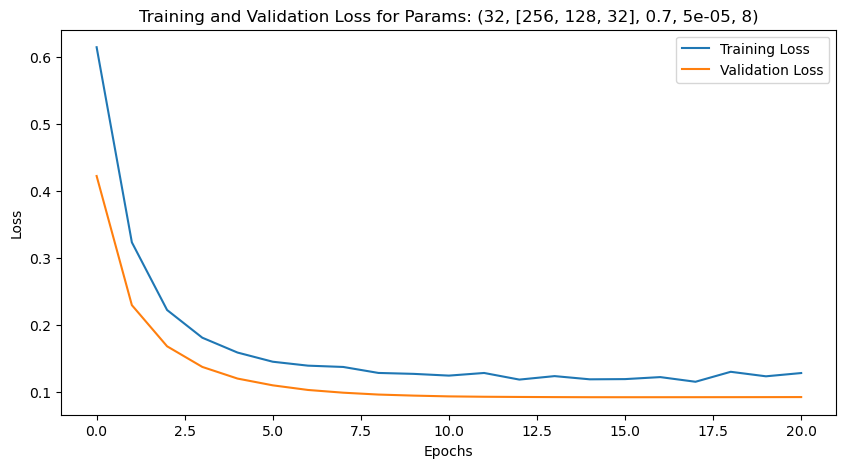

Training with params: (32, [256, 128, 32], 0.7, 5e-05, 12)


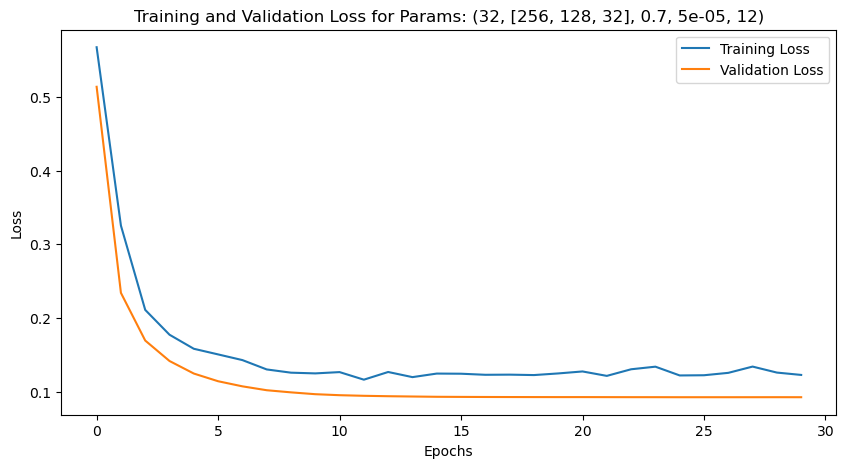

Training with params: (32, [256, 128, 32], 0.7, 0.0001, 4)


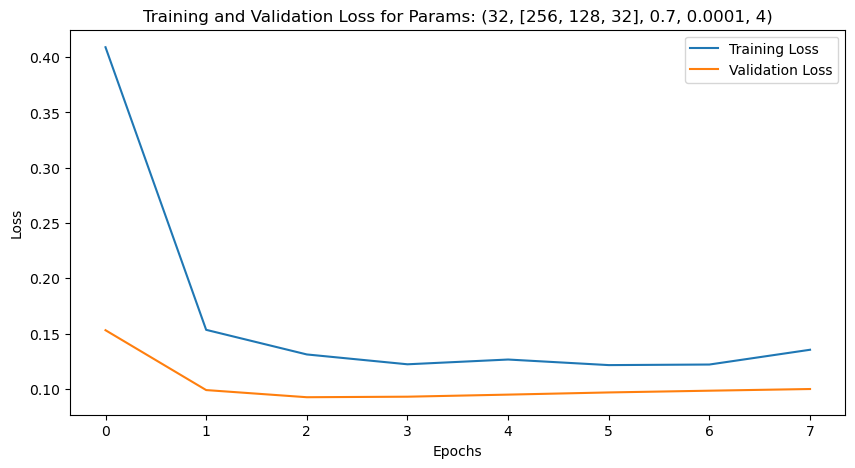

Training with params: (32, [256, 128, 32], 0.7, 0.0001, 8)


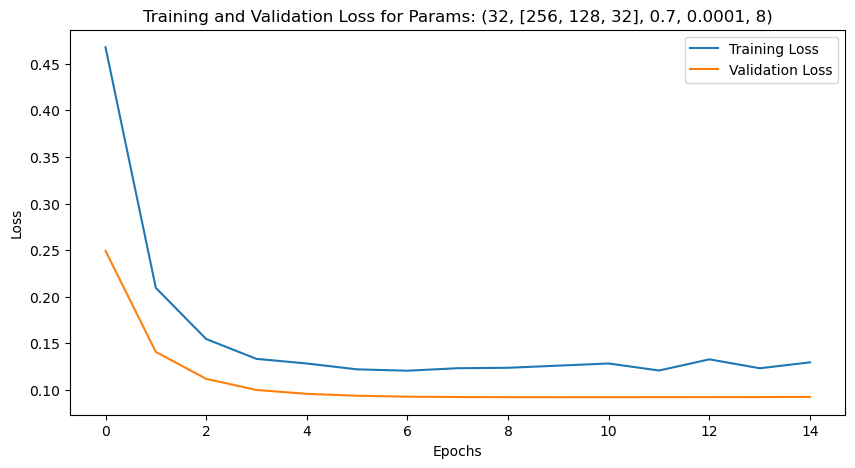

Training with params: (32, [256, 128, 32], 0.7, 0.0001, 12)


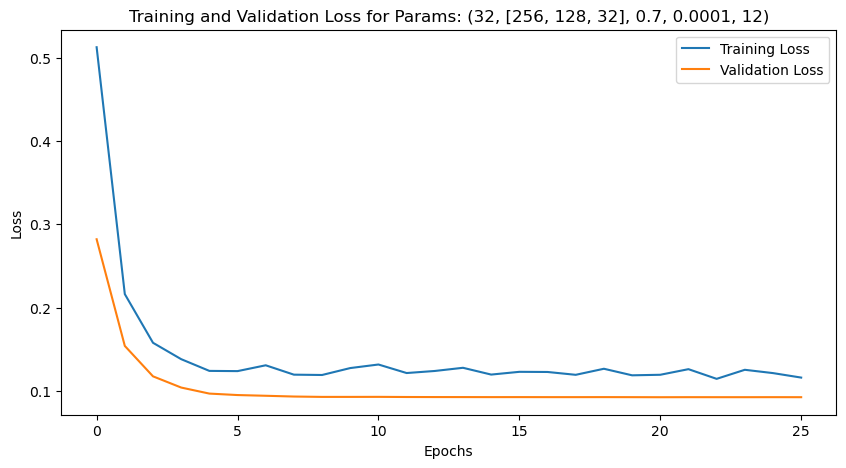

Training with params: (32, [256, 128, 32], 0.7, 0.0005, 4)


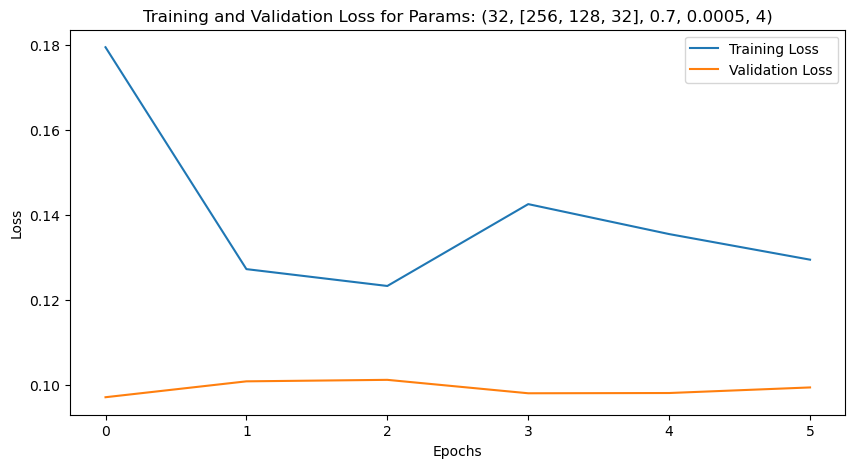

Training with params: (32, [256, 128, 32], 0.7, 0.0005, 8)


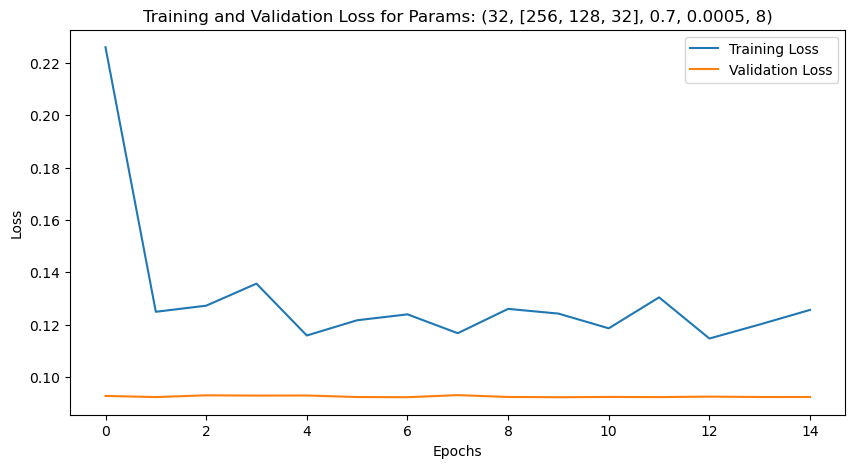

Training with params: (32, [256, 128, 32], 0.7, 0.0005, 12)


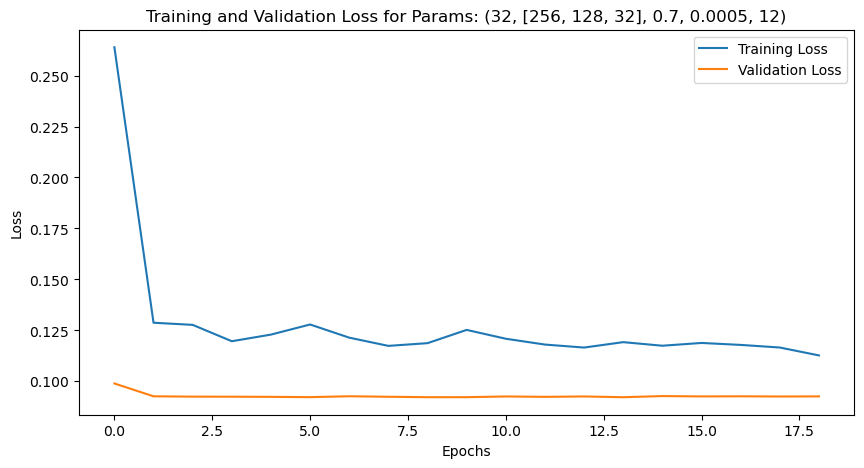

Training with params: (64, [32, 16], 0.3, 5e-05, 4)


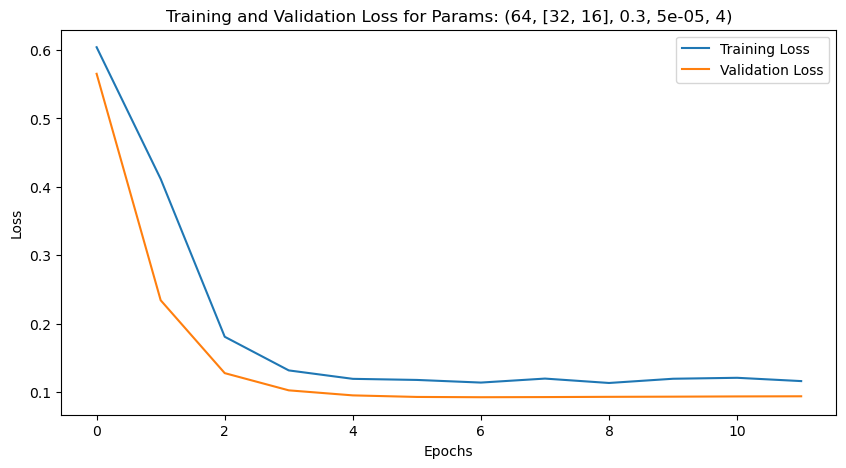

Training with params: (64, [32, 16], 0.3, 5e-05, 8)


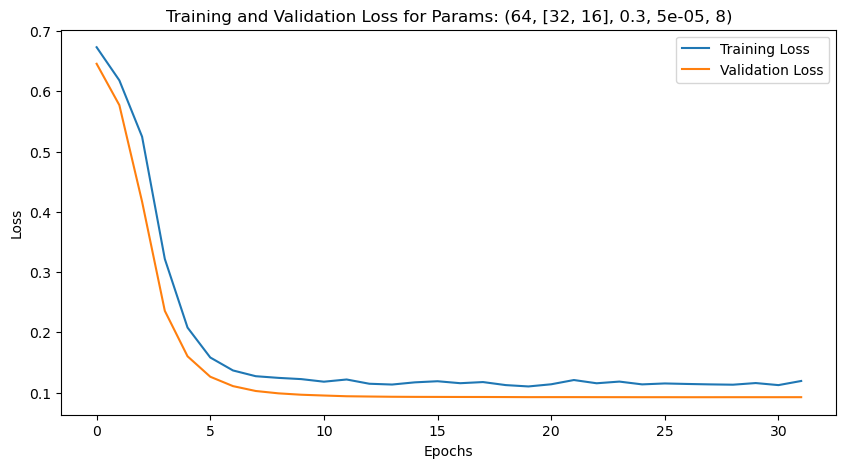

Training with params: (64, [32, 16], 0.3, 5e-05, 12)


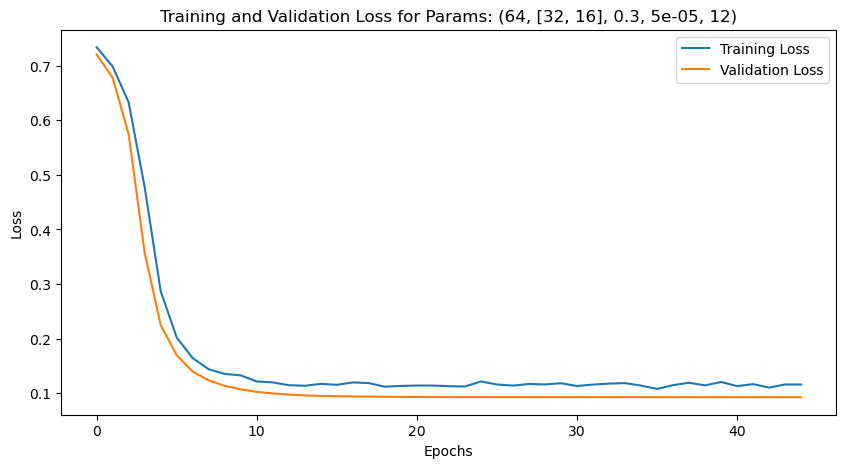

Training with params: (64, [32, 16], 0.3, 0.0001, 4)


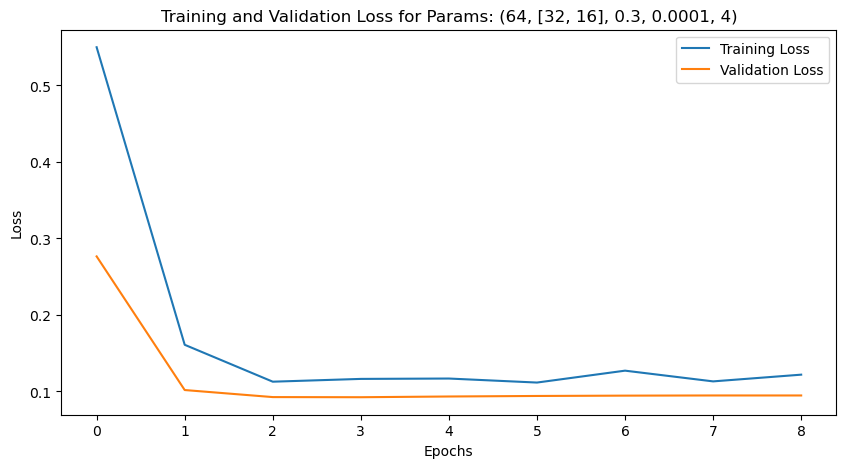

Training with params: (64, [32, 16], 0.3, 0.0001, 8)


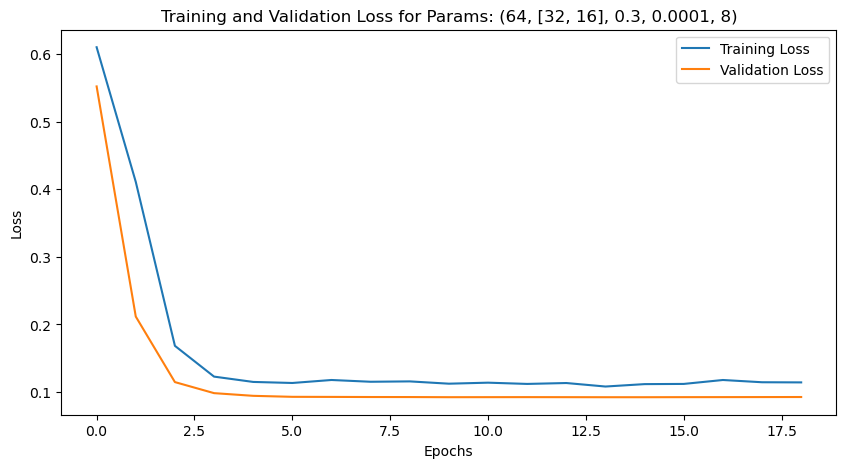

Training with params: (64, [32, 16], 0.3, 0.0001, 12)


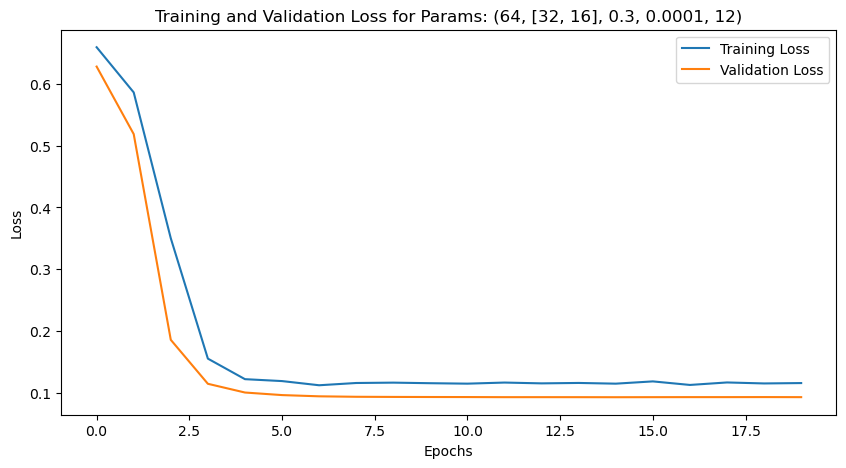

Training with params: (64, [32, 16], 0.3, 0.0005, 4)


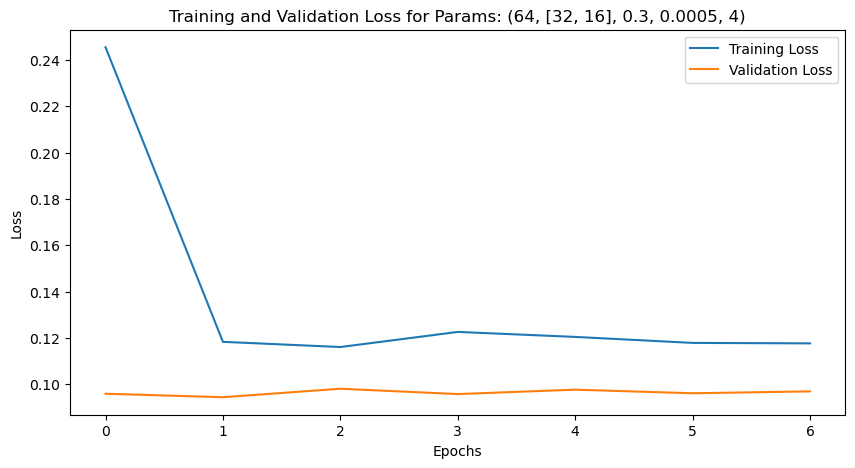

Training with params: (64, [32, 16], 0.3, 0.0005, 8)


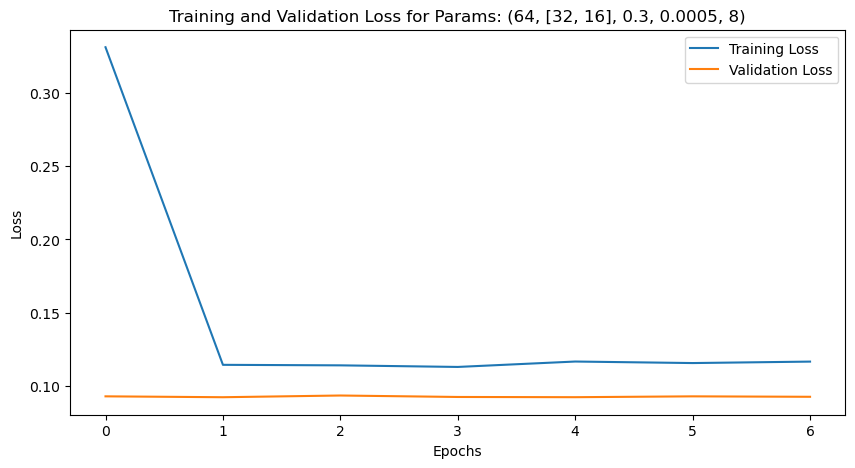

Training with params: (64, [32, 16], 0.3, 0.0005, 12)


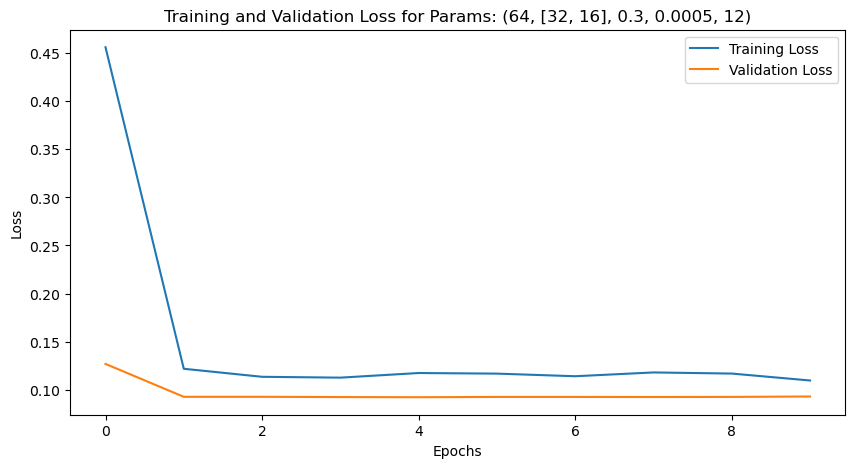

Training with params: (64, [32, 16], 0.5, 5e-05, 4)


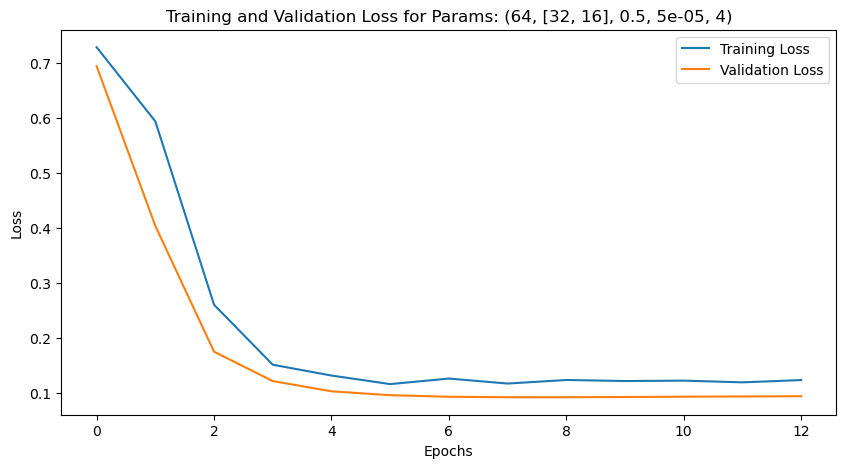

Training with params: (64, [32, 16], 0.5, 5e-05, 8)


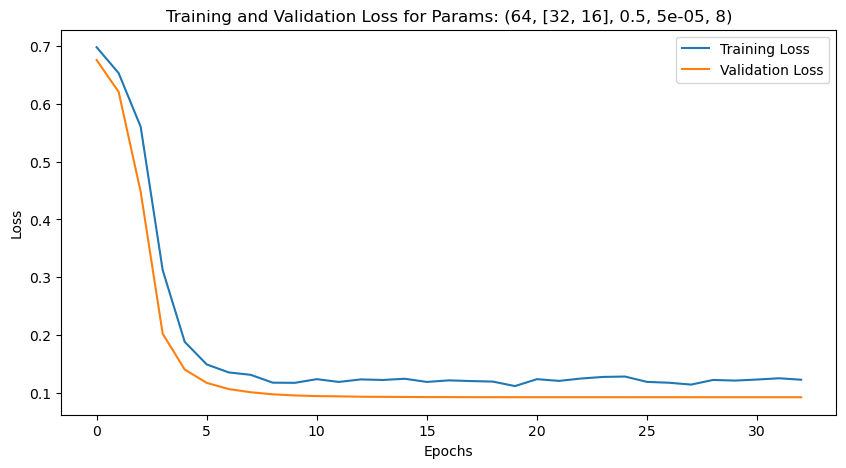

Training with params: (64, [32, 16], 0.5, 5e-05, 12)


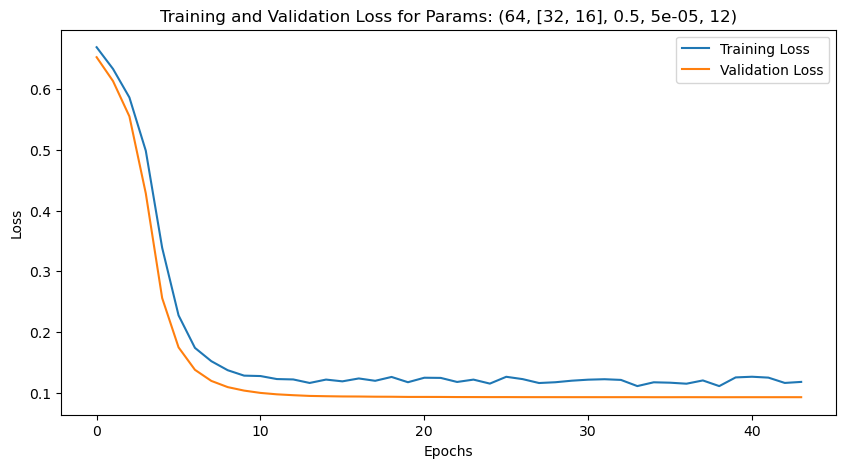

Training with params: (64, [32, 16], 0.5, 0.0001, 4)


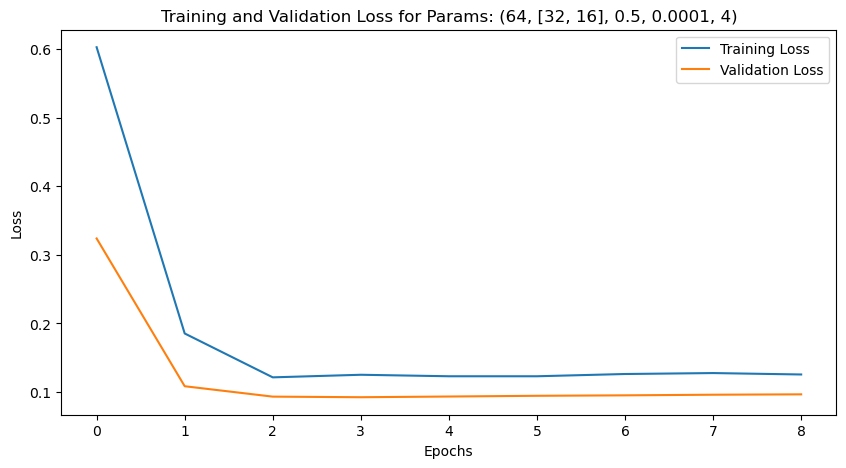

Training with params: (64, [32, 16], 0.5, 0.0001, 8)


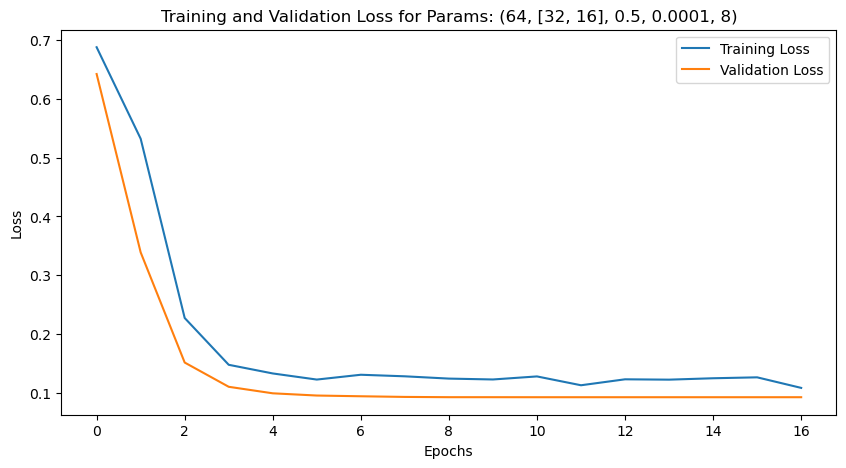

New best params found: (64, [32, 16], 0.5, 0.0001, 8), Validation Loss: 0.09221123158931732
Training with params: (64, [32, 16], 0.5, 0.0001, 12)


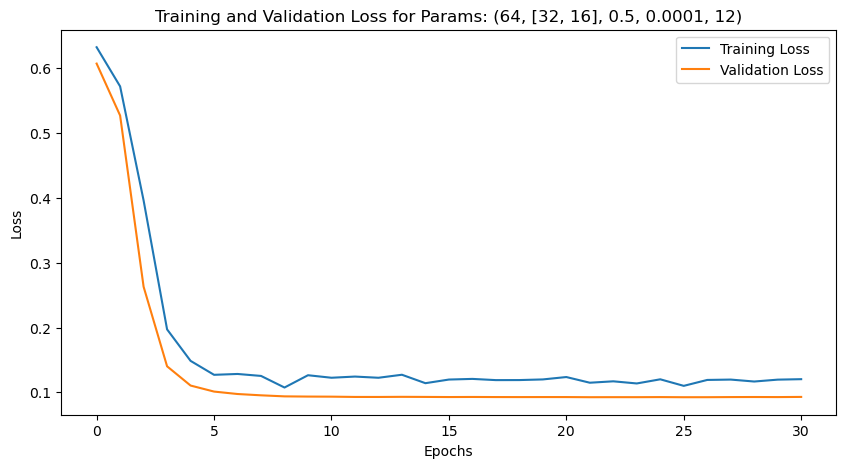

Training with params: (64, [32, 16], 0.5, 0.0005, 4)


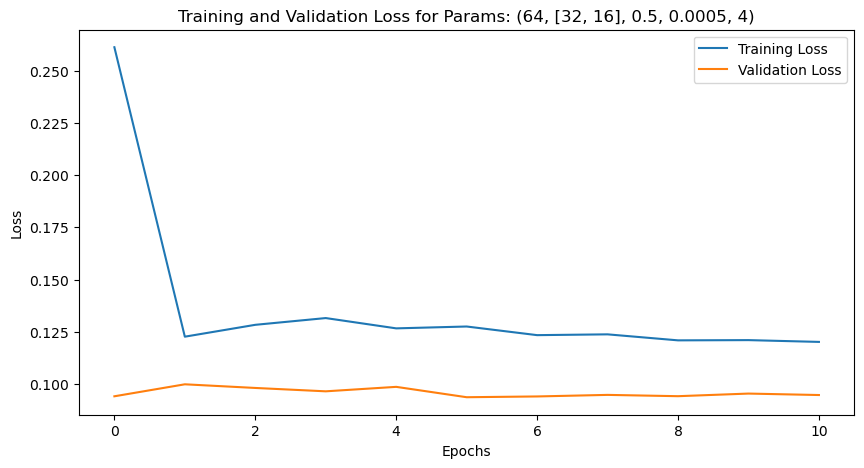

Training with params: (64, [32, 16], 0.5, 0.0005, 8)


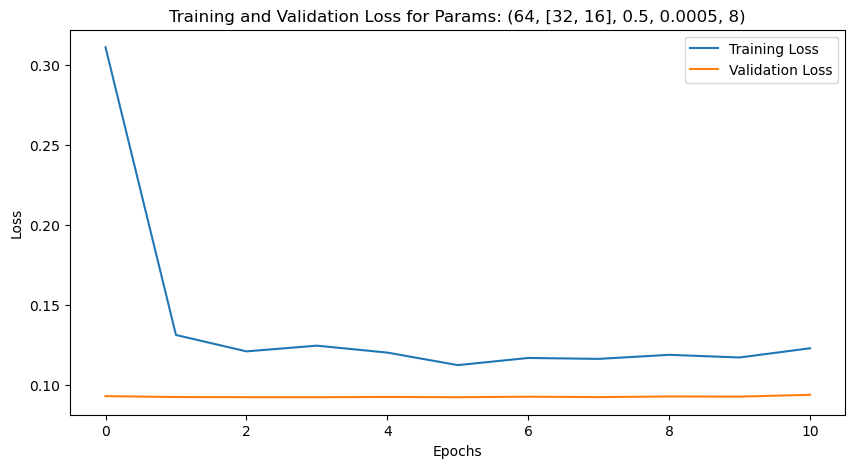

Training with params: (64, [32, 16], 0.5, 0.0005, 12)


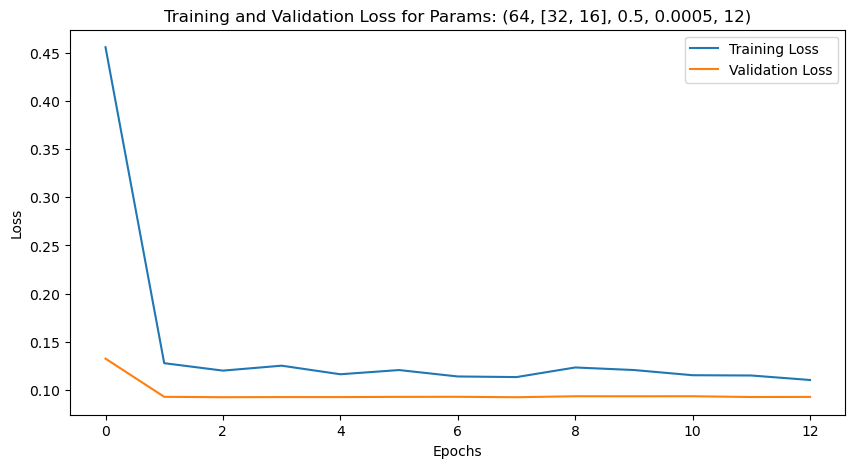

New best params found: (64, [32, 16], 0.5, 0.0005, 12), Validation Loss: 0.09220869094133377
Training with params: (64, [32, 16], 0.7, 5e-05, 4)


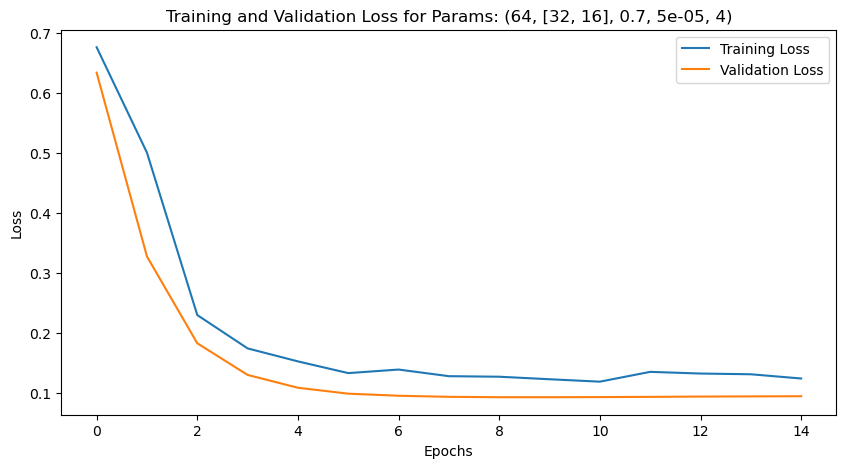

Training with params: (64, [32, 16], 0.7, 5e-05, 8)


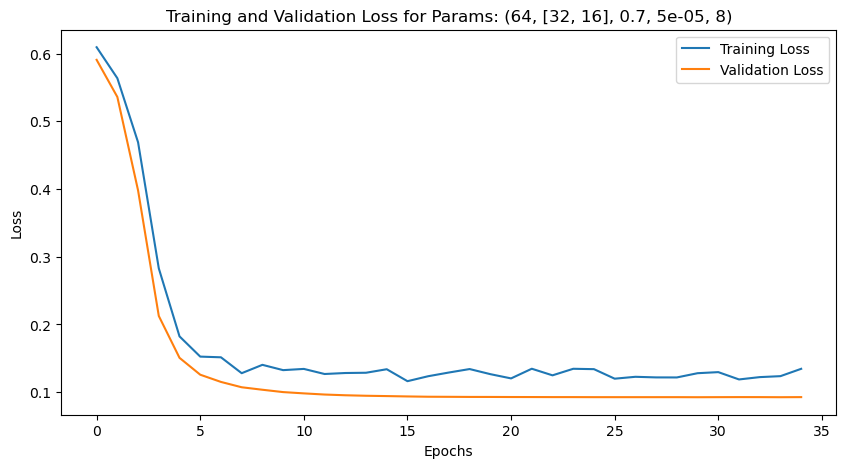

Training with params: (64, [32, 16], 0.7, 5e-05, 12)


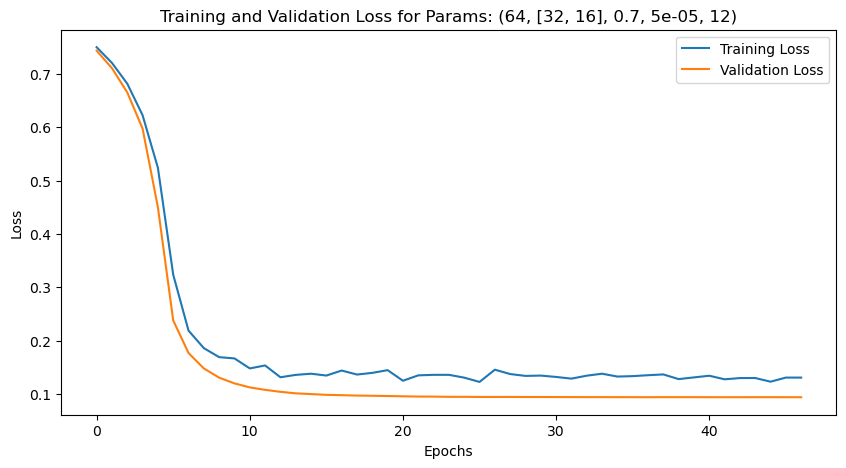

Training with params: (64, [32, 16], 0.7, 0.0001, 4)


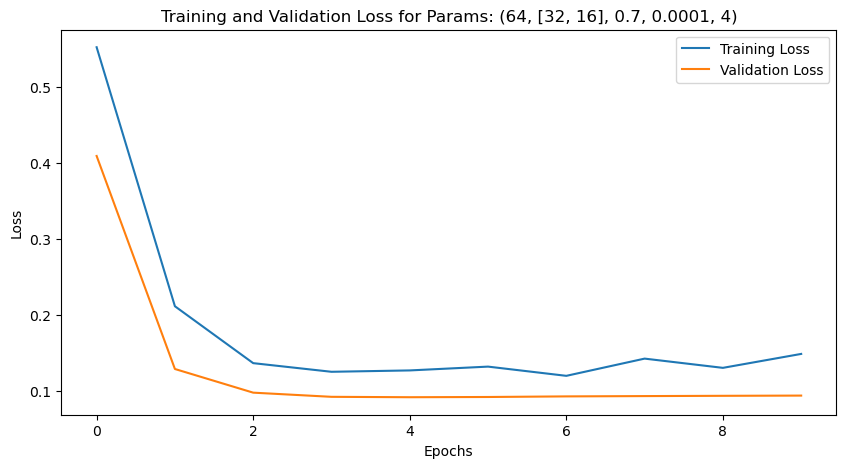

Training with params: (64, [32, 16], 0.7, 0.0001, 8)


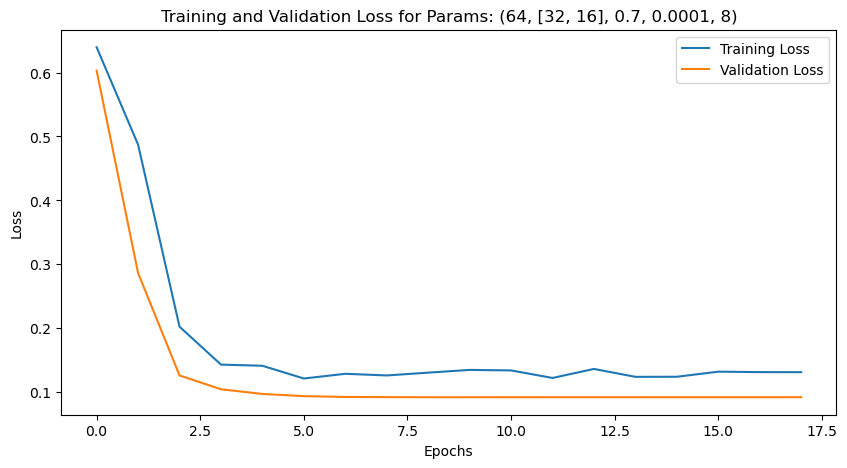

Training with params: (64, [32, 16], 0.7, 0.0001, 12)


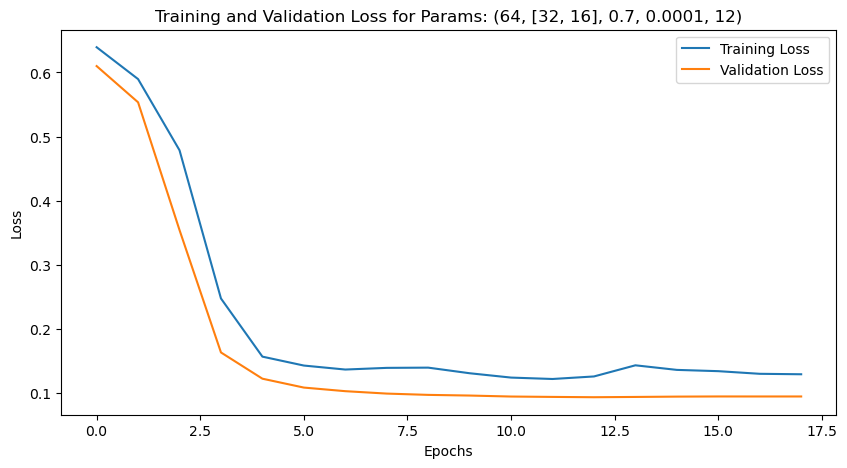

Training with params: (64, [32, 16], 0.7, 0.0005, 4)


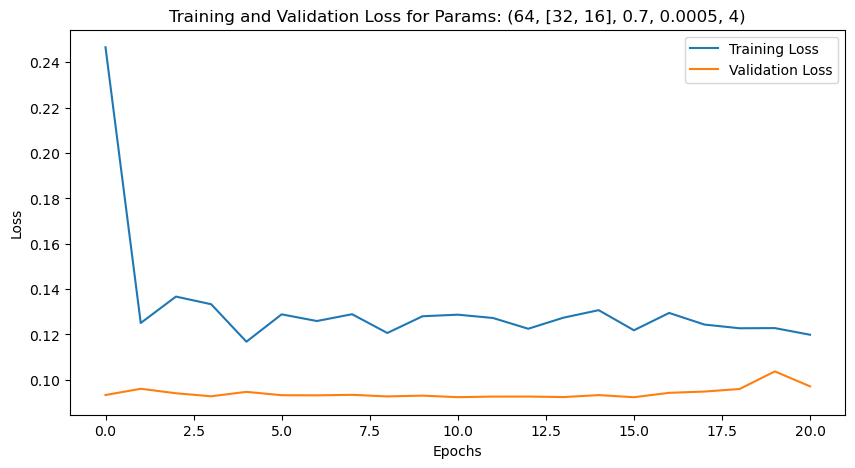

Training with params: (64, [32, 16], 0.7, 0.0005, 8)


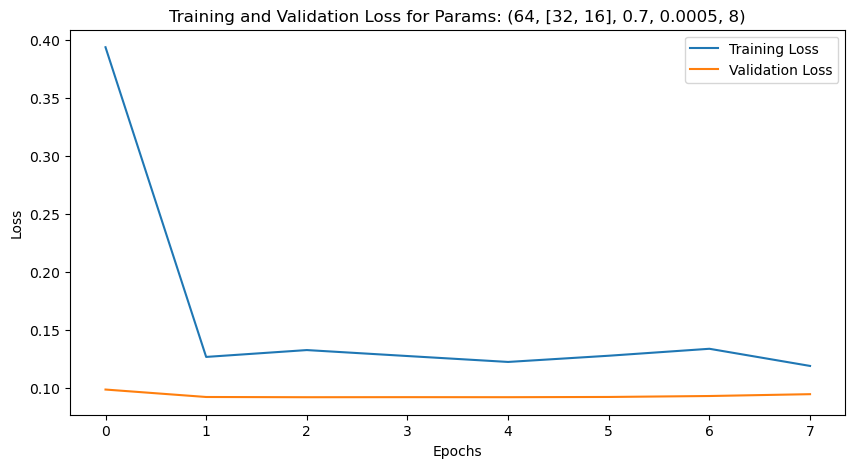

Training with params: (64, [32, 16], 0.7, 0.0005, 12)


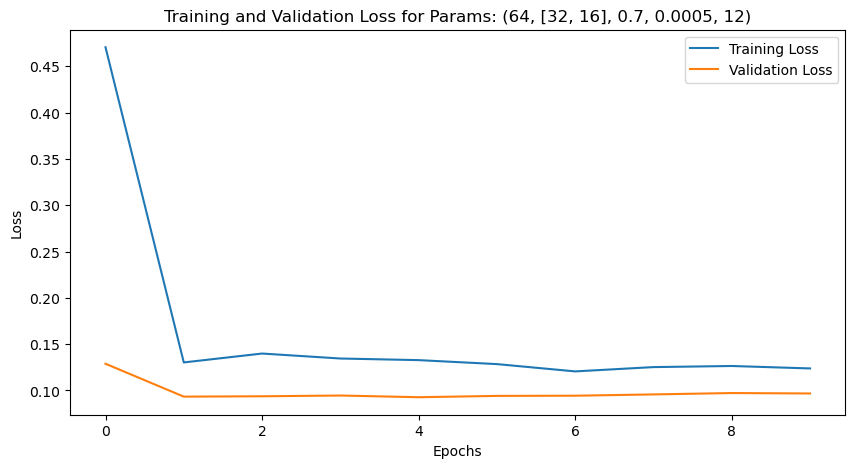

Training with params: (64, [64, 32], 0.3, 5e-05, 4)


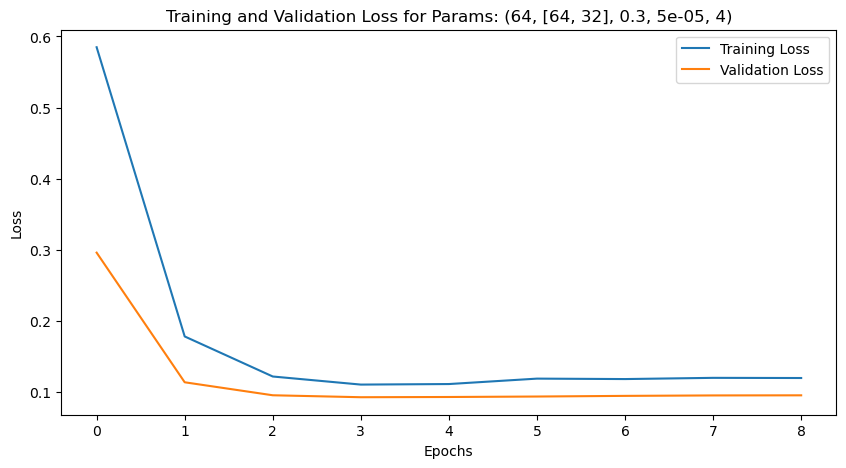

Training with params: (64, [64, 32], 0.3, 5e-05, 8)


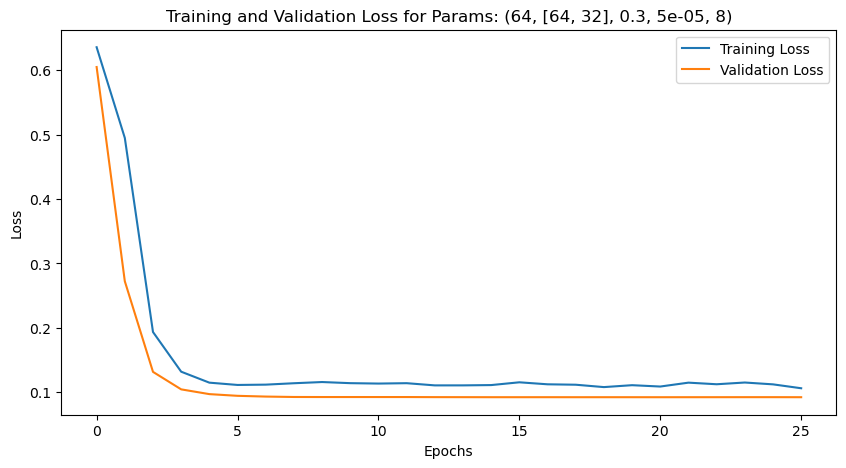

Training with params: (64, [64, 32], 0.3, 5e-05, 12)


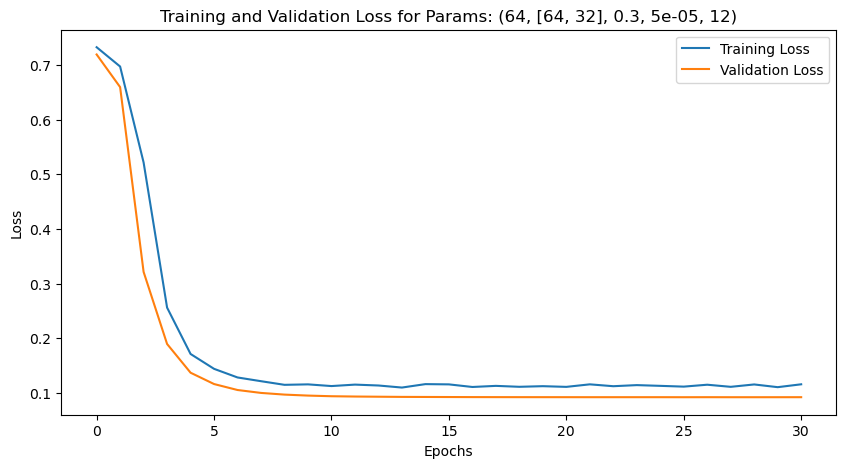

Training with params: (64, [64, 32], 0.3, 0.0001, 4)


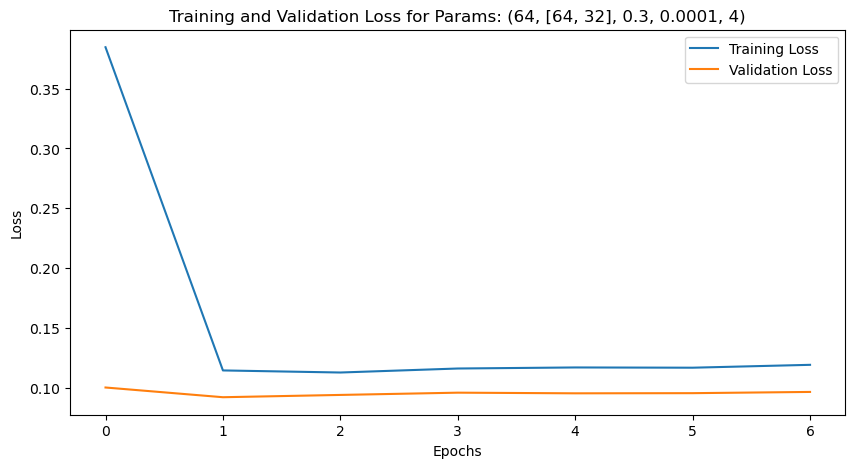

Training with params: (64, [64, 32], 0.3, 0.0001, 8)


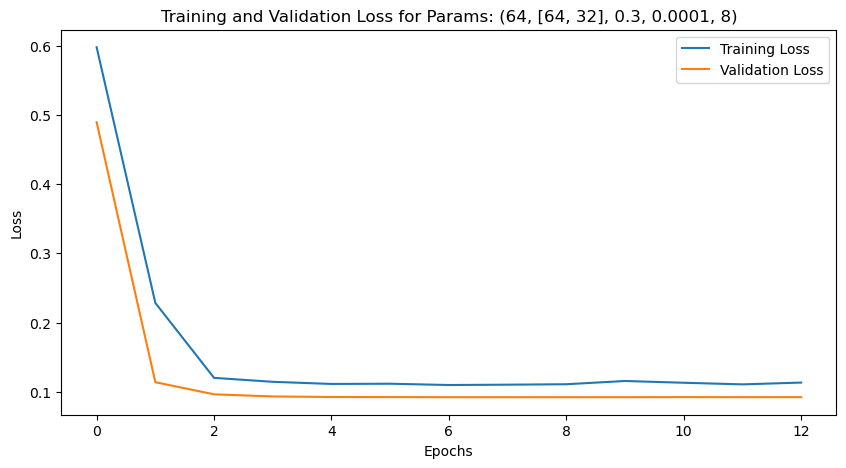

Training with params: (64, [64, 32], 0.3, 0.0001, 12)


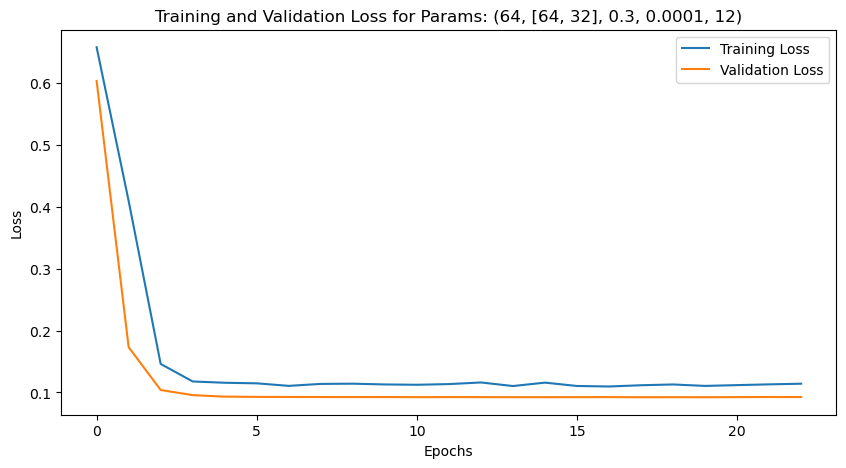

Training with params: (64, [64, 32], 0.3, 0.0005, 4)


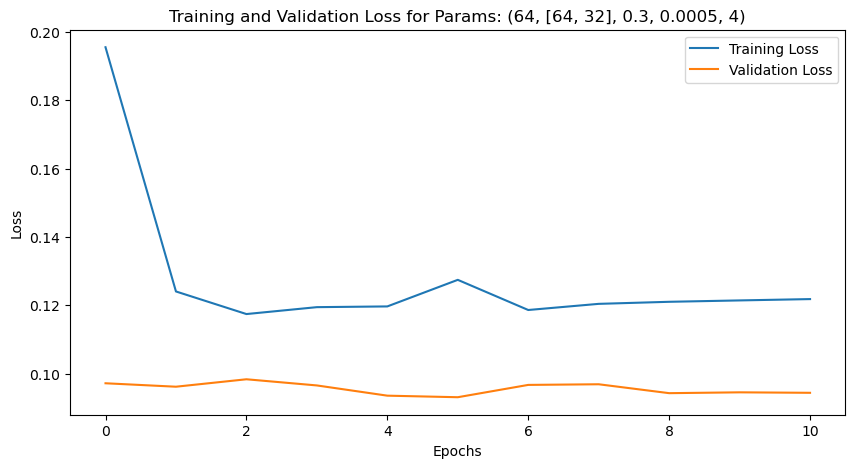

Training with params: (64, [64, 32], 0.3, 0.0005, 8)


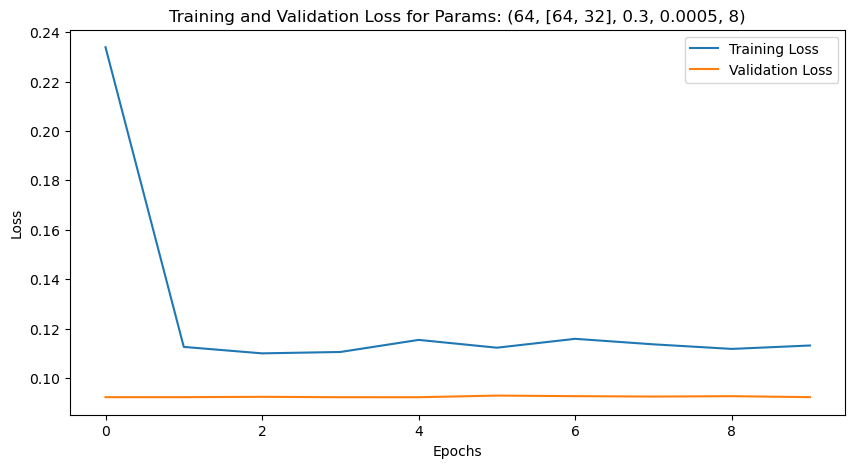

Training with params: (64, [64, 32], 0.3, 0.0005, 12)


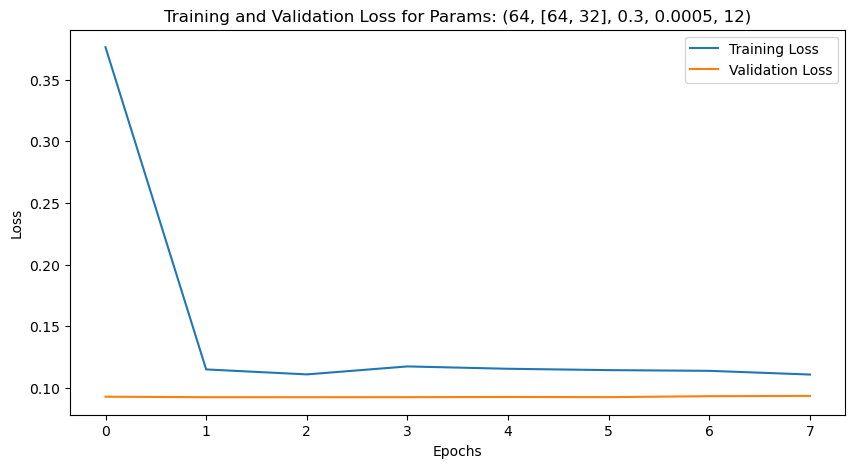

Training with params: (64, [64, 32], 0.5, 5e-05, 4)


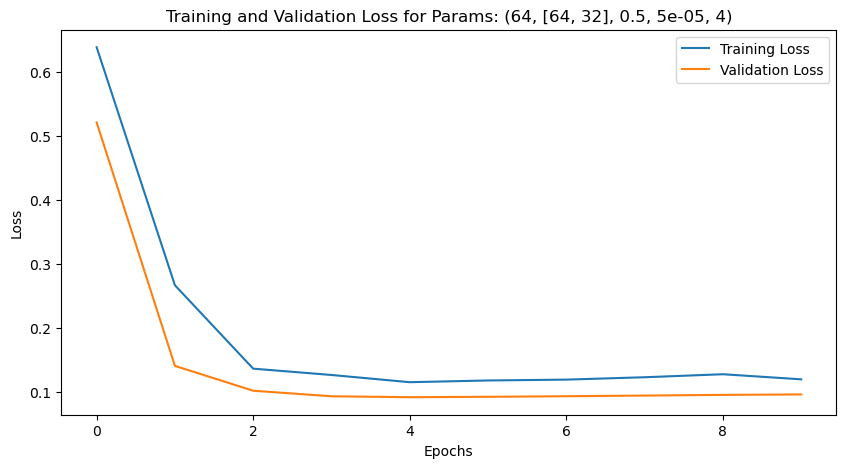

Training with params: (64, [64, 32], 0.5, 5e-05, 8)


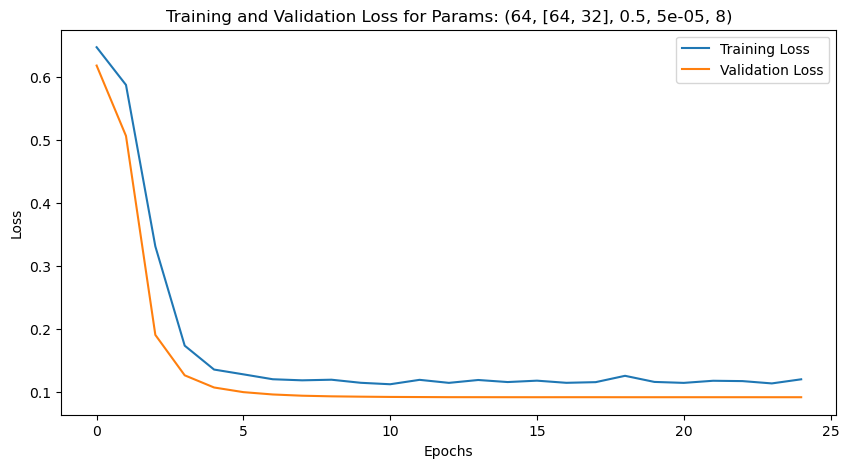

Training with params: (64, [64, 32], 0.5, 5e-05, 12)


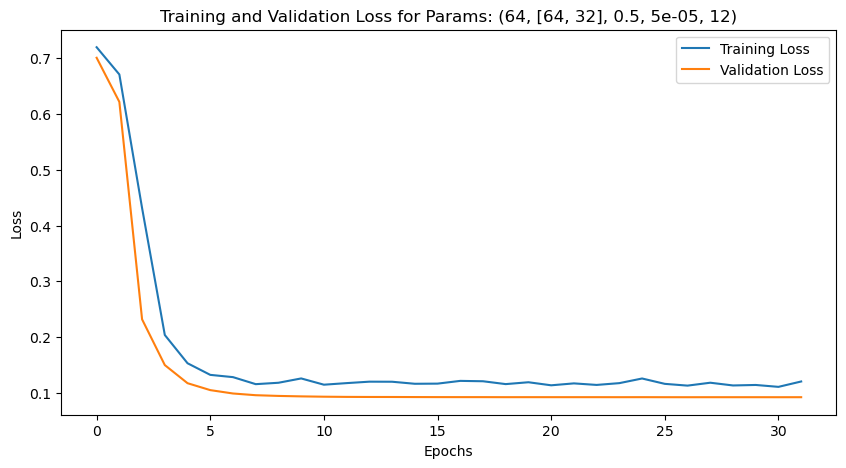

Training with params: (64, [64, 32], 0.5, 0.0001, 4)


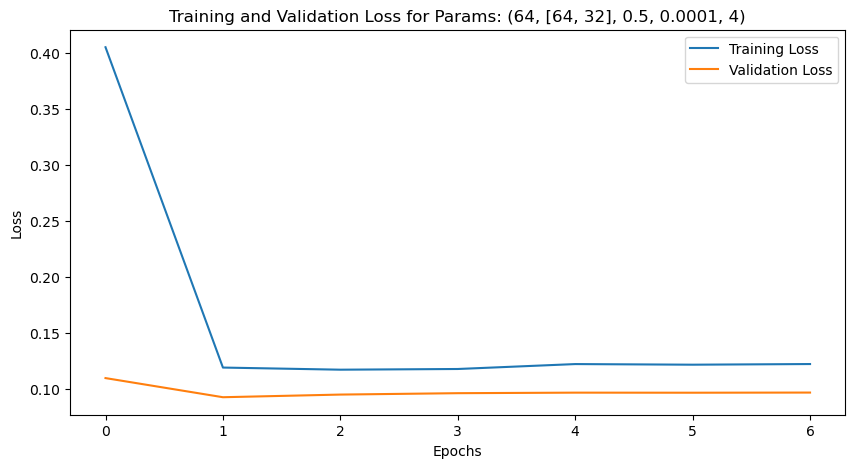

Training with params: (64, [64, 32], 0.5, 0.0001, 8)


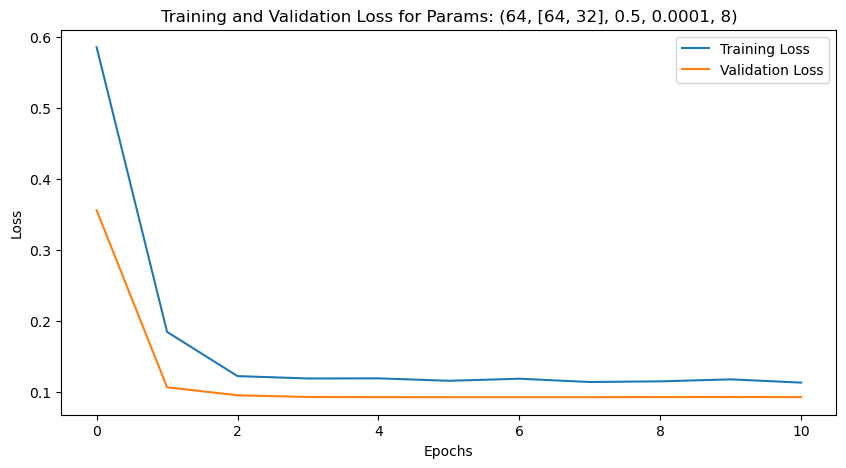

Training with params: (64, [64, 32], 0.5, 0.0001, 12)


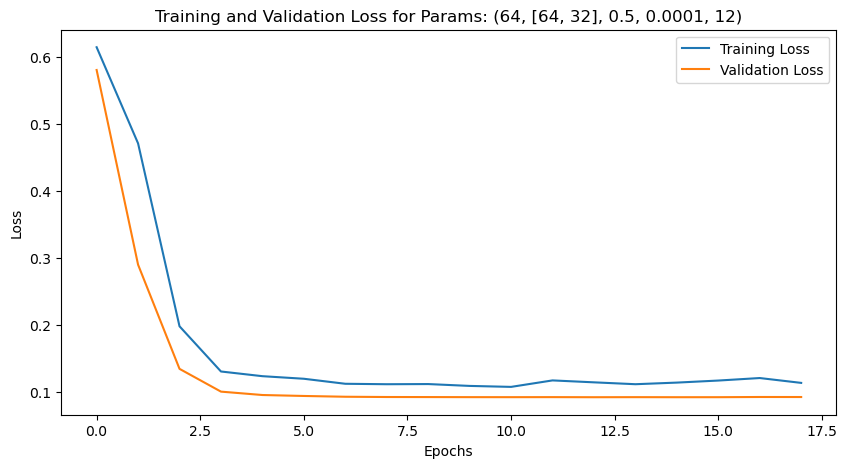

Training with params: (64, [64, 32], 0.5, 0.0005, 4)


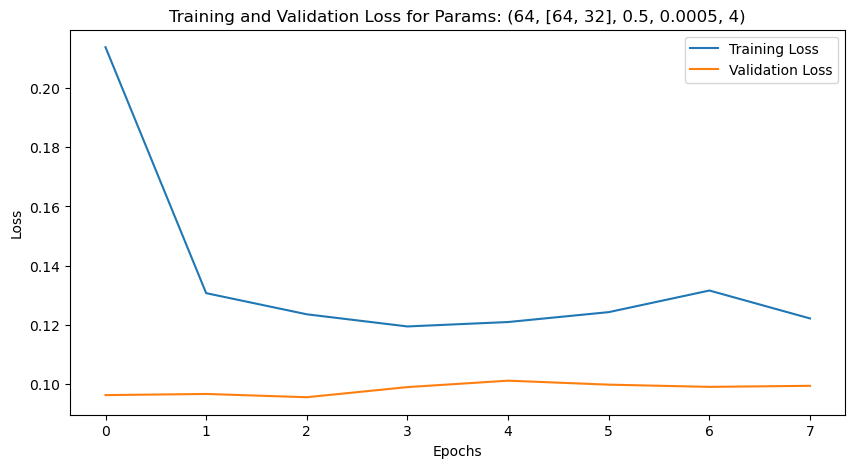

Training with params: (64, [64, 32], 0.5, 0.0005, 8)


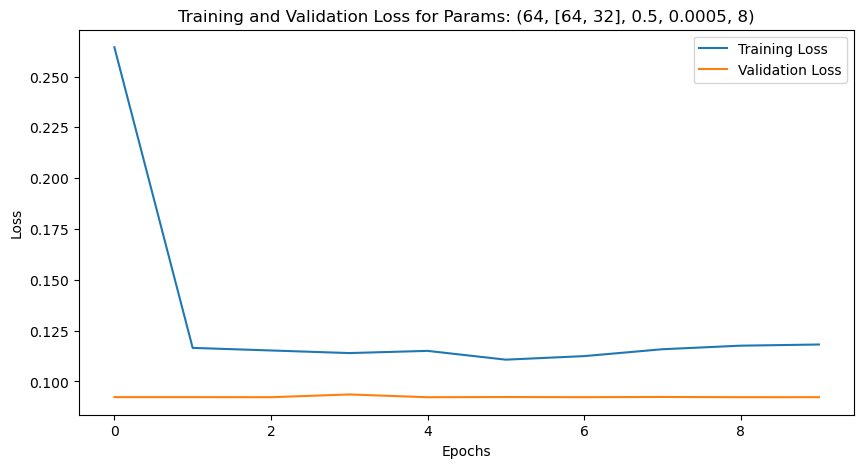

Training with params: (64, [64, 32], 0.5, 0.0005, 12)


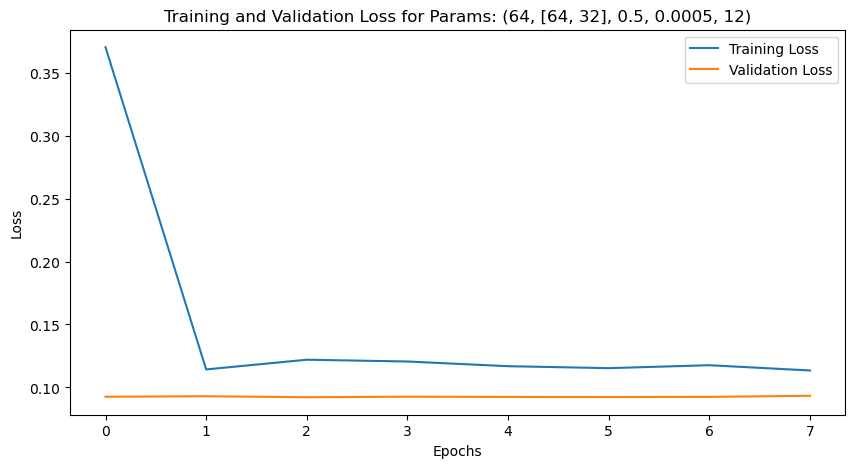

Training with params: (64, [64, 32], 0.7, 5e-05, 4)


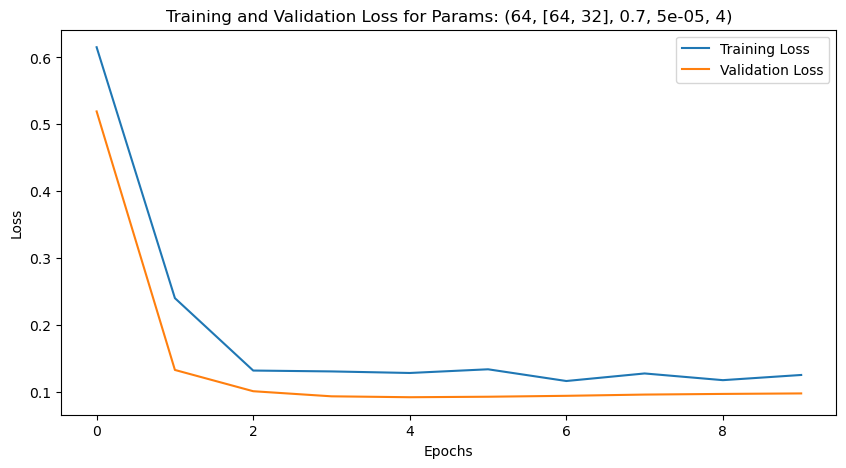

Training with params: (64, [64, 32], 0.7, 5e-05, 8)


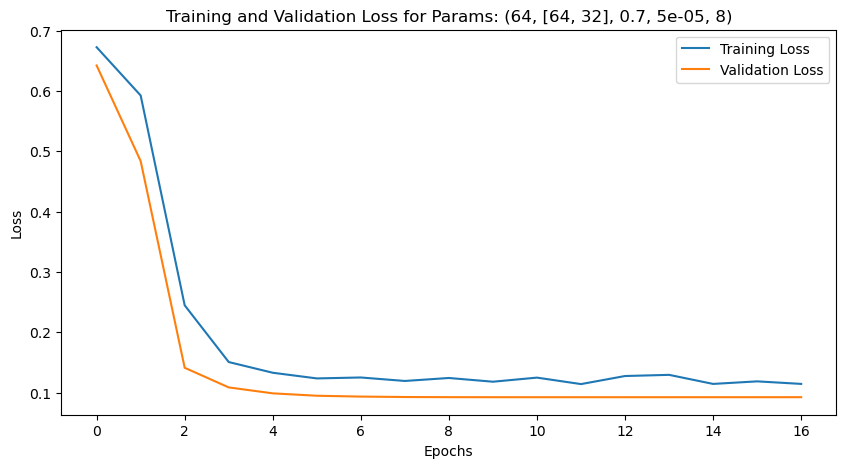

Training with params: (64, [64, 32], 0.7, 5e-05, 12)


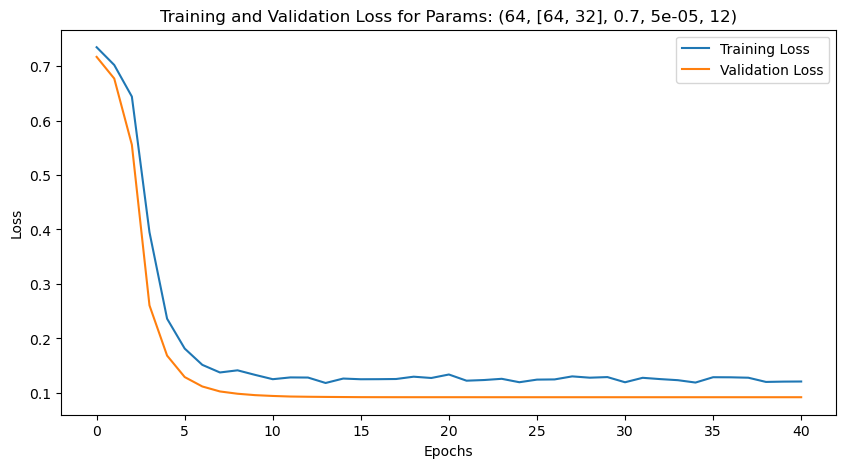

Training with params: (64, [64, 32], 0.7, 0.0001, 4)


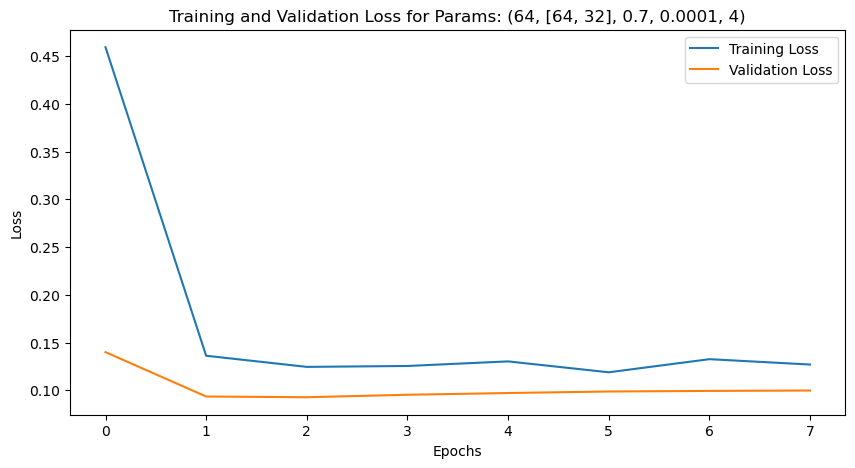

Training with params: (64, [64, 32], 0.7, 0.0001, 8)


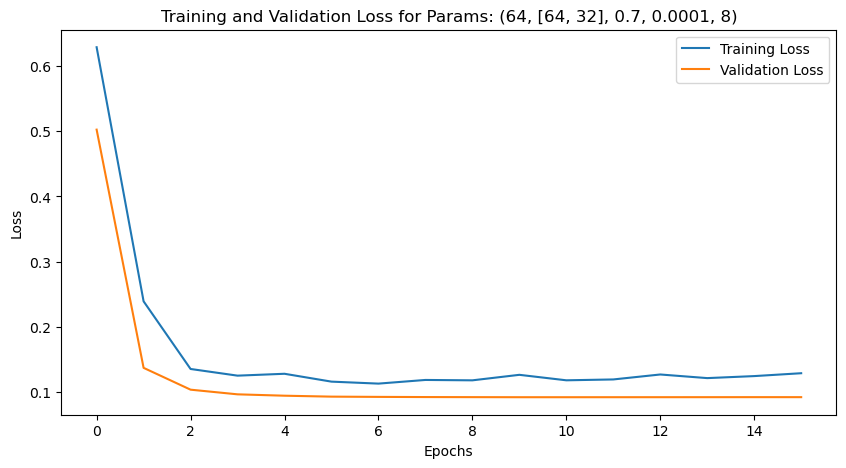

Training with params: (64, [64, 32], 0.7, 0.0001, 12)


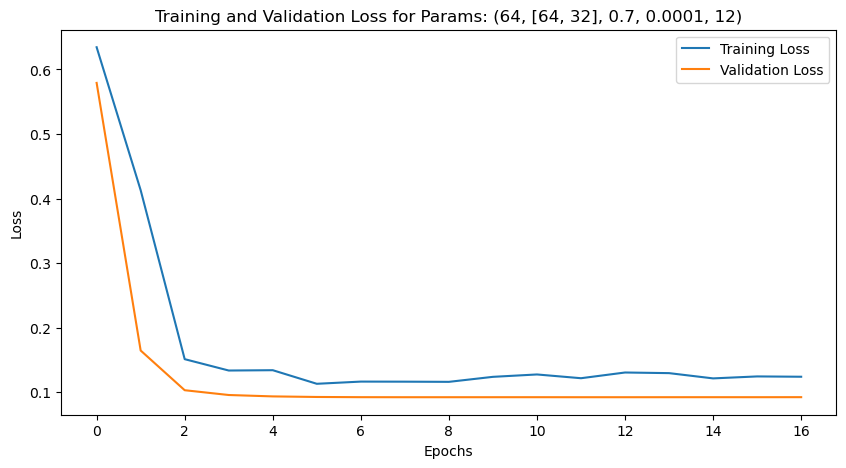

Training with params: (64, [64, 32], 0.7, 0.0005, 4)


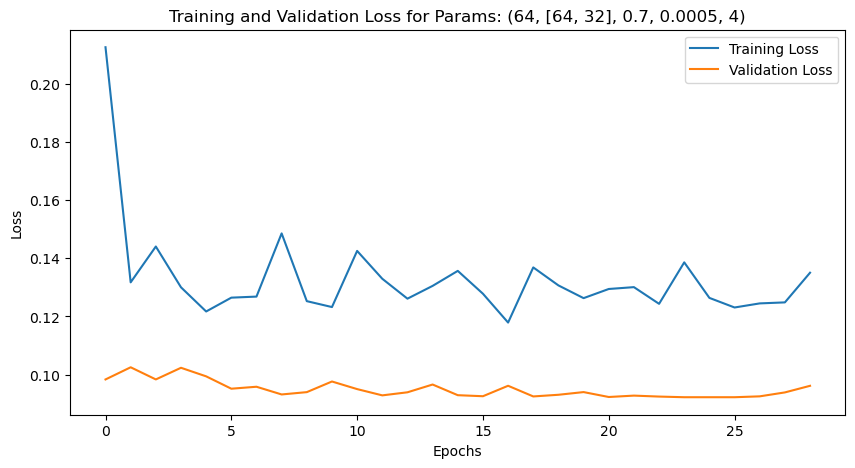

Training with params: (64, [64, 32], 0.7, 0.0005, 8)


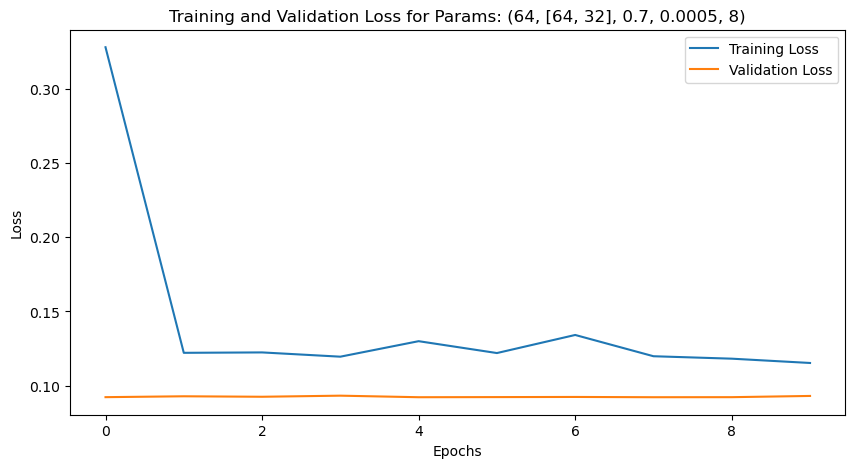

Training with params: (64, [64, 32], 0.7, 0.0005, 12)


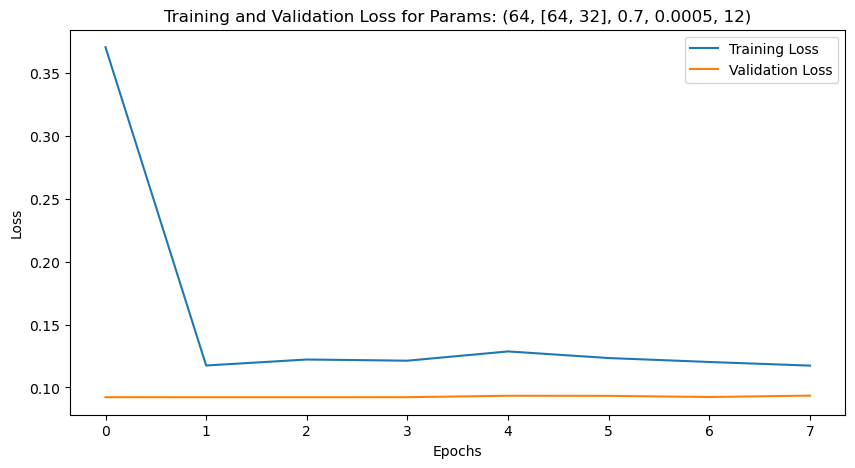

Training with params: (64, [64, 32, 16], 0.3, 5e-05, 4)


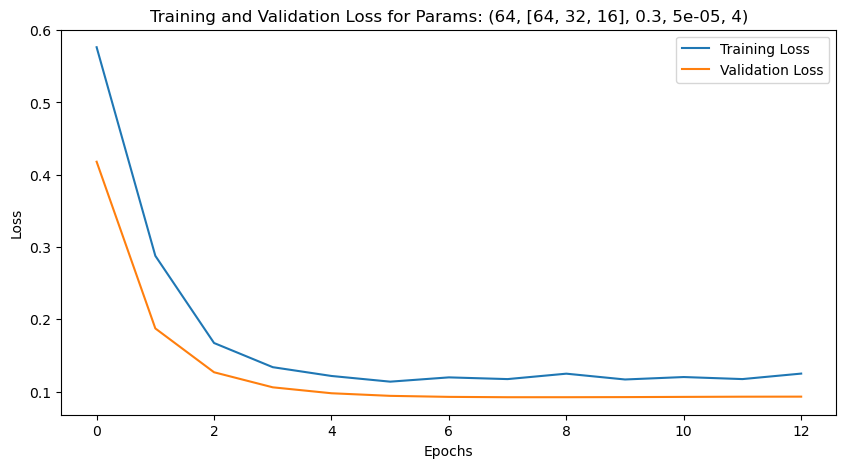

Training with params: (64, [64, 32, 16], 0.3, 5e-05, 8)


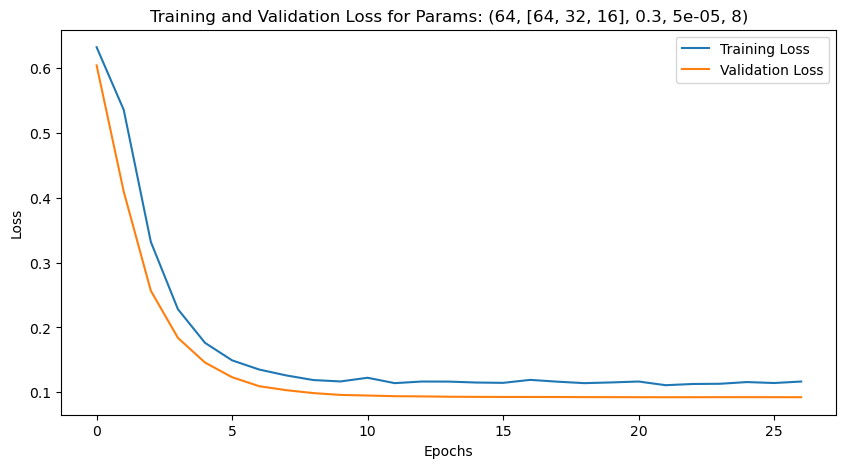

Training with params: (64, [64, 32, 16], 0.3, 5e-05, 12)


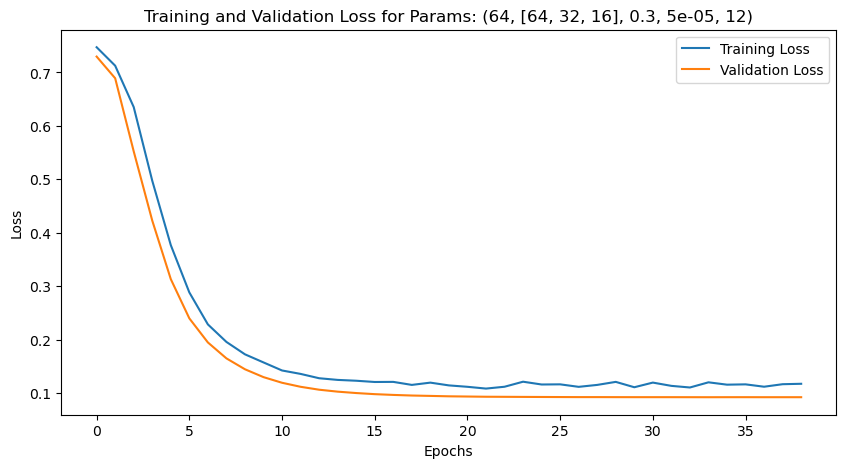

Training with params: (64, [64, 32, 16], 0.3, 0.0001, 4)


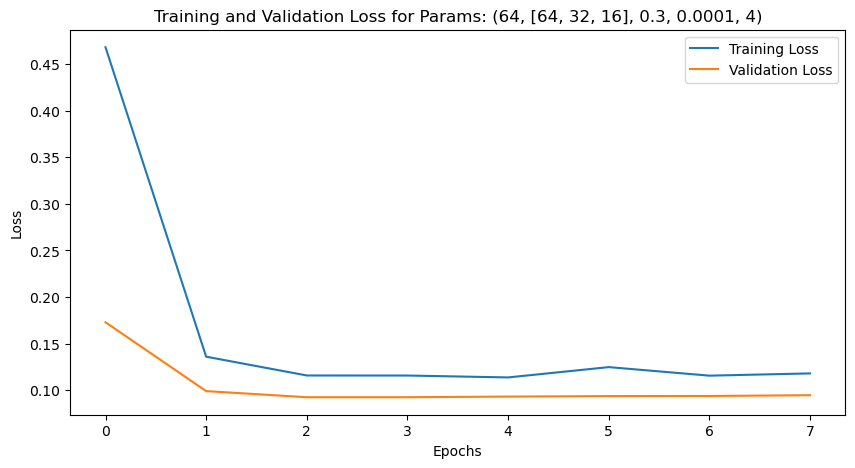

Training with params: (64, [64, 32, 16], 0.3, 0.0001, 8)


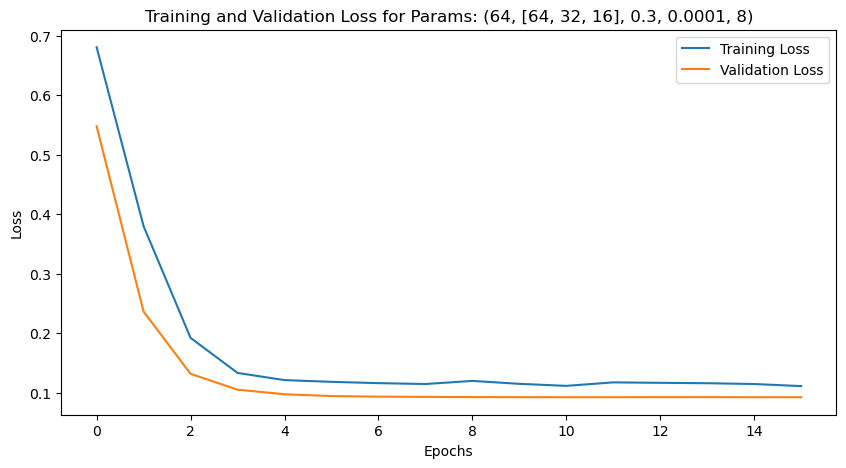

Training with params: (64, [64, 32, 16], 0.3, 0.0001, 12)


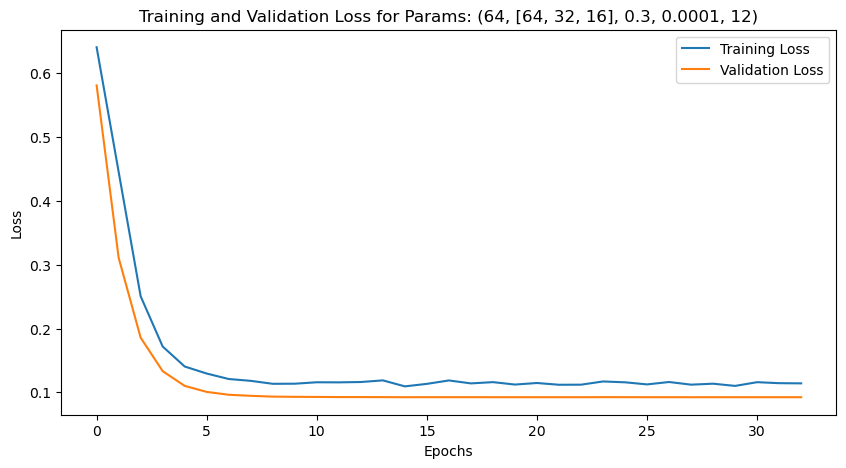

Training with params: (64, [64, 32, 16], 0.3, 0.0005, 4)


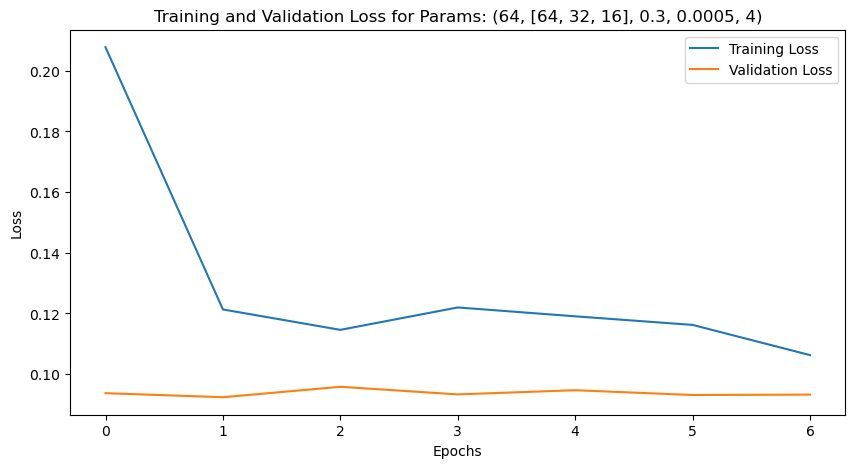

Training with params: (64, [64, 32, 16], 0.3, 0.0005, 8)


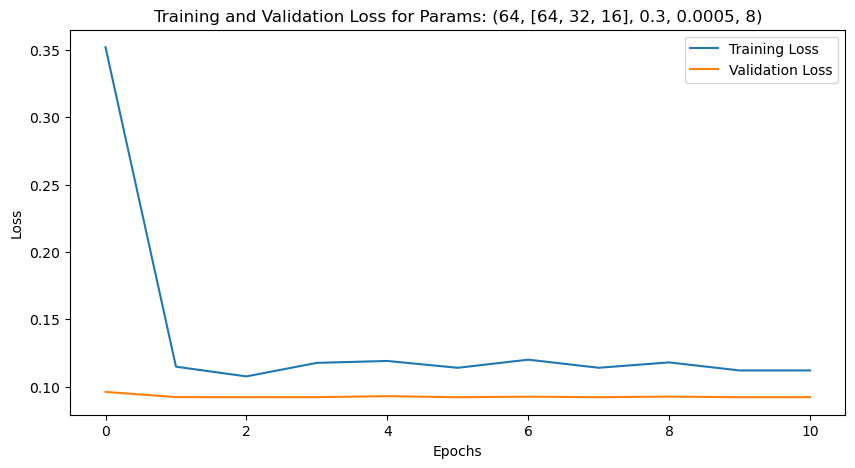

Training with params: (64, [64, 32, 16], 0.3, 0.0005, 12)


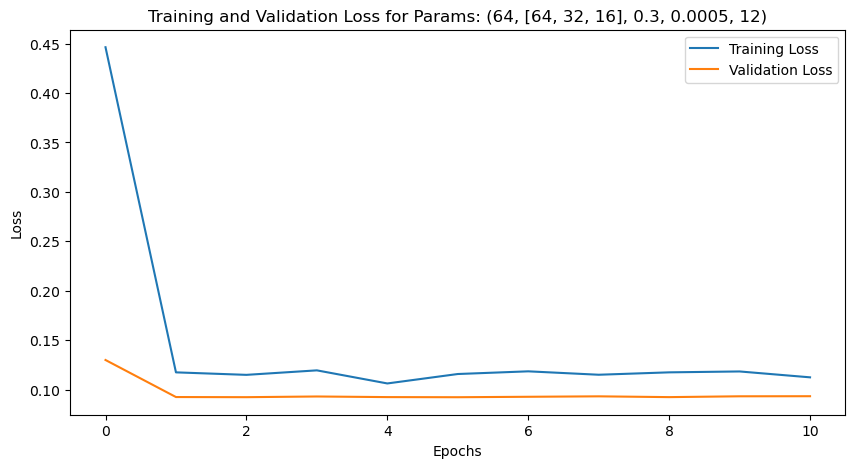

Training with params: (64, [64, 32, 16], 0.5, 5e-05, 4)


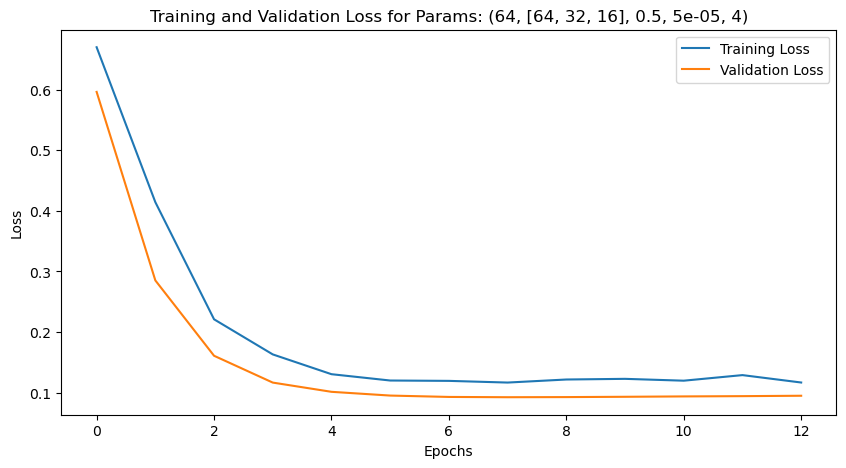

Training with params: (64, [64, 32, 16], 0.5, 5e-05, 8)


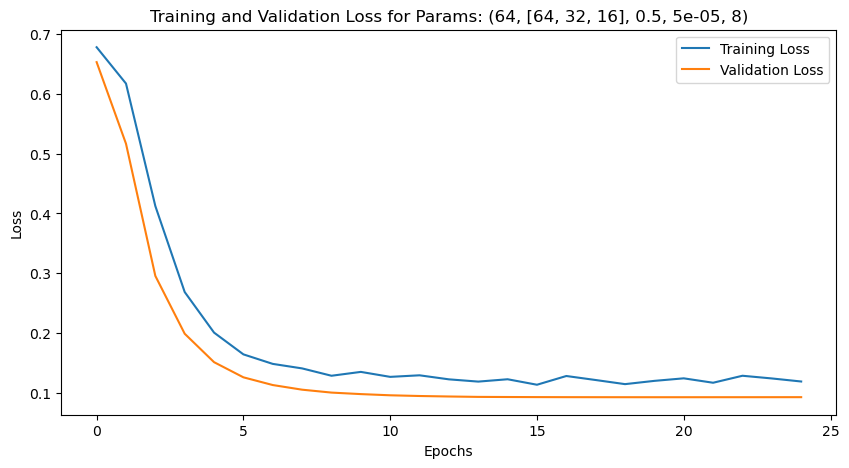

Training with params: (64, [64, 32, 16], 0.5, 5e-05, 12)


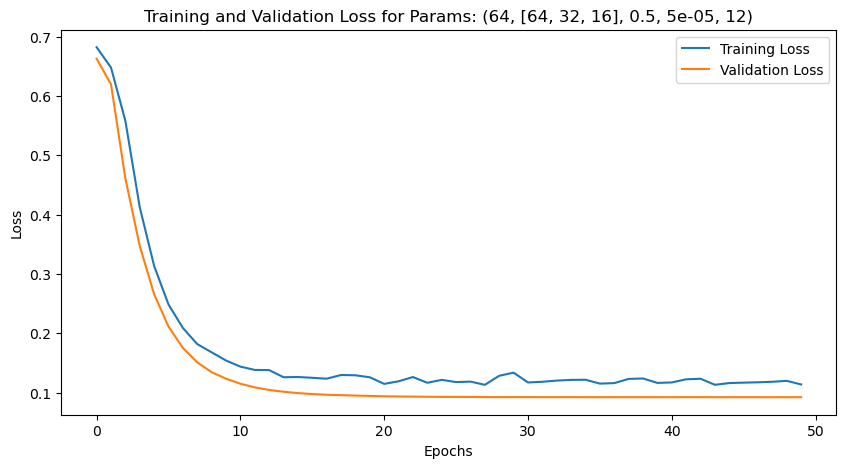

Training with params: (64, [64, 32, 16], 0.5, 0.0001, 4)


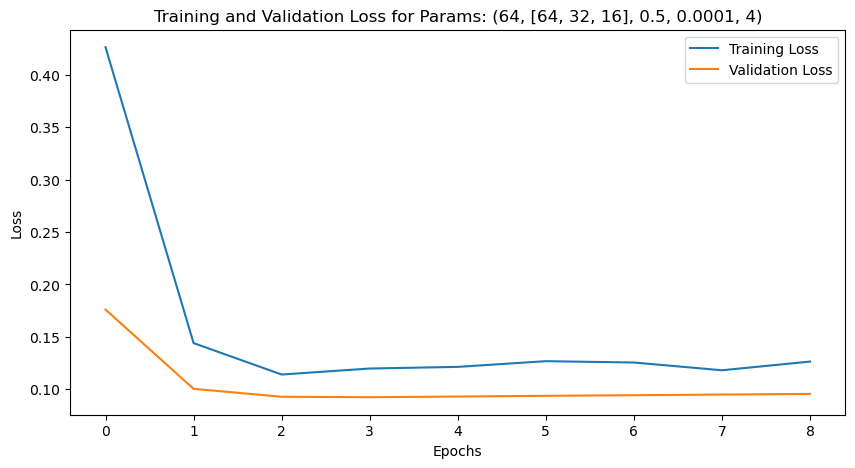

Training with params: (64, [64, 32, 16], 0.5, 0.0001, 8)


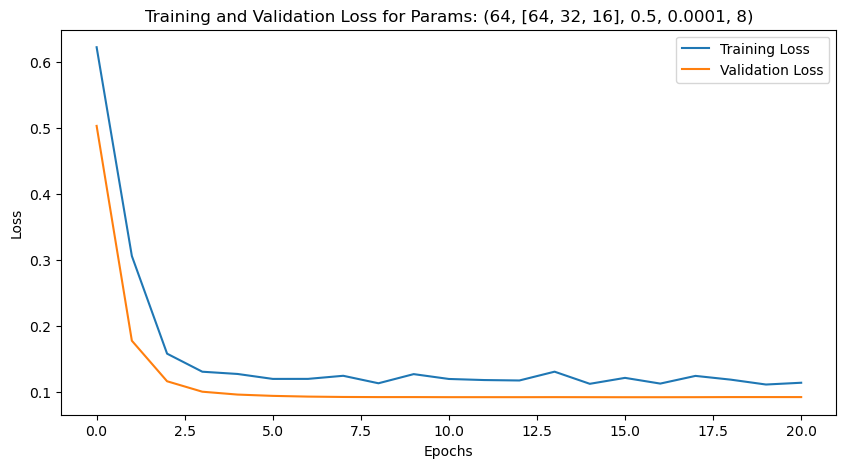

Training with params: (64, [64, 32, 16], 0.5, 0.0001, 12)


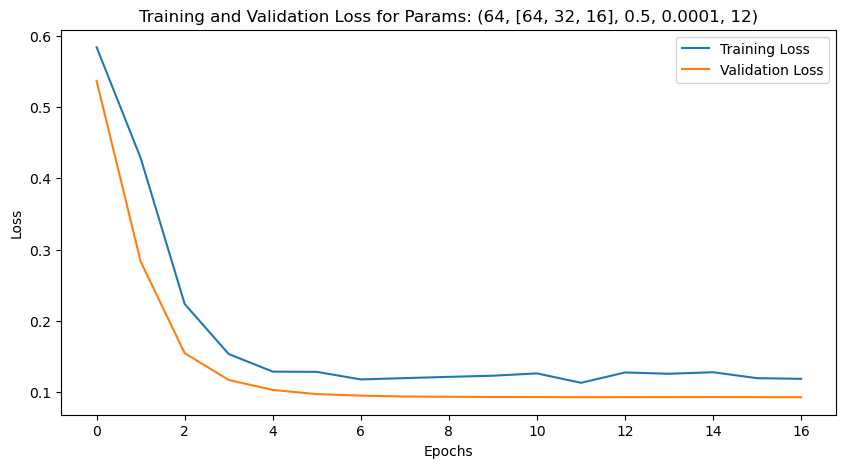

Training with params: (64, [64, 32, 16], 0.5, 0.0005, 4)


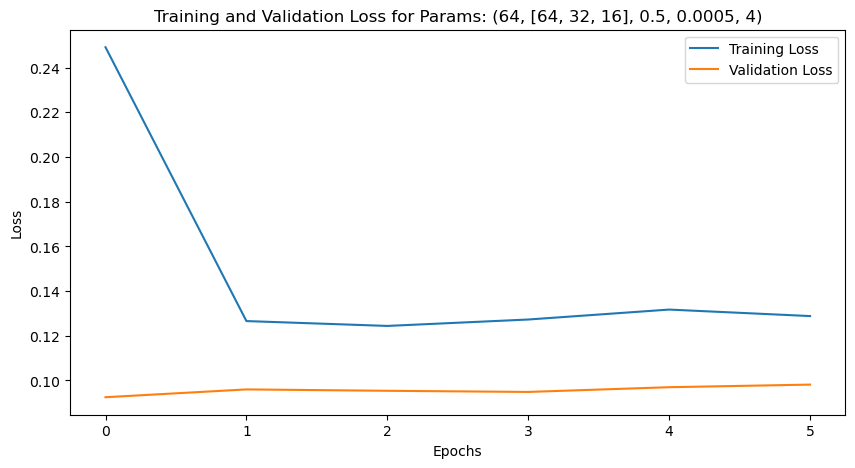

Training with params: (64, [64, 32, 16], 0.5, 0.0005, 8)


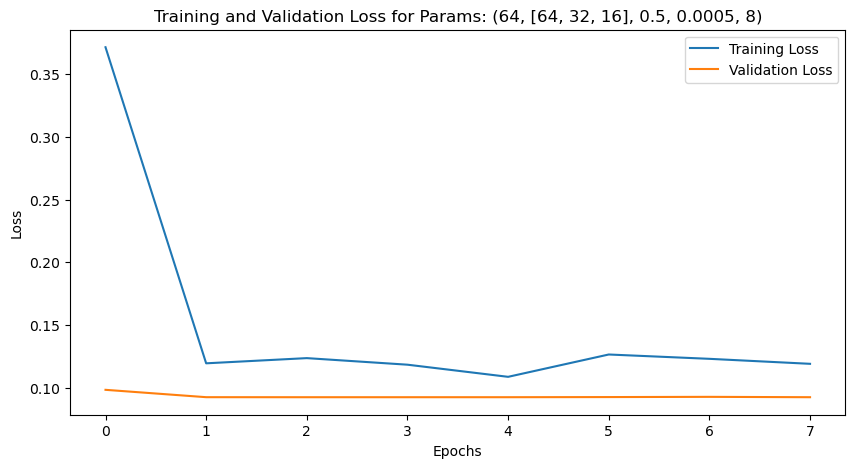

Training with params: (64, [64, 32, 16], 0.5, 0.0005, 12)


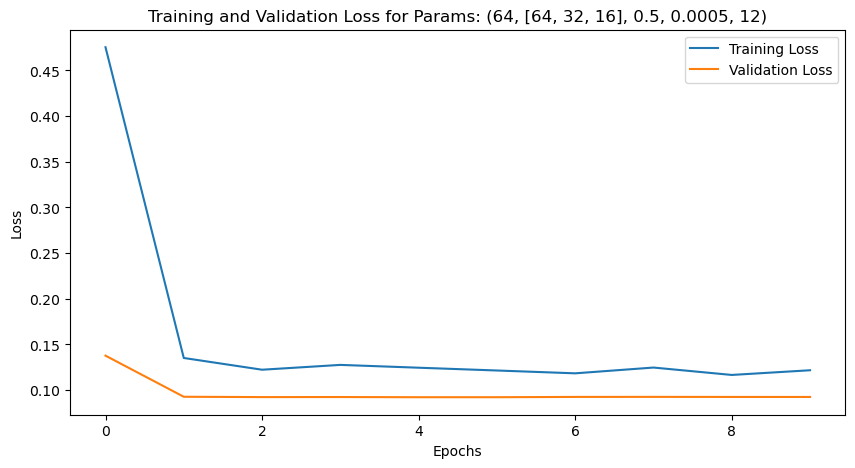

Training with params: (64, [64, 32, 16], 0.7, 5e-05, 4)


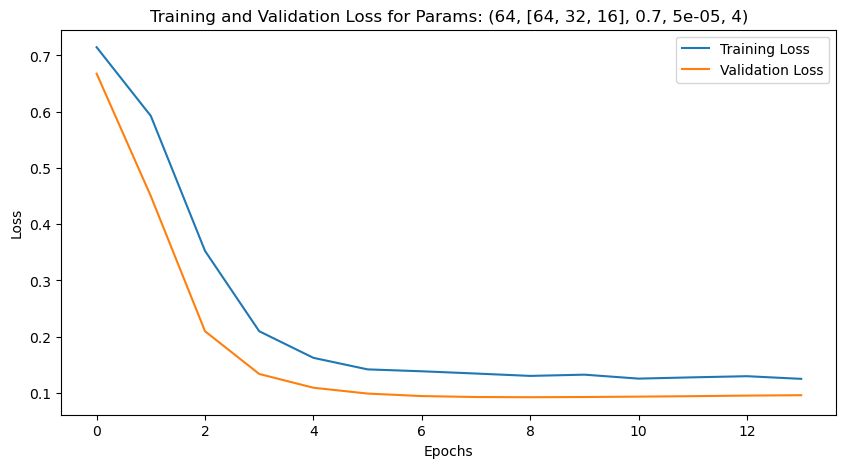

Training with params: (64, [64, 32, 16], 0.7, 5e-05, 8)


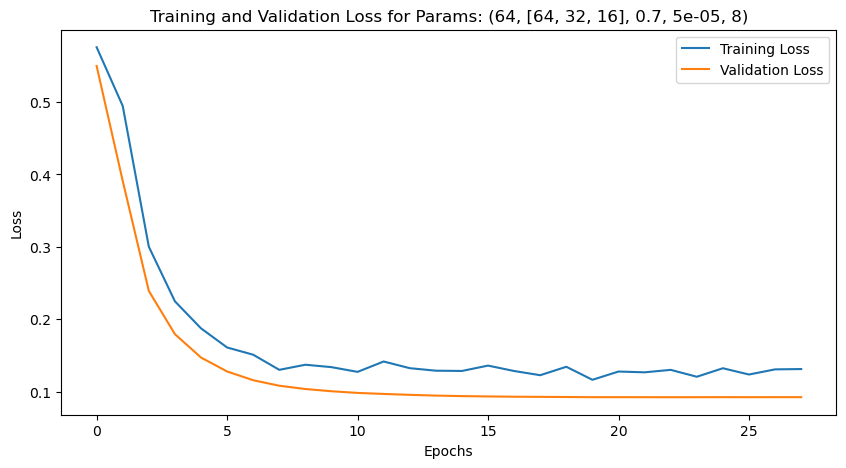

Training with params: (64, [64, 32, 16], 0.7, 5e-05, 12)


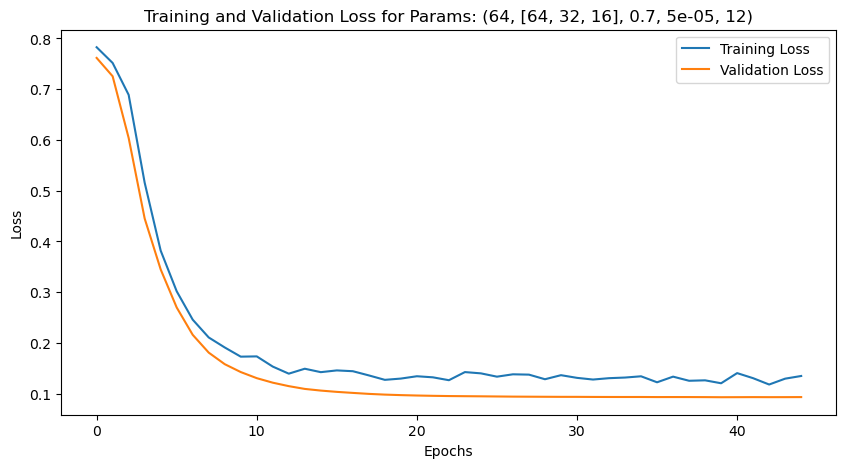

Training with params: (64, [64, 32, 16], 0.7, 0.0001, 4)


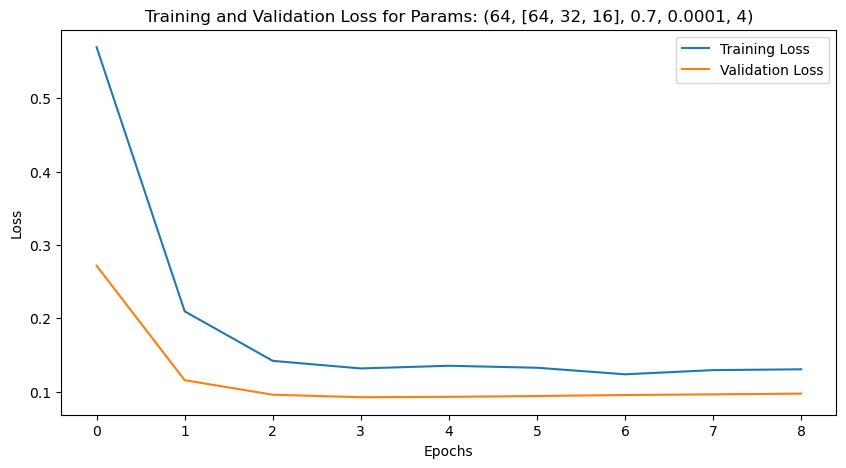

Training with params: (64, [64, 32, 16], 0.7, 0.0001, 8)


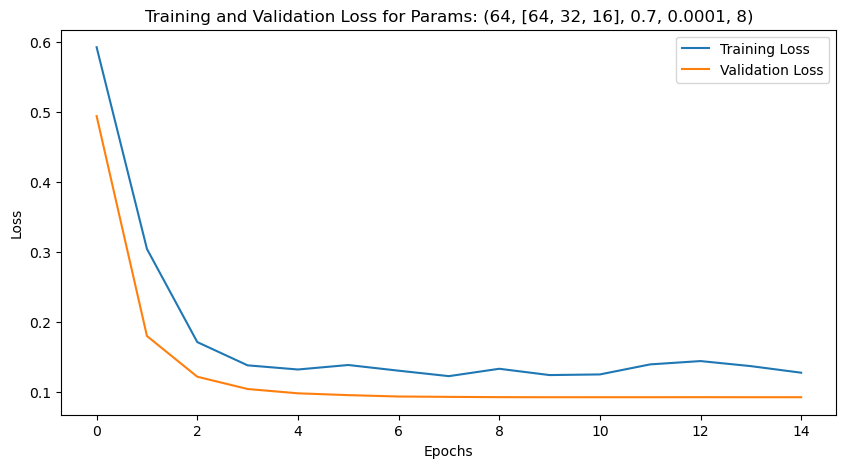

Training with params: (64, [64, 32, 16], 0.7, 0.0001, 12)


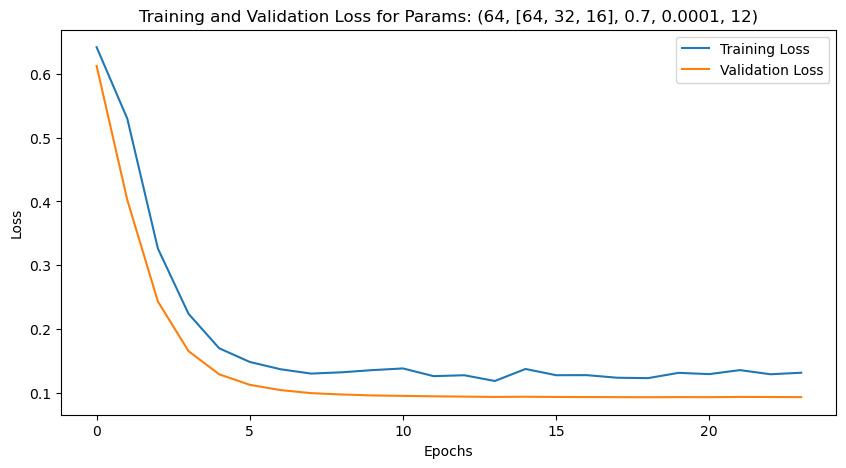

Training with params: (64, [64, 32, 16], 0.7, 0.0005, 4)


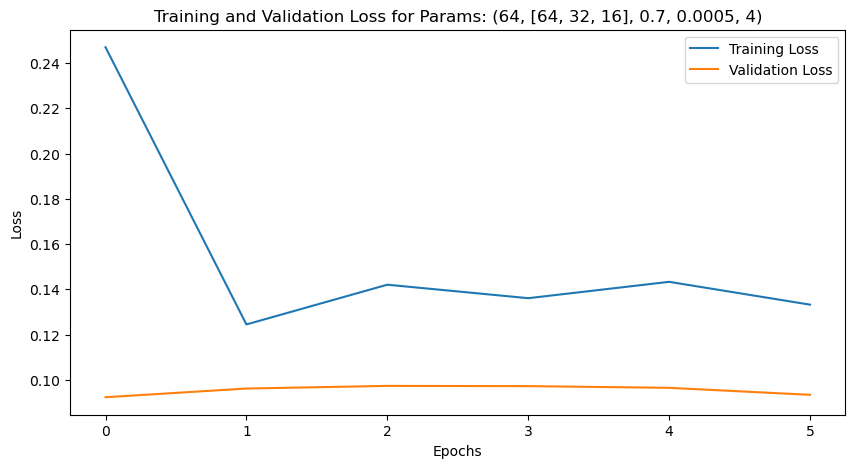

Training with params: (64, [64, 32, 16], 0.7, 0.0005, 8)


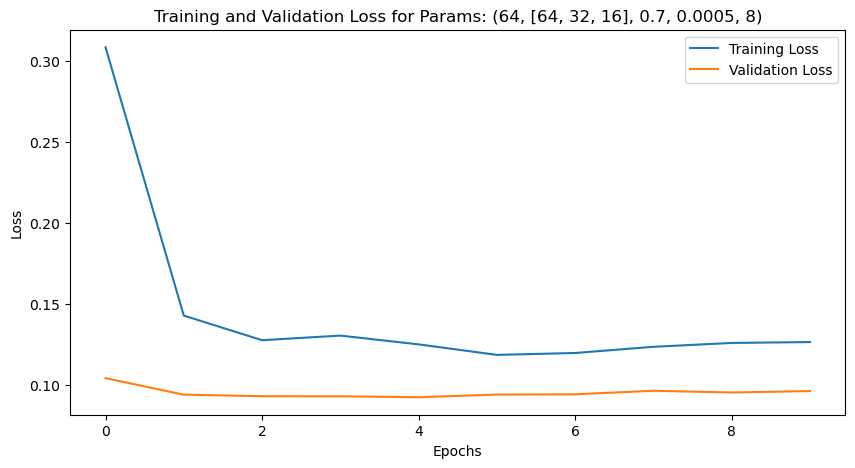

Training with params: (64, [64, 32, 16], 0.7, 0.0005, 12)


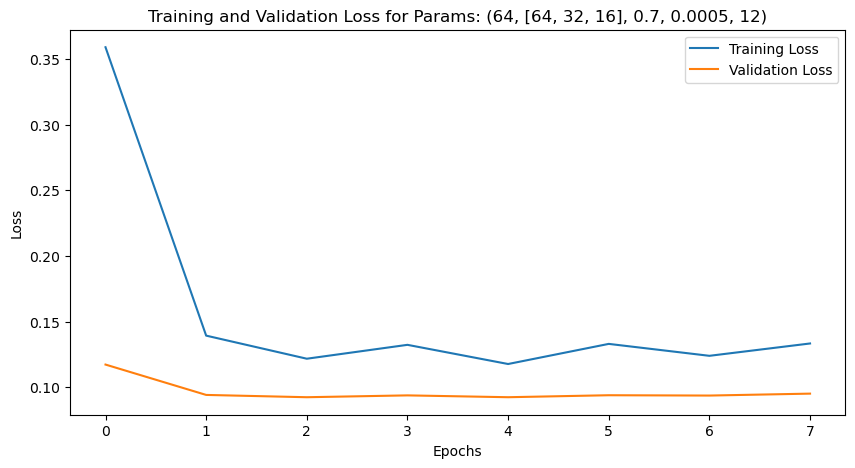

Training with params: (64, [128, 64, 32], 0.3, 5e-05, 4)


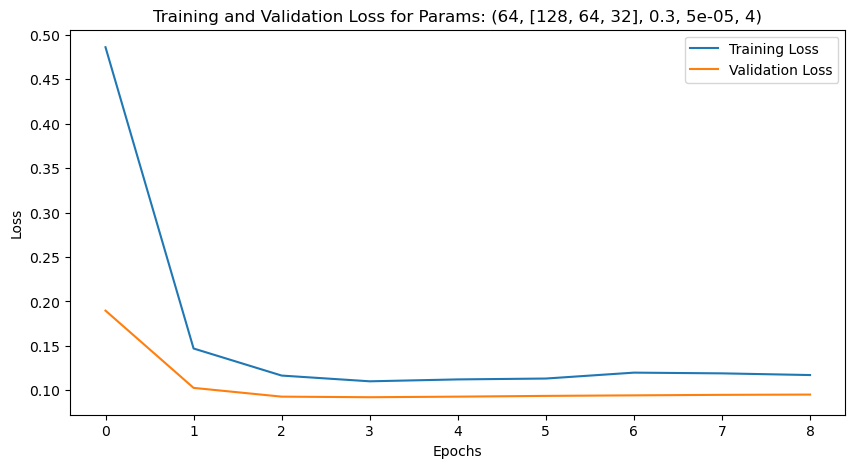

Training with params: (64, [128, 64, 32], 0.3, 5e-05, 8)


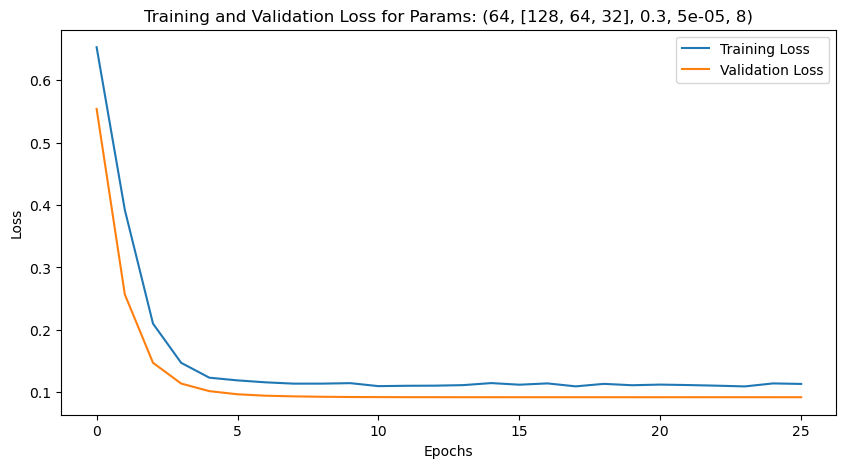

Training with params: (64, [128, 64, 32], 0.3, 5e-05, 12)


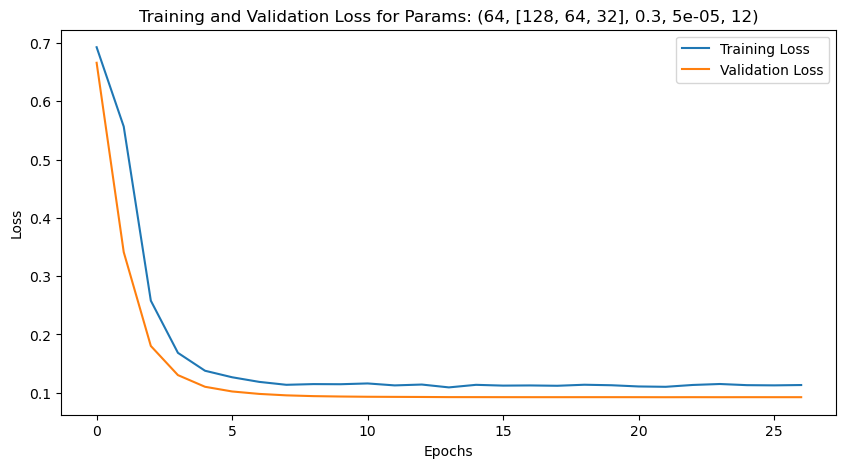

Training with params: (64, [128, 64, 32], 0.3, 0.0001, 4)


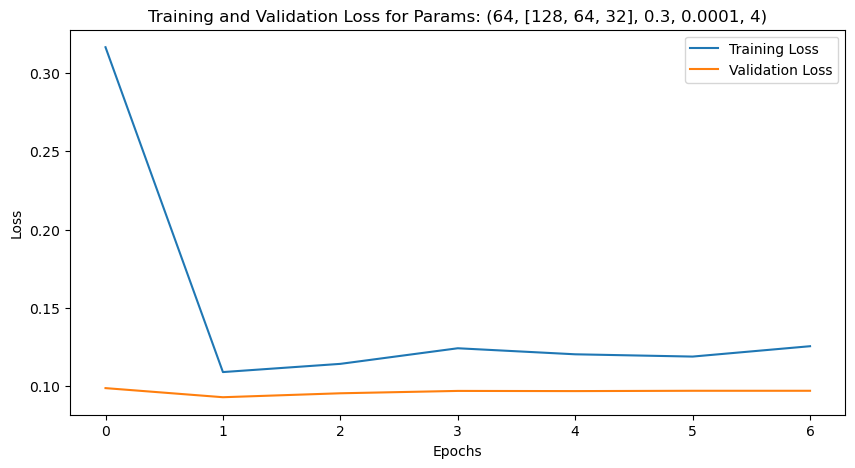

Training with params: (64, [128, 64, 32], 0.3, 0.0001, 8)


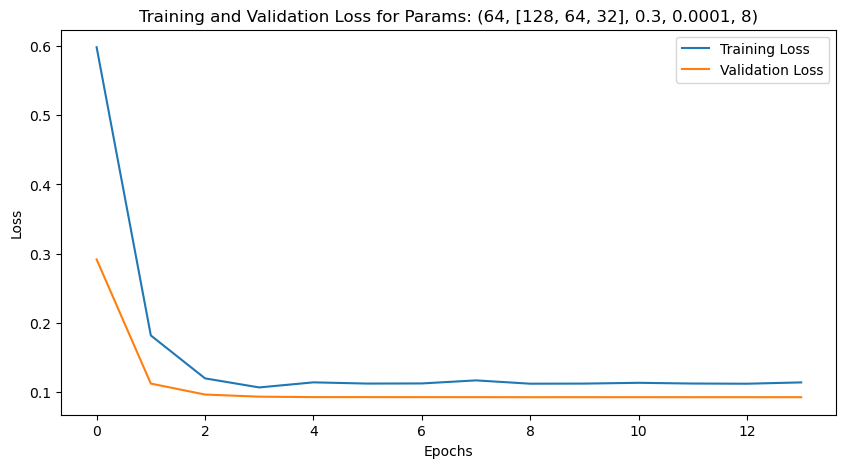

Training with params: (64, [128, 64, 32], 0.3, 0.0001, 12)


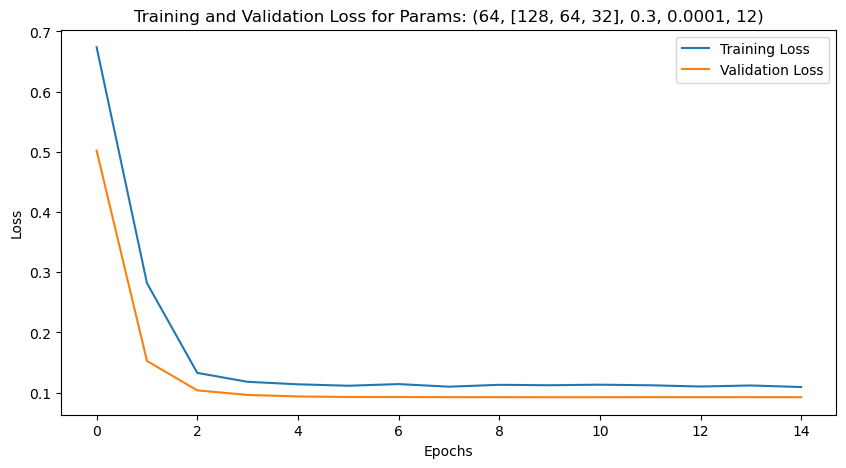

Training with params: (64, [128, 64, 32], 0.3, 0.0005, 4)


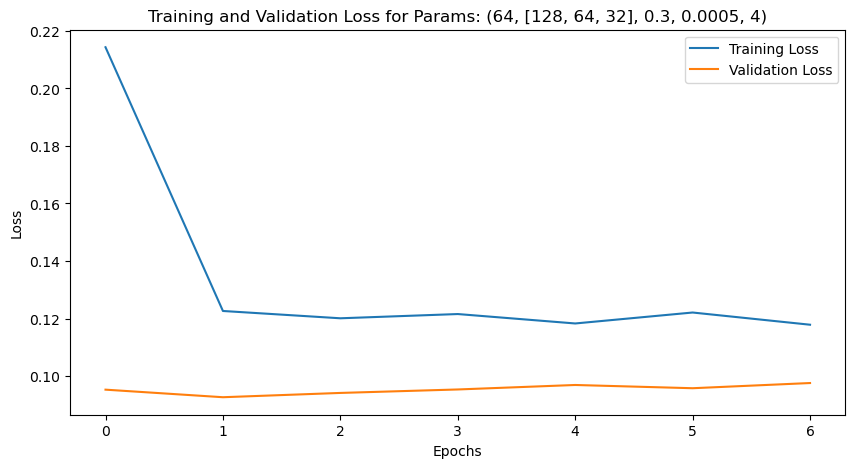

Training with params: (64, [128, 64, 32], 0.3, 0.0005, 8)


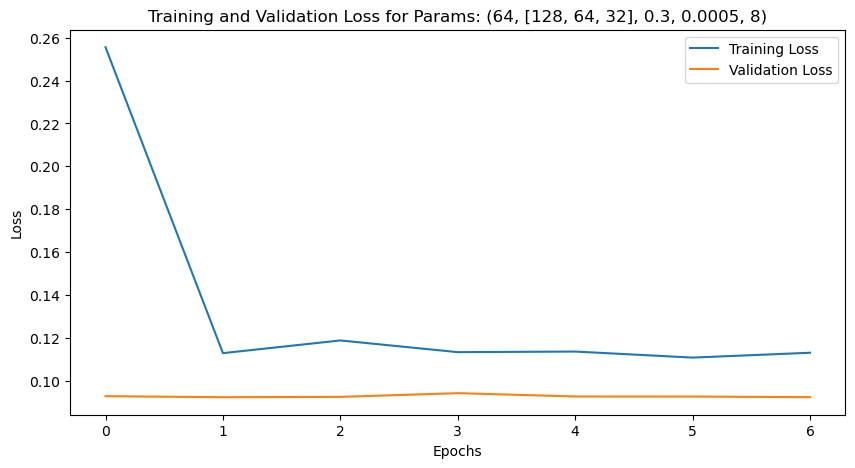

Training with params: (64, [128, 64, 32], 0.3, 0.0005, 12)


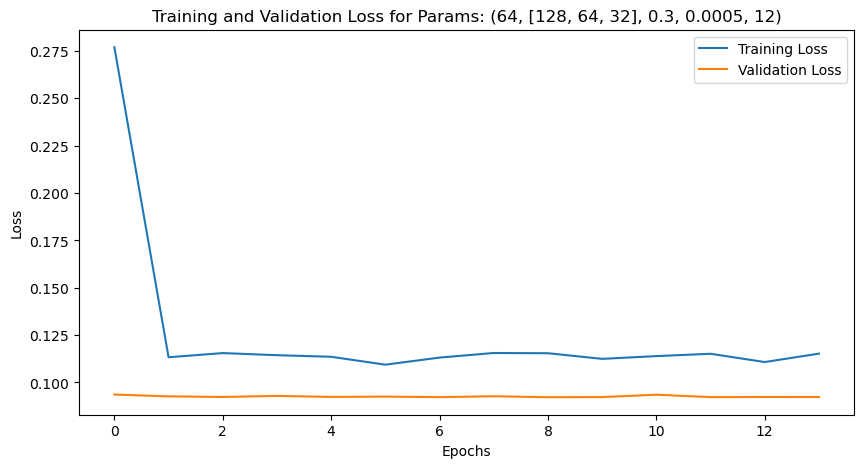

Training with params: (64, [128, 64, 32], 0.5, 5e-05, 4)


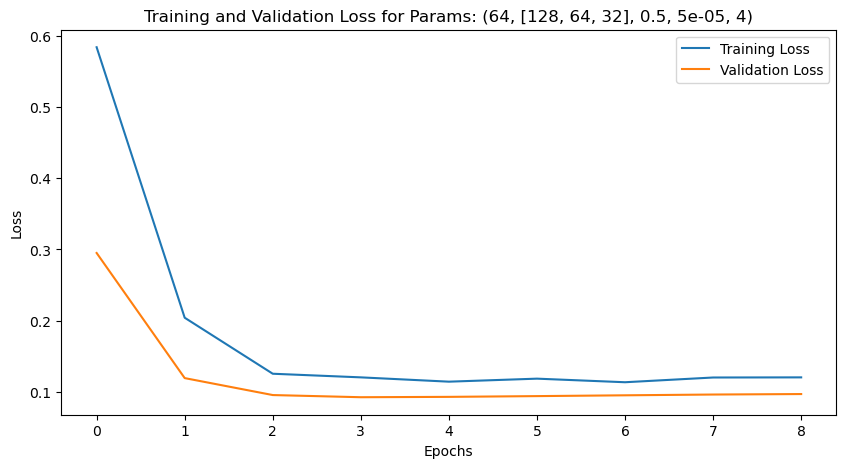

Training with params: (64, [128, 64, 32], 0.5, 5e-05, 8)


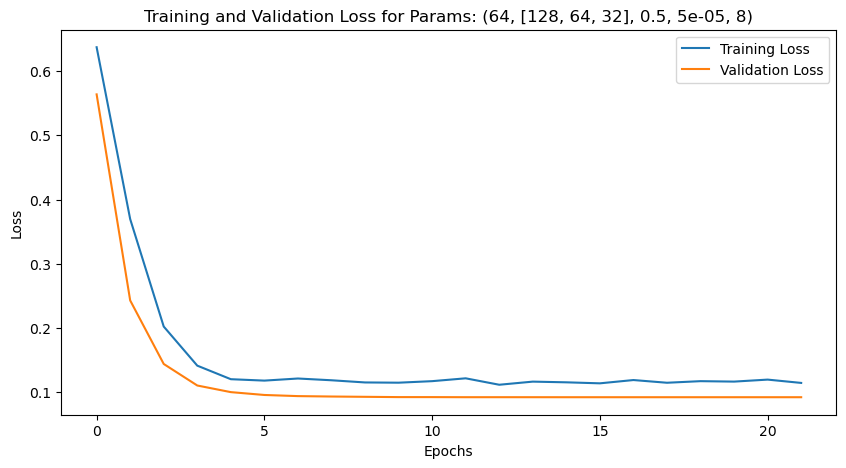

Training with params: (64, [128, 64, 32], 0.5, 5e-05, 12)


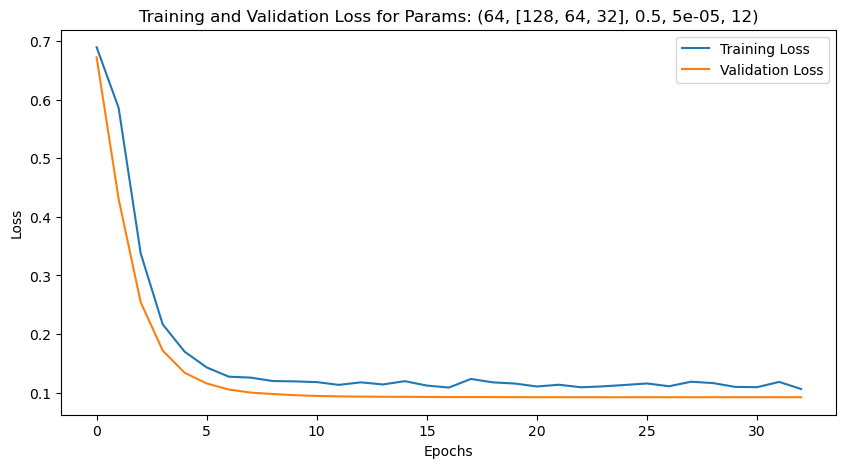

Training with params: (64, [128, 64, 32], 0.5, 0.0001, 4)


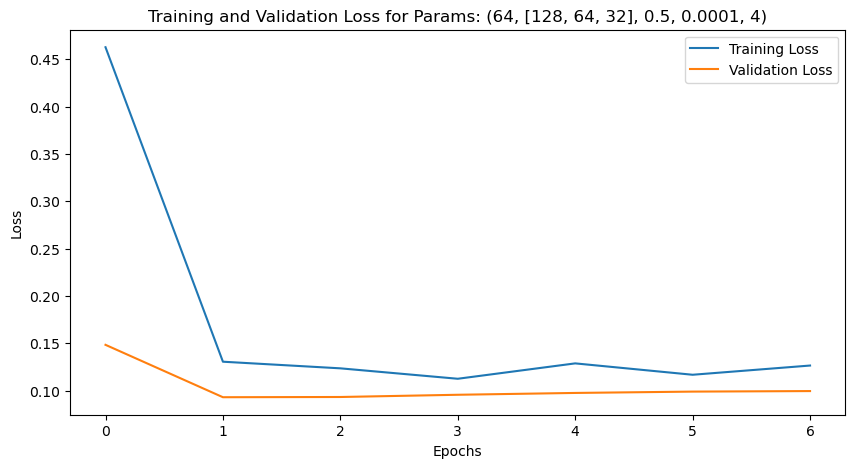

Training with params: (64, [128, 64, 32], 0.5, 0.0001, 8)


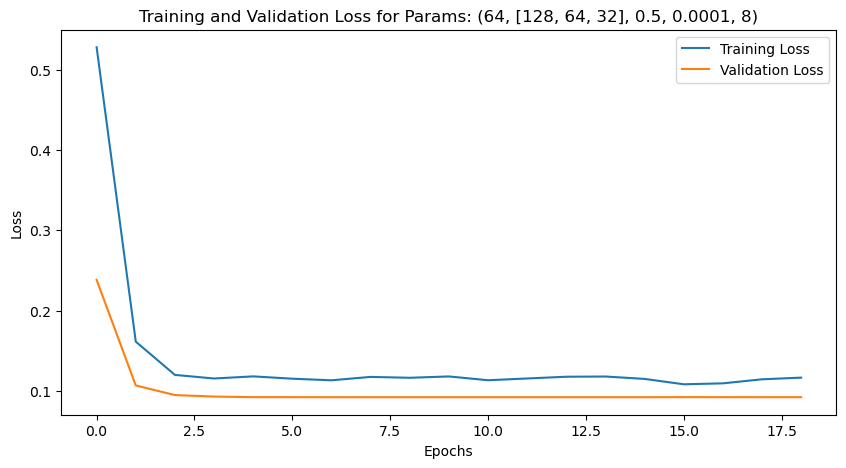

Training with params: (64, [128, 64, 32], 0.5, 0.0001, 12)


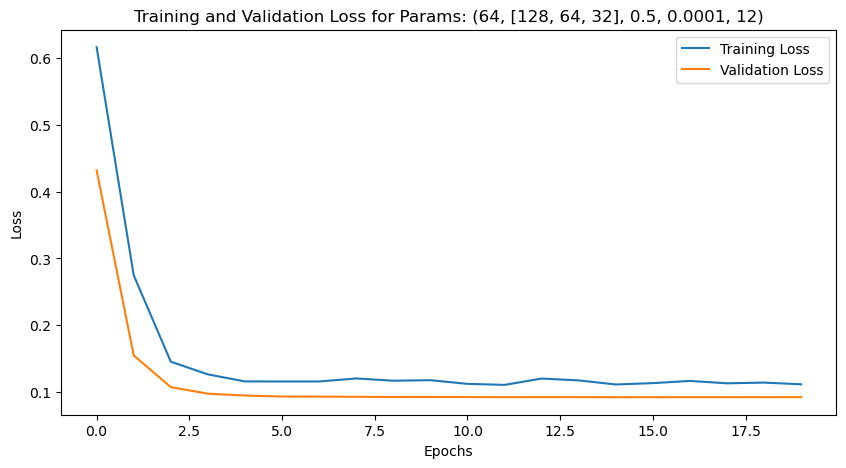

Training with params: (64, [128, 64, 32], 0.5, 0.0005, 4)


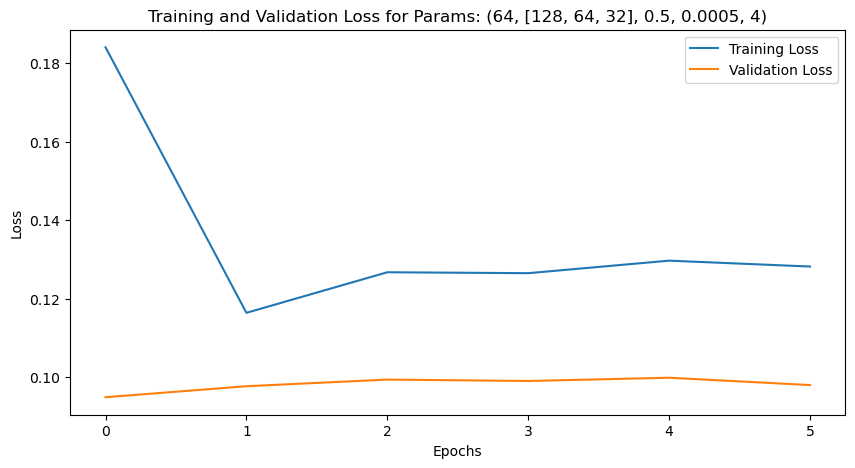

Training with params: (64, [128, 64, 32], 0.5, 0.0005, 8)


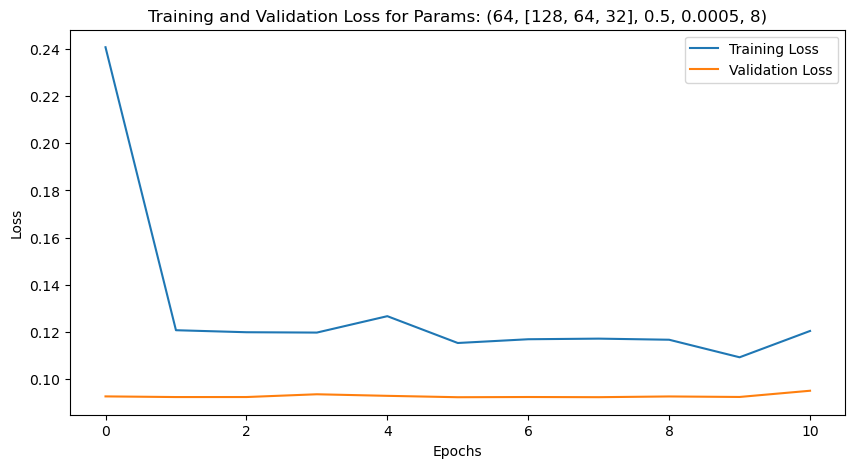

Training with params: (64, [128, 64, 32], 0.5, 0.0005, 12)


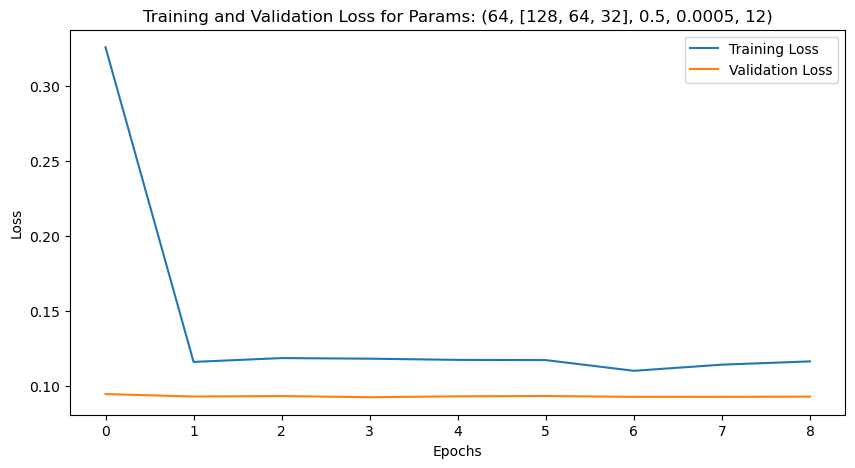

Training with params: (64, [128, 64, 32], 0.7, 5e-05, 4)


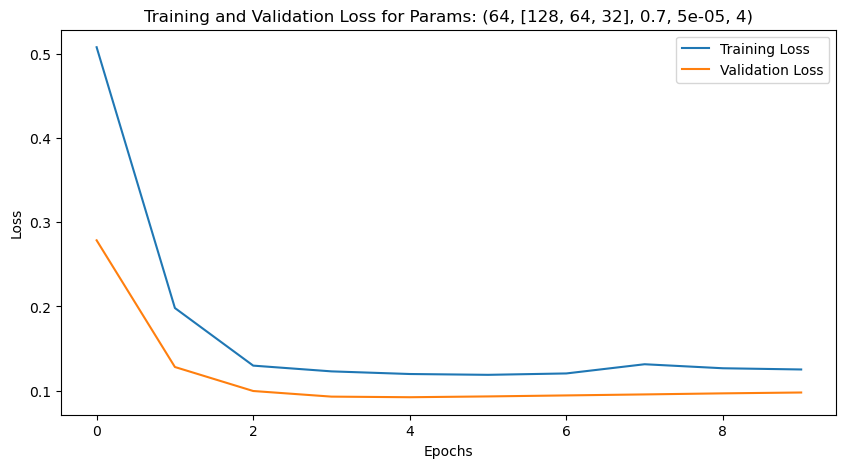

Training with params: (64, [128, 64, 32], 0.7, 5e-05, 8)


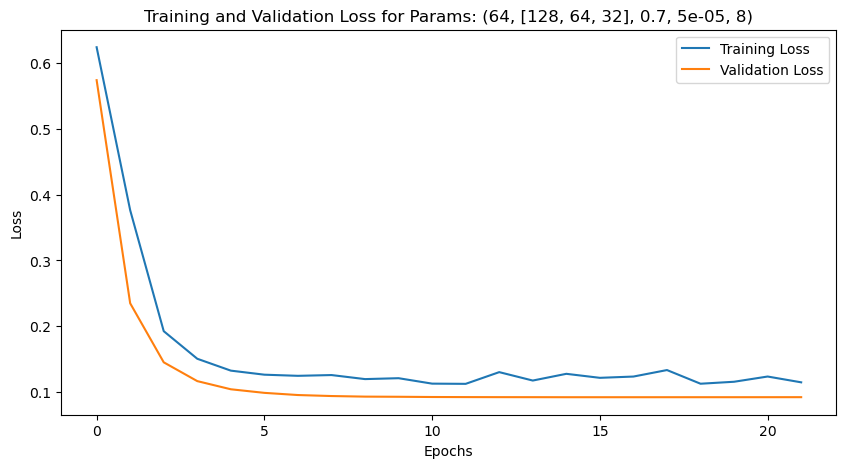

Training with params: (64, [128, 64, 32], 0.7, 5e-05, 12)


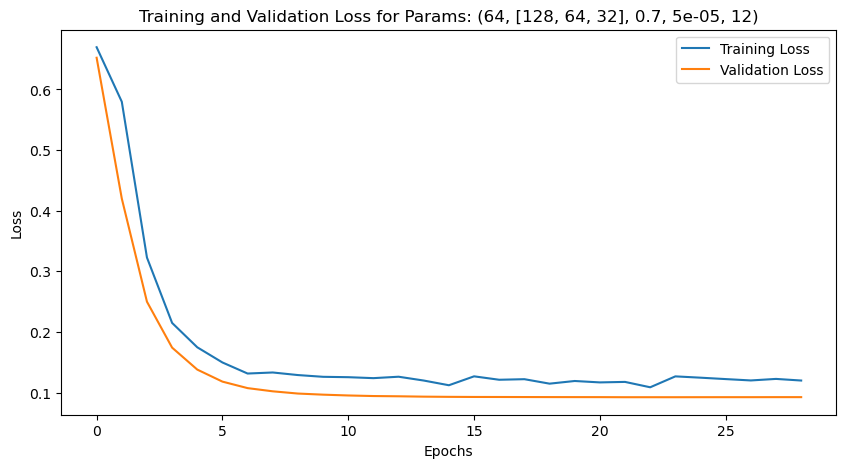

Training with params: (64, [128, 64, 32], 0.7, 0.0001, 4)


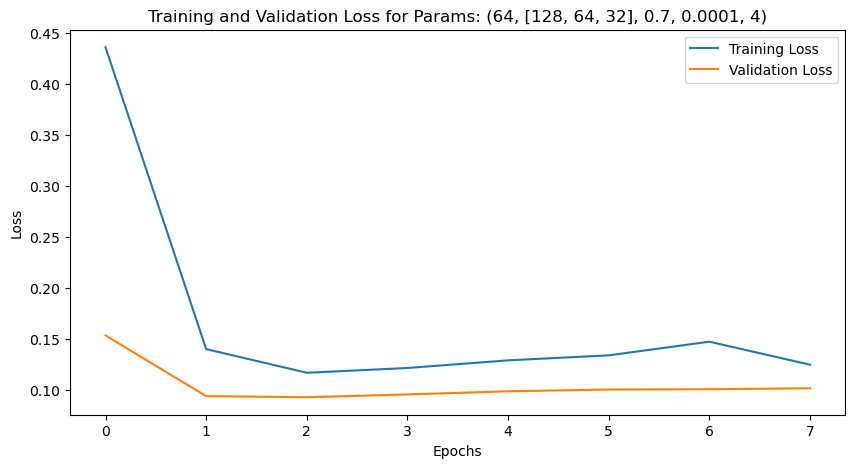

Training with params: (64, [128, 64, 32], 0.7, 0.0001, 8)


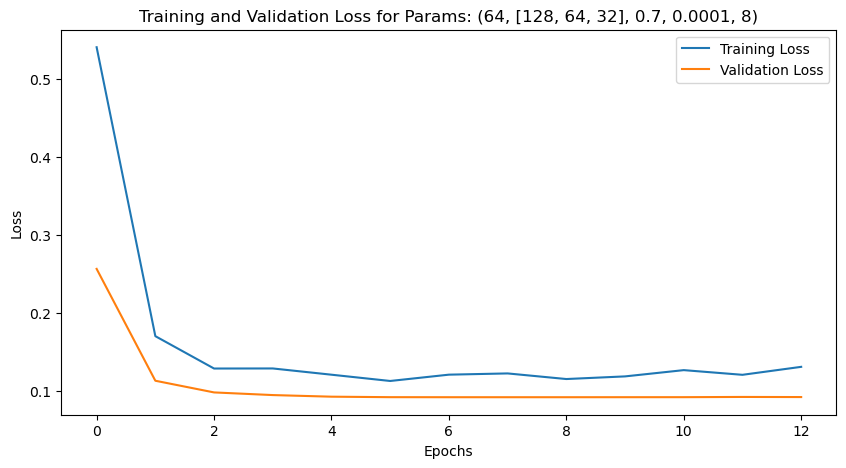

Training with params: (64, [128, 64, 32], 0.7, 0.0001, 12)


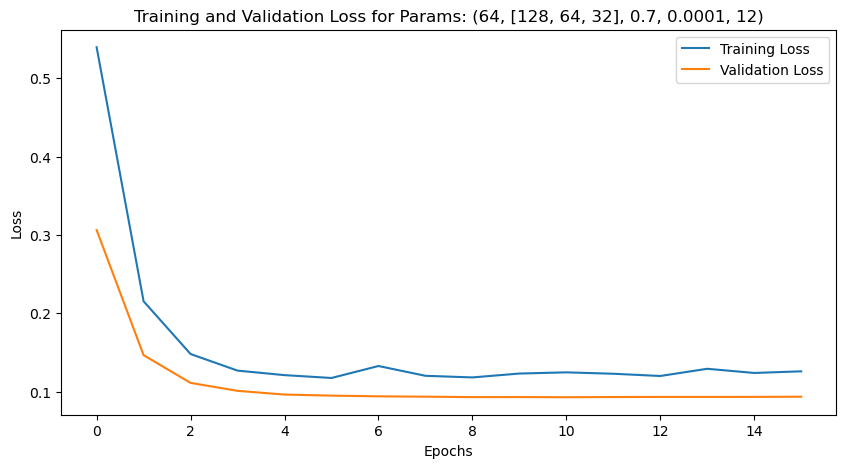

Training with params: (64, [128, 64, 32], 0.7, 0.0005, 4)


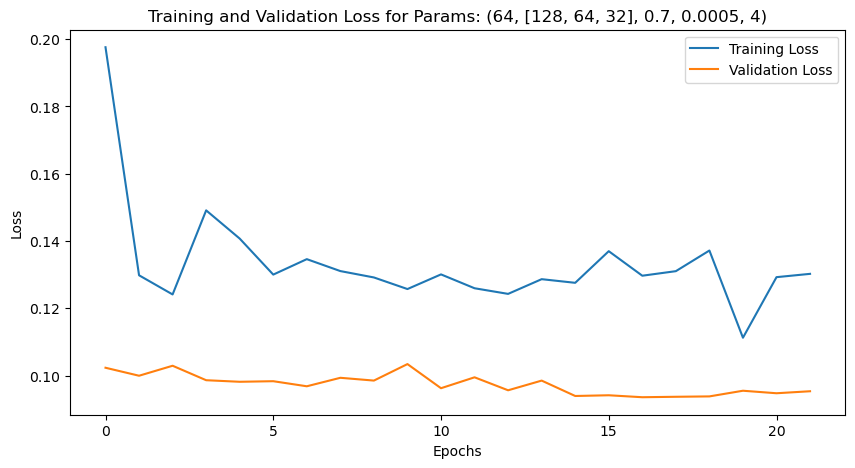

Training with params: (64, [128, 64, 32], 0.7, 0.0005, 8)


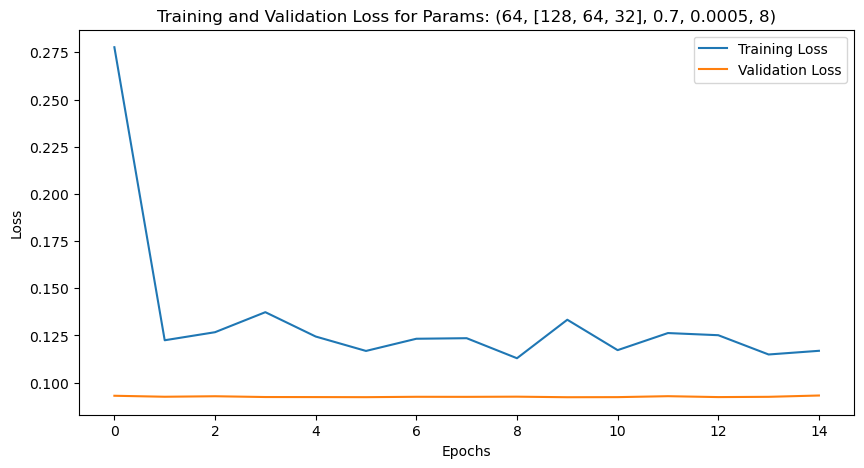

Training with params: (64, [128, 64, 32], 0.7, 0.0005, 12)


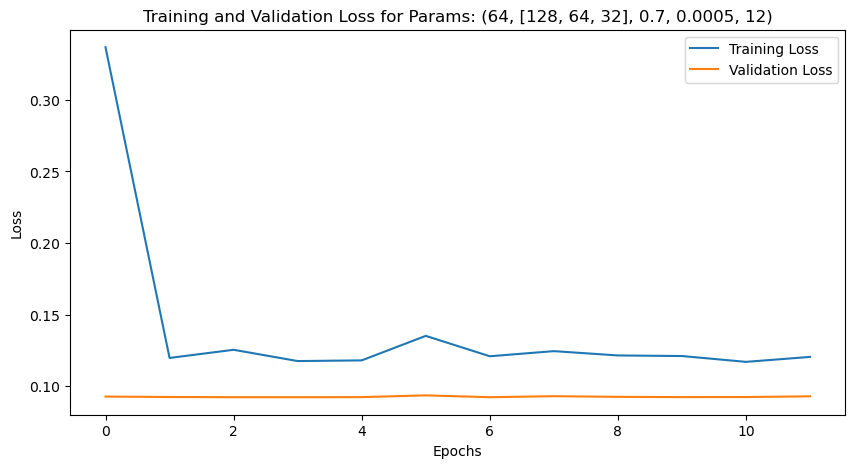

Training with params: (64, [256, 128, 64], 0.3, 5e-05, 4)


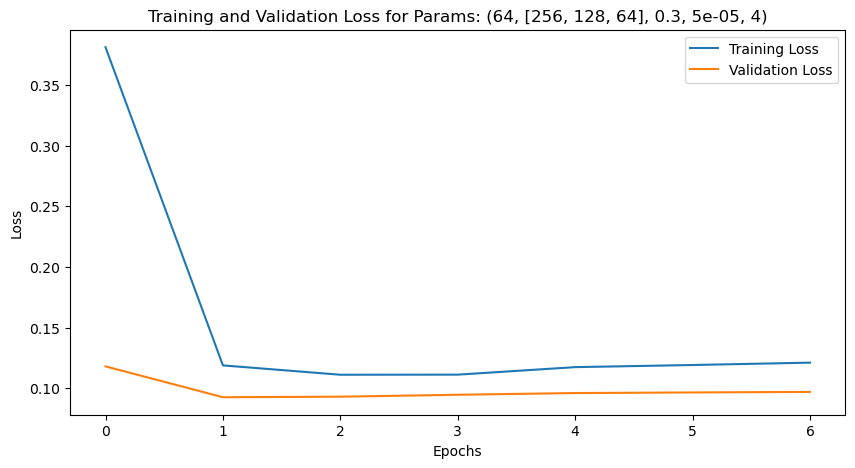

Training with params: (64, [256, 128, 64], 0.3, 5e-05, 8)


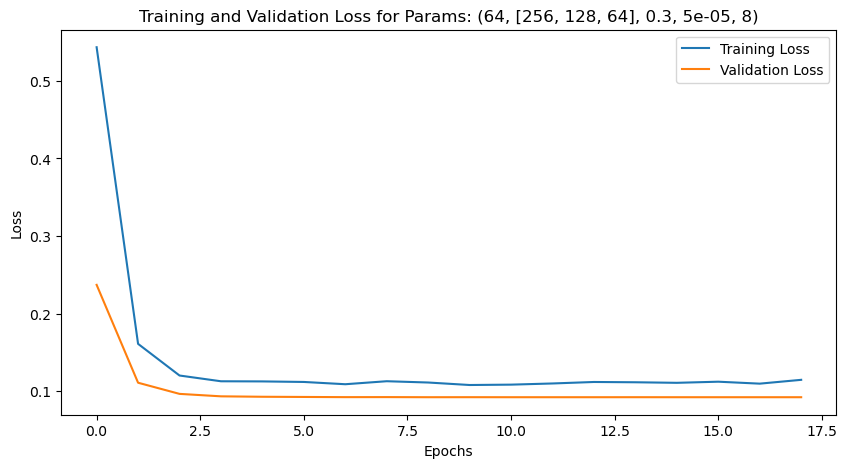

Training with params: (64, [256, 128, 64], 0.3, 5e-05, 12)


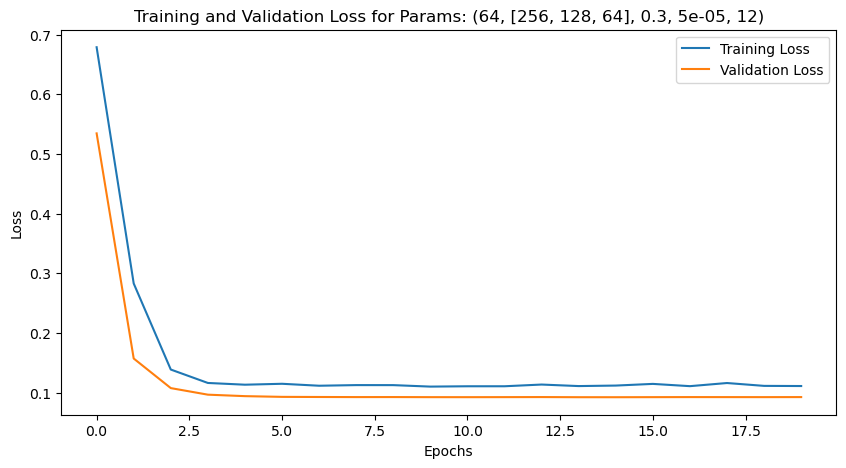

Training with params: (64, [256, 128, 64], 0.3, 0.0001, 4)


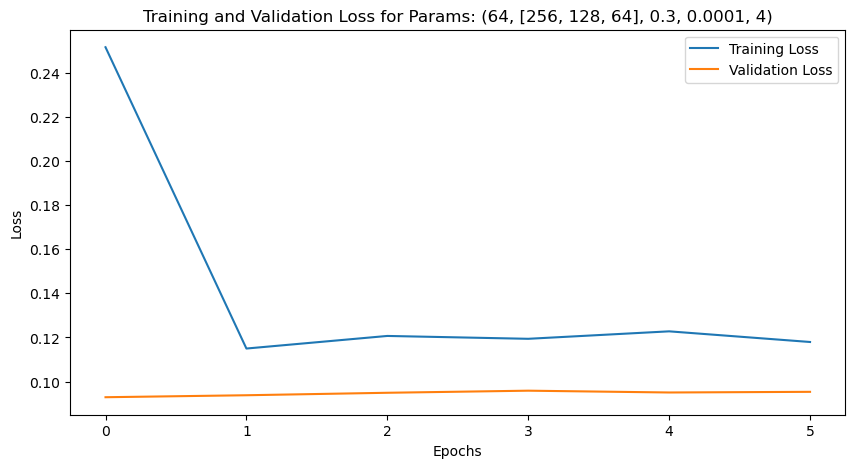

Training with params: (64, [256, 128, 64], 0.3, 0.0001, 8)


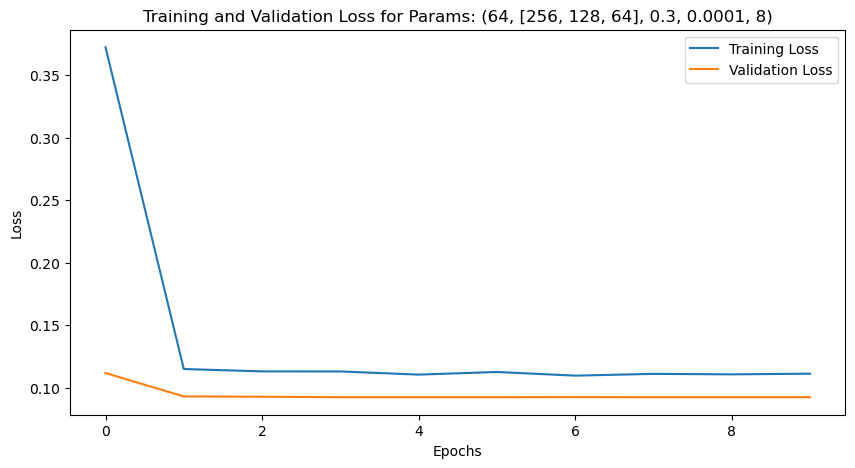

Training with params: (64, [256, 128, 64], 0.3, 0.0001, 12)


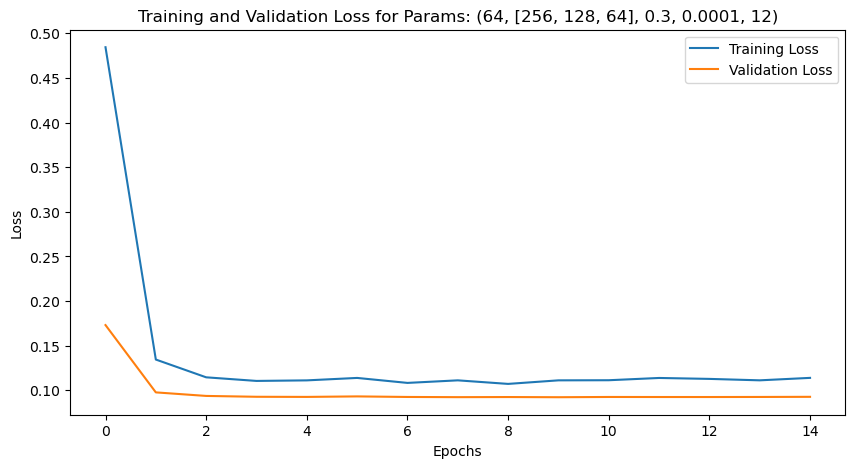

Training with params: (64, [256, 128, 64], 0.3, 0.0005, 4)


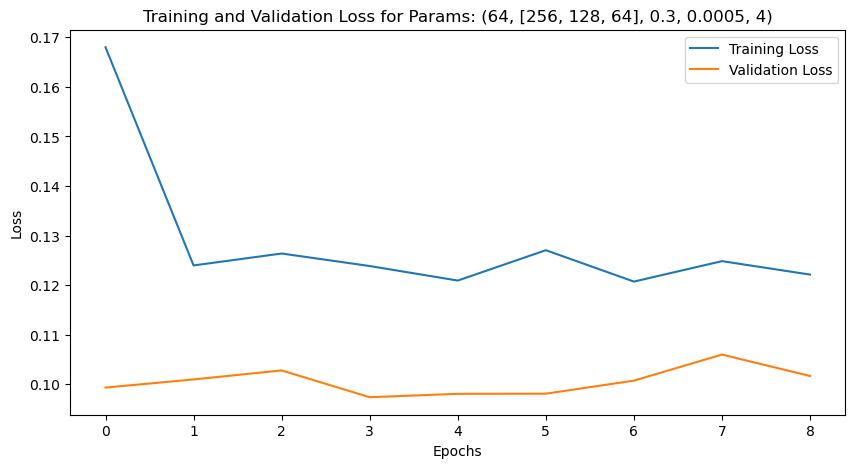

Training with params: (64, [256, 128, 64], 0.3, 0.0005, 8)


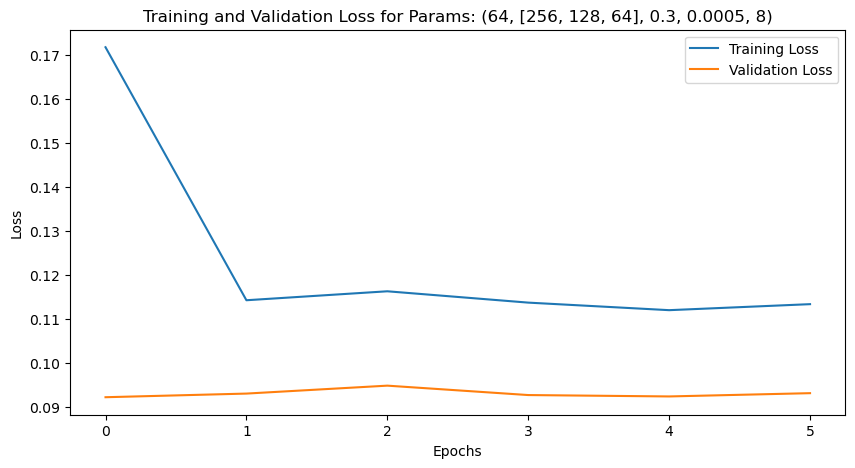

Training with params: (64, [256, 128, 64], 0.3, 0.0005, 12)


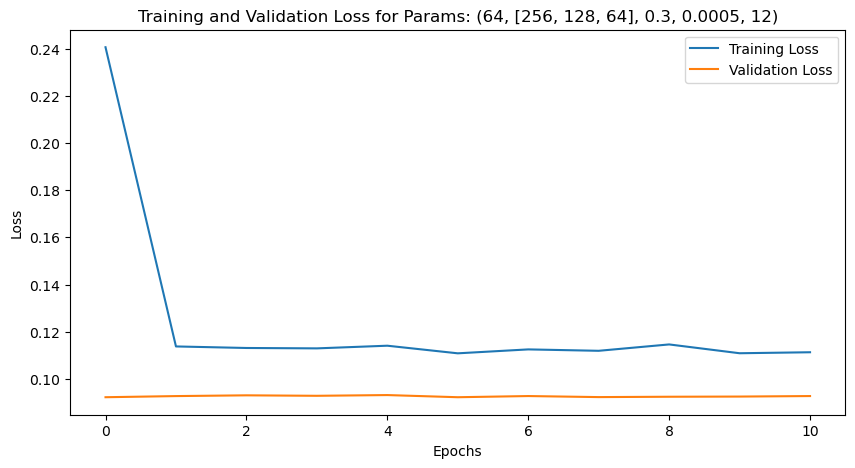

Training with params: (64, [256, 128, 64], 0.5, 5e-05, 4)


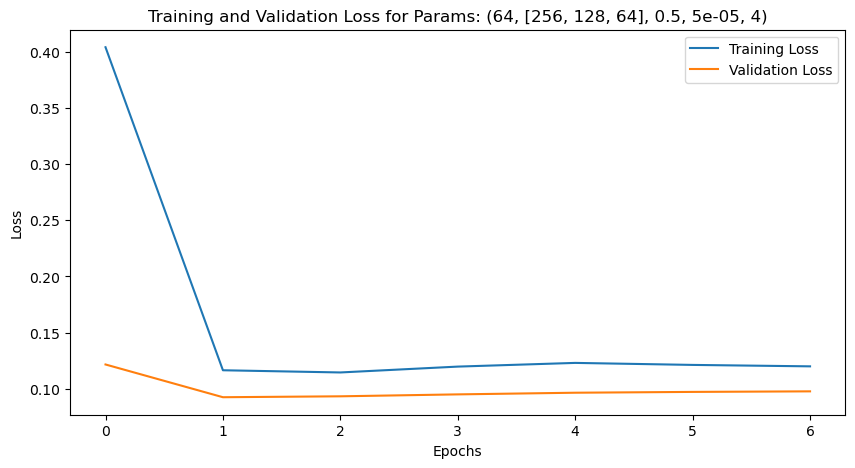

Training with params: (64, [256, 128, 64], 0.5, 5e-05, 8)


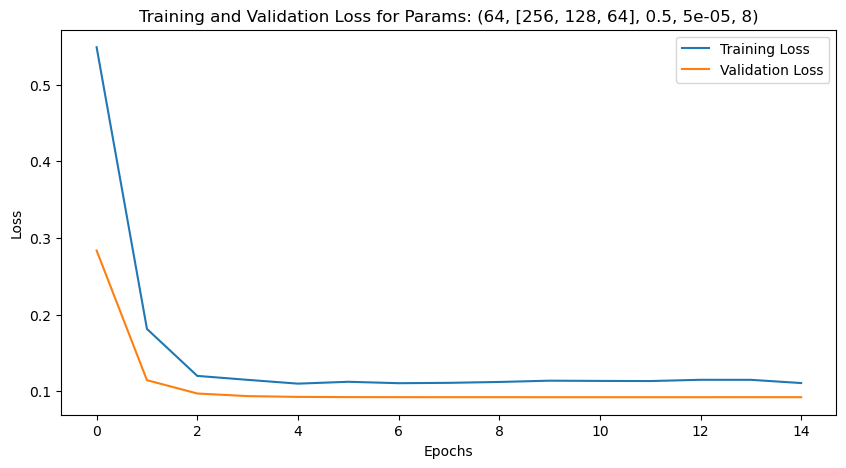

Training with params: (64, [256, 128, 64], 0.5, 5e-05, 12)


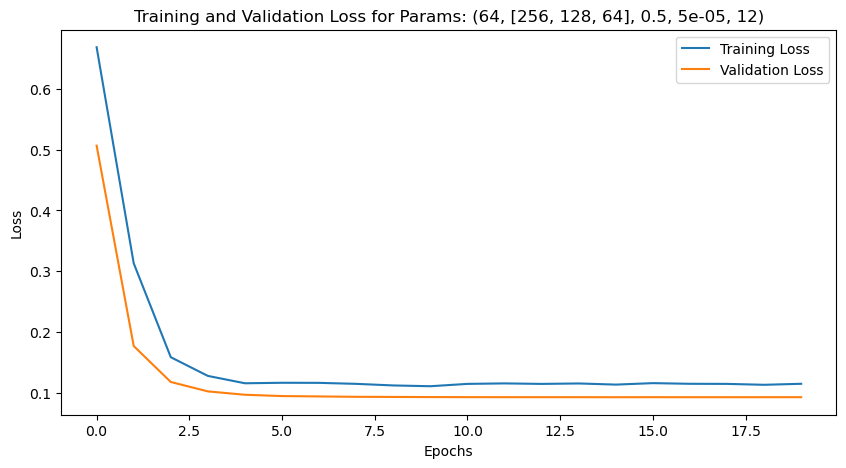

Training with params: (64, [256, 128, 64], 0.5, 0.0001, 4)


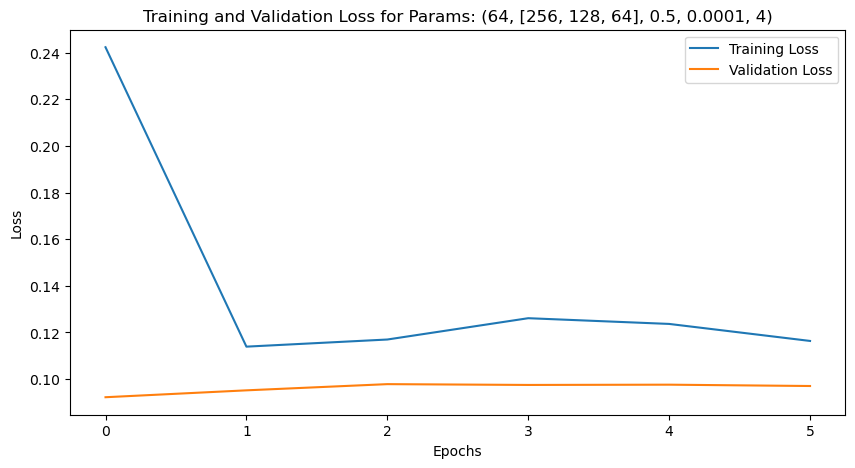

Training with params: (64, [256, 128, 64], 0.5, 0.0001, 8)


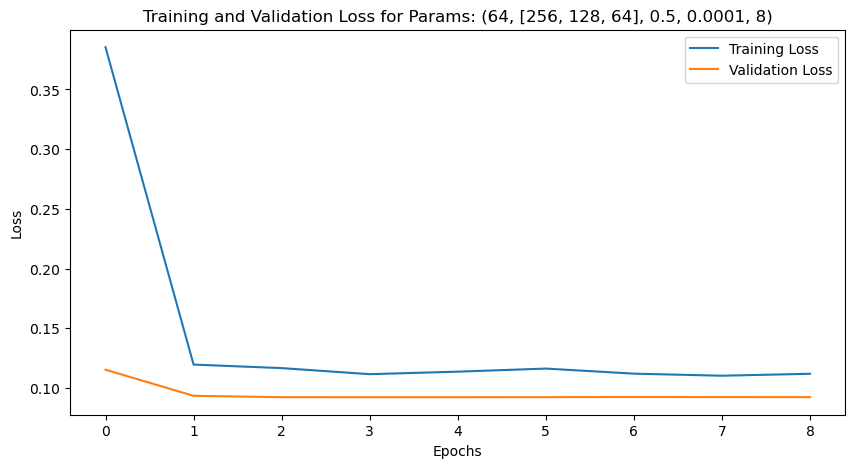

Training with params: (64, [256, 128, 64], 0.5, 0.0001, 12)


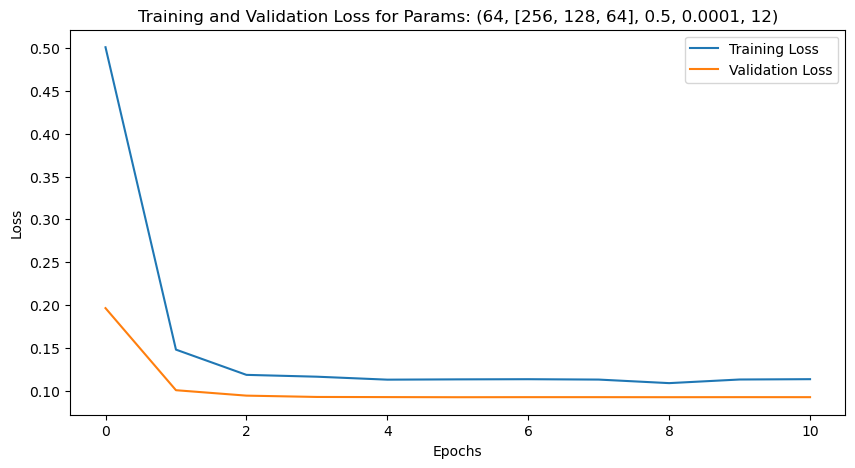

Training with params: (64, [256, 128, 64], 0.5, 0.0005, 4)


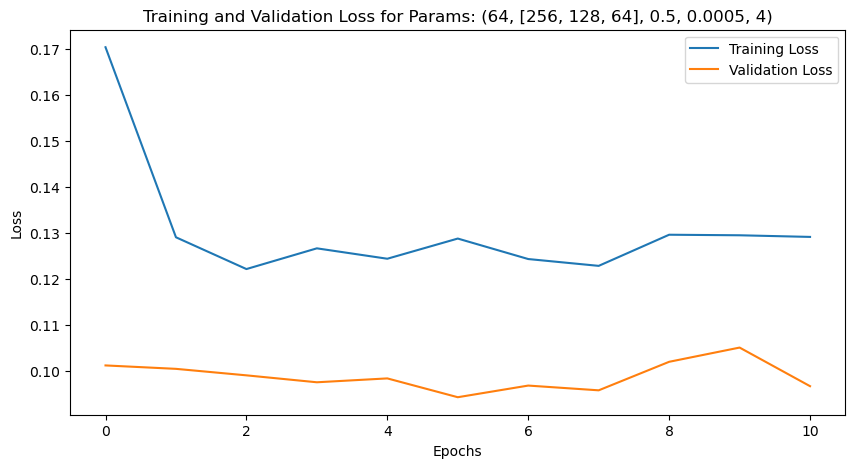

Training with params: (64, [256, 128, 64], 0.5, 0.0005, 8)


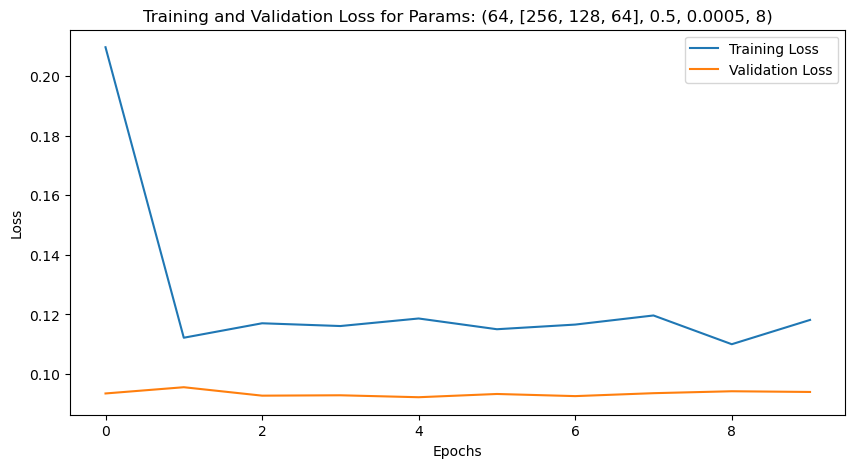

Training with params: (64, [256, 128, 64], 0.5, 0.0005, 12)


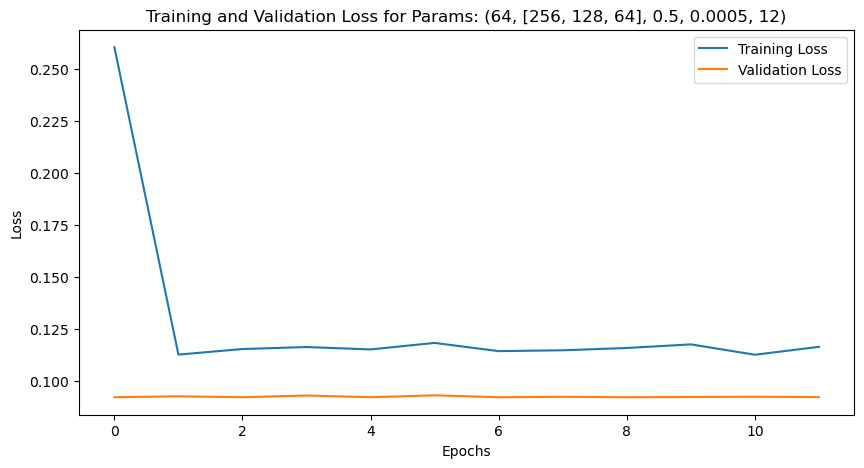

Training with params: (64, [256, 128, 64], 0.7, 5e-05, 4)


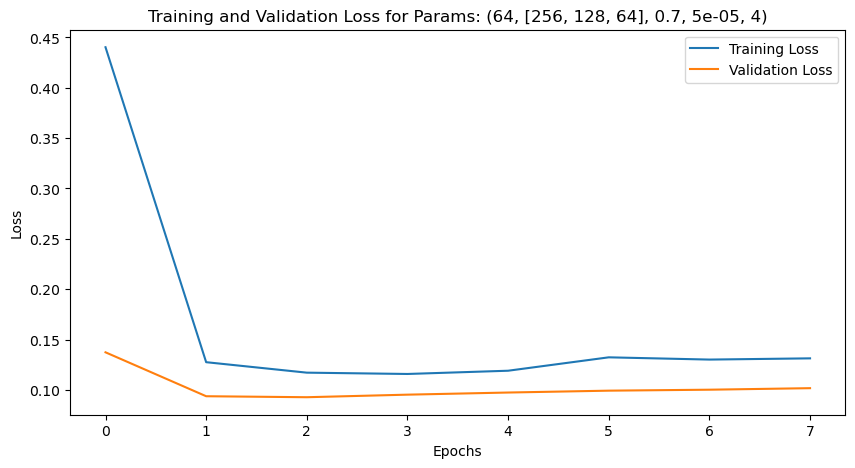

Training with params: (64, [256, 128, 64], 0.7, 5e-05, 8)


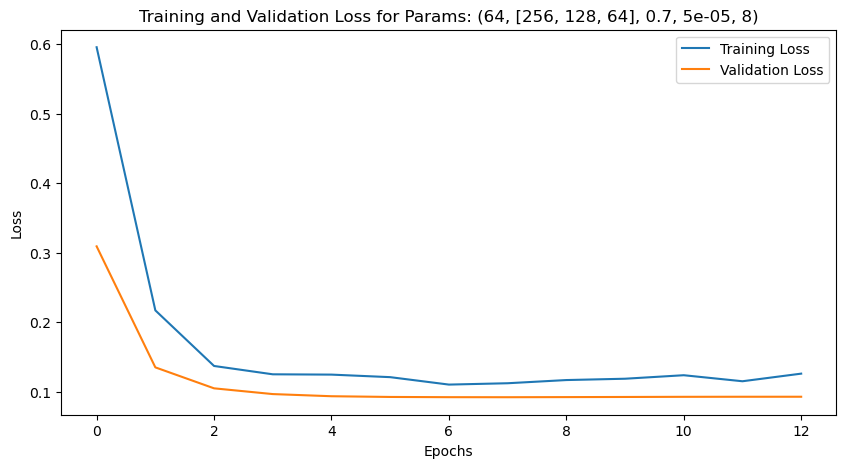

Training with params: (64, [256, 128, 64], 0.7, 5e-05, 12)


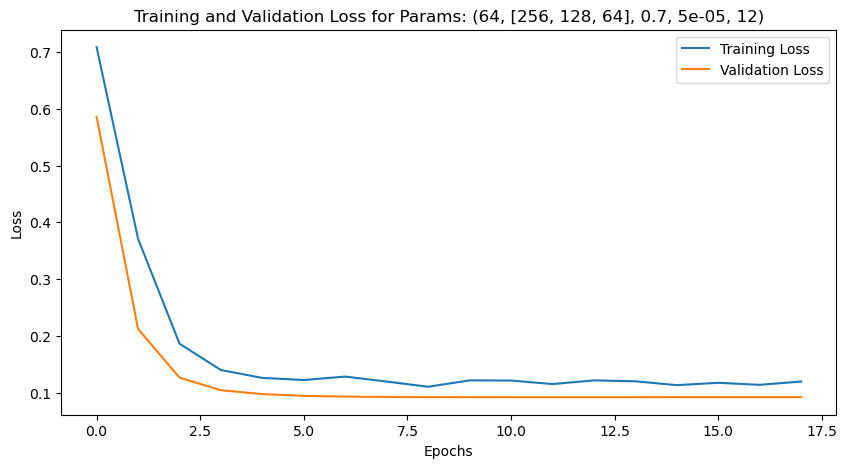

Training with params: (64, [256, 128, 64], 0.7, 0.0001, 4)


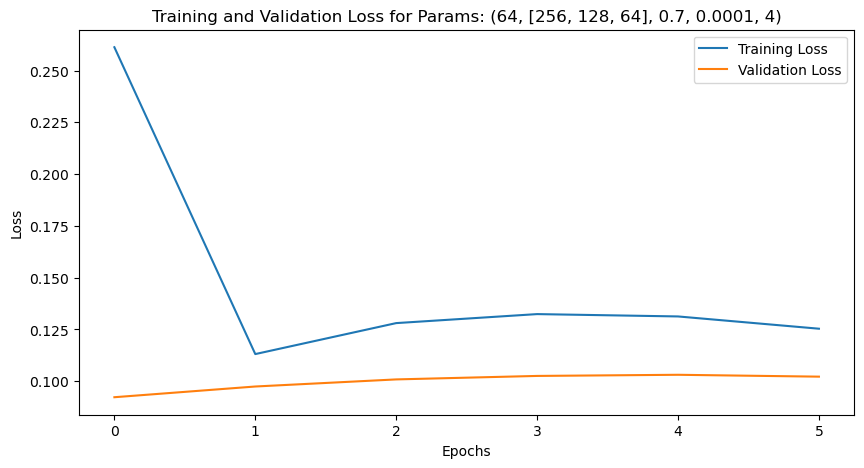

Training with params: (64, [256, 128, 64], 0.7, 0.0001, 8)


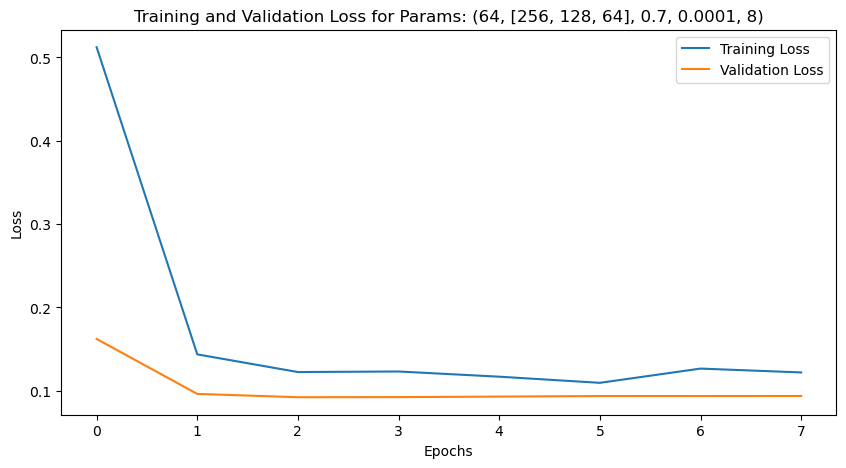

Training with params: (64, [256, 128, 64], 0.7, 0.0001, 12)


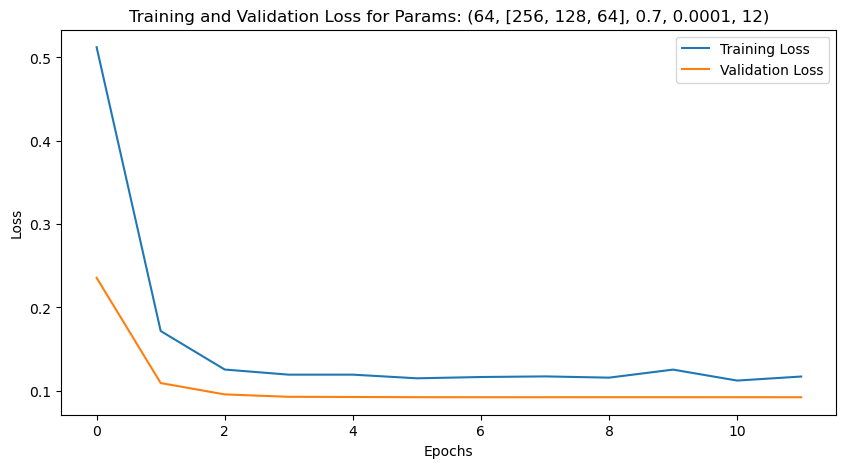

Training with params: (64, [256, 128, 64], 0.7, 0.0005, 4)


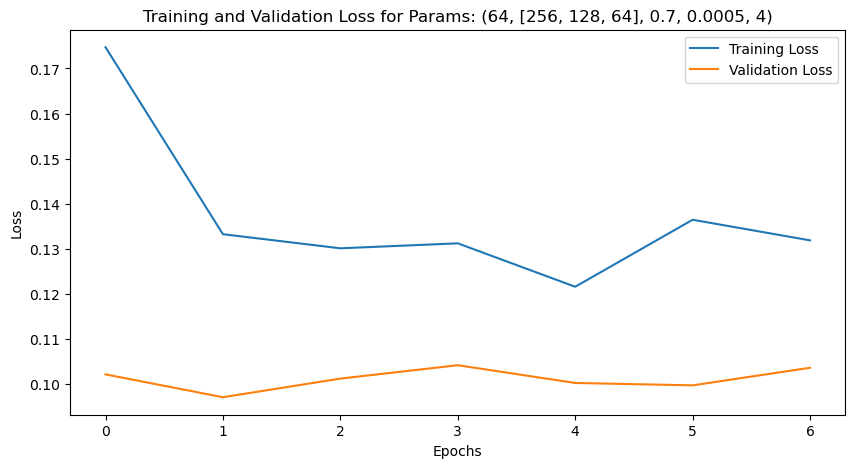

Training with params: (64, [256, 128, 64], 0.7, 0.0005, 8)


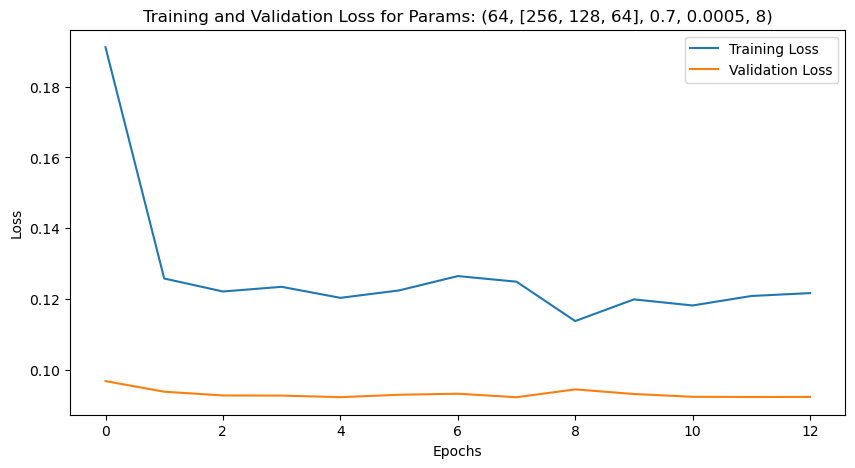

Training with params: (64, [256, 128, 64], 0.7, 0.0005, 12)


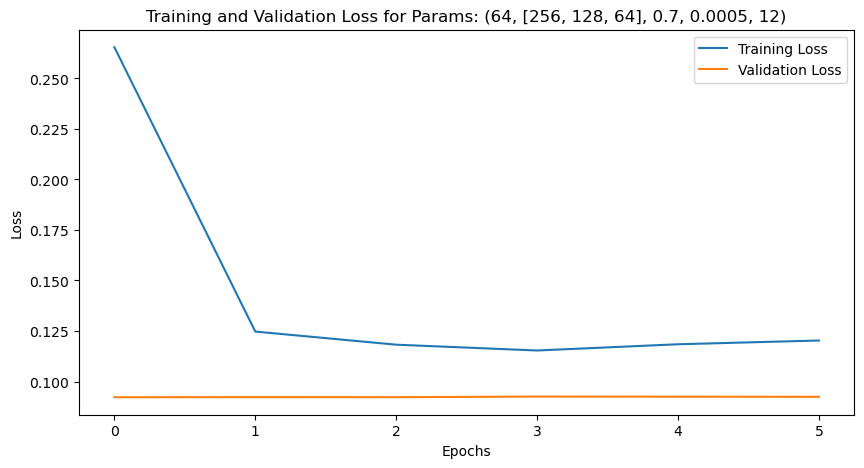

Training with params: (64, [256, 128, 32], 0.3, 5e-05, 4)


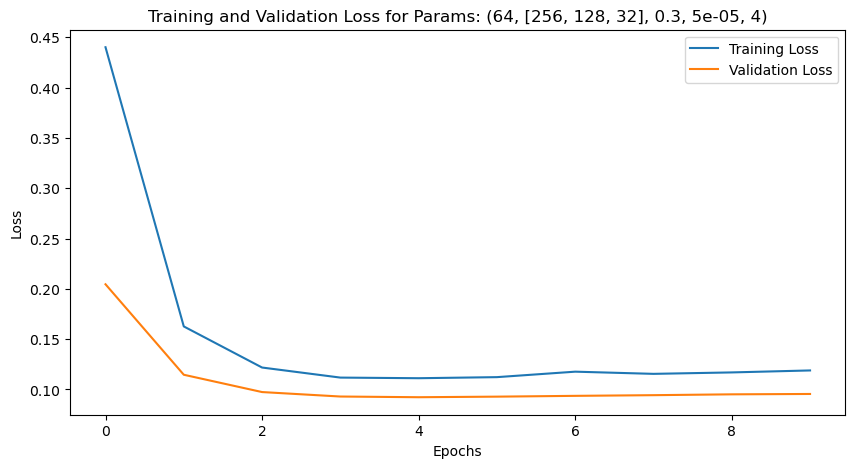

Training with params: (64, [256, 128, 32], 0.3, 5e-05, 8)


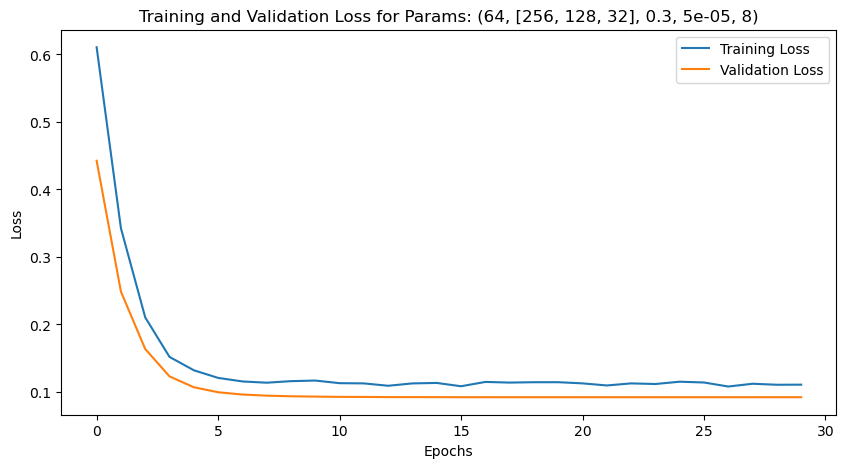

Training with params: (64, [256, 128, 32], 0.3, 5e-05, 12)


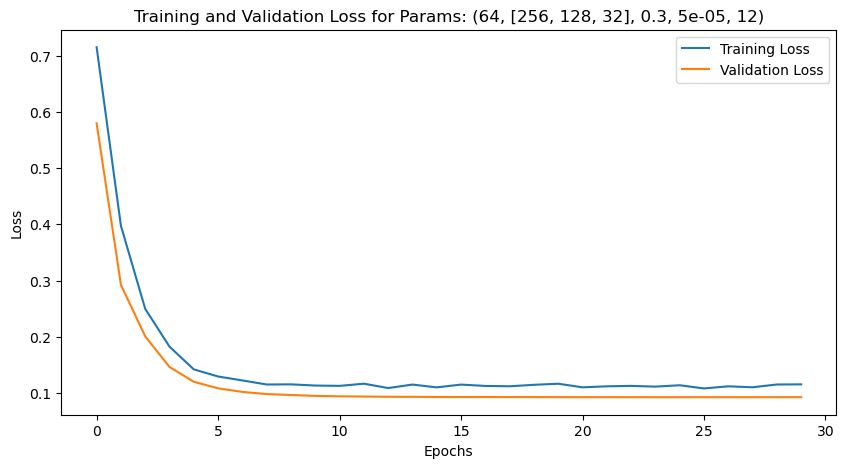

Training with params: (64, [256, 128, 32], 0.3, 0.0001, 4)


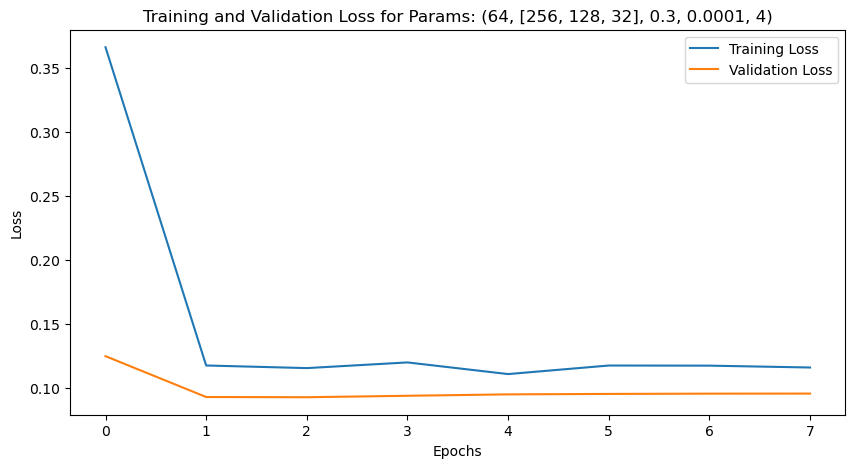

Training with params: (64, [256, 128, 32], 0.3, 0.0001, 8)


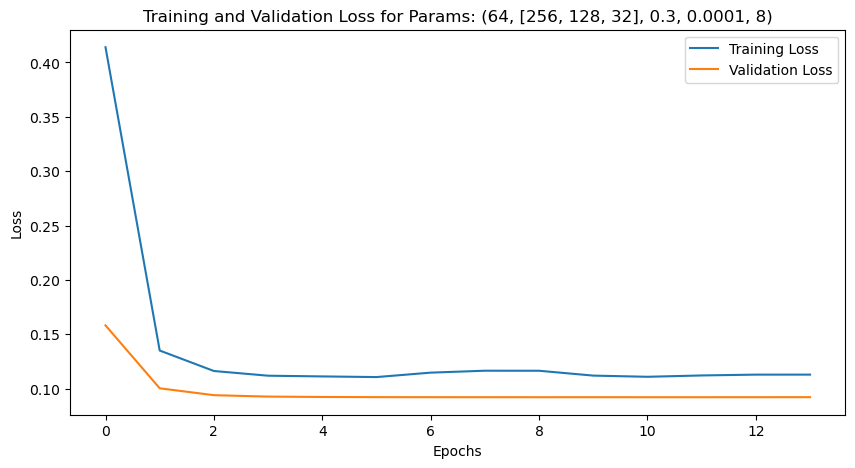

Training with params: (64, [256, 128, 32], 0.3, 0.0001, 12)


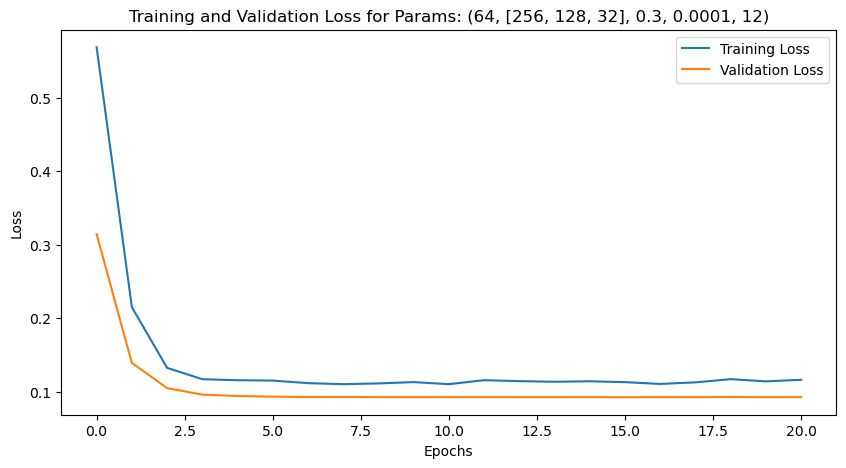

Training with params: (64, [256, 128, 32], 0.3, 0.0005, 4)


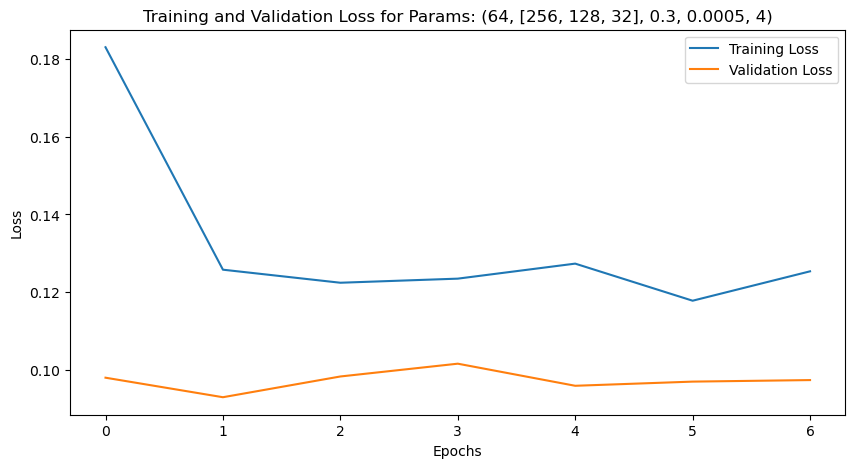

Training with params: (64, [256, 128, 32], 0.3, 0.0005, 8)


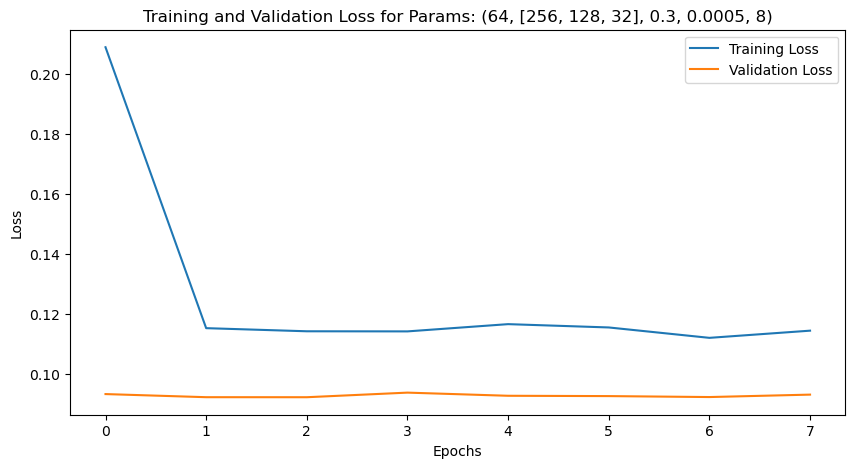

Training with params: (64, [256, 128, 32], 0.3, 0.0005, 12)


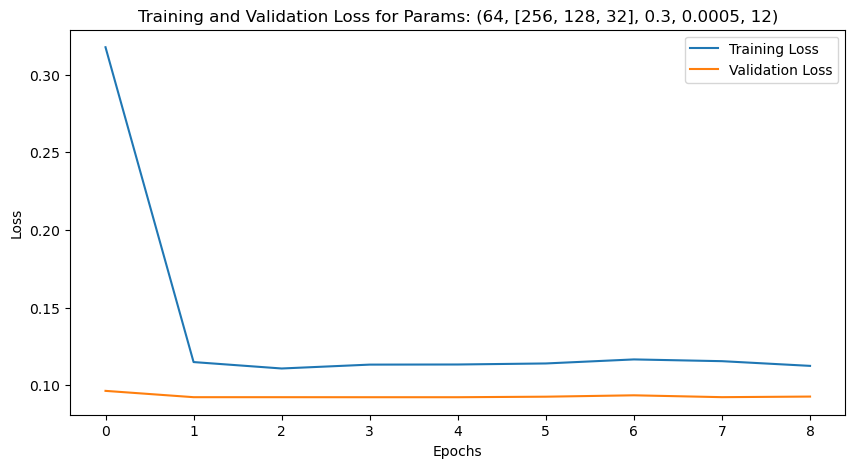

Training with params: (64, [256, 128, 32], 0.5, 5e-05, 4)


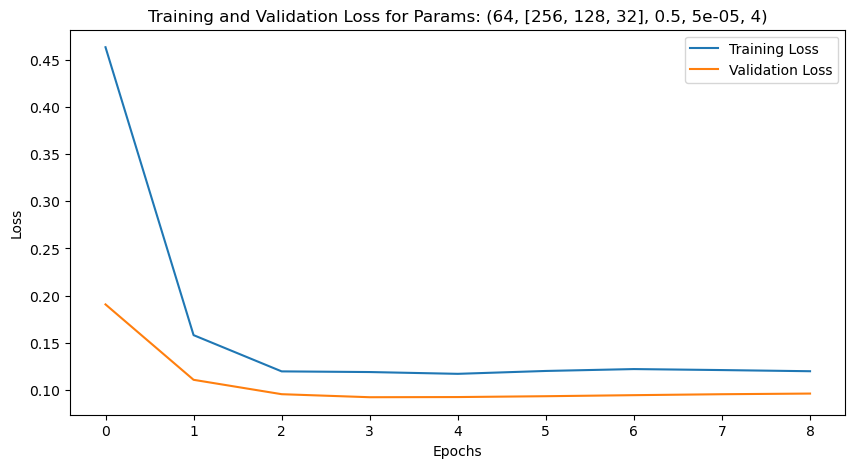

Training with params: (64, [256, 128, 32], 0.5, 5e-05, 8)


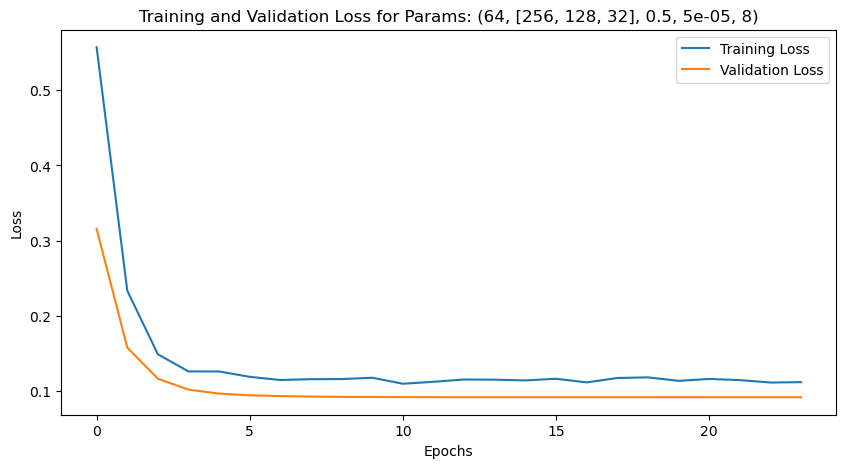

Training with params: (64, [256, 128, 32], 0.5, 5e-05, 12)


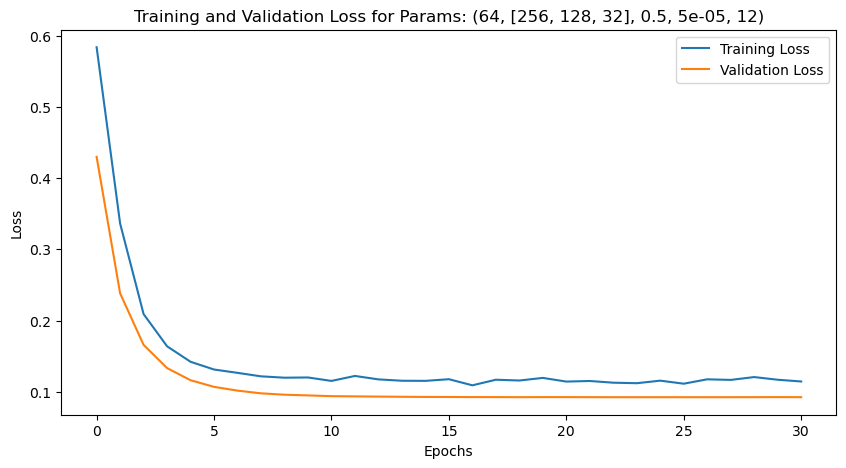

Training with params: (64, [256, 128, 32], 0.5, 0.0001, 4)


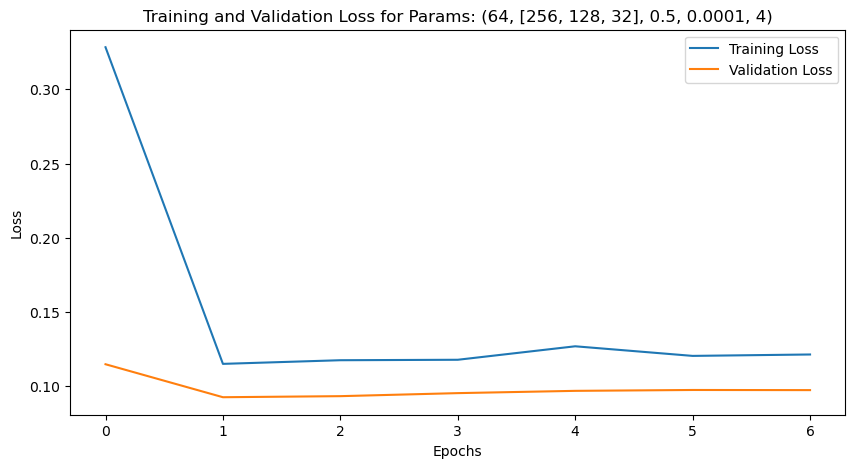

Training with params: (64, [256, 128, 32], 0.5, 0.0001, 8)


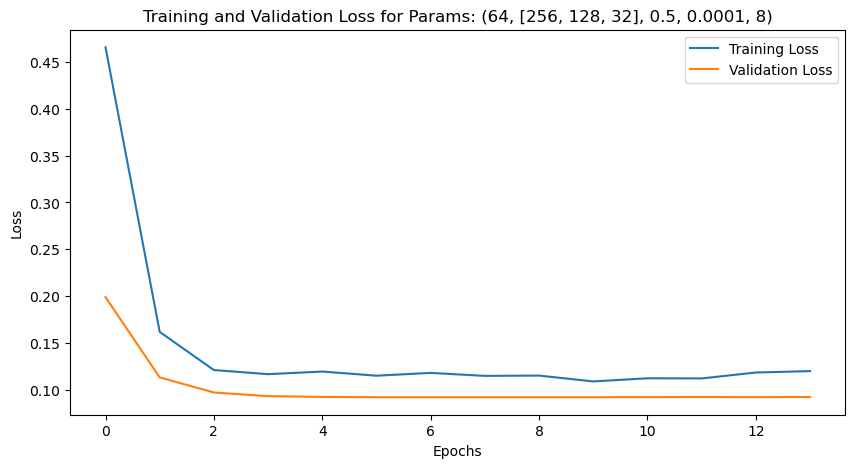

Training with params: (64, [256, 128, 32], 0.5, 0.0001, 12)


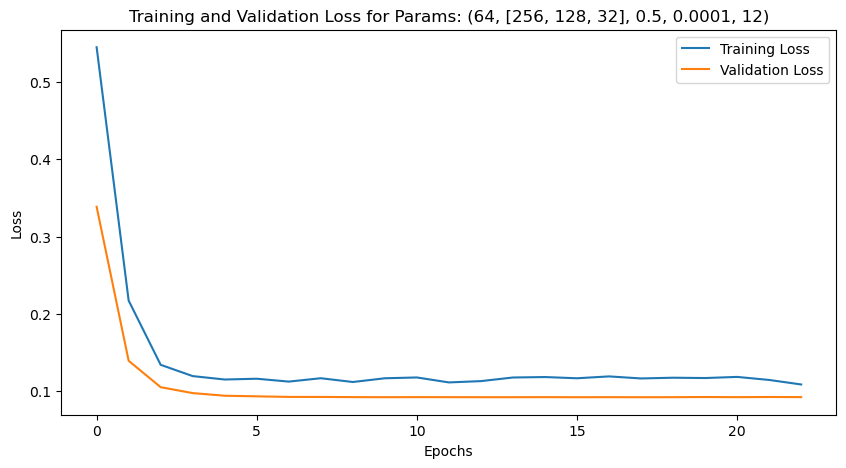

Training with params: (64, [256, 128, 32], 0.5, 0.0005, 4)


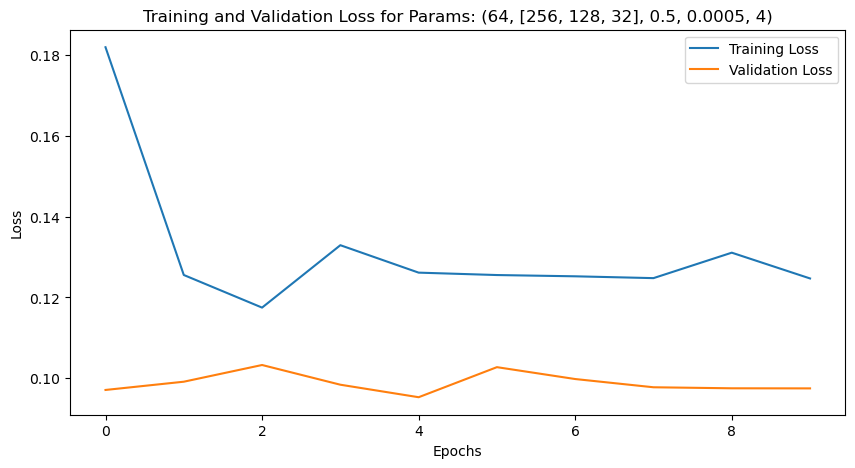

Training with params: (64, [256, 128, 32], 0.5, 0.0005, 8)


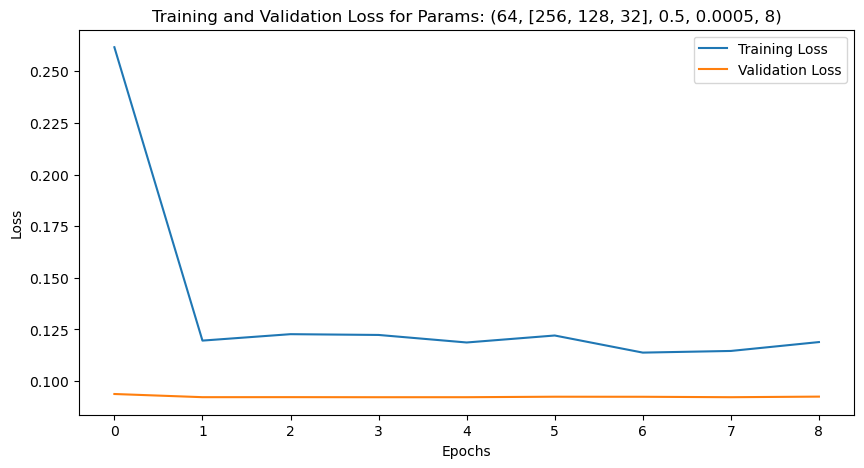

Training with params: (64, [256, 128, 32], 0.5, 0.0005, 12)


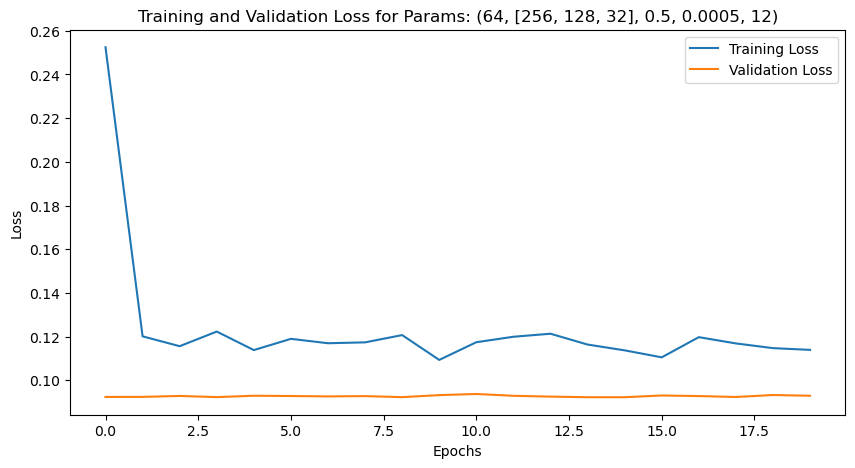

Training with params: (64, [256, 128, 32], 0.7, 5e-05, 4)


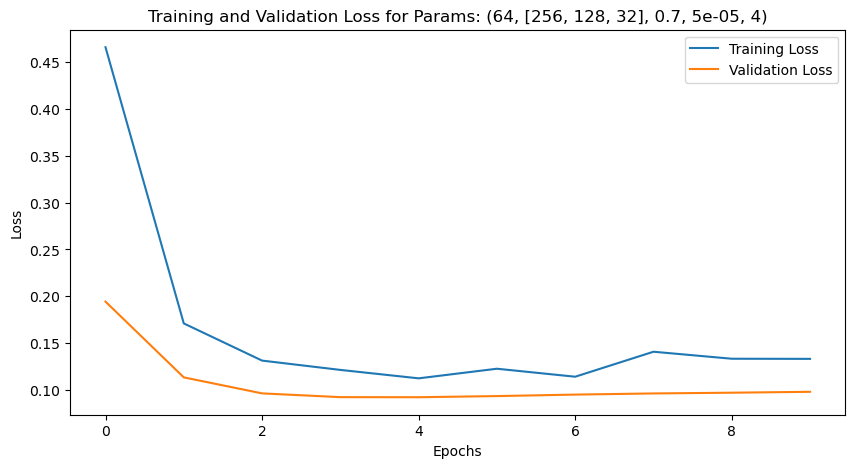

Training with params: (64, [256, 128, 32], 0.7, 5e-05, 8)


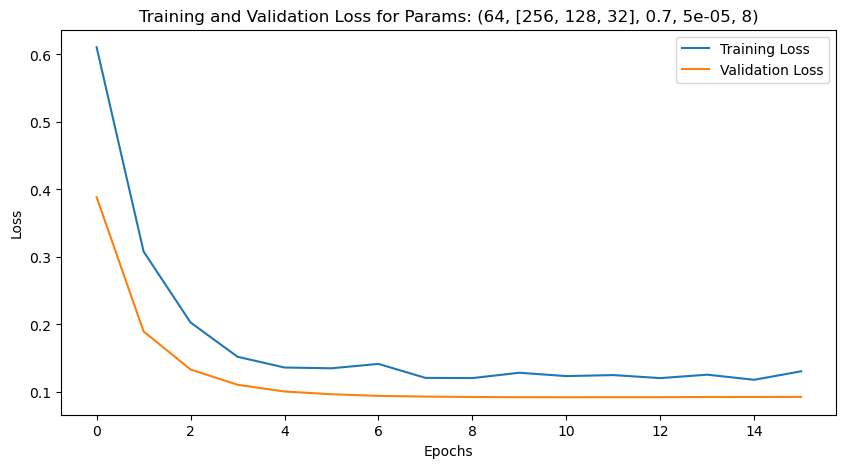

Training with params: (64, [256, 128, 32], 0.7, 5e-05, 12)


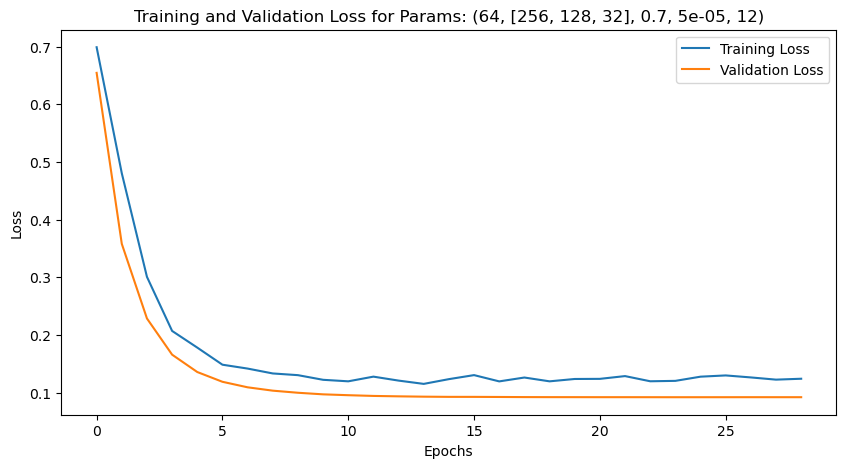

Training with params: (64, [256, 128, 32], 0.7, 0.0001, 4)


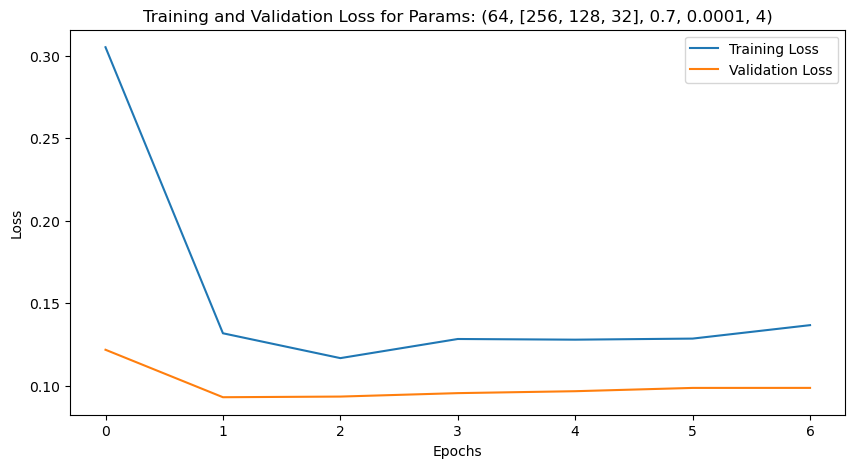

Training with params: (64, [256, 128, 32], 0.7, 0.0001, 8)


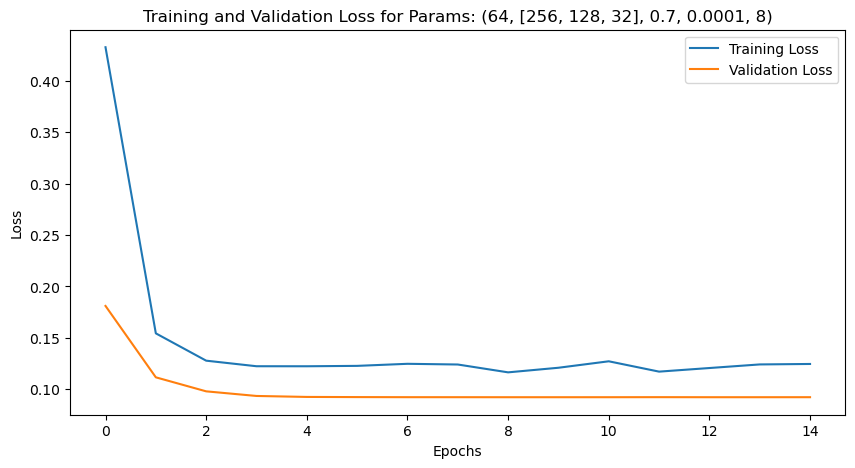

Training with params: (64, [256, 128, 32], 0.7, 0.0001, 12)


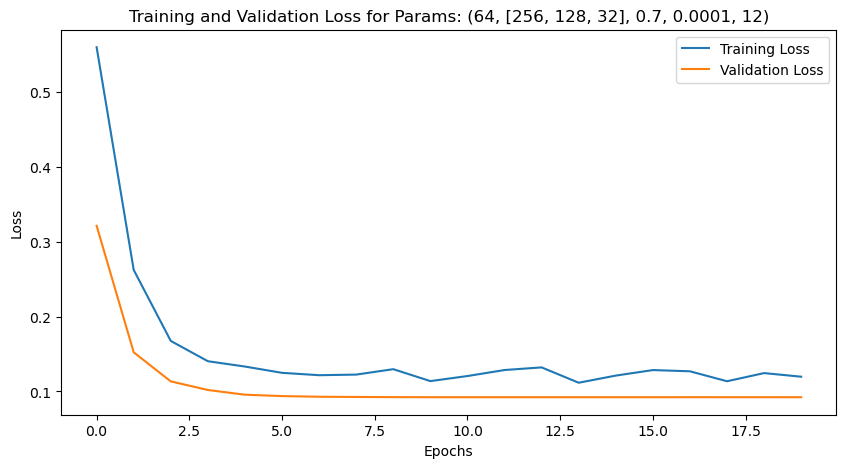

Training with params: (64, [256, 128, 32], 0.7, 0.0005, 4)


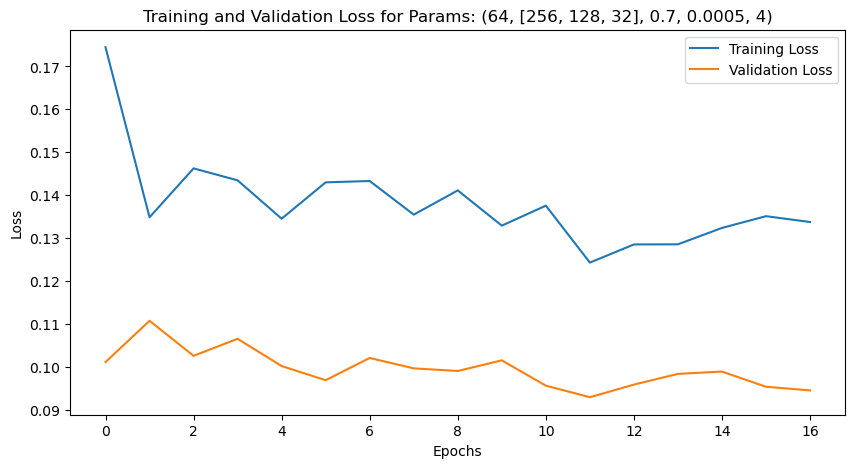

Training with params: (64, [256, 128, 32], 0.7, 0.0005, 8)


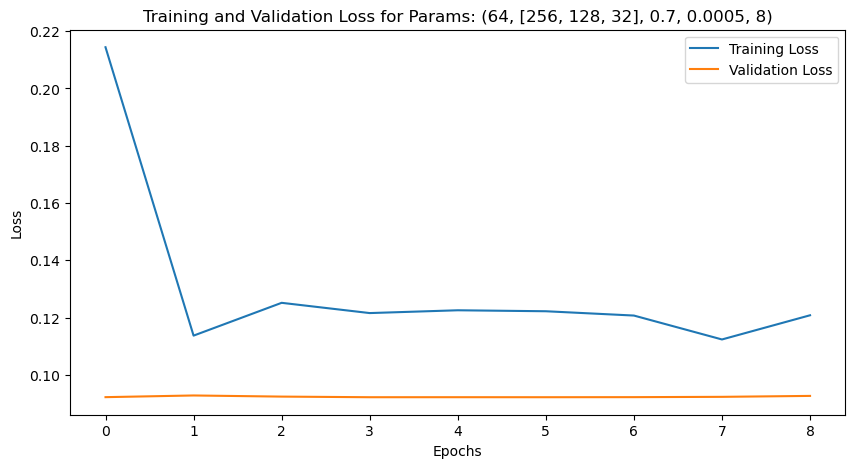

Training with params: (64, [256, 128, 32], 0.7, 0.0005, 12)


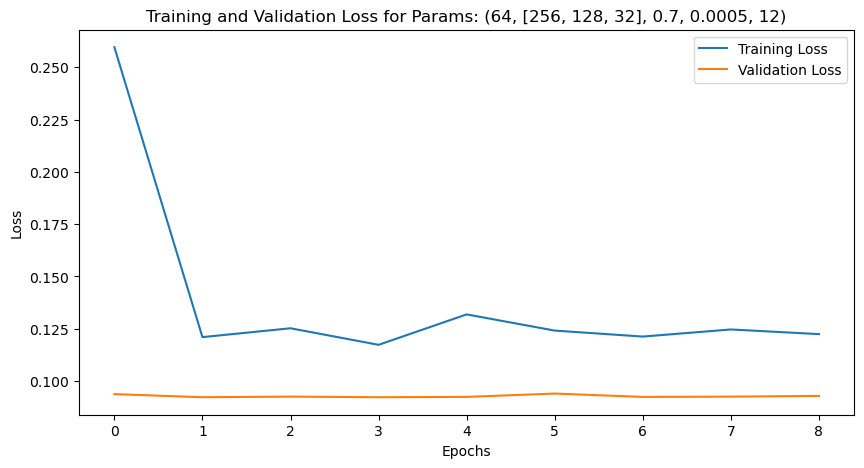

Best hyperparameters: (64, [32, 16], 0.5, 0.0005, 12), Best validation loss: 0.09220869094133377
Total training time: 97.20 mins


In [50]:
import time
start_time = time.time()

# Define the grid of hyperparameters
param_grid = {
    'hidden_size': [32, 64],
    'lstm_size': [[32, 16], [64, 32], [64, 32, 16], [128, 64, 32], [256, 128, 64], [256, 128, 32]],
    'dropout_rate': [0.3, 0.5, 0.7],
    'learning_rate': [0.00005, 0.0001, 0.0005],
    'batch_size': [4, 8, 12]
}

# Generate all possible combinations of hyperparameters
param_combinations = list(itertools.product(*param_grid.values()))

# Create a function to train the model with the given hyperparameters
def train_model_with_params(params, X_train, y_train, X_val_t, y_val_t):
    hidden_size, lstm_size, dropout_rate, learning_rate, batch_size = params
    
    # Create dataset and dataloader
    train_dataset = SMILESMolDataset(X_train, y_train, smivec)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    model = Net(smivec.dims, lstm_size, hidden_size=hidden_size, dropout_rate=dropout_rate, out_size=1).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    best_val_loss = float('inf')
    early_stopping_patience = 5
    epochs_without_improvement = 0
    
    # Lists to store loss values
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        
        for smiles, labels in train_loader:
            smiles = smiles.clone().detach().float().to(device)
            labels = labels.clone().detach().float().to(device)
            
            optimizer.zero_grad()
            output = model(smiles)
            loss = criterion(output, labels)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
            optimizer.step()
            
            running_loss += loss.item()
        
        # Calculate average training loss
        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_t)
            val_loss = criterion(val_outputs, y_val_t).item()
            val_losses.append(val_loss)

        lr_scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1
        
        if epochs_without_improvement >= early_stopping_patience:
            break
    
    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title(f'Training and Validation Loss for Params: {params}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    
    return best_val_loss

# Perform grid search
best_params = None
best_val_loss = float('inf')

for params in param_combinations:
    print(f"Training with params: {params}")
    val_loss = train_model_with_params(params, X_train, y_train, X_val_t, y_val_t)
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_params = params
        print(f"New best params found: {params}, Validation Loss: {val_loss}")

print(f"Best hyperparameters: {best_params}, Best validation loss: {best_val_loss}")

total_time = time.time() - start_time
print(f'Total training time: {total_time/60:.2f} mins')

In [51]:
print(f"Best hyperparameters: {best_params}, Best validation loss: {best_val_loss}")

Best hyperparameters: (64, [32, 16], 0.5, 0.0005, 12), Best validation loss: 0.09220869094133377


In [59]:
epochs = 50  # I can implement early stopping to halt training when the validation loss stops improving.
dims = smivec.dims  # This is necessary to define the input dimensions. Ensure 'smivec.dims' returns the correct shape: '[sequence_length, number_tokens]'.
lstm_size = [32, 16]  # The size of the LSTM hidden state. I may experiment with larger size (e.g., 256 or 512) if necessary.
hidden_size = 64  # This number is a typical one. I'll adjust it based on the model's performance
dropout_rate = 0.5  # A dropout rate of 0.5 is standard for preventing overfitting. I may reduce it to 0.3 if underfitting occurs.
output_size = 1  # This is for binary classification, as the output is a single probability value.
batch_size = 12  # A batch size of 128 is commonly used and generally effective. Depending on GPU memory, I may try different sizes (e.g., 64 or 256).
learning_rate = 0.0005  # If the training is unstable, I'll lower it to 0.001.

In [60]:
model = Net(dims, lstm_size, hidden_size, dropout_rate, output_size).to(device)

In [61]:
model

Net(
  (lstms): ModuleList(
    (0): LSTM(45, 32, batch_first=True)
    (1): LSTM(32, 16, batch_first=True)
  )
  (dropouts): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16, out_features=64, bias=True)
  (activation): ReLU()
  (fc_out): Linear(in_features=64, out_features=1, bias=True)
)

In [66]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# Define learning rate scheduler without 'verbose' parameter
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=15)

In [67]:
# A Pytorch 'DataLoader' is created for the training set to facilitate batch processing.

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

In [68]:
train_losses = []
validation_losses = []

# Define early stopping parameters
early_stopping_patience = 15
best_val_loss = float('inf')
epochs_without_improvement = 0

In [69]:
import time
start_time = time.time()

for epoch in range(epochs):
    running_loss = 0.0
    model.train()
    
    for smiles, labels in train_loader:
        smiles = smiles.clone().detach().float().to(device)
        labels = labels.clone().detach().float().to(device)
        
        optimizer.zero_grad()
        output = model(smiles)
        loss = criterion(output, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
        optimizer.step()
        
        running_loss += loss.item()
    
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_t)
        val_loss = criterion(val_outputs, y_val_t).item()
    
    train_loss = running_loss / len(train_loader)
    train_losses.append(train_loss)
    validation_losses.append(val_loss)

    lr_scheduler.step(val_loss)
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_without_improvement = 0
        torch.save(model.state_dict(), 'best_model.pth')
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= early_stopping_patience:
        print(f'Early stopping at epoch {epoch + 1}')
        break

    if (epoch + 1) % 2 == 0:
        print(f'Epoch {epoch+1}, Training loss: {train_loss:.2f}, Validation loss: {val_loss:.2f}')
    
    torch.cuda.empty_cache()

total_time = time.time() - start_time
print(f'Total training time: {total_time/60:.2f} mins')

Epoch 2, Training loss: 0.12, Validation loss: 0.09
Epoch 4, Training loss: 0.12, Validation loss: 0.09
Epoch 6, Training loss: 0.12, Validation loss: 0.09
Epoch 8, Training loss: 0.12, Validation loss: 0.09
Epoch 10, Training loss: 0.12, Validation loss: 0.10
Epoch 12, Training loss: 0.12, Validation loss: 0.10
Epoch 14, Training loss: 0.12, Validation loss: 0.10
Early stopping at epoch 16
Total training time: 0.13 mins


In [71]:
# Prepare the test data in the same way as the validation data
X_test_t = smivec.transform(X_test)
X_test_t = torch.tensor(X_test_t, device=device).float()
y_test_t = torch.tensor(y_test, device=device).float()

# Set the model to evaluation mode
model.eval()

# Perform inference on the test set
with torch.no_grad():
    test_preds = model(X_test_t)
    test_preds = torch.sigmoid(test_preds)  # Convert logits to probabilities
    test_preds = test_preds.cpu().numpy()  # Move to CPU and convert to numpy
    test_preds_binary = (test_preds > 0.5).astype(int)  # Convert probabilities to binary

# Move labels to CPU for comparison
y_test_binary = y_test_t.cpu().numpy()

# Generate confusion matrix and classification report with zero_division handling
conf_matrix = confusion_matrix(y_test_binary, test_preds_binary)
class_report = classification_report(y_test_binary, test_preds_binary, zero_division=1)  # Set zero_division=1 to handle undefined precision

# Print classification report
print("Classification Report:")
print(class_report)
print(conf_matrix)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99       563
         1.0       1.00      0.00      0.00        16

    accuracy                           0.97       579
   macro avg       0.99      0.50      0.49       579
weighted avg       0.97      0.97      0.96       579

[[563   0]
 [ 16   0]]
